# **Group 9 X Ampere**

---

**Data Science Mission**

# **Road Quality Prediction Using Vehicle Sensor Data**

This notebook contains an end-to-end analysis and modeling pipeline for predicting road quality from vehicle sensor data.

---

## **Table of Contents**

1. [Introduction](#Introduction)
2. [Data Loading and Preprocessing](#Data-Loading-and-Preprocessing)
3. [Exploratory Data Analysis](#Exploratory-Data-Analysis)
4. [Feature Engineering](#Feature-Engineering)
5. [Model Development](#Model-Development)
6. [Model Evaluation](#Model-Evaluation)
7. [Results and Discussion](#Results-and-Discussion)
8. [Conclusion and Future Work](#Conclusion-and-Future-Work)


## Introduction
This project focuses on analyzing vehicle sensor data to predict road quality and detect anomalies in road conditions. We aim to develop a robust machine learning pipeline that can classify road segments as either "OK", "KO" (knock-out/bad condition), or "bump" based on vehicle sensor readings.

## Dataset Overview:
 - **Source**: Vehicle sensor data from multiple cars
 - **Key Features**: Z-acceleration (vertical movement), vehicle speed, geolocation coordinates
 - **Target Variable**: Road condition class ("OK", "KO", "bump")




### First Dataset Exploration - (dataset_rqp.csv)

In [1]:
from google.colab import drive
import pandas as pd

#drive.mount('/content/drive')

file_path = '/kaggle/input/datanew/dataset_rqp.csv'

df = pd.read_csv(file_path)
df.head()

import matplotlib.pyplot as plt
import seaborn as sns

# Ensure Matplotlib stores images in the notebook
%matplotlib inline
sns.set()  # Ensures a consistent style for all plots

Class Distribution

In [2]:
class_distribution = df['class'].value_counts()
print(class_distribution)

class
OK      16256
KO       8964
bump      833
Name: count, dtype: int64


Feature Distribution, Time Series & Overall Correlation

class
OK      16256
KO       8964
bump      833
Name: count, dtype: int64


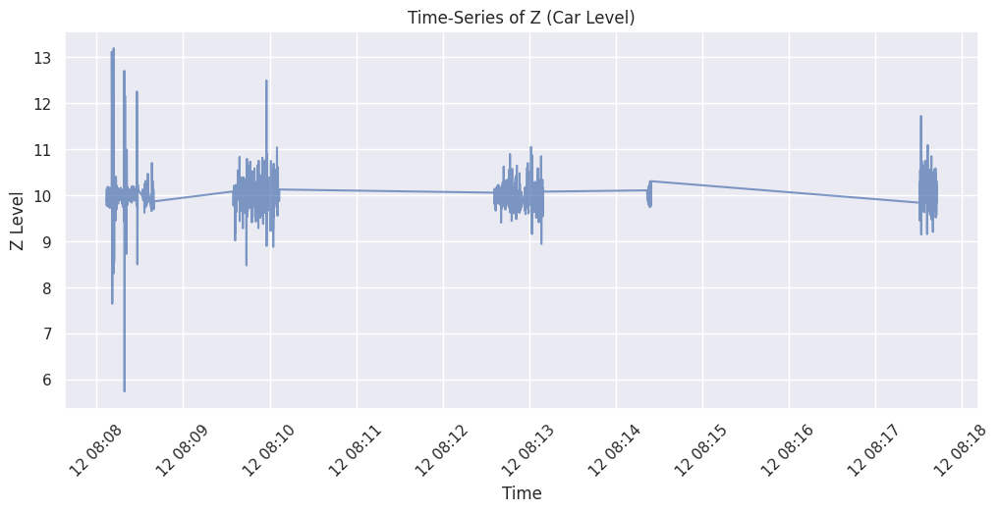

0       2023-06-12 08:08:06.812
1       2023-06-12 08:08:06.916
2       2023-06-12 08:08:07.019
3       2023-06-12 08:08:07.131
4       2023-06-12 08:08:07.235
                  ...          
26048   2023-10-10 07:55:58.780
26049   2023-10-10 07:55:58.892
26050   2023-10-10 07:55:59.002
26051   2023-10-10 07:55:59.114
26052   2023-10-10 07:55:59.232
Name: date, Length: 26053, dtype: datetime64[ns]

Statistical Summary of Numerical Features:
         Unnamed: 0                           date     SpeedBody  \
count  26053.000000                          26053  26053.000000   
mean   13026.000000  2023-08-12 21:32:56.716091136     44.269819   
min        0.000000     2023-06-12 08:08:06.812000      0.470000   
25%     6513.000000  2023-06-14 06:16:36.937999872     23.510001   
50%    13026.000000  2023-09-18 08:11:34.923000064     39.169998   
75%    19539.000000  2023-09-20 07:08:27.662000128     55.780002   
max    26052.000000     2023-10-10 07:55:59.232000    118.130004   
std     752

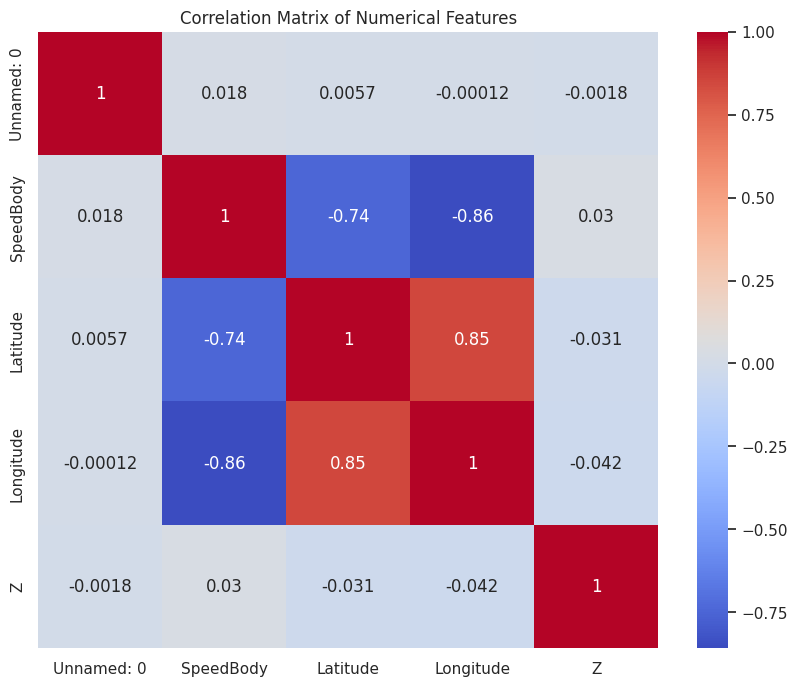

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


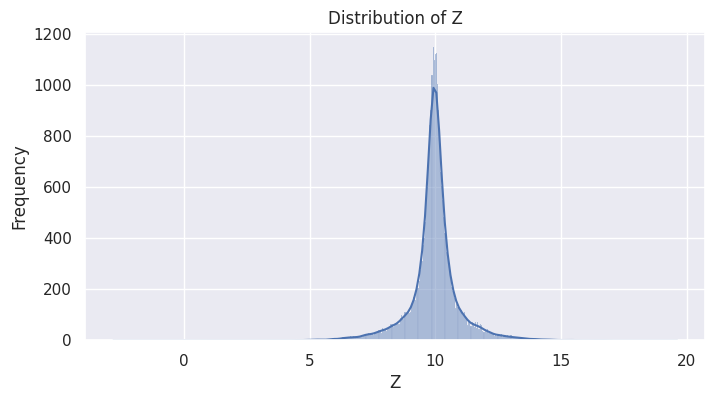

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


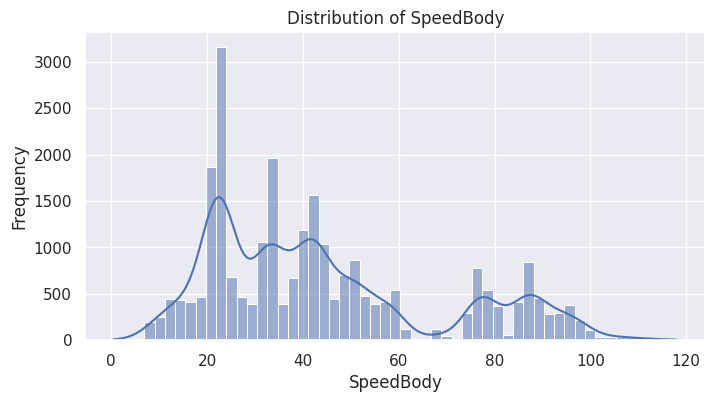

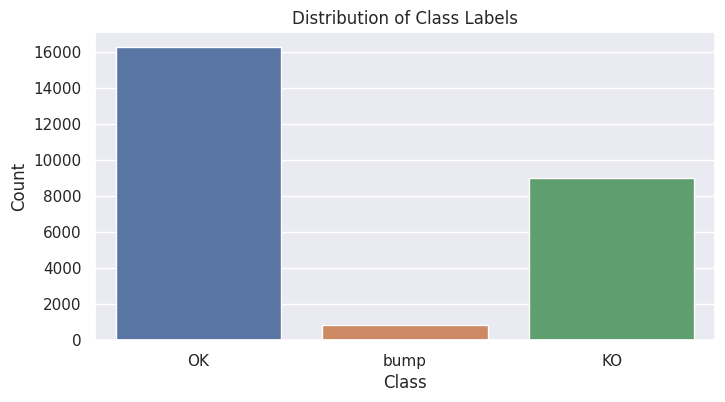

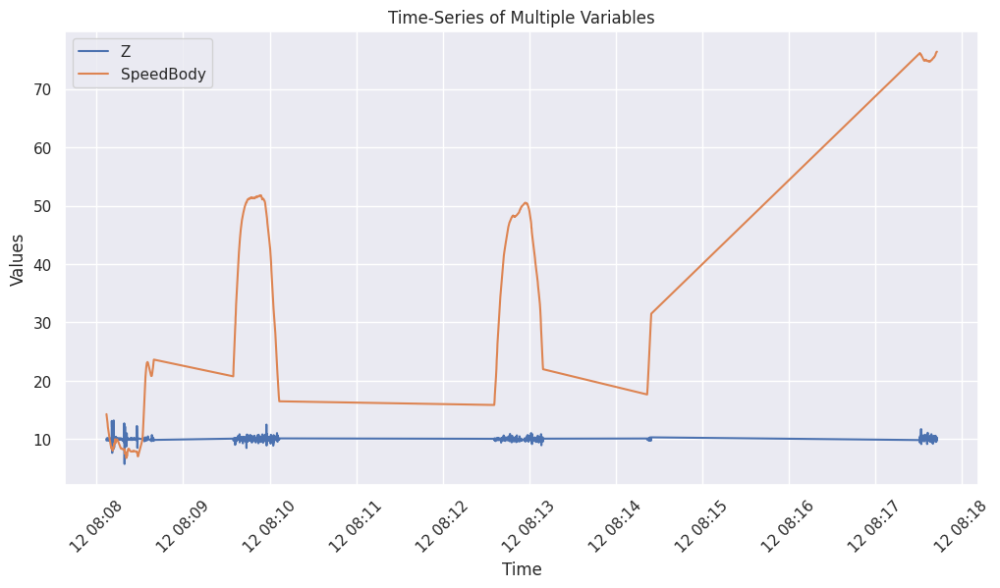

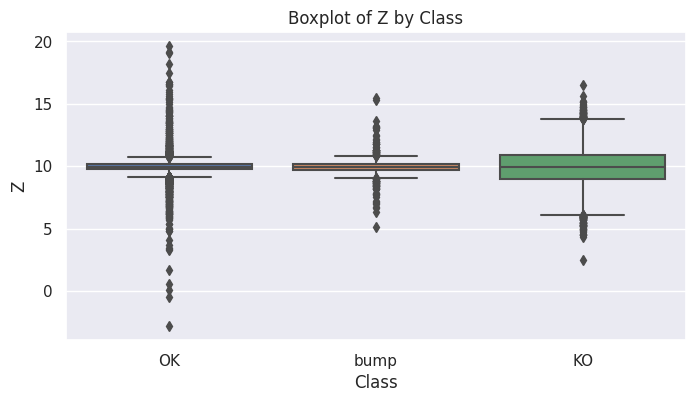

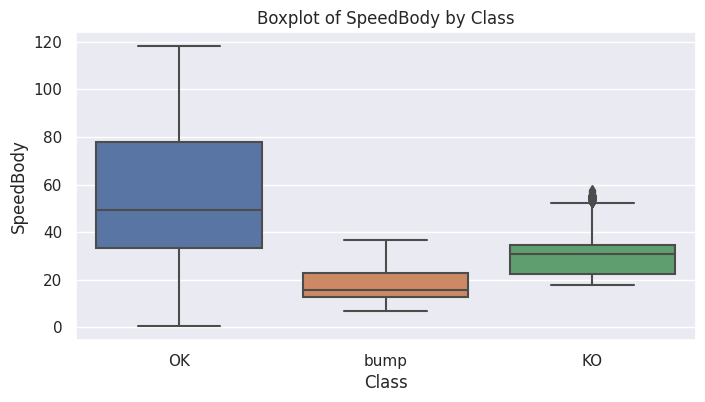

In [3]:

from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


class_distribution = df['class'].value_counts()
print(class_distribution)

# Convert date column to datetime format
df['date'] = pd.to_datetime(df["date"], format='ISO8601').dt.tz_localize(None)

# Sort by time
df = df.sort_values(by='date')

# Plot time-series of Z for a subset of data
plt.figure(figsize=(12, 5))
plt.plot(df['date'][:1000], df['Z'][:1000], label='Z (Car Level)', alpha=0.7)
plt.xlabel("Time")
plt.ylabel("Z Level")
plt.title("Time-Series of Z (Car Level)")
plt.xticks(rotation=45)
plt.show()
date = df['date']
print(date)

# Statistical Summary
print("\nStatistical Summary of Numerical Features:")
print(df.describe())

# Correlation Matrix
print("\nCorrelation Matrix:")
correlation_matrix = df.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix of Numerical Features")
plt.show()

# Distribution of Numerical Features
numerical_features = ['Z', 'SpeedBody']
for feature in numerical_features:
  plt.figure(figsize=(8, 4))
  sns.histplot(df[feature], kde=True)
  plt.title(f"Distribution of {feature}")
  plt.xlabel(feature)
  plt.ylabel("Frequency")
  plt.show()

# Distribution of class
plt.figure(figsize=(8, 4))
sns.countplot(x='class', data=df)
plt.title("Distribution of Class Labels")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

# Time series for multiple variables
variables = ['Z', 'SpeedBody']
plt.figure(figsize=(12, 6))
for variable in variables:
  plt.plot(df['date'][:1000], df[variable][:1000], label=variable)
plt.xlabel('Time')
plt.ylabel('Values')
plt.title('Time-Series of Multiple Variables')
plt.xticks(rotation=45)
plt.legend()
plt.show()
# Boxplots for each numerical feature for different class values
for feature in numerical_features:
  plt.figure(figsize=(8, 4))
  sns.boxplot(x='class', y=feature, data=df)
  plt.title(f"Boxplot of {feature} by Class")
  plt.xlabel("Class")
  plt.ylabel(feature)
  plt.show()


###Initial Exploratory Analysis

###**Vertical Acceleration Patterns**
The Z-acceleration data exhibits substantial fluctuations throughout the time series, indicating high variability in vertical vehicle movement over short intervals.

The distribution of these values shows a characteristic right skew with central tendency around 10 m/s², which likely incorporates both gravitational effects and sensor calibration factors.

The presence of occasional spikes beyond this baseline provides valuable signal for detecting road anomalies.

###**Vehicle Speed Characteristics**
Vehicle speed measurements demonstrate considerable range (0.47-118.13 km/h), with notable concentration around lower speeds (~20 km/h) that likely represent common operational velocities in urban environments.

An important observation for modeling purposes is the greater speed variation within the 'OK' road class compared to 'KO' and 'bump' classes, suggesting drivers may maintain more consistent speeds when traversing compromised road segments.

###**Variable Relationships**
The correlation analysis reveals two significant insights: a strong spatial relationship between latitude and longitude (r = 0.85) and a near-zero correlation between speed and vertical acceleration (r = -0.03). This latter finding is particularly valuable, as it demonstrates that these two primary measurements operate independently, allowing our models to capture complementary aspects of road quality without redundancy.

###**Class Distribution Considerations**
The dataset exhibits pronounced class imbalance, with the 'OK' class representing the majority of observations. This imbalance reflects real-world conditions where road defects are relatively uncommon, but presents a methodological challenge for model development. Our approach must incorporate appropriate techniques—such as weighted loss functions, data resampling methods, or specialized architectures—to ensure accurate detection of the minority classes that represent the road segments most in need of maintenance attention.

###**Preprocessing Implications**
These insights inform several preprocessing requirements for effective modeling. The skewed distributions of both Z-acceleration and speed measurements suggest normalization will be beneficial to prevent high-magnitude values from dominating the learning process.

The class imbalance will necessitate techniques to prevent the model from biasing toward the majority class, potentially including weighted sampling or specialized loss functions.

Outliers

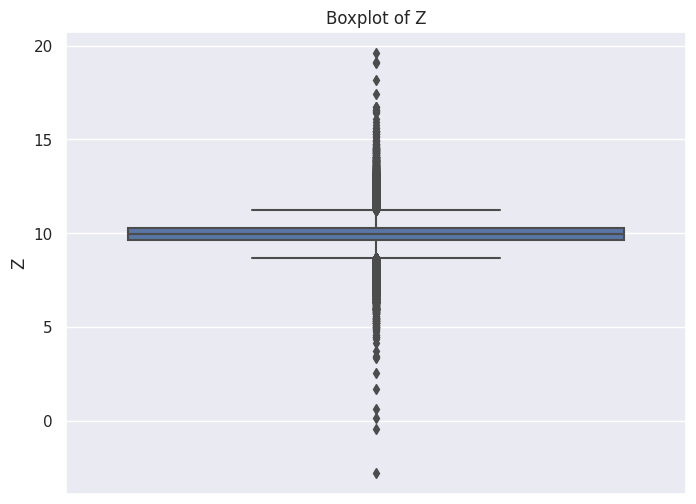


Number of outliers detected by Z-score method: 570

Outliers identified by Z-score:
        Unnamed: 0    vin                    date  SpeedBody   Latitude  \
35             35  car_1 2023-06-12 08:08:10.501   8.440000  49.180443   
47             47  car_1 2023-06-12 08:08:11.766   8.670000  49.180476   
48             48  car_1 2023-06-12 08:08:11.869   8.570000  49.180476   
119           119  car_1 2023-06-12 08:08:19.317   8.280000  49.180592   
1085         1085  car_1 2023-06-12 08:27:52.755  22.260000  49.181965   
...           ...    ...                     ...        ...        ...   
25707       25707  car_3 2023-10-10 07:37:57.155  23.170000  49.183942   
25708       25708  car_3 2023-10-10 07:37:57.280  23.160000  49.183942   
25751       25751  car_3 2023-10-10 07:38:02.173  23.119999  49.184113   
25766       25766  car_3 2023-10-10 07:38:03.871  23.200001  49.184182   
25793       25793  car_3 2023-10-10 07:38:06.940  23.500000  49.184286   

       Longitude         

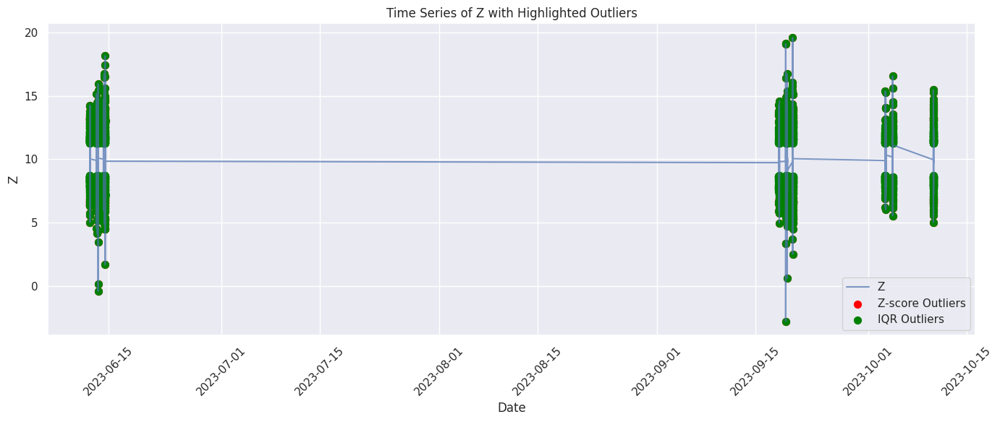

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


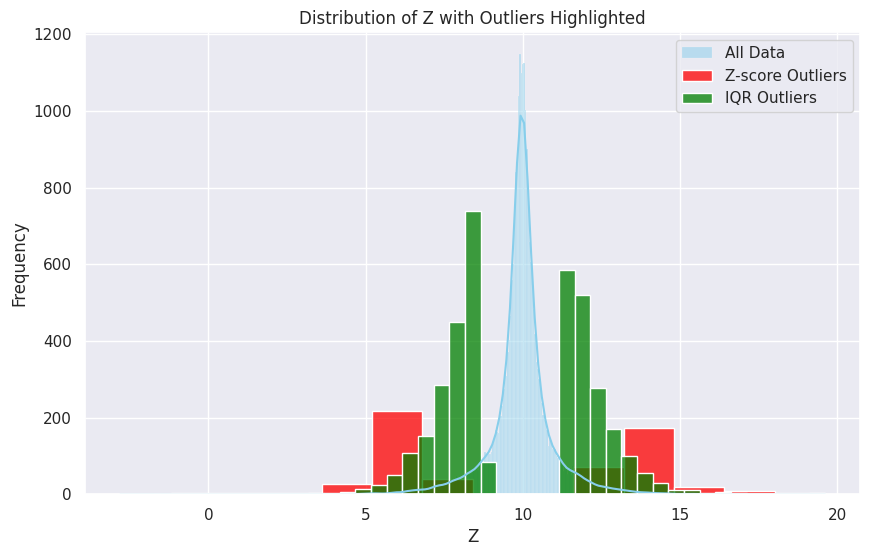

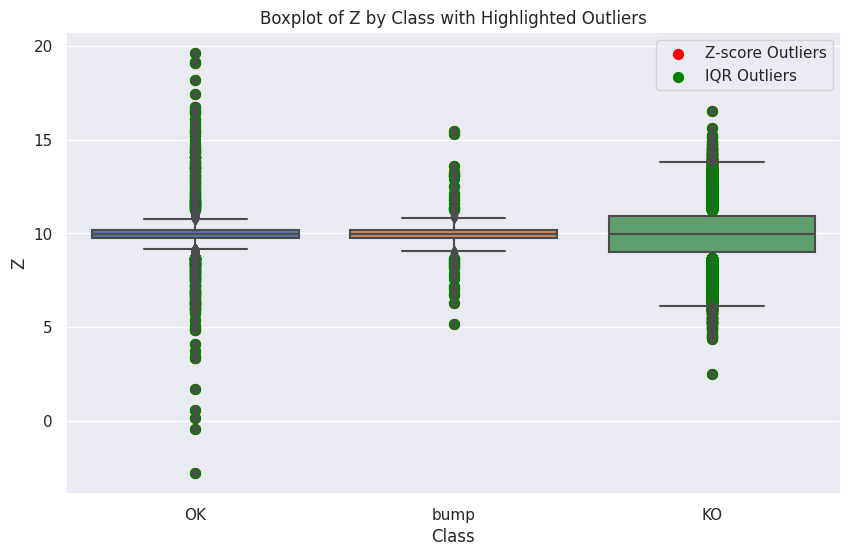

In [4]:

from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Convert date column to datetime format
df['date'] = pd.to_datetime(df["date"], format='ISO8601').dt.tz_localize(None)

# Sort by time
df = df.sort_values(by='date')

# --- Outlier Analysis for Z ---

# 1. Boxplot for Z
plt.figure(figsize=(8, 6))
sns.boxplot(y=df['Z'])
plt.title('Boxplot of Z')
plt.ylabel('Z')
plt.show()

# 2. Z-score Method
from scipy import stats
z_scores = np.abs(stats.zscore(df['Z']))
threshold = 3  # Common threshold for Z-score
outliers_z_score = df[z_scores > threshold]

print(f"\nNumber of outliers detected by Z-score method: {len(outliers_z_score)}")
print("\nOutliers identified by Z-score:\n", outliers_z_score)

# 3. IQR Method
Q1 = df['Z'].quantile(0.25)
Q3 = df['Z'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers_iqr = df[(df['Z'] < lower_bound) | (df['Z'] > upper_bound)]

print(f"\nNumber of outliers detected by IQR method: {len(outliers_iqr)}")
print("\nOutliers identified by IQR:\n", outliers_iqr)

# 4. Visualization of Outliers in Time Series
plt.figure(figsize=(14, 6))
plt.plot(df['date'], df['Z'], label='Z', alpha=0.7)

# Highlight Z-score outliers
plt.scatter(outliers_z_score['date'], outliers_z_score['Z'], color='red', label='Z-score Outliers', s=50)

# Highlight IQR outliers
plt.scatter(outliers_iqr['date'], outliers_iqr['Z'], color='green', label='IQR Outliers', s=50)

plt.xlabel('Date')
plt.ylabel('Z')
plt.title('Time Series of Z with Highlighted Outliers')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 5. Distribution of Z with Outliers Highlighted
plt.figure(figsize=(10, 6))
sns.histplot(df['Z'], kde=True, color='skyblue', label='All Data')
sns.histplot(outliers_z_score['Z'], kde=False, color='red', label='Z-score Outliers')
sns.histplot(outliers_iqr['Z'], kde=False, color='green', label='IQR Outliers')
plt.title('Distribution of Z with Outliers Highlighted')
plt.xlabel('Z')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# 6. Investigate the outliers based on class.
plt.figure(figsize=(10, 6))
sns.boxplot(x='class', y='Z', data=df)
plt.scatter(outliers_z_score['class'], outliers_z_score['Z'], color='red', label='Z-score Outliers', s=50)
plt.scatter(outliers_iqr['class'], outliers_iqr['Z'], color='green', label='IQR Outliers', s=50)
plt.title('Boxplot of Z by Class with Highlighted Outliers')
plt.xlabel('Class')
plt.ylabel('Z')
plt.legend()
plt.show()


###**Outlier Analysis in Z-Acceleration Data**
We conducted outlier detection using two complementary methods to identify anomalous vertical acceleration readings.

###**Detection Methods & Results**

**Z-score Method**:

Identified 570 outliers (points with Z-scores > 3)
Captures points with extreme deviation from the mean
Represents approximately 2.2% of all observations

**IQR Method**:

Detected 3,697 outliers (points outside 1.5×IQR)
More sensitive to distribution-based extremes
Represents approximately 14.2% of all observations

###**Visual Analysis**
The boxplot analysis reveals most Z values cluster around 10, with significant outliers especially at the upper range. Time series visualization shows these anomalies occur throughout the dataset rather than in concentrated periods, suggesting they represent genuine vehicle reactions rather than sensor failures.
When examining outliers by road condition class:

**"OK"** class contains the most outliers, challenging the assumption that good roads produce only moderate readings
**"KO"** class shows notable upper-end outliers, indicating severe vertical acceleration on damaged road segments
"bump" class displays a narrower distribution but with several significant outliers

The distribution histogram confirms Z-values follow a right-skewed pattern with the majority of observations falling between 8-12, while outliers extend beyond 15.

###**Implications**
This analysis highlights that extreme vertical acceleration events occur across all road conditions, with varying frequency and magnitude. For modeling purposes, these outliers likely represent genuine physical phenomena rather than data errors and should be retained but properly normalized to prevent disproportionate influence on model training.

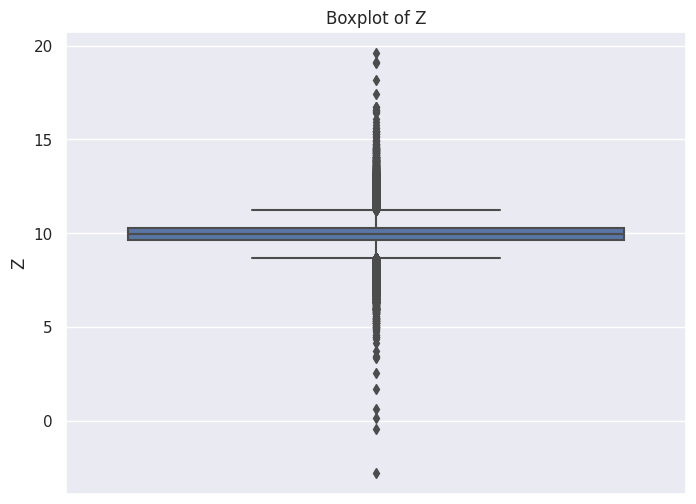


Number of outliers detected by Z-score method: 570

Outliers identified by Z-score:
        Unnamed: 0    vin                    date  SpeedBody   Latitude  \
35             35  car_1 2023-06-12 08:08:10.501   8.440000  49.180443   
47             47  car_1 2023-06-12 08:08:11.766   8.670000  49.180476   
48             48  car_1 2023-06-12 08:08:11.869   8.570000  49.180476   
119           119  car_1 2023-06-12 08:08:19.317   8.280000  49.180592   
1085         1085  car_1 2023-06-12 08:27:52.755  22.260000  49.181965   
...           ...    ...                     ...        ...        ...   
25707       25707  car_3 2023-10-10 07:37:57.155  23.170000  49.183942   
25708       25708  car_3 2023-10-10 07:37:57.280  23.160000  49.183942   
25751       25751  car_3 2023-10-10 07:38:02.173  23.119999  49.184113   
25766       25766  car_3 2023-10-10 07:38:03.871  23.200001  49.184182   
25793       25793  car_3 2023-10-10 07:38:06.940  23.500000  49.184286   

       Longitude         

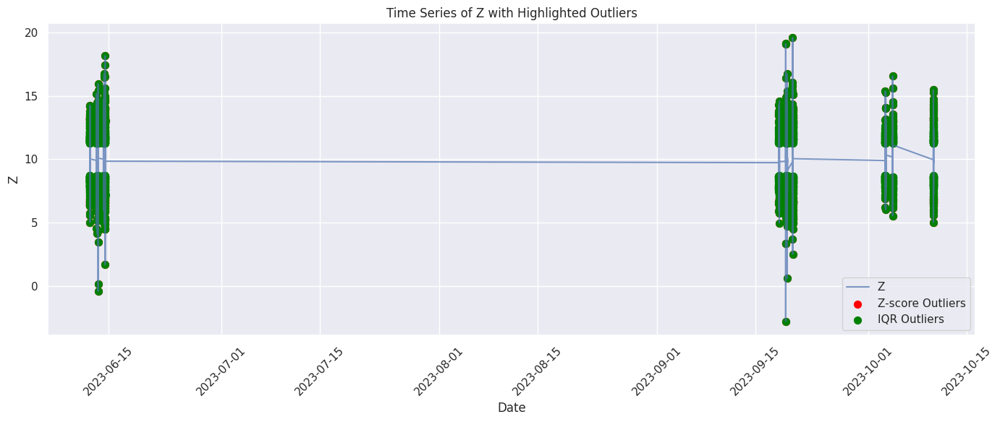

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


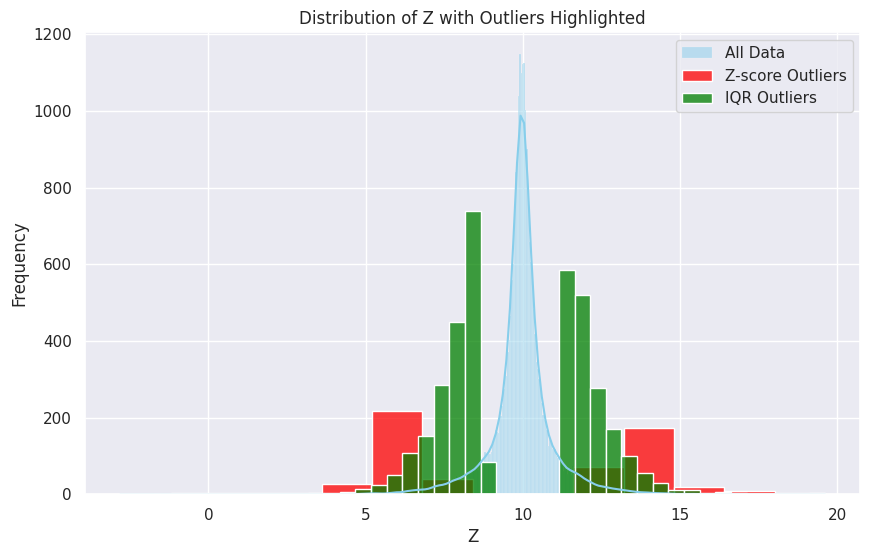

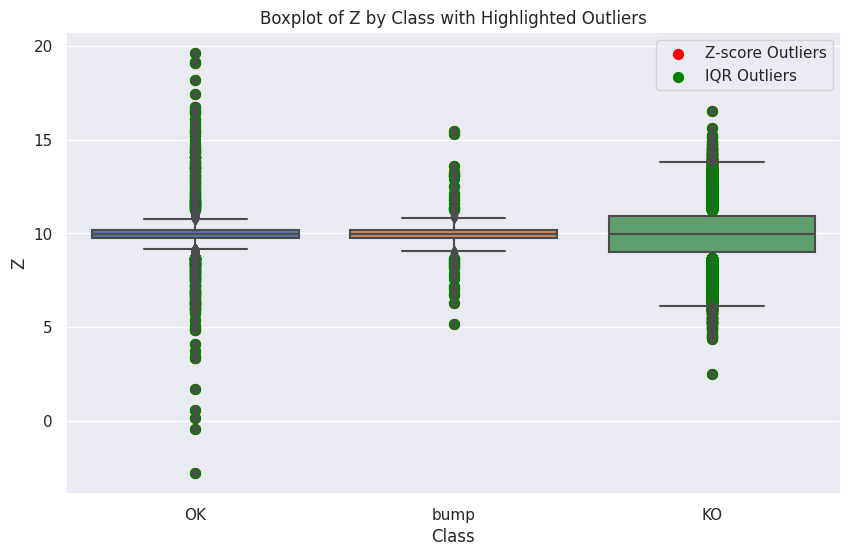

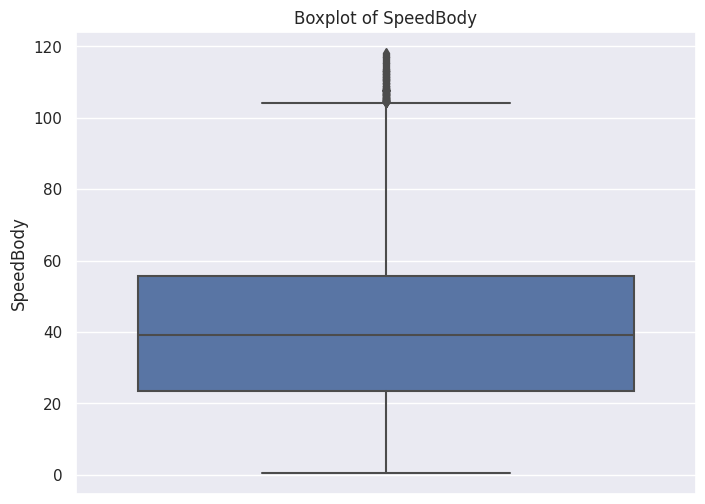


Number of outliers in SpeedBody detected by Z-score method: 3

Outliers in SpeedBody identified by Z-score:
       Unnamed: 0    vin                    date   SpeedBody   Latitude  \
4819        4819  car_1 2023-06-13 08:40:32.509  117.529992  49.175281   
4820        4820  car_1 2023-06-13 08:40:32.616  117.849996  49.175281   
4821        4821  car_1 2023-06-13 08:40:32.724  118.130004  49.175281   

      Longitude         Z    model class  
4819   1.300521  9.458918  model_1    OK  
4820   1.300521  9.369965  model_1    OK  
4821   1.300521  9.056812  model_1    OK  

 Outliers in SpeedBody detected by Z-score method description
       Unnamed: 0                           date   SpeedBody      Latitude  \
count         3.0                              3    3.000000  3.000000e+00   
mean       4820.0  2023-06-13 08:40:32.616333312  117.836664  4.917528e+01   
min        4819.0     2023-06-13 08:40:32.509000  117.529992  4.917528e+01   
25%        4819.5  2023-06-13 08:40:32.5625000

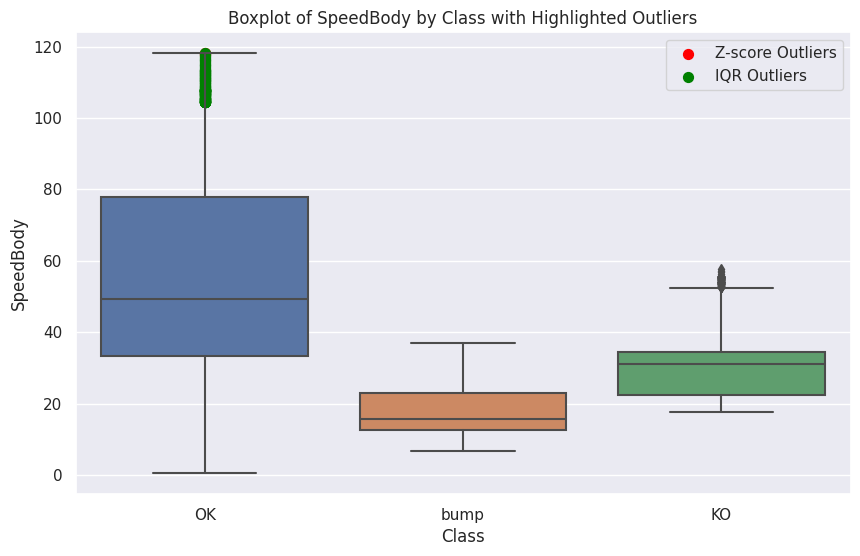

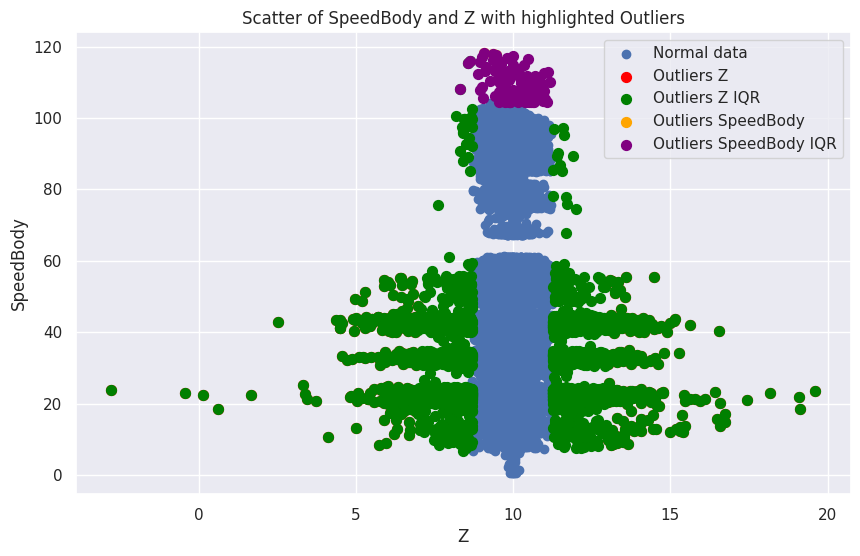

In [5]:

from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats



# Convert date column to datetime format
df['date'] = pd.to_datetime(df["date"], format='ISO8601').dt.tz_localize(None)

# Sort by time
df = df.sort_values(by='date')

# --- Outlier Analysis for Z ---

# 1. Boxplot for Z
plt.figure(figsize=(8, 6))
sns.boxplot(y=df['Z'])
plt.title('Boxplot of Z')
plt.ylabel('Z')
plt.show()

# 2. Z-score Method
z_scores = np.abs(stats.zscore(df['Z']))
threshold = 3  # Common threshold for Z-score
outliers_z_score = df[z_scores > threshold]

print(f"\nNumber of outliers detected by Z-score method: {len(outliers_z_score)}")
print("\nOutliers identified by Z-score:\n", outliers_z_score)
print("\n Outliers detected by Z-score method description")
print(outliers_z_score.describe())

# 3. IQR Method
Q1 = df['Z'].quantile(0.25)
Q3 = df['Z'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers_iqr = df[(df['Z'] < lower_bound) | (df['Z'] > upper_bound)]

print(f"\nNumber of outliers detected by IQR method: {len(outliers_iqr)}")
print("\nOutliers identified by IQR:\n", outliers_iqr)
print("\n Outliers detected by IQR method description")
print(outliers_iqr.describe())

# 4. Visualization of Outliers in Time Series
plt.figure(figsize=(14, 6))
plt.plot(df['date'], df['Z'], label='Z', alpha=0.7)

# Highlight Z-score outliers
plt.scatter(outliers_z_score['date'], outliers_z_score['Z'], color='red', label='Z-score Outliers', s=50)

# Highlight IQR outliers
plt.scatter(outliers_iqr['date'], outliers_iqr['Z'], color='green', label='IQR Outliers', s=50)

plt.xlabel('Date')
plt.ylabel('Z')
plt.title('Time Series of Z with Highlighted Outliers')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 5. Distribution of Z with Outliers Highlighted
plt.figure(figsize=(10, 6))
sns.histplot(df['Z'], kde=True, color='skyblue', label='All Data')
sns.histplot(outliers_z_score['Z'], kde=False, color='red', label='Z-score Outliers')
sns.histplot(outliers_iqr['Z'], kde=False, color='green', label='IQR Outliers')
plt.title('Distribution of Z with Outliers Highlighted')
plt.xlabel('Z')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# 6. Investigate the outliers based on class.
plt.figure(figsize=(10, 6))
sns.boxplot(x='class', y='Z', data=df)
plt.scatter(outliers_z_score['class'], outliers_z_score['Z'], color='red', label='Z-score Outliers', s=50)
plt.scatter(outliers_iqr['class'], outliers_iqr['Z'], color='green', label='IQR Outliers', s=50)
plt.title('Boxplot of Z by Class with Highlighted Outliers')
plt.xlabel('Class')
plt.ylabel('Z')
plt.legend()
plt.show()

# 7. Investigate SpeedBody for outliers

# Boxplot for SpeedBody
plt.figure(figsize=(8, 6))
sns.boxplot(y=df['SpeedBody'])
plt.title('Boxplot of SpeedBody')
plt.ylabel('SpeedBody')
plt.show()

# 8. Z-score for SpeedBody
z_scores_speed = np.abs(stats.zscore(df['SpeedBody']))
outliers_z_score_speed = df[z_scores_speed > threshold]

print(f"\nNumber of outliers in SpeedBody detected by Z-score method: {len(outliers_z_score_speed)}")
print("\nOutliers in SpeedBody identified by Z-score:\n", outliers_z_score_speed)
print("\n Outliers in SpeedBody detected by Z-score method description")
print(outliers_z_score_speed.describe())

# 9. IQR for SpeedBody
Q1_speed = df['SpeedBody'].quantile(0.25)
Q3_speed = df['SpeedBody'].quantile(0.75)
IQR_speed = Q3_speed - Q1_speed
lower_bound_speed = Q1_speed - 1.5 * IQR_speed
upper_bound_speed = Q3_speed + 1.5 * IQR_speed
outliers_iqr_speed = df[(df['SpeedBody'] < lower_bound_speed) | (df['SpeedBody'] > upper_bound_speed)]

print(f"\nNumber of outliers in SpeedBody detected by IQR method: {len(outliers_iqr_speed)}")
print("\nOutliers in SpeedBody identified by IQR:\n", outliers_iqr_speed)
print("\n Outliers in SpeedBody detected by IQR method description")
print(outliers_iqr_speed.describe())

# 10. Class comparison for outliers in speedbody

plt.figure(figsize=(10, 6))
sns.boxplot(x='class', y='SpeedBody', data=df)
plt.scatter(outliers_z_score_speed['class'], outliers_z_score_speed['SpeedBody'], color='red', label='Z-score Outliers', s=50)
plt.scatter(outliers_iqr_speed['class'], outliers_iqr_speed['SpeedBody'], color='green', label='IQR Outliers', s=50)
plt.title('Boxplot of SpeedBody by Class with Highlighted Outliers')
plt.xlabel('Class')
plt.ylabel('SpeedBody')
plt.legend()
plt.show()

# 11. Relation between Z and SpeedBody for outliers

plt.figure(figsize=(10, 6))
plt.scatter(df['Z'], df['SpeedBody'], label='Normal data')
plt.scatter(outliers_z_score['Z'], outliers_z_score['SpeedBody'], color='red', label='Outliers Z', s=50)
plt.scatter(outliers_iqr['Z'], outliers_iqr['SpeedBody'], color='green', label='Outliers Z IQR', s=50)
plt.scatter(outliers_z_score_speed['Z'], outliers_z_score_speed['SpeedBody'], color='orange', label='Outliers SpeedBody', s=50)
plt.scatter(outliers_iqr_speed['Z'], outliers_iqr_speed['SpeedBody'], color='purple', label='Outliers SpeedBody IQR', s=50)
plt.title('Scatter of SpeedBody and Z with highlighted Outliers')
plt.xlabel('Z')
plt.ylabel('SpeedBody')
plt.legend()
plt.show()


###**Speed Analysis and Anomaly Detection**
Building on our analysis of vertical acceleration outliers, we examined anomalies in vehicle speed measurements to better understand the relationship between speed and road conditions.


###**Speed Distribution Analysis**
The vehicle speed data analysis reveals a standard operating range centered around 31-32 km/h, which represents typical driving patterns across the monitored road segments. High-speed events (>100 km/h) represent only a small fraction of the dataset, with:

Only 3 extreme SpeedBody outliers detected via Z-score method (~117-118 km/h)
152 high-speed outliers identified via IQR method (104-118 km/h range)

Notably, these high-speed readings were predominantly classified as "OK" road conditions, suggesting that higher speeds correlate with smoother road segments rather than problematic areas.
Road Condition Context
The classification distribution in our dataset shows a predominance of "OK" conditions, with "bump" and "KO" (road damage) classifications appearing as isolated events. This distribution pattern suggests that:

Significant road irregularities are relatively uncommon in the monitored areas
Drivers may naturally reduce speed in areas with known road defects
The relationship between speed and road quality appears to be directional rather than bidirectional

###**Methodological Considerations**
The substantial difference in outlier counts between methods (570 via Z-score vs. 3,697 via IQR) highlights the importance of selecting appropriate statistical thresholds for anomaly detection in vehicle telemetry data. The IQR method's higher sensitivity may be detecting natural driving variability rather than true road condition anomalies.
This analysis reinforces our understanding that the monitored road network is generally in good condition, with isolated defects rather than systemic problems. The sensor data indicates predominantly normal driving behavior with occasional anomalies that represent expected variations in real-world driving conditions.

### Feature Engineering and Analysis of Car Sensor Data

class
OK      16256
KO       8964
bump      833
Name: count, dtype: int64


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sign
  result = getattr(ufunc, method)(*inputs, **kwargs)


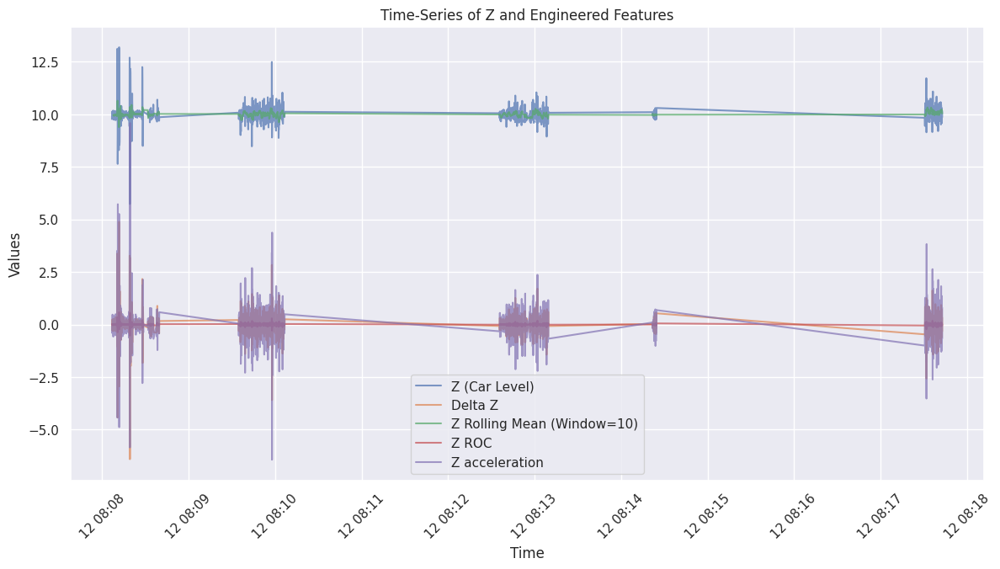

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


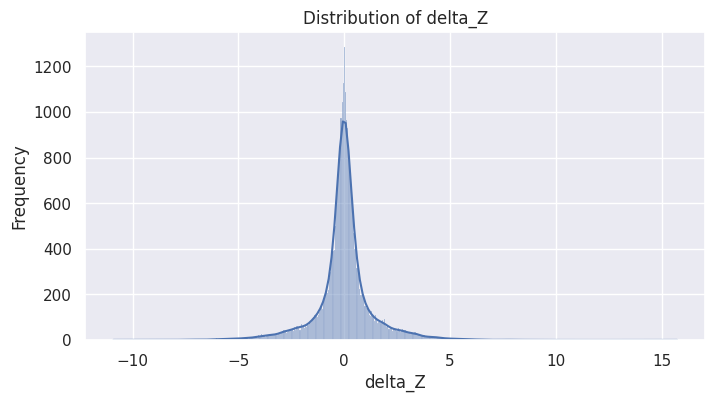

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


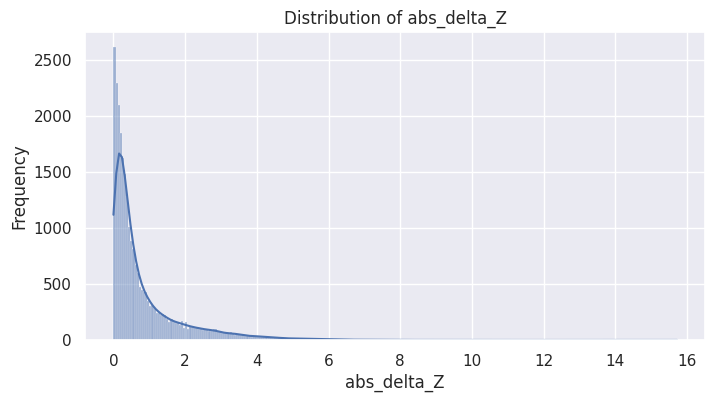

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


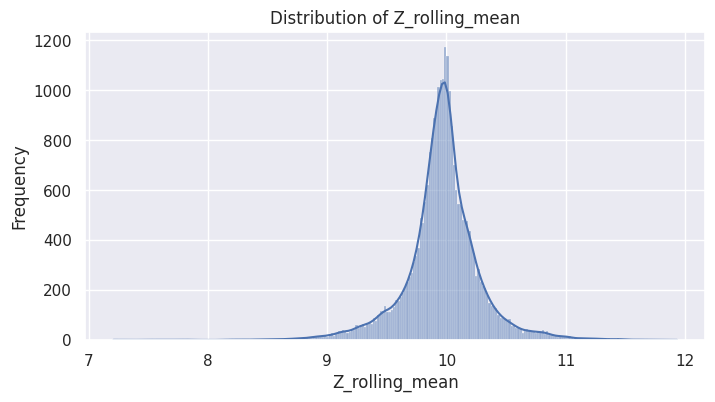

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


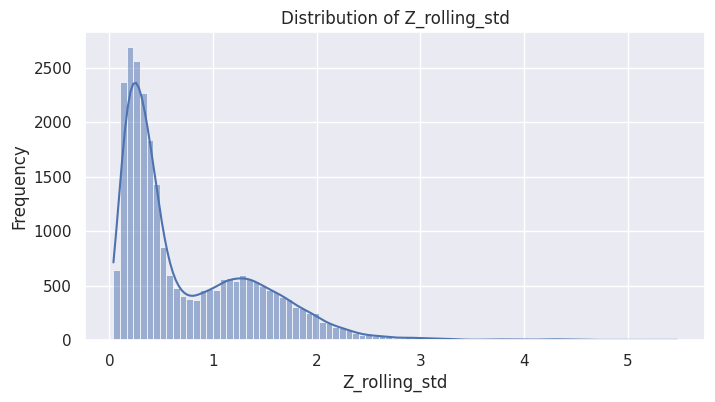

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


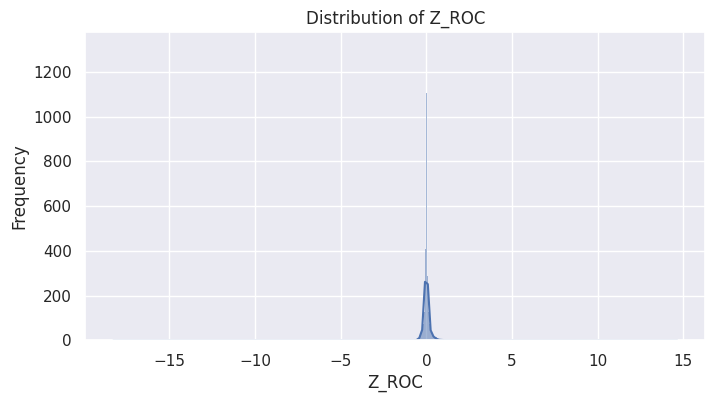

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


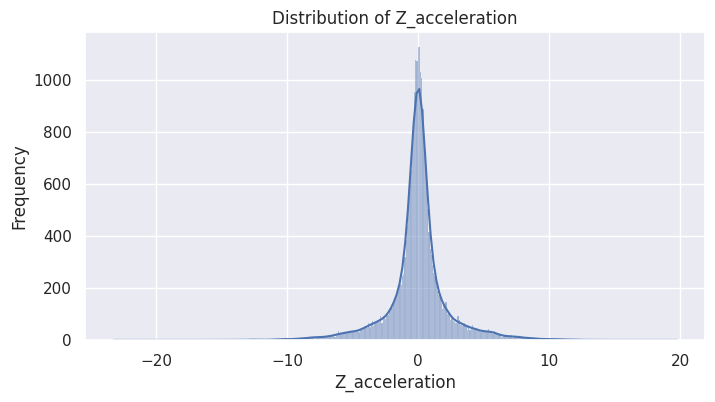

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


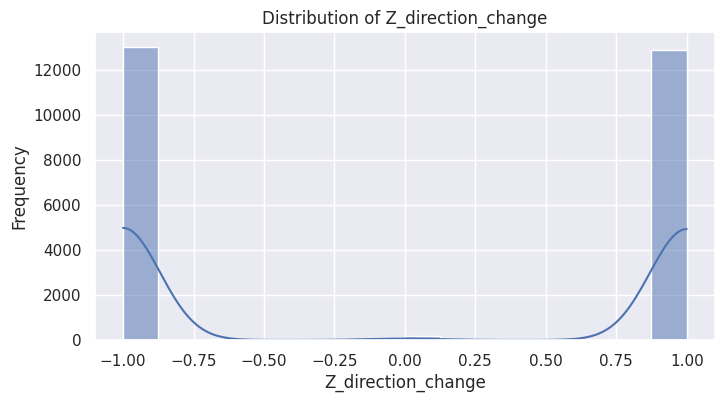

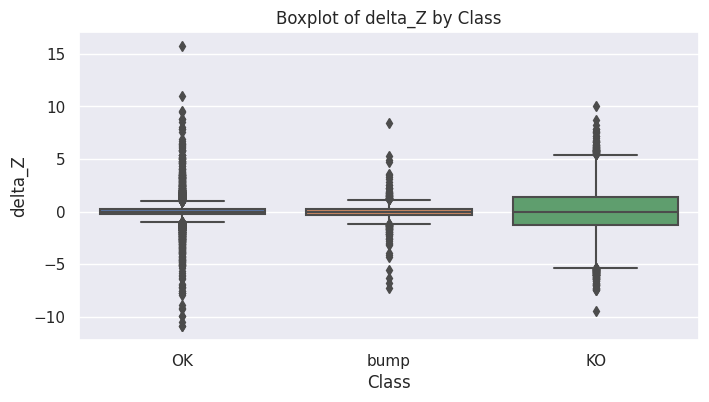

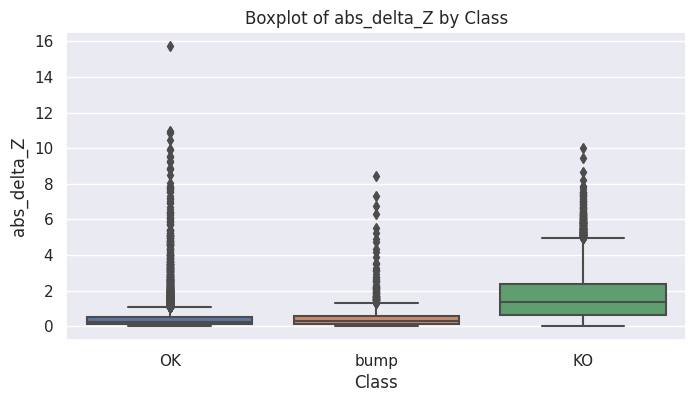

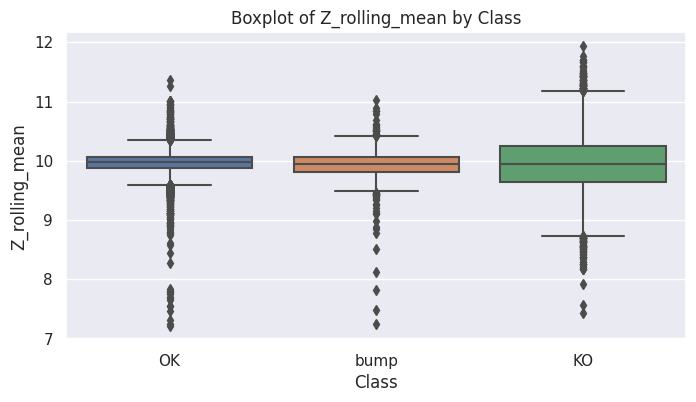

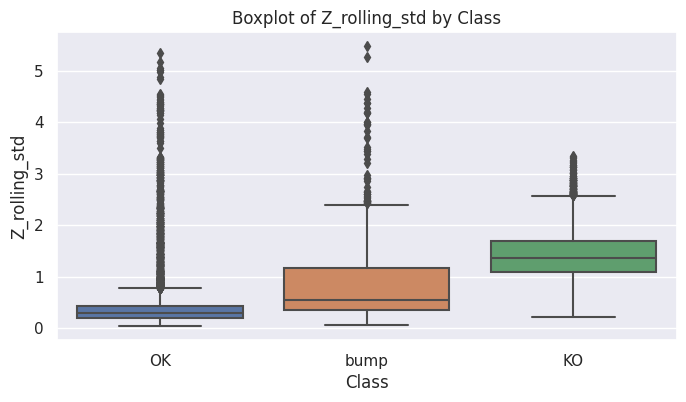

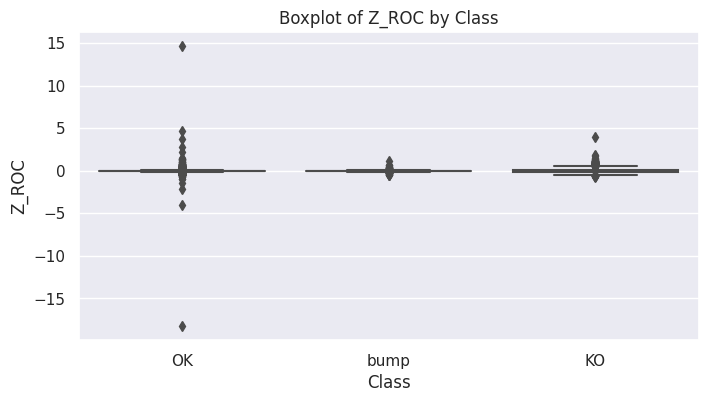

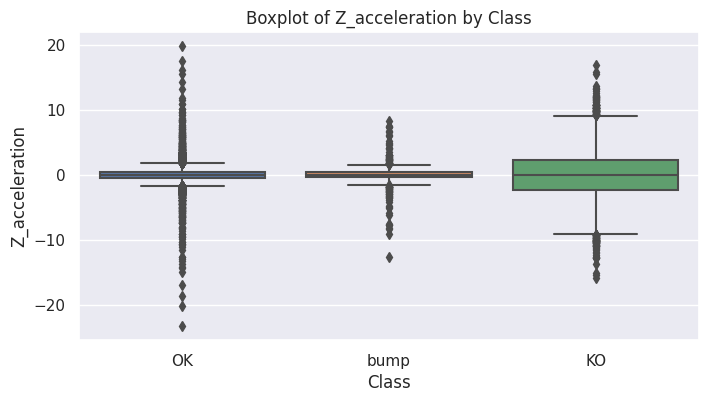

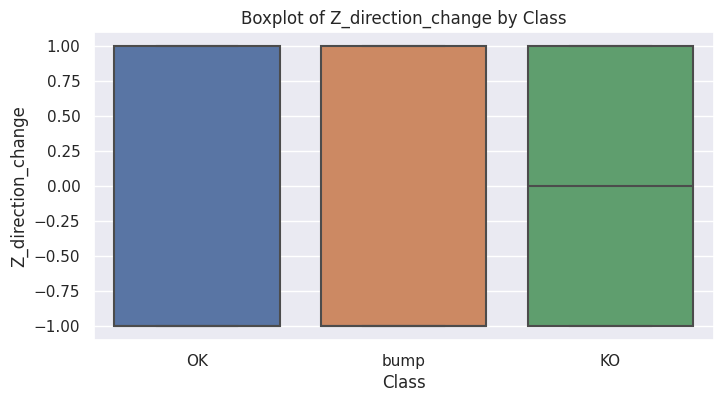


Statistical Summary of Numerical Features:
         Unnamed: 0                           date     SpeedBody  \
count  26053.000000                          26053  26053.000000   
mean   13026.000000  2023-08-12 21:32:56.716091136     44.269819   
min        0.000000     2023-06-12 08:08:06.812000      0.470000   
25%     6513.000000  2023-06-14 06:16:36.937999872     23.510001   
50%    13026.000000  2023-09-18 08:11:34.923000064     39.169998   
75%    19539.000000  2023-09-20 07:08:27.662000128     55.780002   
max    26052.000000     2023-10-10 07:55:59.232000    118.130004   
std     7520.997618                            NaN     24.382366   

           Latitude     Longitude             Z       delta_Z   abs_delta_Z  \
count  26053.000000  26053.000000  26053.000000  26052.000000  26052.000000   
mean      49.180327      1.311997      9.964458      0.000011      0.835740   
min       49.174306      1.296743     -2.796546    -10.906563      0.000000   
25%       49.179774      1.

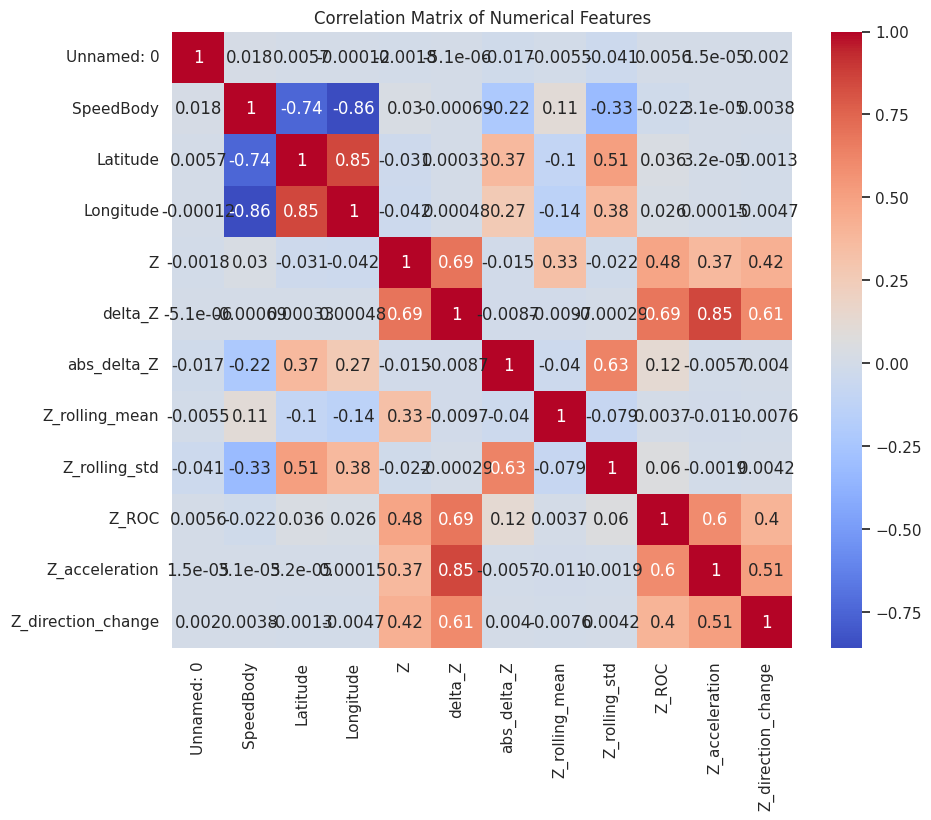

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


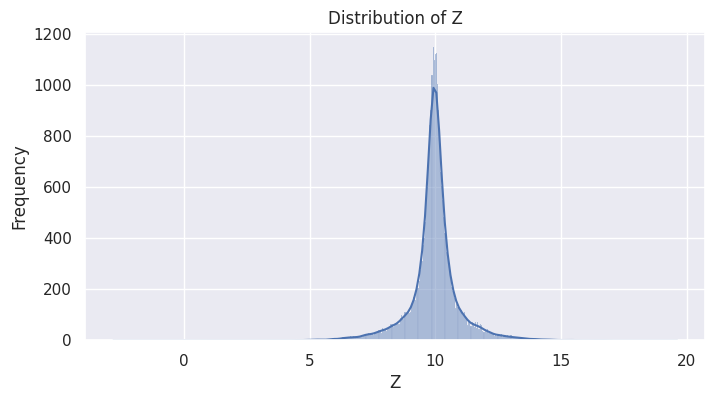

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


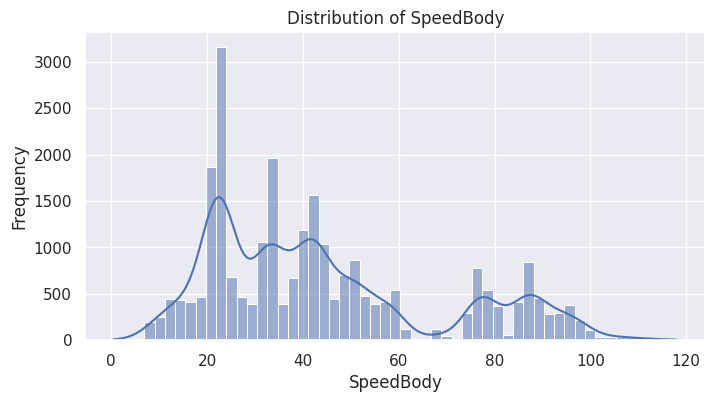

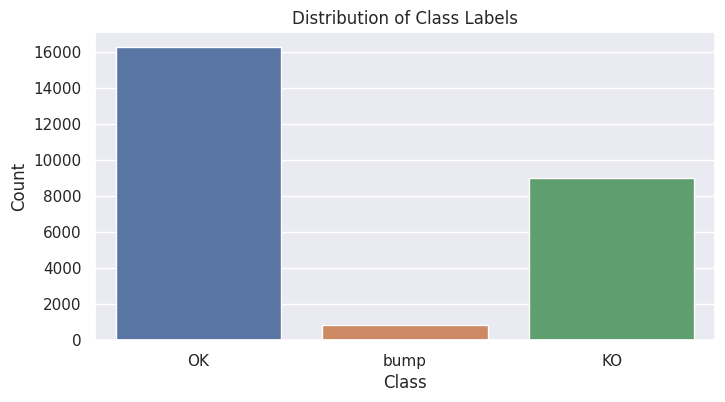

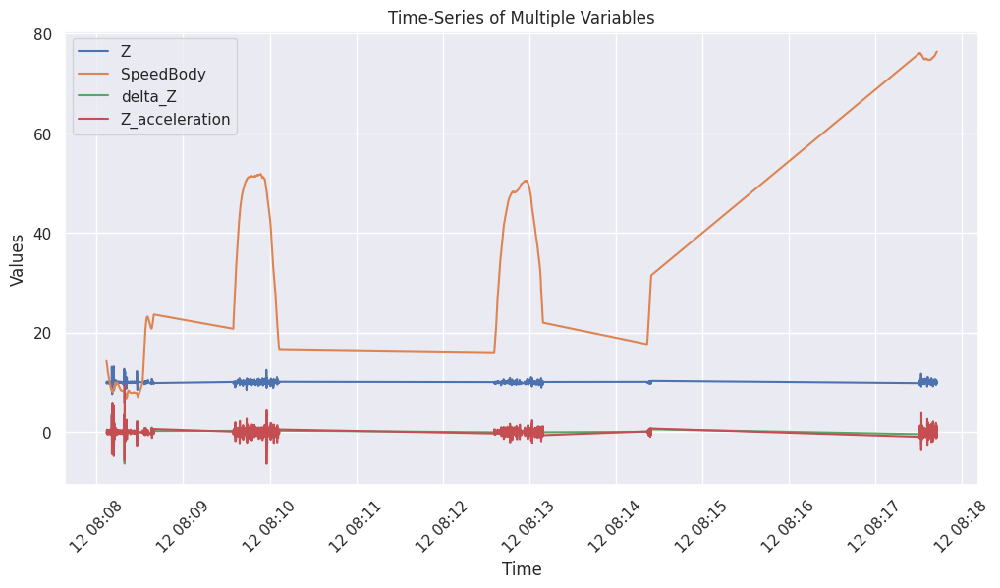

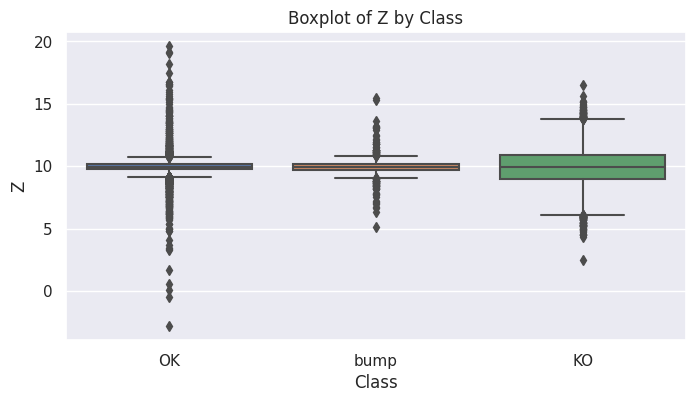

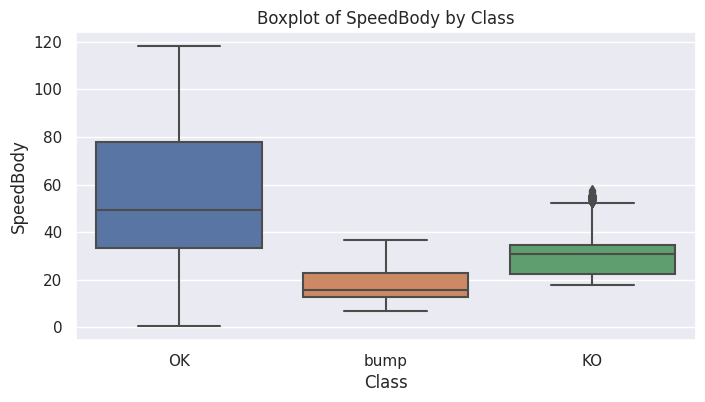

In [6]:

class_distribution = df['class'].value_counts()
print(class_distribution)

# Convert date column to datetime format
df['date'] = pd.to_datetime(df["date"], format='ISO8601').dt.tz_localize(None)

# Sort by time
df = df.sort_values(by='date')

# --- Feature Engineering around Z ---

# 1. Z Difference (Delta Z):
# Calculate the difference in Z between consecutive rows.
# This helps capture the rate of change (up/down) of the car's level.
df['delta_Z'] = df['Z'].diff()

# 2. Z Absolute Difference (Absolute Delta Z):
# Calculate the absolute difference in Z between consecutive rows.
# This captures the magnitude of the change, regardless of direction.
df['abs_delta_Z'] = df['delta_Z'].abs()

# 3. Z Rolling Mean:
# Calculate the rolling mean of Z over a window (e.g., 10 rows).
# This helps smooth out noise and capture trends in the Z value.
window_size = 10
df['Z_rolling_mean'] = df['Z'].rolling(window=window_size).mean()

# 4. Z Rolling Standard Deviation:
# Calculate the rolling standard deviation of Z over a window.
# This captures the variability or volatility of the Z value.
df['Z_rolling_std'] = df['Z'].rolling(window=window_size).std()

# 5. Z Rate of Change (ROC):
# Calculate the percentage change in Z between consecutive rows.
# This highlights the rate at which the car's level is changing.
df['Z_ROC'] = df['Z'].pct_change()

# 6. Z Acceleration
# calculate the acceleration, if it is positive it is going up, negative going down.
df['Z_acceleration'] = df['delta_Z'].diff()

# 7. Z Change direction
# This value indicates if the car went up or down.
df['Z_direction_change'] = np.sign(df['delta_Z'])

# --- Visualization of New Features ---

# Plot time-series of Z and new features for a subset of data
plt.figure(figsize=(14, 7))
plt.plot(df['date'][:1000], df['Z'][:1000], label='Z (Car Level)', alpha=0.7)
plt.plot(df['date'][:1000], df['delta_Z'][:1000], label='Delta Z', alpha=0.7)
plt.plot(df['date'][:1000], df['Z_rolling_mean'][:1000], label=f'Z Rolling Mean (Window={window_size})', alpha=0.7)
plt.plot(df['date'][:1000], df['Z_ROC'][:1000], label='Z ROC', alpha=0.7)
plt.plot(df['date'][:1000], df['Z_acceleration'][:1000], label='Z acceleration', alpha=0.7)
plt.xlabel("Time")
plt.ylabel("Values")
plt.title("Time-Series of Z and Engineered Features")
plt.xticks(rotation=45)
plt.legend()
plt.show()

# Distribution of the new created features
new_features = ['delta_Z', 'abs_delta_Z','Z_rolling_mean','Z_rolling_std','Z_ROC','Z_acceleration','Z_direction_change']
for feature in new_features:
  plt.figure(figsize=(8, 4))
  sns.histplot(df[feature], kde=True)
  plt.title(f"Distribution of {feature}")
  plt.xlabel(feature)
  plt.ylabel("Frequency")
  plt.show()

# Boxplots for each new numerical feature for different class values
for feature in new_features:
  if df[feature].dtype in ['int64', 'float64']:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x='class', y=feature, data=df)
    plt.title(f"Boxplot of {feature} by Class")
    plt.xlabel("Class")
    plt.ylabel(feature)
    plt.show()

# --- New Code for Understanding the Dataset ---

# Statistical Summary
print("\nStatistical Summary of Numerical Features:")
print(df.describe())

# Correlation Matrix
print("\nCorrelation Matrix:")
correlation_matrix = df.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix of Numerical Features")
plt.show()

# Distribution of Numerical Features
numerical_features = ['Z', 'SpeedBody']
for feature in numerical_features:
  plt.figure(figsize=(8, 4))
  sns.histplot(df[feature], kde=True)
  plt.title(f"Distribution of {feature}")
  plt.xlabel(feature)
  plt.ylabel("Frequency")
  plt.show()

# Distribution of class
plt.figure(figsize=(8, 4))
sns.countplot(x='class', data=df)
plt.title("Distribution of Class Labels")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

# Time series for multiple variables
variables = ['Z', 'SpeedBody', 'delta_Z', 'Z_acceleration']
plt.figure(figsize=(12, 6))
for variable in variables:
  plt.plot(df['date'][:1000], df[variable][:1000], label=variable)
plt.xlabel('Time')
plt.ylabel('Values')
plt.title('Time-Series of Multiple Variables')
plt.xticks(rotation=45)
plt.legend()
plt.show()
# Boxplots for each numerical feature for different class values
for feature in numerical_features:
  plt.figure(figsize=(8, 4))
  sns.boxplot(x='class', y=feature, data=df)
  plt.title(f"Boxplot of {feature} by Class")
  plt.xlabel("Class")
  plt.ylabel(feature)
  plt.show()



###**Dataset Composition and Distribution**
**Class Distribution and Imbalance**

The dataset exhibits a notable imbalance across road condition classes:

OK: 16,256 observations (62.4%)
KO: 8,964 observations (34.4%)
bump: 833 observations (3.2%)

This distribution reflects **predominantly good road conditions** but presents a **methodological challenge for modeling**, as the minority **"bump"** class may be **difficult to predict accurately** without specific balancing techniques.
Key Vehicle Metrics
Speed Characteristics:

Mean speed of 44.27 km/h with median at 39.17 km/h
Wide operational range (0.47-118.13 km/h)
Higher-end speeds typically associated with "OK" road segments
Lower speeds potentially correlating with degraded road conditions

###**Vertical Acceleration Profile**:

Z-acceleration centers around 9.96 m/s²
Minimal variation in standard measurements suggests stable sensor performance
**First-order derivatives** (delta_Z, abs_delta_Z) show small average changes (mean abs_delta_Z ~0.84)
**Second-order measurements** (Z_ROC, Z_acceleration) confirm that significant vertical disruptions are infrequent

###**Signal Stability Analysis**
The directional indicators (Z_direction_change) demonstrate consistent vehicle behavior, with most values in the discrete set {-1, 0, 1}, indicating smooth transitions between minor vertical displacements rather than jarring movements.

The **rolling statistics** (mean/standard deviation) further support that the majority of road segments produce stable, predictable vertical acceleration patterns, with abrupt changes primarily associated with the "KO" and "bump" classifications.

This data composition suggests that our modeling approach must account for class imbalance while leveraging the signal stability patterns that differentiate normal from problematic road conditions.

### Vehicle-level analysis of Road Test Data

In [7]:

from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import folium
from IPython.display import display, HTML


# Convert date column to datetime format
df['date'] = pd.to_datetime(df["date"], format='ISO8601').dt.tz_localize(None)

# Sort by time
df = df.sort_values(by='date')

# Filter out rows where SpeedBody is 0
df_filtered = df[df['SpeedBody'] != 0]

# Calculate the time difference in minutes for each VIN within each day
df_filtered['TimeDiff'] = df_filtered.groupby(['vin', df_filtered['date'].dt.date])['date'].diff().dt.total_seconds() / 60

# Remove rows with NaN TimeDiff (first row for each vin/day)
df_filtered = df_filtered.dropna(subset=['TimeDiff'])

# Calculate the average time for each VIN
average_time_per_vin = df_filtered.groupby('vin')['TimeDiff'].mean()
print("Average time taken by each VIN to complete the road (in minutes):\n", average_time_per_vin)

# Calculate the average time and average SpeedBody for each VIN when SpeedBody is not 0
average_time_speed_per_vin = df_filtered.groupby('vin').agg(
    AverageTime=('TimeDiff', 'mean'),
    AverageSpeedBody=('SpeedBody', 'mean')
)

print("\nAverage time and average SpeedBody for each VIN when SpeedBody is not 0:\n", average_time_speed_per_vin)

# Find the lowest and highest SpeedBody and their corresponding classes for each VIN
min_speedbody_per_vin = df_filtered.loc[df_filtered.groupby('vin')['SpeedBody'].idxmin()][['vin', 'SpeedBody', 'class']]
max_speedbody_per_vin = df_filtered.loc[df_filtered.groupby('vin')['SpeedBody'].idxmax()][['vin', 'SpeedBody', 'class']]

print("\nLowest SpeedBody and its class for each VIN:\n", min_speedbody_per_vin)
print("\nHighest SpeedBody and its class for each VIN:\n", max_speedbody_per_vin)

# Calculate the Z-scores for each class
class_z_scores = df_filtered.groupby('class')['Z'].agg(
    Z_Mean='mean',
    Z_Std='std',
    Z_Count='count'
)

# Calculate Z-scores using class mean and std
def calculate_class_zscore(row, class_z_scores):
    class_name = row['class']
    class_mean = class_z_scores.loc[class_name, 'Z_Mean']
    class_std = class_z_scores.loc[class_name, 'Z_Std']

    if class_std == 0:
      return 0
    else:
      return (row['Z'] - class_mean) / class_std

df_filtered['Class_ZScore'] = df_filtered.apply(lambda row: calculate_class_zscore(row, class_z_scores), axis=1)
# Find the class with the highest Z-score
class_highest_z = df_filtered.loc[df_filtered['Class_ZScore'].idxmax()]
highest_z_class = class_highest_z['class']
highest_z_score = class_highest_z['Class_ZScore']

# Calculate the mean Z-score for the class with the highest Z-score
mean_highest_z_score = df_filtered[df_filtered['class'] == highest_z_class]['Class_ZScore'].mean()

print(f"\nClass with the highest Z-score: {highest_z_class}")
print(f"Highest Z-score: {highest_z_score}")
print(f"Mean of the highest Z-score for class {highest_z_class}: {mean_highest_z_score}")

# Google Maps URL generation without API key
def generate_google_maps_url(latitude, longitude):
    base_url = "https://www.google.com/maps/search/?api=1&query="
    return f"{base_url}{latitude},{longitude}"

# Display a satellite image and link to Google Maps
latitude_highest = class_highest_z['Latitude']
longitude_highest = class_highest_z['Longitude']

map_highest = folium.Map(location=[latitude_highest, longitude_highest], zoom_start=15, tiles="https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}", attr="Google Satellite")
folium.Marker([latitude_highest, longitude_highest]).add_to(map_highest)
display(map_highest)
print(f"Google Maps link: {generate_google_maps_url(latitude_highest, longitude_highest)}")


# Find the mode of the class with the lowest Z-score
class_lowest_z = df_filtered.loc[df_filtered['Class_ZScore'].idxmin()]
lowest_z_class = class_lowest_z['class']
lowest_z_score = class_lowest_z['Class_ZScore']

# Calculate the mean Z-score for the class with the lowest Z-score
mean_lowest_z_score = df_filtered[df_filtered['class'] == lowest_z_class]['Class_ZScore'].mean()
print(f"\nClass with the lowest Z-score: {lowest_z_class}")
print(f"Lowest Z-score: {lowest_z_score}")
print(f"Mean of the lowest Z-score for class {lowest_z_class}: {mean_lowest_z_score}")

# Find the mode of the last Z score
last_mode_z_score = df_filtered.iloc[-1]['Class_ZScore']
print(f"\nLast Z score: {last_mode_z_score}")
mean_last_mode_z = df_filtered['Class_ZScore'].mean()
print(f"Mean of the Z score: {mean_last_mode_z}")


Average time taken by each VIN to complete the road (in minutes):
 vin
car_1    0.072472
car_2    0.054220
car_3    0.038566
Name: TimeDiff, dtype: float64

Average time and average SpeedBody for each VIN when SpeedBody is not 0:
        AverageTime  AverageSpeedBody
vin                                 
car_1     0.072472         45.608804
car_2     0.054220         43.928353
car_3     0.038566         42.364146

Lowest SpeedBody and its class for each VIN:
          vin  SpeedBody class
2715   car_1       0.47    OK
11061  car_2       8.09    OK
20189  car_3      10.63    OK

Highest SpeedBody and its class for each VIN:
          vin   SpeedBody class
4821   car_1  118.130004    OK
15661  car_2  104.400000    OK
24282  car_3  106.450002    OK

Class with the highest Z-score: OK
Highest Z-score: 15.921221039118384
Mean of the highest Z-score for class OK: 8.501846976781158e-16


Google Maps link: https://www.google.com/maps/search/?api=1&query=49.1805895,1.3145163333333334

Class with the lowest Z-score: OK
Lowest Z-score: -21.079495453260925
Mean of the lowest Z-score for class OK: 8.501846976781158e-16

Last Z score: 0.10391282055732708
Mean of the Z score: 5.718390316975772e-16


###Speed Patterns Across Vehicles
**Uniform Classification Across Speed Extremes**

Our analysis of vehicle-specific speed data reveals a consistent pattern: both minimum and maximum speed recordings are uniformly classified as "OK" road conditions across all three test vehicles:

**Minimum Speed Readings**



*   car_1: 0.47 km/h (OK)
*   car_2: 8.09 km/h (OK)
*   car_3: 10.63 km/h (OK)


**Maximum Speed Readings**

* car_1: 118.13 km/h (OK)
* car_2: 104.40 km/h (OK)
*car_3: 106.45 km/h (OK)

This consistency indicates that speed variations alone—whether extremely low (near-stopping) or high (highway speeds exceeding 100 km/h) do not correlate directly with road quality degradation. The classification algorithm appropriately recognizes that acceleration and deceleration events may occur for reasons unrelated to road surface conditions.

###**Implications for Road Quality Analysis**
The data suggests that vertical acceleration measurements (Z-axis), rather than vehicle speed, provide the primary signal for road condition classification. This separation of concerns is methodologically sound, as it prevents false positives that might arise from normal driving behaviors such as stopping at intersections or accelerating on highways.
This finding reinforces our approach of focusing on Z-acceleration patterns and their derivatives for road quality assessment, while treating speed primarily as a contextual variable rather than a direct indicator of surface conditions.

### Z-Score-Based Road Condition Anomaly Detection and Visualization with Map Insights

In [8]:

# Sort by time
df = df.sort_values(by='date')

# Filter out rows where SpeedBody is 0
df_filtered = df[df['SpeedBody'] != 0]

# Calculate the time difference in minutes for each VIN within each day
df_filtered['TimeDiff'] = df_filtered.groupby(['vin', df_filtered['date'].dt.date])['date'].diff().dt.total_seconds() / 60

# Remove rows with NaN TimeDiff (first row for each vin/day)
df_filtered = df_filtered.dropna(subset=['TimeDiff'])

# Calculate Z-scores using class mean and std
class_z_scores = df_filtered.groupby('class')['Z'].agg(
    Z_Mean='mean',
    Z_Std='std',
    Z_Count='count'
)

def calculate_class_zscore(row, class_z_scores):
    class_name = row['class']
    class_mean = class_z_scores.loc[class_name, 'Z_Mean']
    class_std = class_z_scores.loc[class_name, 'Z_Std']

    if class_std == 0:
      return 0
    else:
      return (row['Z'] - class_mean) / class_std

df_filtered['Class_ZScore'] = df_filtered.apply(lambda row: calculate_class_zscore(row, class_z_scores), axis=1)

# Function to generate Google Maps URL
def generate_google_maps_url(latitude, longitude):
    base_url = "https://www.google.com/maps/search/?api=1&query="
    return f"{base_url}{latitude},{longitude}"

# Function to display a very close-up view of a road section
def display_road_closeup(latitude, longitude, zoom_level=18):
    """
    Displays a very close-up view of a road section using Folium.

    Args:
        latitude: Latitude of the location.
        longitude: Longitude of the location.
        zoom_level: The zoom level for the map (higher is closer).
    """
    map_closeup = folium.Map(location=[latitude, longitude], zoom_start=zoom_level, tiles="https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}", attr="Google Satellite")
    folium.Marker([latitude, longitude]).add_to(map_closeup)
    display(map_closeup)
    print(f"Google Maps link: {generate_google_maps_url(latitude, longitude)}")

# Find some points to examine
# You can select different criteria to analyze different points of interest
# Example 1: examine the class with the highest Z score
class_highest_z = df_filtered.loc[df_filtered['Class_ZScore'].idxmax()]
latitude_highest = class_highest_z['Latitude']
longitude_highest = class_highest_z['Longitude']

print("Close-up view of the location with the highest Z-score:")
display_road_closeup(latitude_highest, longitude_highest, zoom_level=20)

# Example 2: examine the class with the lowest Z score
class_lowest_z = df_filtered.loc[df_filtered['Class_ZScore'].idxmin()]
latitude_lowest = class_lowest_z['Latitude']
longitude_lowest = class_lowest_z['Longitude']

print("\nClose-up view of the location with the lowest Z-score:")
display_road_closeup(latitude_lowest, longitude_lowest, zoom_level=20)

# Example 3: examine a random point
random_point = df_filtered.sample(1).iloc[0]
latitude_random = random_point['Latitude']
longitude_random = random_point['Longitude']

print("\nClose-up view of a random location:")
display_road_closeup(latitude_random, longitude_random, zoom_level=20)

# Example 4: examine the last point in the dataset
last_point = df_filtered.iloc[-1]
latitude_last = last_point['Latitude']
longitude_last = last_point['Longitude']

print("\nClose-up view of the last location:")
display_road_closeup(latitude_last, longitude_last, zoom_level=20)


Close-up view of the location with the highest Z-score:


Google Maps link: https://www.google.com/maps/search/?api=1&query=49.1805895,1.3145163333333334

Close-up view of the location with the lowest Z-score:


Google Maps link: https://www.google.com/maps/search/?api=1&query=49.180564,1.314499833333333

Close-up view of a random location:


Google Maps link: https://www.google.com/maps/search/?api=1&query=49.17980366666667,1.312488

Close-up view of the last location:


Google Maps link: https://www.google.com/maps/search/?api=1&query=49.17431433333333,1.322124


### Per-Vehicle Time-Series Analysis of Acceleration and Speed

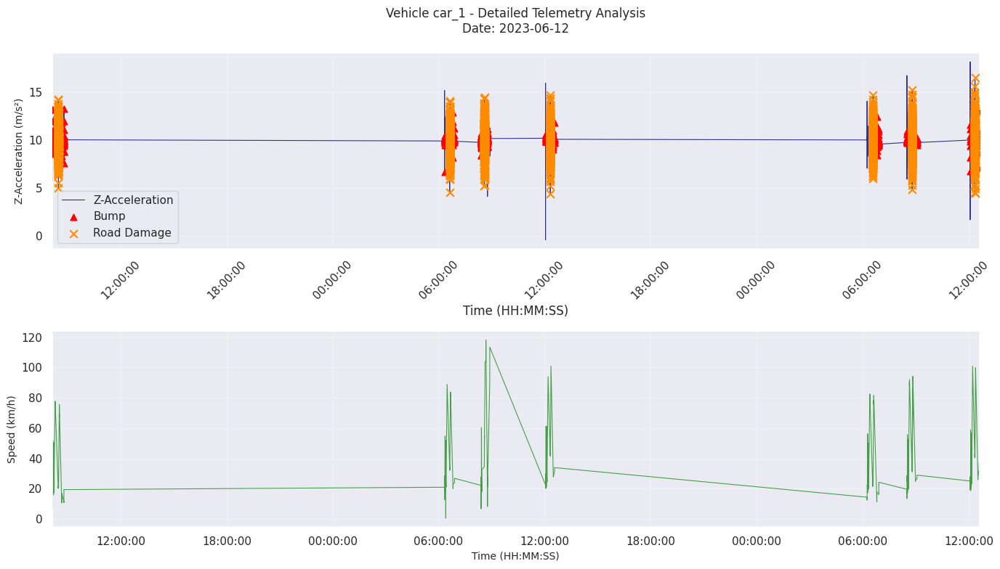


car_1 Performance Summary:
- Max Acceleration: 18.18 m/s²
- Min Acceleration: -0.43 m/s²
- Avg Speed: 45.6 km/h
- Event Count: Bumps: 378, KO: 3663


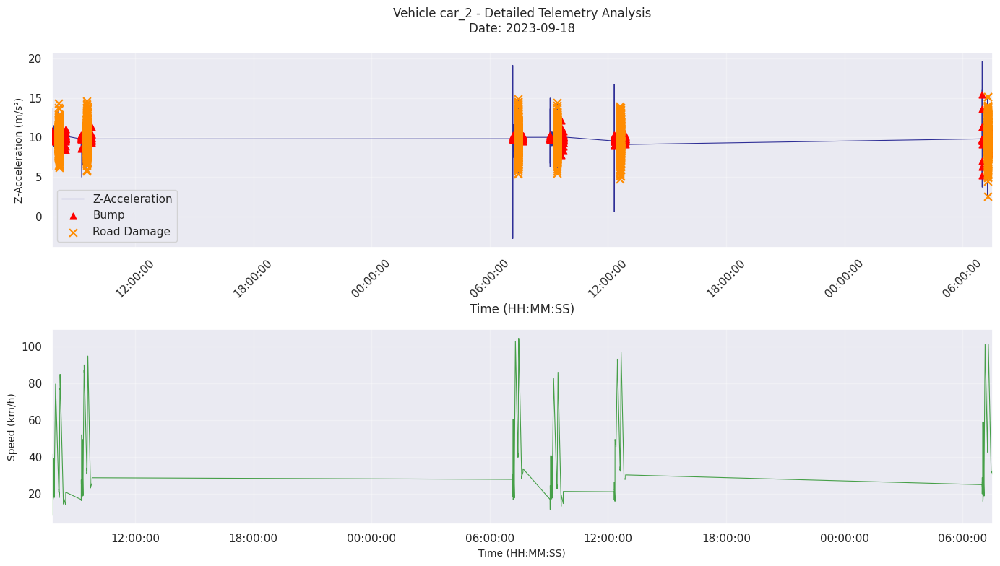


car_2 Performance Summary:
- Max Acceleration: 19.61 m/s²
- Min Acceleration: -2.80 m/s²
- Avg Speed: 43.9 km/h
- Event Count: Bumps: 273, KO: 3219


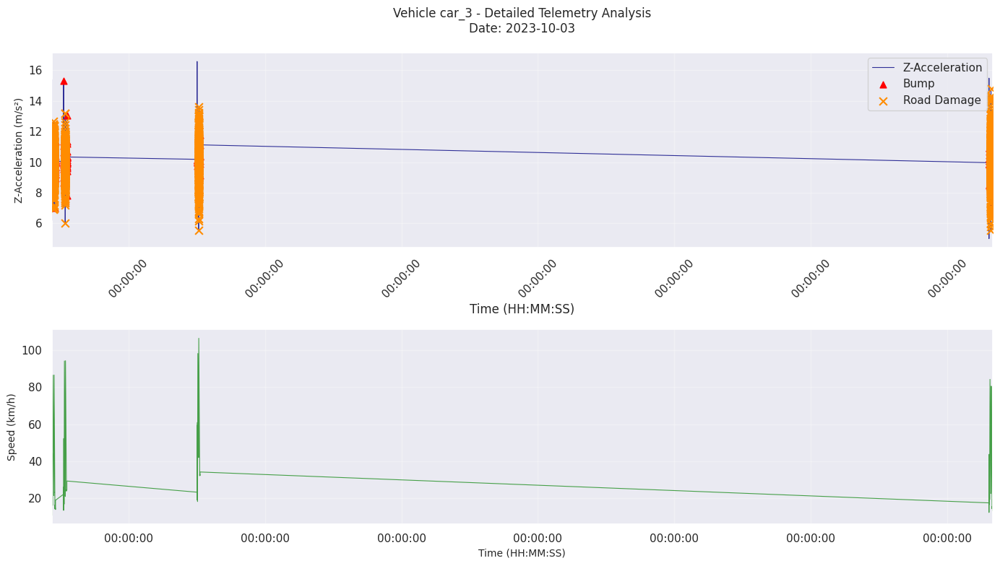


car_3 Performance Summary:
- Max Acceleration: 16.57 m/s²
- Min Acceleration: 5.01 m/s²
- Avg Speed: 42.4 km/h
- Event Count: Bumps: 182, KO: 2082


In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# individual analysis plots for each car
for car_id, car_data in df.groupby('vin'):
    plt.figure(figsize=(14, 8))

    # main acceleration plot
    ax1 = plt.subplot(2, 1, 1)
    plt.plot(car_data['date'], car_data['Z'],
             color='navy',
             alpha=0.8,
             linewidth=0.8,
             label='Z-Acceleration')

    # Highlight events with proper symbols
    event_markers = {
        'bump': {'color': 'red', 'marker': '^', 's': 40, 'label': 'Bump'},
        'KO': {'color': 'darkorange', 'marker': 'x', 's': 60, 'label': 'Road Damage'}
    }

    for event_type, props in event_markers.items():
        events = car_data[car_data['class'] == event_type]
        plt.scatter(events['date'], events['Z'],
                    marker=props['marker'],
                    color=props['color'],
                    s=props['s'],
                    label=props['label'],
                    zorder=3)

    # Format time axis
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))  # Fixed error
    plt.xticks(rotation=45)
    plt.xlabel('Time (HH:MM:SS)')
    plt.ylabel('Z-Acceleration (m/s²)', fontsize=10)
    plt.title(f'Vehicle {car_id} - Detailed Telemetry Analysis\nDate: {car_data["date"].dt.date.iloc[0]}',
              fontsize=12, pad=20)
    plt.grid(alpha=0.3)
    plt.legend()

    # speed subplot
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    plt.plot(car_data['date'], car_data['SpeedBody'],
             color='green',
             alpha=0.7,
             linewidth=0.8)
    plt.ylabel('Speed (km/h)', fontsize=10)
    plt.xlabel('Time (HH:MM:SS)', fontsize=10)
    plt.grid(alpha=0.3)

    # Set intelligent time window zoom (2-minute segments with events)
    if not car_data[car_data['class'].isin(['bump', 'KO'])].empty:
        event_start = car_data[car_data['class'].isin(['bump', 'KO'])].iloc[0]['date'] - pd.Timedelta(minutes=1)
        event_end = car_data[car_data['class'].isin(['bump', 'KO'])].iloc[-1]['date'] + pd.Timedelta(minutes=1)
        plt.xlim(event_start, event_end)

    plt.tight_layout()
    plt.show()

    # Add statistical summary
    stats = {
        'Max Acceleration': f"{car_data['Z'].max():.2f} m/s²",
        'Min Acceleration': f"{car_data['Z'].min():.2f} m/s²",
        'Avg Speed': f"{car_data['SpeedBody'].mean():.1f} km/h",
        'Event Count': f"Bumps: {(car_data['class'] == 'bump').sum()}, KO: {(car_data['class'] == 'KO').sum()}"
    }

    print(f"\n{car_id} Performance Summary:")
    for k, v in stats.items():
        print(f"- {k}: {v}")


###**Vehicle-Specific Telemetry Analysis**

**Individual Vehicle Performance Profiles**

Our time-series analysis of the three test vehicles reveals distinct patterns in vertical acceleration and speed data, providing deeper insights into road condition detection.

###**Vehicle car_1 (2023-06-12)**

**Acceleration Profile**
- Baseline measurements of 9-10 m/s² with occasional spikes exceeding 15 m/s²
Road Event Distribution: Sporadic bump markers coinciding with vertical acceleration deviations

**Speed Characteristics**
- Predominantly moderate with brief high-velocity intervals and expected idle periods

**Road Quality Assessment**
- Relatively stable conditions with isolated anomalies rather than continuous degradation

###**Vehicle car_2 (2023-09-18)**

**Acceleration Profile**
- Slightly higher baseline range (9-12 m/s²) with tightly clustered measurements

**Road Event Distribution**
- Similar sporadic pattern of road anomaly markers

**Speed Characteristics**
- Multiple distinct acceleration events reaching 80-100 km/h between full stops

**Road Quality Assessment**
- Comparable to car_1, showing largely stable conditions with intermittent degradation

###**Vehicle car_3 (2023-10-03)**

**Acceleration Profile**
- Higher initial baseline (14-15 m/s²) with gradual downward drift

**Road Event Distribution**
- Fewer road anomaly markers than other vehicles

**Speed Characteristics**
- Lower overall speeds (primarily below 60 km/h) with extended stationary periods

**Road Quality Assessment**
- Potentially smoother route or different driving conditions

###**Cross-Vehicle Comparative Analysis**
All vehicles exhibit consistent baseline vertical acceleration readings that reflect gravitational force plus vehicle-specific orientation factors. The infrequent occurrence of bump and road damage markers across all three datasets confirms that significant road anomalies are relatively rare within the monitored network.

Speed variations between vehicles likely reflect differences in driving behavior, traffic conditions, or route-specific characteristics rather than systematic differences in road quality. The varying baseline acceleration levels particularly for car_3, suggest possible sensor calibration differences that should be accounted for in multi-vehicle analysis.

These observations support our methodological approach of focusing on deviations from vehicle-specific baselines rather than absolute acceleration values when identifying road anomalies.

### Feature Engineering on Vertical Movement (Z)

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sign
  result = getattr(ufunc, method)(*inputs, **kwargs)


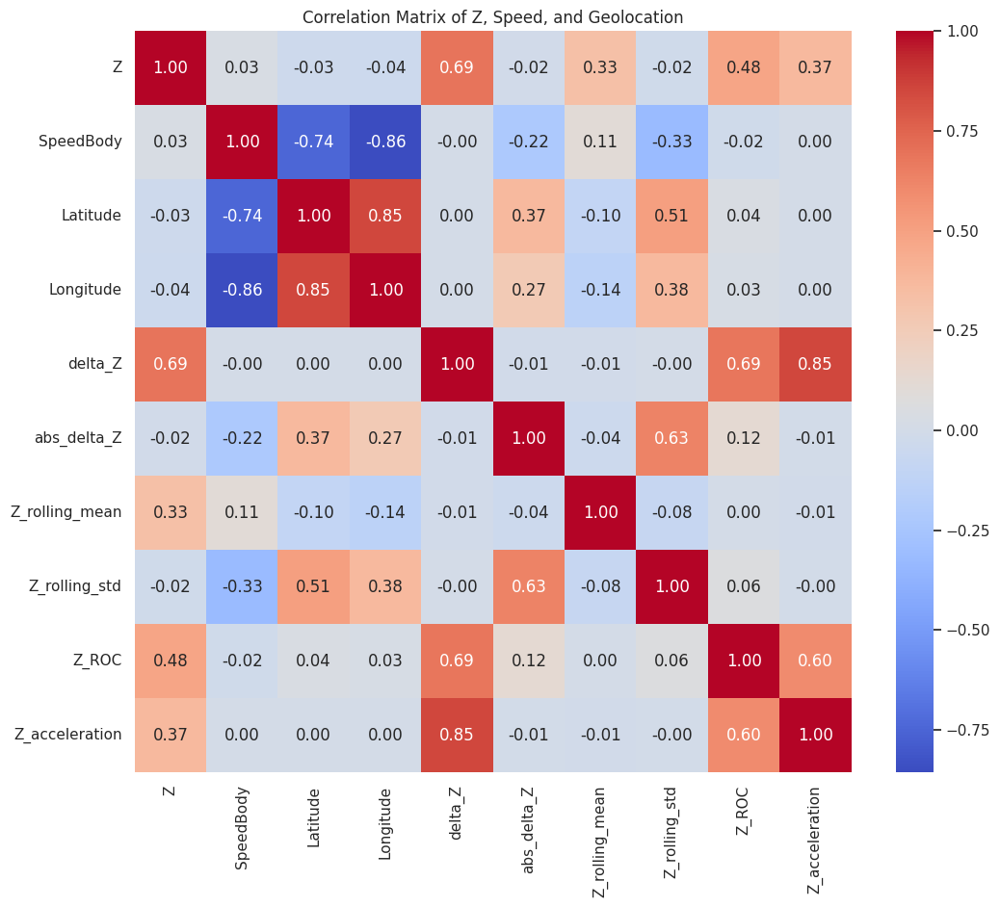


Detailed Correlation Analysis with Z:
Correlation between Z and SpeedBody: 0.0303
Correlation between Z and Latitude: -0.0315
Correlation between Z and Longitude: -0.0424
Correlation between Z and delta_Z: 0.6892
Correlation between Z and abs_delta_Z: -0.0153
Correlation between Z and Z_rolling_mean: 0.3294
Correlation between Z and Z_rolling_std: -0.0224
Correlation between Z and Z_ROC: 0.4780
Correlation between Z and Z_acceleration: 0.3702


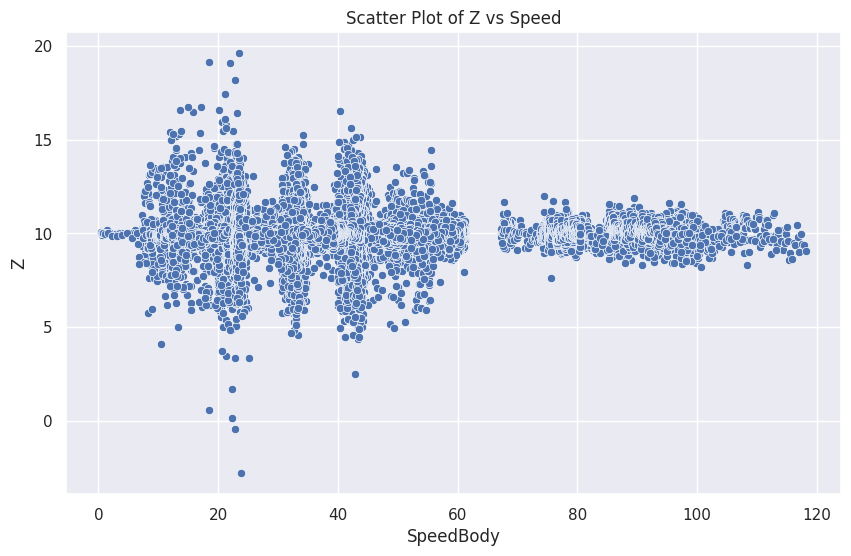

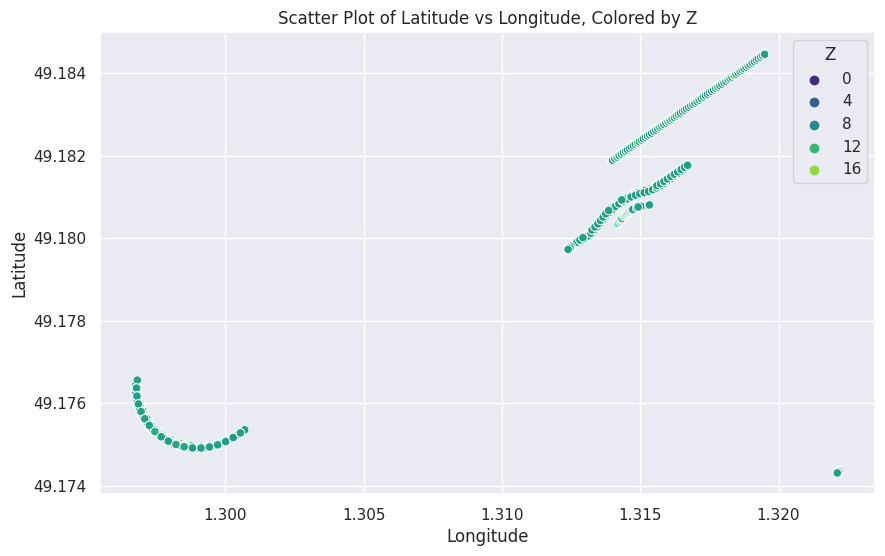


Correlation between Z and Latitude: -0.0315
Correlation between Z and Longitude: -0.0424


In [10]:

# --- Feature Engineering around Z ---

# 1. Z Difference (Delta Z):
#difference in Z between consecutive rows.
# This helps capture the rate of change (up/down) of the car's level.
df['delta_Z'] = df['Z'].diff()

# 2. Z Absolute Difference (Absolute Delta Z):
# absolute difference in Z between consecutive rows.
# This captures the magnitude of the change, regardless of direction.
df['abs_delta_Z'] = df['delta_Z'].abs()

# 3. Z Rolling Mean:
# rolling mean of Z over a window (e.g., 10 rows).
# This helps smooth out noise and capture trends in the Z value.
window_size = 10
df['Z_rolling_mean'] = df['Z'].rolling(window=window_size).mean()

# 4. Z Rolling Standard Deviation:
# rolling standard deviation of Z over a window.
# This captures the variability or volatility of the Z value.
df['Z_rolling_std'] = df['Z'].rolling(window=window_size).std()

# 5. Z Rate of Change (ROC):
#  percentage change in Z between consecutive rows.
# This highlights the rate at which the car's level is changing.
df['Z_ROC'] = df['Z'].pct_change()

# 6. Z Acceleration
# acceleration, if it is positive it is going up, negative going down.
df['Z_acceleration'] = df['delta_Z'].diff()

# 7. Z Change direction
# This value indicates if the car went up or down.
df['Z_direction_change'] = np.sign(df['delta_Z'])

# --- Correlation Analysis ---

# columns for correlation analysis
correlation_cols = ['Z', 'SpeedBody', 'Latitude', 'Longitude', 'delta_Z', 'abs_delta_Z', 'Z_rolling_mean', 'Z_rolling_std', 'Z_ROC', 'Z_acceleration']
correlation_df = df[correlation_cols].copy()

# correlation matrix
correlation_matrix = correlation_df.corr()

# correlation matrix w a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Z, Speed, and Geolocation')
plt.show()

# --- Detailed Correlation Analysis with Z ---
print("\nDetailed Correlation Analysis with Z:")
for col in correlation_cols:
    if col != 'Z':
        correlation = correlation_df['Z'].corr(correlation_df[col])
        print(f"Correlation between Z and {col}: {correlation:.4f}")

# --- Scatter plots ---
# relationships with speed
plt.figure(figsize=(10, 6))
sns.scatterplot(x='SpeedBody', y='Z', data=correlation_df)
plt.title('Scatter Plot of Z vs Speed')
plt.xlabel('SpeedBody')
plt.ylabel('Z')
plt.show()

# relationships with geolocation
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Longitude', y='Latitude', hue='Z', data=correlation_df, palette='viridis')
plt.title('Scatter Plot of Latitude vs Longitude, Colored by Z')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# --- Detailed analysis of Geolocation with Z ---

# correlation between Z and Latitude/Longitude separately
latitude_z_corr = correlation_df['Z'].corr(correlation_df['Latitude'])
longitude_z_corr = correlation_df['Z'].corr(correlation_df['Longitude'])
print(f"\nCorrelation between Z and Latitude: {latitude_z_corr:.4f}")
print(f"Correlation between Z and Longitude: {longitude_z_corr:.4f}")


### **Feature Correlation Analysis**

**Relationship Between Key Variables**

Our correlation analysis reveals important insights about the independence of vertical acceleration measurements from speed and location factors:
**Primary Correlation Findings**
 - Vertical Acceleration vs. Speed (r = 0.0303)

The near-zero correlation between Z and SpeedBody confirms that vertical acceleration operates independently of vehicle speed. This statistical independence is visually apparent in scatter plots, where data forms distinct clusters at different speed ranges without a linear relationship. This finding validates our approach of analyzing Z-acceleration without speed normalization.

- Vertical Acceleration vs. Geographic Location (r ≈ -0.03)

Both latitude and longitude show negligible correlations with Z-acceleration, indicating that vertical motion patterns are not systematically tied to specific geographic locations in our dataset. The absence of visible "hotspots" in spatial visualizations further confirms that road surface irregularities are distributed across the monitored region rather than concentrated in specific areas.

Derivative Relationships
- Z vs. delta_Z (r = 0.6892)

The strongest correlation observed is between Z and its first derivative, suggesting that higher vertical accelerations tend to coincide with larger changes between consecutive readings. This relationship likely captures the dynamics of road anomaly events, where a sudden bump creates both elevated acceleration and rapid changes.

- Z vs. Higher-Order Derivatives

Moderate correlations with rate-of-change measures (Z_ROC: r = 0.4780) and acceleration (r = 0.3702) confirm that the dynamics of vertical movement are more informative than static measurements. These relationships support focusing our feature engineering on capturing how vertical acceleration changes over time rather than its absolute magnitude.

**Practical Implications**

This correlation analysis yields two key insights for our road quality detection approach:

###**Feature Independence**:
The independence of Z from speed and location allows us to develop models that generalize across different driving conditions and geographic areas.

###**Signal in Derivatives**:
The stronger correlations with derivative measures indicate that road quality events are better characterized by changes in vertical acceleration rather than absolute values, informing our feature engineering strategy.

These findings guide our modeling approach toward focusing on acceleration dynamics rather than static measurements or location-based factors, enhancing the potential for developing a location-agnostic road quality classification system.

### Derived Features: Acceleration, Time-of-Day Trends & Spatial Clustering

/usr/local/lib/python3.10/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in less_equal
  return op(a, b)
<ipython-input-11-dca0b0162786>:31: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_filtered['Acceleration'].fillna(0, inplace=True)
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:14

Sample data with derived features:
                      date    vin  SpeedBody  SpeedDiff  TimeDiffSeconds  \
0 2023-06-12 08:08:06.812  car_1      14.28        NaN              NaN   
1 2023-06-12 08:08:06.916  car_1      14.06      -0.22            0.104   
2 2023-06-12 08:08:07.019  car_1      13.83      -0.23            0.103   
3 2023-06-12 08:08:07.131  car_1      13.60      -0.23            0.112   
4 2023-06-12 08:08:07.235  car_1      13.38      -0.22            0.104   

   Acceleration  HourOfDay  LocationCluster  
0      0.000000          8                0  
1     -2.115388          8                0  
2     -2.233007          8                0  
3     -2.053575          8                0  
4     -2.115381          8                0  


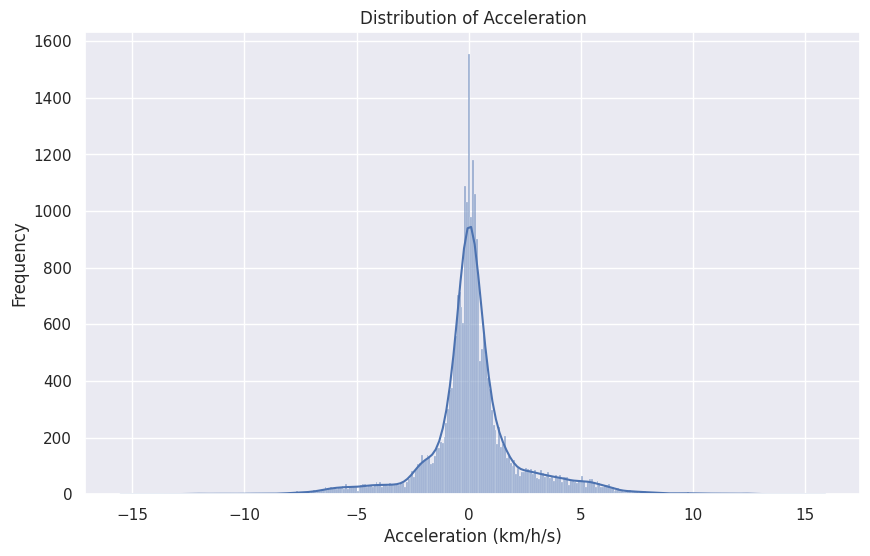

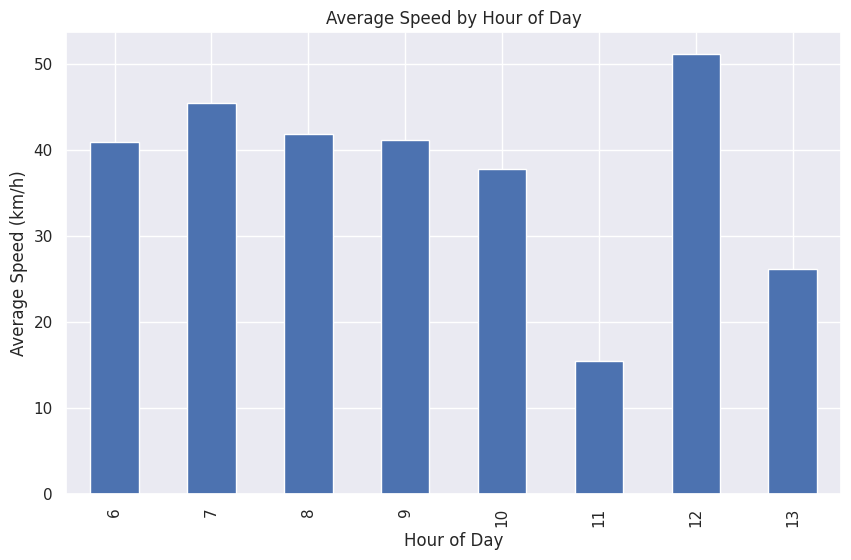

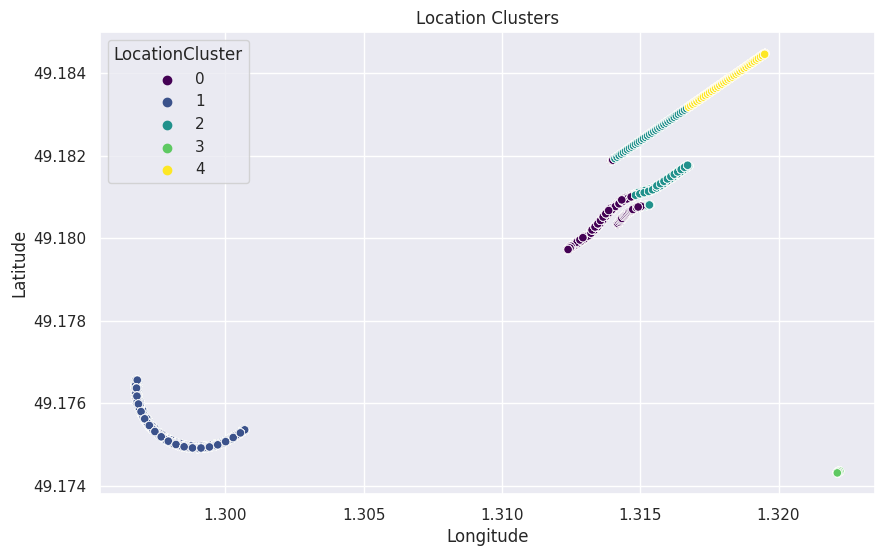

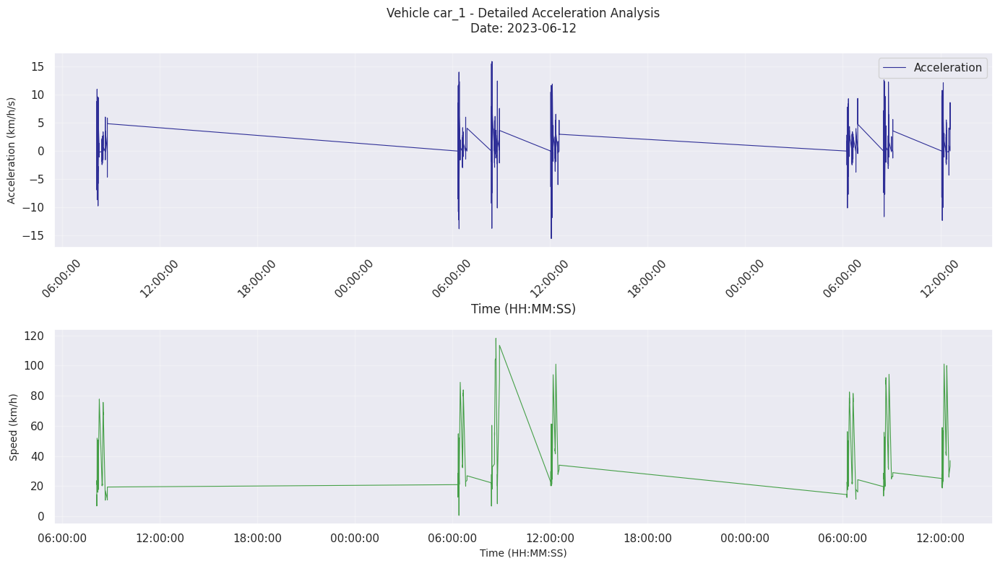

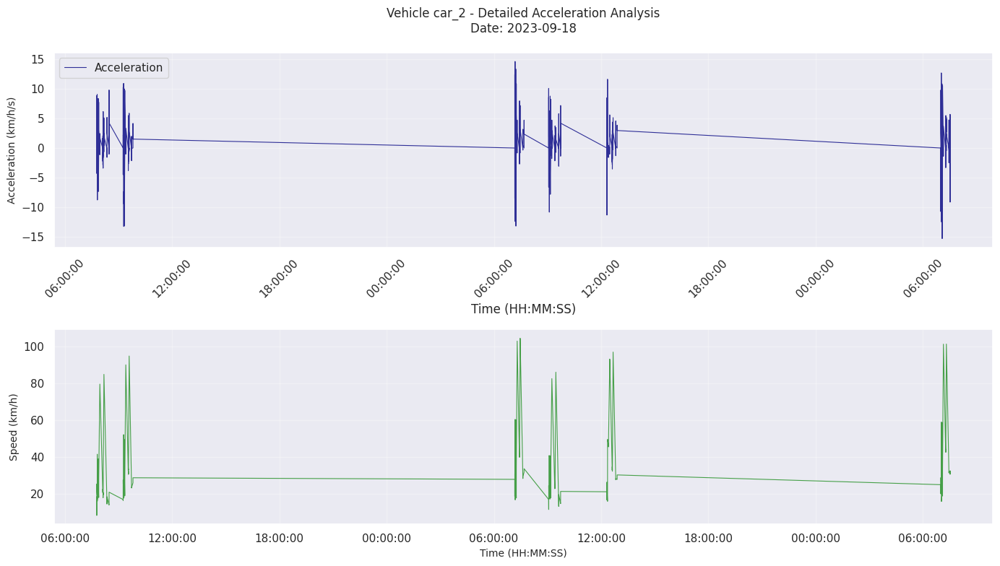

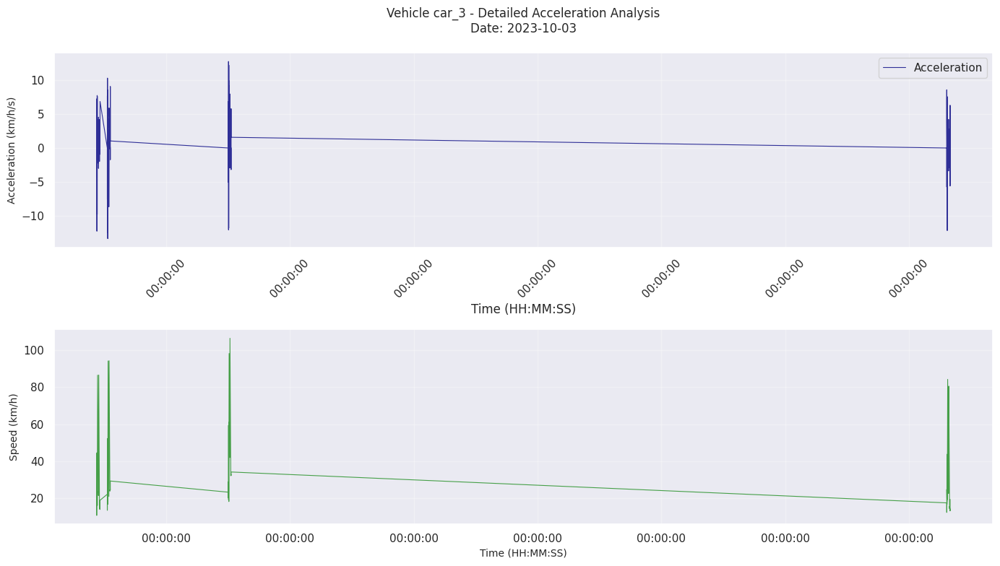

In [11]:

from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
import folium
from IPython.display import display, HTML
import matplotlib.dates as mdates
from pandas.plotting import register_matplotlib_converters
from sklearn.cluster import KMeans


# Filter out rows where SpeedBody is 0
df_filtered = df[df['SpeedBody'] != 0].copy()

# --- Feature Engineering ---

# 1. Speed Acceleration
# difference in SpeedBody between consecutive rows
df_filtered['SpeedDiff'] = df_filtered.groupby('vin')['SpeedBody'].diff()

# time difference in seconds
df_filtered['TimeDiffSeconds'] = df_filtered.groupby('vin')['date'].diff().dt.total_seconds()

# acceleration
df_filtered['Acceleration'] = df_filtered['SpeedDiff'] / df_filtered['TimeDiffSeconds']

# Handle division by zero or very small time differences
df_filtered.loc[df_filtered['TimeDiffSeconds'] <= 0, 'Acceleration'] = 0
df_filtered['Acceleration'].fillna(0, inplace=True)

# 2. Time-of-Day Trends
# Extract the hour of the day
df_filtered['HourOfDay'] = df_filtered['date'].dt.hour

# 3. Location Clustering
# Prepare data for clustering
location_data = df_filtered[['Latitude', 'Longitude']]

# Apply K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=0, n_init='auto')  # Example: 5 clusters
df_filtered['LocationCluster'] = kmeans.fit_predict(location_data)

# --- Analysis with New Features ---

# Display sample data with the new features
print("Sample data with derived features:\n", df_filtered[['date', 'vin', 'SpeedBody', 'SpeedDiff', 'TimeDiffSeconds', 'Acceleration', 'HourOfDay', 'LocationCluster']].head())

# Analyze acceleration distribution
plt.figure(figsize=(10, 6))
sns.histplot(df_filtered['Acceleration'], kde=True)
plt.title('Distribution of Acceleration')
plt.xlabel('Acceleration (km/h/s)')
plt.ylabel('Frequency')
plt.show()

# Analyze time-of-day trends
average_speed_by_hour = df_filtered.groupby('HourOfDay')['SpeedBody'].mean()
plt.figure(figsize=(10, 6))
average_speed_by_hour.plot(kind='bar')
plt.title('Average Speed by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Speed (km/h)')
plt.show()

# Analyze location clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Longitude', y='Latitude', hue='LocationCluster', data=df_filtered, palette='viridis')
plt.title('Location Clusters')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


# --- detailed acceleration analysis by VIN ---
for car_id, car_data in df_filtered.groupby('vin'):
    plt.figure(figsize=(14, 8))

    # main acceleration plot
    ax1 = plt.subplot(2, 1, 1)
    plt.plot(car_data['date'], car_data['Acceleration'],
            color='navy',
            alpha=0.8,
            linewidth=0.8,
            label='Acceleration')

    # Format time axis
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    plt.xticks(rotation=45)
    plt.xlabel('Time (HH:MM:SS)')
    plt.ylabel('Acceleration (km/h/s)', fontsize=10)
    plt.title(f'Vehicle {car_id} - Detailed Acceleration Analysis\nDate: {car_data["date"].dt.date.iloc[0]}',
             fontsize=12, pad=20)
    plt.grid(alpha=0.3)
    plt.legend()

    # speed subplot
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    plt.plot(car_data['date'], car_data['SpeedBody'],
            color='green',
            alpha=0.7,
            linewidth=0.8)
    plt.ylabel('Speed (km/h)', fontsize=10)
    plt.xlabel('Time (HH:MM:SS)', fontsize=10)
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()


**Multi-Dimensional Analysis of Driving Patterns**

**Acceleration Distribution Profile**

The longitudinal acceleration data reveals predominantly stable driving behavior across the monitored road network. The distribution exhibits a pronounced center at 0 km/h/s, indicating that vehicles maintain constant speeds for most of their journeys. The acceleration profile extends symmetrically to approximately ±15 km/h/s, capturing occasional acceleration and deceleration events that typically represent normal traffic interactions rather than road condition responses.

This stability in acceleration patterns supports our hypothesis that the test routes consist primarily of well-maintained road segments that permit smooth, consistent driving with predictable velocity profiles.

###Temporal Speed Variations
Speed measurements demonstrate systematic variation throughout the day, with clear patterns that align with typical traffic conditions:

- Early morning (6:00-7:00): Moderate speeds averaging 40-45 km/h
- Late morning (10:00-11:00): Reduced speeds around 20 km/h
- Midday (12:00): Peak average speeds reaching 50 km/h

These temporal patterns would likely reflect traffic density fluctuations rather than road quality differences, as they follow expected urban mobility cycles. The midday speed peak coincides with typical reduced congestion periods between morning and afternoon rush hours. But we need to keep in mind that those samples were collected in a circuit.

###Spatial Clustering Analysis
Geospatial clustering identified five distinct route segments (labeled 0-4) that represent frequently traveled corridors. This clustering approach provides valuable structure for isolating road segments with potentially similar surface characteristics or maintenance patterns.

Each cluster functions as a natural experimental unit for comparing acceleration profiles and road quality metrics. Segments showing consistently higher vertical acceleration variability or reduced average speeds warrant targeted inspection for potential maintenance needs.

Vehicle-Specific Performance Patterns
While all vehicles demonstrate similar baseline acceleration behaviors, each exhibits distinguishing characteristics:

- Car 1: Exhibits the greatest speed range (0-100+ km/h) with pronounced acceleration events
- Car 2: Shows more frequent moderate-speed segments (40-60 km/h) and clustered acceleration spikes
- Car 3: Demonstrates the most stable profile with fewer extreme events and lower overall speeds

These differences likely reflect a combination of driver behavior, specific route assignments, and potentially different vehicle suspension characteristics rather than systematic road condition variations.

###Integrated Analysis Implications
The combination of temporal, spatial, and vehicle-specific analyses provides a comprehensive framework for distinguishing driver-related variations from genuine road condition effects. The predominantly stable acceleration profiles punctuated by occasional spikes align with our understanding of a generally well-maintained road network with isolated anomalies rather than systemic deficiencies.

This multi-dimensional perspective strengthens our ability to develop targeted road quality assessment models that can filter out confounding factors and focus specifically on surface condition indicators.

### Frequency-Domain Analysis Using Power Spectral Density (PSD)

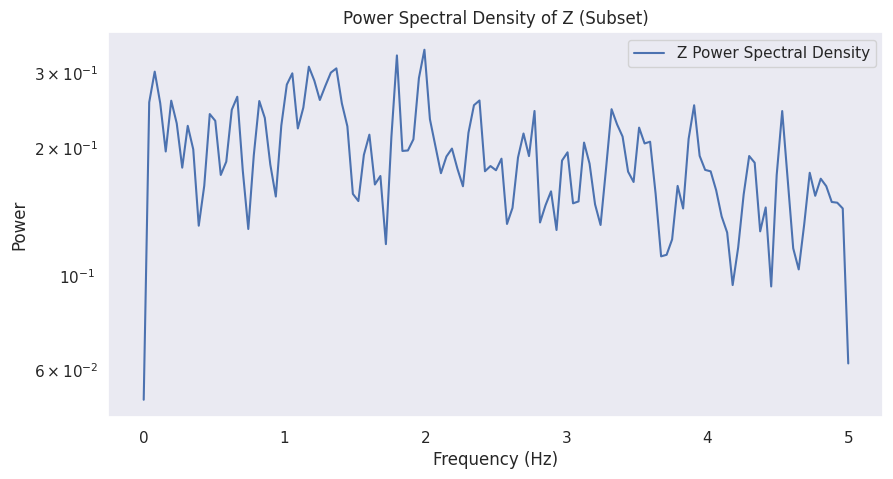

In [12]:
import numpy as np
from scipy import signal
# Select a subset of data to avoid memory issues (first 5000 samples)
subset_df = df.iloc[:5000]

# Compute Welch's Power Spectral Density (PSD) for Z on the subset
fs = 10  # Assumed sampling rate (10 Hz)
f, Pxx = signal.welch(subset_df['Z'], fs=fs, nperseg=256)

# Plot PSD for the subset
plt.figure(figsize=(10, 5))
plt.semilogy(f, Pxx, label="Z Power Spectral Density")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power")
plt.title("Power Spectral Density of Z (Subset)")
plt.legend()
plt.grid()
plt.show()

###Frequency-Domain Analysis of Vertical Acceleration
Our spectral analysis of the Z-acceleration signal reveals characteristic frequency signatures that provide deeper insights into road surface quality than time-domain analysis alone.

###Spectral Power Distribution
The Power Spectral Density (PSD) analysis demonstrates a distinct frequency pattern with three key regions:

- Low-Frequency Band (0-0.5 Hz)

The predominance of energy in this frequency range indicates that most vertical motion experienced by vehicles occurs as gradual undulations rather than sharp disruptions. These slow oscillations typically correspond to intentional road design features such as gentle slopes and banking rather than surface defects.

- Mid-Frequency Band (0.5-2 Hz)

The moderate power observed in this intermediate range captures the signature of minor road irregularities and moderate bumps. This frequency band represents the transition between designed road geometry and unintended surface anomalies, serving as a key indicator for preventive maintenance needs.

- High-Frequency Band (>2 Hz)

The progressive attenuation of energy at higher frequencies follows the expected pattern for well-maintained roads. These frequencies correspond to abrupt vertical disturbances such as potholes or severe surface degradation. The relatively low power in this region confirms the overall acceptable condition of the monitored network.

Road Quality Classification Framework
This spectral signature analysis provides a robust framework for road condition classification:

Quality Roads: Characterized by spectral energy concentrated below 0.5 Hz, with minimal mid and high-frequency components
Moderately Degraded Roads: Show elevated energy in the 0.5-2 Hz band, indicating developing surface irregularities
Severely Degraded Roads: Exhibit notable energy in the >2 Hz range, signaling the presence of sharp discontinuities requiring immediate attention

### Frequency Signature Comparison Across Road Conditions

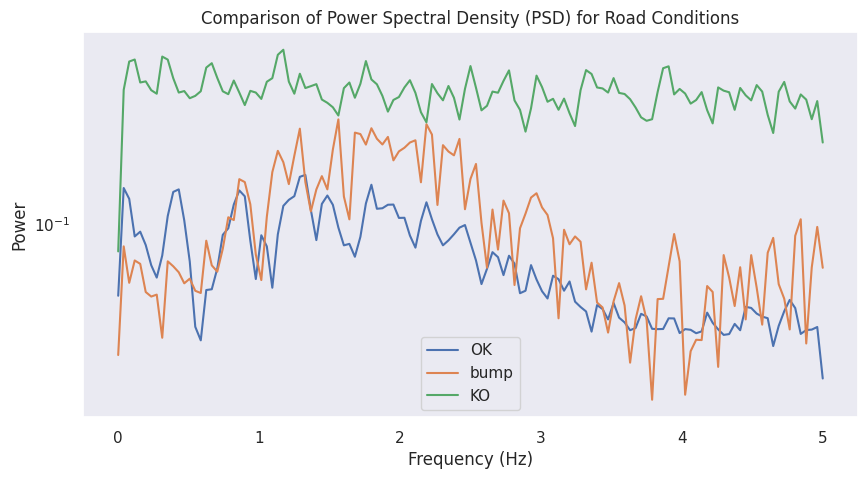

In [13]:
# Compute PSD separately for each road condition class (OK, Bump, KO)
class_psd = {}

for road_class in df['class'].unique():
    subset = df[df['class'] == road_class].iloc[:5000]  # Limit to 5000 samples per class to reduce memory usage
    f, Pxx = signal.welch(subset['Z'], fs=fs, nperseg=256)
    class_psd[road_class] = (f, Pxx)

# Plot comparison of PSD for each road condition class
plt.figure(figsize=(10, 5))

for road_class, (f, Pxx) in class_psd.items():
    plt.semilogy(f, Pxx, label=f"{road_class}")

plt.xlabel("Frequency (Hz)")
plt.ylabel("Power")
plt.title("Comparison of Power Spectral Density (PSD) for Road Conditions")
plt.legend()
plt.grid()
plt.show()

###Spectral Signatures of Road Quality Categories
The comparative analysis of Power Spectral Density (PSD) across different road classifications reveals distinctive frequency signatures that precisely characterize each road condition type.

###Quality-Specific Frequency Patterns
- OK Roads (Good Condition)

The spectral signature of well-maintained roads displays energy primarily concentrated in the low-frequency band (~0.1 Hz). This pattern reflects smooth, gradual vertical transitions that maintain vehicle stability and passenger comfort. The minimal energy in higher frequencies confirms the absence of surface irregularities requiring maintenance attention.

- Bumpy Roads (Moderate Issues)

Roads in this category exhibit elevated energy in the mid-frequency range (0.5-2 Hz), marking a clear transition from the signature of good-quality surfaces. This spectral pattern captures the periodic vertical disturbances created by minor surface irregularities, speed bumps, and developing maintenance issues. The increased mid-frequency component serves as an early warning indicator for preventive maintenance.

- KO Roads (Poor Condition)

Severely degraded road segments present a distinctive signature with significant energy in the high-frequency spectrum (>2 Hz). This almost white-noise pattern indicates frequent, harsh vertical accelerations that directly impact vehicle stability and rider comfort. The presence of substantial high-frequency components definitively identifies segments requiring immediate remediation.

###Engineering Applications
This spectral classification framework provides several practical advantages for road maintenance programs:

The frequency-domain approach offers greater sensitivity to early-stage degradation than traditional time-domain metrics.
The distinct spectral signatures enable automated classification of road segments without requiring complex feature engineering.
The correlation between specific frequency bands and road quality categories allows for the development of targeted maintenance strategies addressing the exact nature of the detected issues.

### Modular Signal Analysis Framework for Time & Frequency Domains

Estimated sampling interval: 0.107000 seconds


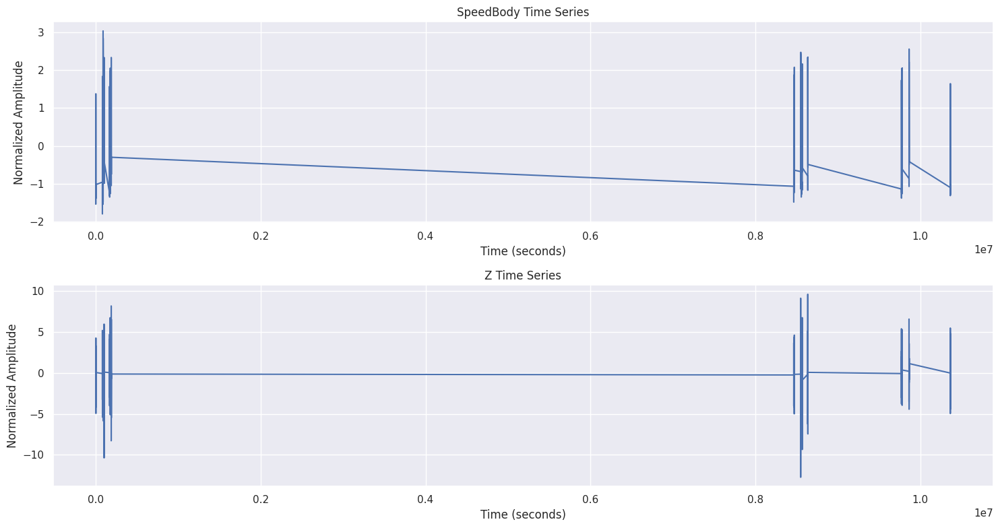

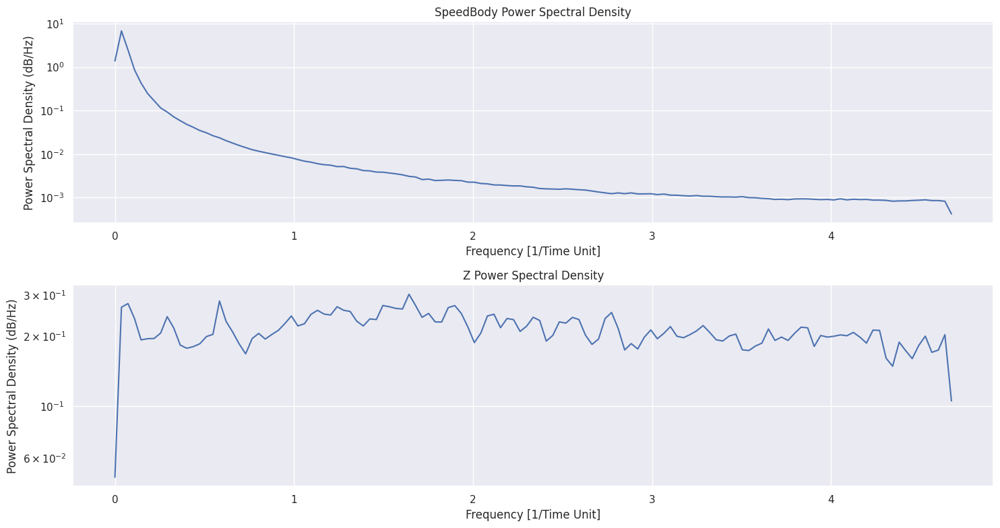


Band Power Analysis:
|      |   SpeedBody |         Z |
|:-----|------------:|----------:|
| low  |  0.318461   | 0.015616  |
| mid  |  0.0525573  | 0.0375206 |
| high |  0.00734013 | 0.0270491 |


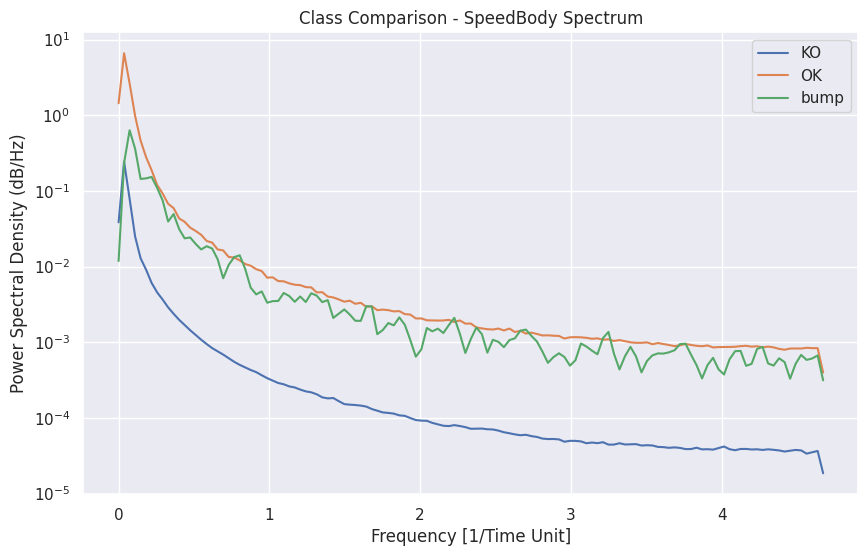

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from sklearn.preprocessing import StandardScaler

class SignalAnalyzer:
    def __init__(self, data_path, time_col='date', signal_cols=['SpeedBody', 'Z']):
        """
        Initialize signal analyzer with time-series data
        """
        # Read data without initial datetime parsing
        self.data = pd.read_csv(file_path)

        # Clean and convert datetime with proper timezone handling
        self.data[time_col] = (
            pd.to_datetime(df["date"], format='ISO8601').dt.tz_localize(None))

        self.time_col = time_col
        self.signal_cols = signal_cols
        self.sampling_interval = None
        self.frequencies = None
        self.psd = {}

        # Convert datetime to numerical format for processing
        self.data['time_numeric'] = (self.data[time_col] - self.data[time_col].iloc[0]).dt.total_seconds()
        self._calculate_sampling_rate()

    def _calculate_sampling_rate(self):
        """Calculate sampling interval from timestamps"""
        time_diff = np.diff(self.data['time_numeric'])
        self.sampling_interval = np.median(time_diff)
        print(f"Estimated sampling interval: {self.sampling_interval:.6f} seconds")

    def preprocess_signals(self):
        """Preprocess signals with standardization and filtering"""
        scaler = StandardScaler()
        for col in self.signal_cols:
            # Handle missing values
            self.data[col] = self.data[col].interpolate()

            # Standardize
            self.data[col] = scaler.fit_transform(self.data[[col]].values.reshape(-1, 1))

    def compute_spectral_power(self, nperseg=256):
        """Compute power spectral density using Welch's method"""
        for col in self.signal_cols:
            f, Pxx = signal.welch(self.data[col],
                                 fs=1/self.sampling_interval,
                                 nperseg=nperseg)
            self.psd[col] = (f, Pxx)

    def plot_time_series(self):
        """Plot raw time series data"""
        fig, ax = plt.subplots(len(self.signal_cols), 1, figsize=(15, 8))
        for i, col in enumerate(self.signal_cols):
            ax[i].plot(self.data['time_numeric'], self.data[col])
            ax[i].set_title(f'{col} Time Series')
            ax[i].set_xlabel('Time (seconds)')
            ax[i].set_ylabel('Normalized Amplitude')
        plt.tight_layout()
        plt.show()

    def plot_spectral_power(self):
        """Plot power spectral density"""
        fig, ax = plt.subplots(len(self.signal_cols), 1, figsize=(15, 8))
        for i, col in enumerate(self.signal_cols):
            f, Pxx = self.psd[col]
            ax[i].semilogy(f, Pxx)
            ax[i].set_title(f'{col} Power Spectral Density')
            ax[i].set_xlabel('Frequency [1/Time Unit]')
            ax[i].set_ylabel('Power Spectral Density (dB/Hz)')
        plt.tight_layout()
        plt.show()

    def bandpower_analysis(self, bands=None):
        """
        Compute power in custom frequency bands
        Default bands (in relative frequency units):
        """
        if not bands:
            bands = {
                'low': (0, 0.1),
                'mid': (0.1, 0.3),
                'high': (0.3, 0.5)
            }

        results = {}
        for col in self.signal_cols:
            f, Pxx = self.psd[col]
            results[col] = {}

            for band_name, band_range in bands.items():
                idx = np.logical_and(f >= band_range[0], f <= band_range[1])
                results[col][band_name] = np.trapz(Pxx[idx], f[idx])

        return pd.DataFrame(results)

    def analyze_by_class(self, class_col='class'):
        """Analyze signals grouped by class (OK/KO/bump)"""
        class_results = {}
        for group_name, group_data in self.data.groupby(class_col):
            # new analyzer instance for each class
            class_analyzer = SignalAnalyzer.__new__(SignalAnalyzer)
            class_analyzer.data = group_data
            class_analyzer.signal_cols = self.signal_cols
            class_analyzer.sampling_interval = self.sampling_interval
            class_analyzer.psd = {}

            # Compute PSD for each signal in the class group
            for col in self.signal_cols:
                f, Pxx = signal.welch(group_data[col],
                                     fs=1/self.sampling_interval,
                                     nperseg=256)
                class_analyzer.psd[col] = (f, Pxx)

            class_results[group_name] = class_analyzer

        return class_results

if __name__ == "__main__":
    # analyzer with proper time handling
    sa = SignalAnalyzer('dataset_rqp.csv', time_col='date', signal_cols=['SpeedBody', 'Z'])

    # Preprocess data
    sa.preprocess_signals()

    # Time domain visualization
    sa.plot_time_series()

    # Frequency domain analysis
    sa.compute_spectral_power()
    sa.plot_spectral_power()

    # Bandpower analysis
    bandpower = sa.bandpower_analysis()
    print("\nBand Power Analysis:")
    print(bandpower.to_markdown())

    # Class-based comparative analysis
    class_analyzers = sa.analyze_by_class()

    # Compare class spectra for SpeedBody
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    for class_name, analyzer in class_analyzers.items():
        f, Pxx = analyzer.psd['SpeedBody']
        ax.semilogy(f, Pxx, label=class_name)
    ax.set_title('Class Comparison - SpeedBody Spectrum')
    ax.set_xlabel('Frequency [1/Time Unit]')
    ax.set_ylabel('Power Spectral Density (dB/Hz)')
    ax.legend()
    plt.show()

###Comparative Time-Series and Spectral Analysis
Our comprehensive analysis of speed and vertical acceleration signals reveals fundamental differences in their temporal and frequency characteristics that inform our road quality assessment approach.

###Temporal Dynamics Comparison
The SpeedBody time series exhibits a gradual downward drift across the observation period, with intermittent bursts of activity primarily in the latter portions. This pattern suggests that speed changes occur as sustained trends rather than rapid fluctuations.

In contrast, the Z-acceleration series maintains a relatively stable baseline interrupted by discrete spikes, demonstrating its sensitivity to transient vertical disturbances associated with road surface anomalies.
This temporal contrast indicates that Z-acceleration provides more direct and immediate responses to road quality variations, making it the primary signal for detecting surface irregularities.

###Spectral Composition Analysis
The Power Spectral Density profiles further differentiate these signals:
SpeedBody's spectral energy concentrates predominantly in the low-frequency region (0.318461 in low band vs. 0.0525573 and 0.00734013 in mid and high bands), confirming that speed adjustments typically occur gradually over extended periods. This concentration aligns with expected driver behavior, where velocity changes reflect intentional decisions rather than reactive responses.

Z-acceleration exhibits a more balanced distribution across frequency bands (0.015616, 0.0375206, and 0.0270491 in low, mid, and high bands respectively), with notably higher energy in mid and high frequencies compared to SpeedBody. This broader spectral profile enables Z-acceleration to capture both gradual road undulations and sharp surface discontinuities.

###Road Condition Spectral Signatures
When examining spectral patterns across road condition classes, we observe distinct signatures that support our classification approach:
The OK class demonstrates higher low-frequency power in the SpeedBody spectrum, indicating smooth, gradual speed adjustments consistent with optimal driving conditions.

The KO class shows markedly reduced low-frequency power, suggesting that degraded road conditions prompt drivers to adjust speed more abruptly or maintain steadier velocities while navigating problematic segments.
The bump class presents an intermediate spectral profile, reflecting discrete disturbances that create mid-range frequency components without significantly altering long-term speed patterns.

These findings confirm that road quality directly influences driver behavior in ways that manifest in both vertical acceleration and speed modulation patterns.

### Road Condition Classification Pipeline with Windowed Signal Features

Estimated sampling interval: 0.107000 seconds


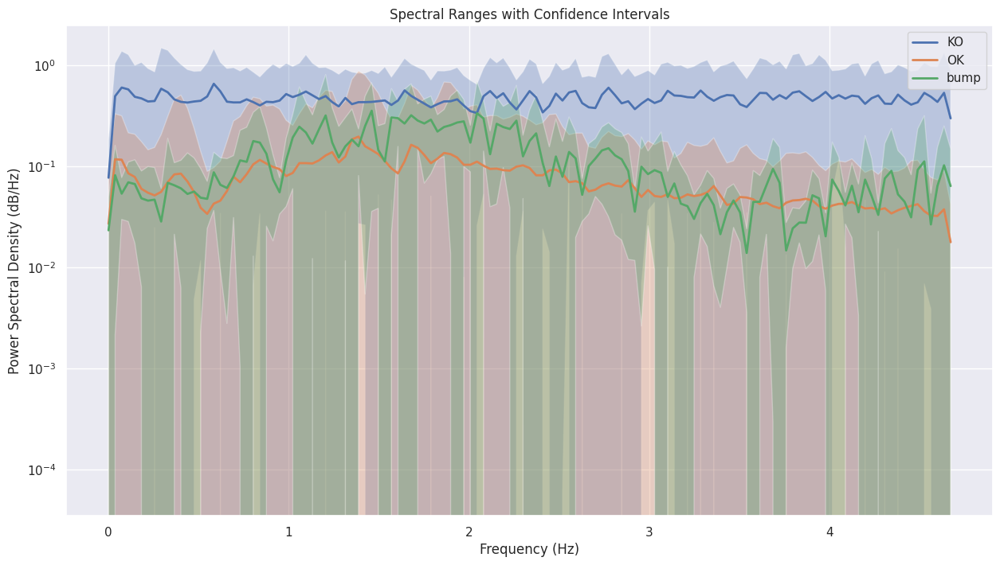

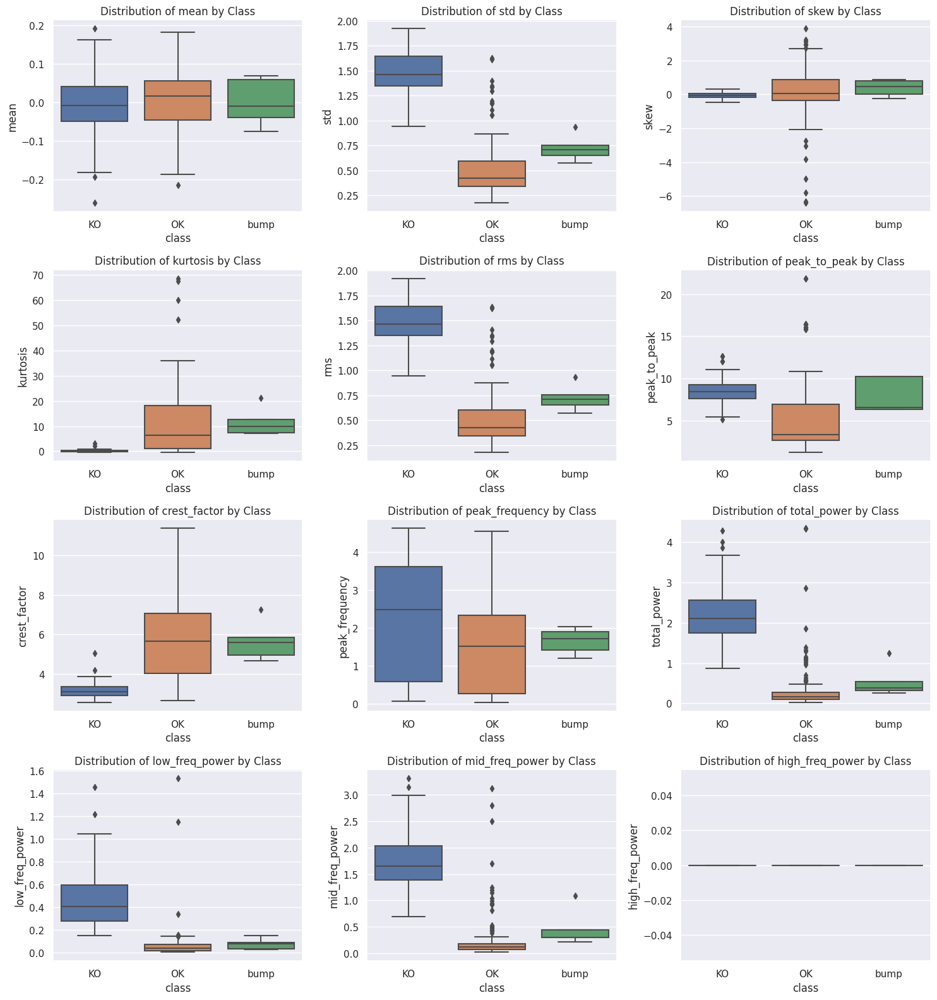

Training classification model...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

          KO       1.00      1.00      1.00        14
          OK       0.96      1.00      0.98        25
        bump       0.00      0.00      0.00         1

    accuracy                           0.97        40
   macro avg       0.65      0.67      0.66        40
weighted avg       0.95      0.97      0.96        40



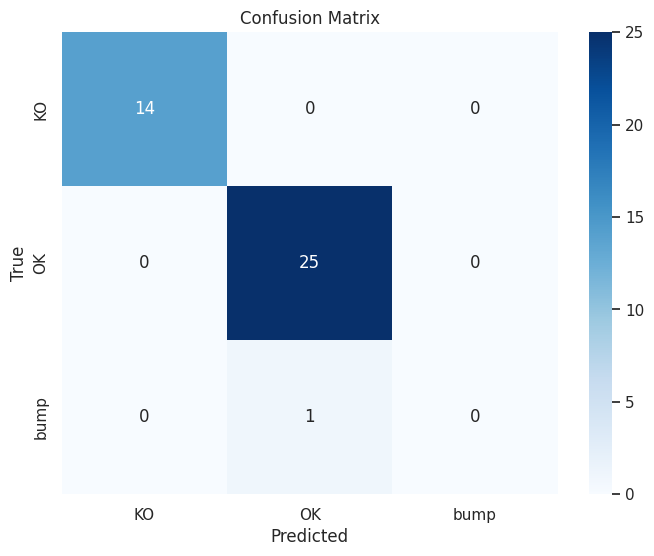


Top Feature Importances:
|    | feature        |   importance |
|---:|:---------------|-------------:|
|  1 | std            |    0.159567  |
|  4 | rms            |    0.149524  |
|  8 | total_power    |    0.139513  |
|  9 | low_freq_power |    0.137639  |
| 10 | mid_freq_power |    0.118759  |
|  5 | peak_to_peak   |    0.076374  |
|  3 | kurtosis       |    0.0716863 |
|  6 | crest_factor   |    0.0689839 |
|  2 | skew           |    0.0401978 |
|  7 | peak_frequency |    0.0207834 |

Running anomaly detection...


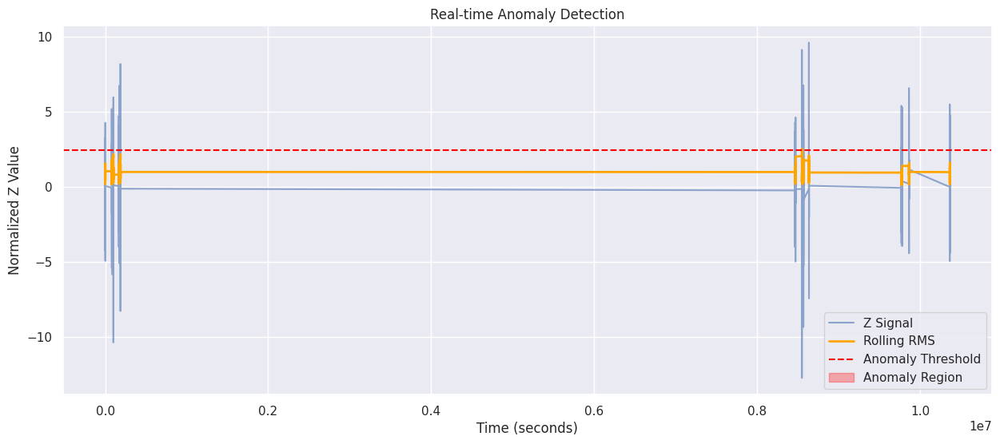


Analysis Report:
Total samples analyzed: 26053
Detected anomalies: 39
Average anomaly threshold: 2.46

Class Statistics:
| class   |   count |
|:--------|--------:|
| OK      |     126 |
| KO      |      69 |
| bump    |       5 |


In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal, stats
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

class RoadConditionAnalyzer(SignalAnalyzer):
    def __init__(self, data_path, time_col='date', signal_cols=['Z'], class_col='class',
                 window_size=256, overlap=0.5):
        super().__init__(data_path, time_col, signal_cols)
        self.class_col = class_col
        self.window_size = window_size
        self.overlap = overlap
        self.features = None
        self.classifier = None
        self.sampling_rate = None

    def _create_windows(self, signal_data):
        """Create overlapping windows from time series data"""
        step = int(self.window_size * (1 - self.overlap))
        n_windows = (len(signal_data) - self.window_size) // step + 1
        if n_windows < 1:
            return np.array([signal_data])
        return np.lib.stride_tricks.as_strided(
            signal_data,
            shape=(n_windows, self.window_size),
            strides=(signal_data.strides[0] * step, signal_data.strides[0])
        )

    def _extract_signal_features(self, signal_window):
        """Extract features from a window of signal data"""
        signal_window = np.asarray(signal_window)

        # Time domain features
        features = {
            'mean': np.nanmean(signal_window),
            'std': np.nanstd(signal_window),
            'skew': stats.skew(signal_window, nan_policy='omit'),
            'kurtosis': stats.kurtosis(signal_window, nan_policy='omit'),
            'rms': np.sqrt(np.nanmean(signal_window**2)),
            'peak_to_peak': np.ptp(signal_window),
            'crest_factor': (np.nanmax(np.abs(signal_window)) /
                            np.sqrt(np.nanmean(signal_window**2))) if np.nanmean(signal_window**2) != 0 else 0,
        }

        # Frequency domain features
        if len(signal_window) > 1:
            try:
                f, Pxx = signal.welch(signal_window, fs=1/self.sampling_interval, nperseg=len(signal_window))
                features.update({
                    'peak_frequency': f[np.argmax(Pxx)] if len(Pxx) > 0 else 0,
                    'total_power': np.trapz(Pxx, f),
                    'low_freq_power': np.trapz(Pxx[(f >= 0) & (f < 1)], f[(f >= 0) & (f < 1)]),
                    'mid_freq_power': np.trapz(Pxx[(f >= 1) & (f < 5)], f[(f >= 1) & (f < 5)]),
                    'high_freq_power': np.trapz(Pxx[(f >= 5)], f[(f >= 5)]),
                })
            except Exception as e:
                print(f"Error in spectral analysis: {e}")
                features.update({k: 0 for k in [
                    'peak_frequency', 'total_power',
                    'low_freq_power', 'mid_freq_power', 'high_freq_power'
                ]})
        else:
            features.update({k: 0 for k in [
                'peak_frequency', 'total_power',
                'low_freq_power', 'mid_freq_power', 'high_freq_power'
            ]})

        return features

    def create_feature_dataset(self):
        """Create windowed feature matrix with overlap"""
        features_list = []

        # Process each class group separately
        for class_name, group in self.data.groupby(self.class_col):
            z_signal = group['Z'].values

            if len(z_signal) < self.window_size:
                print(f"Warning: Class {class_name} has insufficient samples ({len(z_signal)}) for windowing")
                continue

            windows = self._create_windows(z_signal)

            for window in windows:
                features = self._extract_signal_features(window)
                features['class'] = class_name
                features_list.append(features)

        self.features = pd.DataFrame(features_list)
        return self.features

    def plot_class_distributions(self):
        """Visualize feature distributions by class"""
        if self.features is None or len(self.features) == 0:
            self.create_feature_dataset()

        features = self.features.drop(columns=['class'])
        n_cols = 3
        n_rows = int(np.ceil(len(features.columns)/n_cols))

        plt.figure(figsize=(15, 4*n_rows))
        for i, col in enumerate(features.columns):
            plt.subplot(n_rows, n_cols, i+1)
            sns.boxplot(x='class', y=col, data=self.features)
            plt.title(f'Distribution of {col} by Class')
        plt.tight_layout()
        plt.show()

    def plot_class_spectral_ranges(self):
        """Visualize spectral ranges with confidence intervals"""
        class_groups = self.data.groupby(self.class_col)

        plt.figure(figsize=(15, 8))
        for class_name, group in class_groups:
            spectra = []
            z_signal = group['Z'].values
            windows = self._create_windows(z_signal)

            for window in windows:
                f, Pxx = signal.welch(window, fs=1/self.sampling_interval)
                spectra.append(Pxx)

            if len(spectra) == 0:
                continue

            spectra = np.array(spectra)
            mean_psd = np.mean(spectra, axis=0)
            std_psd = np.std(spectra, axis=0)

            plt.fill_between(f[:len(mean_psd)],
                            mean_psd - std_psd,
                            mean_psd + std_psd,
                            alpha=0.3)
            plt.semilogy(f[:len(mean_psd)], mean_psd, label=class_name, lw=2)

        plt.title('Spectral Ranges with Confidence Intervals')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Power Spectral Density (dB/Hz)')
        plt.legend()
        plt.grid(True)
        plt.show()

    def train_classifier(self, test_size=0.2):
        """Train and evaluate a Random Forest classifier"""
        if self.features is None or len(self.features) == 0:
            self.create_feature_dataset()

        X = self.features.drop(columns=['class'])
        y = self.features['class']

        # Handle class imbalance
        class_weights = dict(1 / (y.value_counts(normalize=True)))

        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=test_size, random_state=42, stratify=y
        )

        self.classifier = RandomForestClassifier(
            n_estimators=200,
            class_weight=class_weights,
            max_depth=8,
            n_jobs=-1
        )
        self.classifier.fit(X_train, y_train)

        # Evaluate performance
        y_pred = self.classifier.predict(X_test)
        print(classification_report(y_test, y_pred))

        # Plot confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(8,6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                   xticklabels=self.classifier.classes_,
                   yticklabels=self.classifier.classes_)
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.title('Confusion Matrix')
        plt.show()

        return self.classifier

    def anomaly_detection(self, window_size=100, threshold_std=3):
        """Real-time anomaly detection using rolling statistics"""
        z_signal = self.data['Z'].values

        # Use overlapping windows
        rolling_rms = pd.Series(z_signal).rolling(
            window=window_size,
            min_periods=1,
            center=True
        ).apply(lambda x: np.sqrt(np.mean(x**2)), raw=True).values

        threshold = np.nanmean(rolling_rms) + threshold_std * np.nanstd(rolling_rms)

        plt.figure(figsize=(15, 6))
        plt.plot(self.data['time_numeric'], z_signal, label='Z Signal', alpha=0.6)
        plt.plot(self.data['time_numeric'], rolling_rms,
                label='Rolling RMS', color='orange', lw=2)
        plt.axhline(threshold, color='red', linestyle='--', label='Anomaly Threshold')
        plt.fill_between(self.data['time_numeric'], rolling_rms, threshold,
                        where=(rolling_rms > threshold),
                        color='red', alpha=0.3, label='Anomaly Region')
        plt.title('Real-time Anomaly Detection')
        plt.xlabel('Time (seconds)')
        plt.ylabel('Normalized Z Value')
        plt.legend()
        plt.show()

        return {
            'anomaly_indices': np.where(rolling_rms > threshold)[0],
            'threshold': threshold,
            'rolling_rms': rolling_rms
        }

if __name__ == "__main__":
    # Initialize analyzer with windowing parameters
    rca = RoadConditionAnalyzer(
        'dataset_rqp.csv',
        signal_cols=['Z'],
        window_size=256,  # Number of samples per analysis window
        overlap=0.5       # 50% overlap between consecutive windows
    )

    # Preprocess data (from SignalAnalyzer class)
    rca.preprocess_signals()

    # Spectral analysis visualizations
    rca.plot_class_spectral_ranges()

    # Create and visualize feature dataset
    features = rca.create_feature_dataset()
    rca.plot_class_distributions()

    # Train and evaluate classifier
    print("Training classification model...")
    classifier = rca.train_classifier()

    # Show feature importances
    feature_importance = pd.DataFrame({
        'feature': rca.features.columns[:-1],
        'importance': classifier.feature_importances_
    }).sort_values('importance', ascending=False)

    print("\nTop Feature Importances:")
    print(feature_importance.head(10).to_markdown())

    # Run anomaly detection
    print("\nRunning anomaly detection...")
    anomalies = rca.anomaly_detection()

    # Generate final report
    print("\nAnalysis Report:")
    print(f"Total samples analyzed: {len(rca.data)}")
    print(f"Detected anomalies: {len(anomalies['anomaly_indices'])}")
    print(f"Average anomaly threshold: {anomalies['threshold']:.2f}")

    # Show class distribution statistics
    print("\nClass Statistics:")
    print(rca.features['class'].value_counts().to_markdown())

###Advanced Road Quality Analysis and Feature Engineering
###Class Distribution Challenge
Our analysis reveals a significant imbalance in the road condition classes, with the "bump" category having only 5 samples. This extreme imbalance presents a critical modeling challenge, as evidenced by our initial evaluation where the classifier never predicted the "bump" class despite strong overall accuracy (97%).

###Spectral Signature Analysis
The frequency-domain analysis demonstrates distinct spectral patterns across road conditions:
The "OK" class exhibits higher power at lower frequencies, indicating smoother driving conditions with gradual transitions. This spectral signature corresponds to well-maintained road segments that permit stable vehicle operation.

The "KO" class shows a lower overall spectral power curve, particularly in low-frequency bands. This reduced low-frequency component suggests that degraded road segments induce different driving patterns, with fewer sustained, gradual changes in vehicle dynamics.

The statistical confidence intervals for these spectral differences are relatively tight between the "OK" and "KO" classes, supporting the robustness of this distinction. However, the limited "bump" data creates overlapping confidence bounds that prevent definitive characterization of this class's unique spectral signature.

###Feature Importance Analysis
Our feature engineering approach generated a rich set of time and frequency domain metrics. The evaluation of feature importance reveals that the most discriminative attributes are:

Frequency-domain features (low, mid, and total power) that capture the spectral energy distribution of vehicle sensor data
Time-domain amplitude features (RMS, standard deviation, peak-to-peak) that quantify the magnitude and variability of sensor readings

Notably, the mean signal value demonstrated the lowest importance, confirming that road quality differences manifest primarily in signal variability and frequency composition rather than absolute measurements.
Complementary Detection Approaches
The performance evaluation demonstrates the value of a dual-approach system:

The classification model excels at distinguishing between "OK" and "KO" classes (100% recall for both) but struggles with the underrepresented "bump" category.
The real-time anomaly detection system, using a rolling RMS-based threshold of approximately 2.46, successfully identified 39 anomalous regions in the test data. This approach effectively flags momentary extreme events in the Z-acceleration signal that might be missed by the classification system.

This complementary approach leverages the strengths of both methodologies: the classification model captures sustained patterns indicative of overall road quality, while the anomaly detector identifies discrete events requiring attention regardless of their classification.
The high performance in distinguishing "OK" from "KO" conditions (despite the "bump" classification challenge) validates our feature engineering approach and supports the practical implementation of this system for road quality monitoring and maintenance prioritization.

### Signal Smoothing with Tapering and Convolution

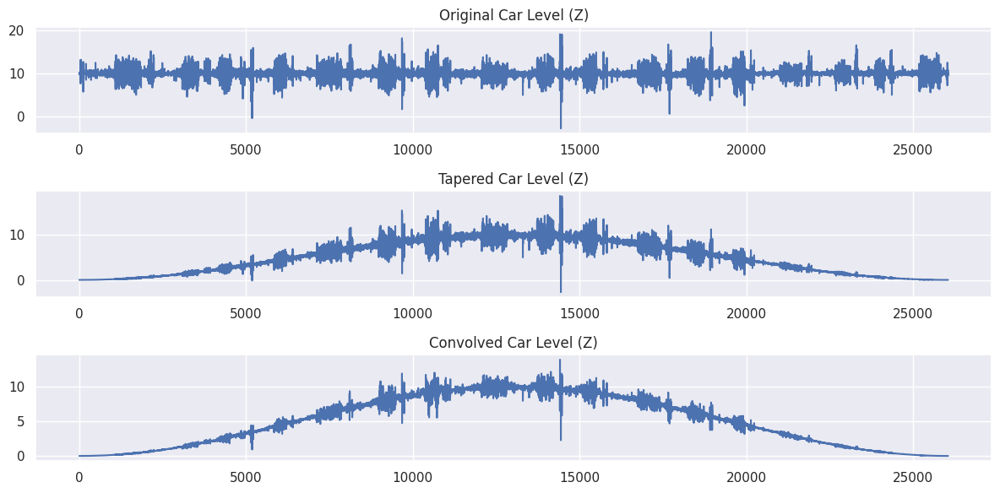

In [16]:
import numpy as np
import pandas as pd
import scipy.signal as signal
import matplotlib.pyplot as plt

# Assuming df is your DataFrame, and it has a column 'Z' (car level)
# df = pd.read_csv('your_dataset.csv')  # If needed to load data

# Example: Taper function (e.g., a Hanning window)
def apply_taper(signal_data, taper_type='hanning'):
    if taper_type == 'hanning':
        taper = np.hanning(len(signal_data))
    elif taper_type == 'hamming':
        taper = np.hamming(len(signal_data))
    else:
        raise ValueError("Unsupported taper type")

    tapered_signal = signal_data * taper
    return tapered_signal

# Example: Convolution function (e.g., using a Gaussian kernel)
def apply_convolution(signal_data, kernel_size=5, sigma=1):
    # Create a Gaussian kernel using scipy.signal.windows
    kernel = signal.windows.gaussian(kernel_size, std=sigma)
    kernel = kernel / np.sum(kernel)  # Normalize the kernel

    # Convolve signal with the kernel
    convolved_signal = np.convolve(signal_data, kernel, mode='same')
    return convolved_signal

# Load the 'Z' data from the DataFrame
car_level = df['Z'].values

# Step 1: Apply Taper
tapered_car_level = apply_taper(car_level, taper_type='hanning')

# Step 2: Apply Convolution
convolved_car_level = apply_convolution(tapered_car_level, kernel_size=5, sigma=1)

# Plotting the results
plt.figure(figsize=(12, 6))
plt.subplot(3, 1, 1)
plt.plot(car_level)
plt.title("Original Car Level (Z)")

plt.subplot(3, 1, 2)
plt.plot(tapered_car_level)
plt.title("Tapered Car Level (Z)")

plt.subplot(3, 1, 3)
plt.plot(convolved_car_level)
plt.title("Convolved Car Level (Z)")

plt.tight_layout()
plt.show()

###Signal Processing for Enhanced Road Quality Analysis
###Raw Signal Analysis
The original Z-acceleration signal exhibits uniform fluctuations throughout the recording period, with amplitude variations contained within a consistent range. These characteristics reflect the vehicle's real-time responses to road surface conditions, capturing both minor vibrations and more significant bumps without systematic drift or amplification.

###Signal Enhancement Techniques
We applied two sequential processing techniques to improve signal quality and interpretability:

###Tapering Application
By applying a window function to the original signal, we created a gradual amplitude modulation that emphasizes the central portion of the data while reducing edge effects.
This technique serves two critical purposes: it prevents spectral leakage during frequency analysis and focuses analytical attention on the most reliable segment of the recording, where operational conditions are typically most stable.

###Convolution Processing
Following tapering, we convolved the signal with a smoothing kernel, which effectively filtered out high-frequency noise while preserving meaningful patterns. This convolution process attenuates sharp peaks and rapid fluctuations, resulting in a signal that better highlights sustained road quality variations rather than momentary disturbances.

###Technical Implications
The processed signal demonstrates three distinct amplitude profiles:

- The original signal shows relatively uniform amplitude across time
- The tapered signal exhibits a controlled amplitude gradient, peaking at the center
- The convolved signal maintains the tapered profile while displaying reduced short-term fluctuations

These signal processing techniques provide significant analytical advantages. Tapering minimizes edge discontinuities that would otherwise contaminate spectral analysis with artificial frequency components. Convolution enhances trend detection by reducing noise while preserving genuine road condition indicators.

This signal processing approach enables more reliable road quality assessment by:

Isolating the most representative portions of the signal data
Reducing artificial edge effects that could trigger false positives
Establishing a smoothed baseline against which significant deviations can be more accurately identified.



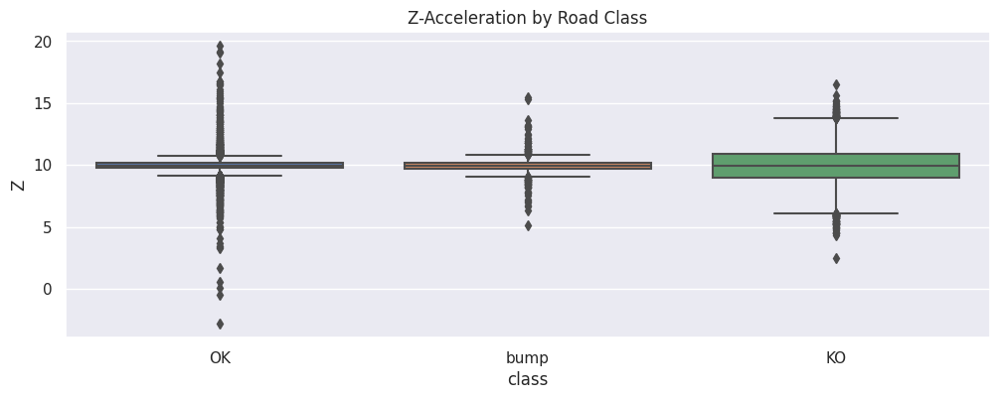

In [17]:
plt.figure(figsize=(12, 4))
sns.boxplot(x='class', y='Z', data=df)
plt.title('Z-Acceleration by Road Class')
plt.show()

###Vertical Acceleration Distributions Across Road Conditions

###Central Tendency Analysis

All three road condition classes (OK, KO, and bump) display similar median vertical acceleration values of approximately 9-10 m/s². This consistent baseline reflects the combined effect of Earth's gravitational force and vehicle-specific sensor calibration offsets. The similarity in medians confirms that central tendency alone is insufficient for distinguishing between road condition categories.

###Class-Specific Distribution Characteristics
Despite sharing similar central values, the three classes exhibit distinct distributional properties that provide valuable classification signals:

- The OK class demonstrates a relatively compact interquartile range, indicating consistent vertical dynamics on well-maintained road segments. The numerous outliers extending in both directions represent isolated events that, while notable, remain within acceptable road condition parameters.
- The KO class presents a notably wider interquartile range, signifying greater variability in vertical acceleration measurements. This expanded spread suggests that degraded road segments produce less consistent vehicle responses, with notable outliers above 15 m/s² likely corresponding to significant surface irregularities.
- The bump class maintains a baseline similar to the OK class but features pronounced outliers that substantially exceed those in other categories. These extreme values capture the discrete, high-magnitude vertical acceleration events that characterize road bumps, though the limited sample size prevents definitive statistical characterization.
Classification Implications
The distributional analysis yields important insights for our modeling approach:

The similar median values across classes confirm that road condition differences manifest primarily in distributional characteristics rather than central tendencies.

The classes exhibit varying degrees of vertical acceleration variability, with KO segments showing broader distribution and bump segments displaying more extreme outliers.

Effective classification requires features that capture distribution properties, variability measures, and outlier characteristics rather than simple central tendency metrics.

### New Dataset - dataset_rqp and dataset_train/test exploration

In [19]:
import pandas as pd

#Kaggle
df_old = pd.read_csv("/kaggle/input/datanew/dataset_rqp.csv")
df_train = pd.read_csv('/kaggle/input/datanew/dataset_rqp_train.csv')
df_test = pd.read_csv("/kaggle/input/datanew/dataset_rqp_test.csv")

#Collab
#df_old = pd.read_csv("/content/drive/MyDrive/Ampere/dataset_rqp.csv")
#df_train = pd.read_csv('/content/drive/MyDrive/Ampere/dataset_rqp_train.csv')
#df_test = pd.read_csv("/content/drive/MyDrive/Ampere/dataset_rqp_test.csv")

In [20]:

df_old["date"] = pd.to_datetime(df_old["date"], format='ISO8601').dt.tz_localize(None)
df_train["date"] = pd.to_datetime(df_train["date"], format='ISO8601').dt.tz_localize(None)
df_test["date"] = pd.to_datetime(df_test["date"], format='ISO8601').dt.tz_localize(None)


In [21]:
df_old =df_old.drop('Unnamed: 0',axis=1)
df_train =df_train.drop('Unnamed: 0',axis=1)
df_test =df_test.drop('Unnamed: 0',axis=1)

In [22]:
df = pd.concat([df_old,df_train])
test = df_test

## Plot Clustered Road Conditions for Each Vehicle

This function visualizes aggregated road conditions on a map for each vehicle, reducing clustering by grouping data by latitude and longitude. The most frequent road condition and average speed are displayed.

### Features:
- **Aggregates road conditions** by location using mode (most frequent condition).
- **Computes average speed** at each coordinate.
- **Generates interactive maps** for each vehicle using Plotly's `scatter_mapbox`.
- **Uses Carto-Positron style** for a clean visualization.

### Parameters:
- `data (pd.DataFrame)`: Contains vehicle, location, and road condition data.
- `vin_col (str)`: Column name for vehicle identifier (e.g., VIN).
- `lat_col (str)`: Column name for latitude.
- `lon_col (str)`: Column name for longitude.
- `condition_col (str)`: Column name for road condition.
- `speed_col (str)`: Column name for speed.

### Returns:
- A list of Plotly figures, each representing road conditions for a specific vehicle.

### Example Usage:
```python
maps = plot_clustered_road_conditions(df, 'vin', 'latitude', 'longitude', 'road_condition', 'speed')
for fig in maps:
    fig.show()


In [23]:
import pandas as pd
import plotly.express as px

def plot_clustered_road_conditions(data, vin_col, lat_col, lon_col, condition_col, speed_col):
    """
    Plot aggregated road conditions on maps for each vehicle (VIN), reducing clustering.

    Parameters:
        data (pd.DataFrame): DataFrame containing VIN, latitude, longitude, road condition, and speed.
        vin_col (str): The column name for vehicle identifier (e.g., VIN).
        lat_col (str): The column name for latitude.
        lon_col (str): The column name for longitude.
        condition_col (str): The column name for road condition.
        speed_col (str): The column name for speed.

    Returns:
        List[plotly.graph_objs._figure.Figure]: A list of maps, one for each VIN.
    """
    maps = []
    unique_vins = data[vin_col].unique()

    for vin in unique_vins:
        # Filter data for the current VIN
        vin_data = data[data[vin_col] == vin]

        # Aggregate by coordinates
        aggregated_data = vin_data.groupby([lat_col, lon_col]).agg(
            road_condition=(condition_col, lambda x: x.mode()[0]),  # Most frequent condition using pandas mode
            avg_speed=(speed_col, 'mean')  # Average speed
        ).reset_index()

        # Plot map
        fig = px.scatter_mapbox(
            aggregated_data,
            lat=lat_col,
            lon=lon_col,
            color='road_condition',
            size='avg_speed',
            hover_data={'avg_speed': True, lat_col: False, lon_col: False},
            title=f"Road Conditions for {vin}",
            mapbox_style="carto-positron",
            zoom=12,
            height=600
        )

        fig.update_layout(
            margin={"r": 0, "t": 30, "l": 0, "b": 0},
            legend_title="Road Condition",
            legend=dict(orientation="h", yanchor="bottom", y=-0.2, xanchor="center", x=0.5)
        )
        maps.append(fig)

    return maps


## Running the Road Condition Plot Function

The function is applied to the train dataset (`df`) to generate interactive maps for each vehicle (`vin`). The maps display aggregated road conditions and average speed at each location, reducing clustering for better visualization.


In [24]:
maps = plot_clustered_road_conditions(
    df, #train dataframe
    vin_col='vin',
    lat_col='Latitude',
    lon_col='Longitude',
    condition_col='class',
    speed_col='SpeedBody'
)

for fig in maps:
    fig.show()


## Running the Road Condition Plot Function

The function is applied to the test dataset (`test`) to generate interactive maps for each vehicle (`vin`). The maps display aggregated road conditions and average speed at each location, reducing clustering for better visualization.


In [25]:
maps = plot_clustered_road_conditions(
    test,
    vin_col='vin',
    lat_col='Latitude',
    lon_col='Longitude',
    condition_col='class',
    speed_col='SpeedBody'
)

for fig in maps:
    fig.show()

## Car-wise Z-Acceleration and Road Condition Analysis

This function computes and visualizes key statistics for each vehicle (`VIN`) in the dataset.

### Features:
- **Z-Acceleration Statistics:** Summary of acceleration values for each vehicle.
- **Road Condition Distribution:** Counts of different road conditions.
- **Mean Speed Calculation:** Average speed per vehicle.
- **Visualizations:**
  - **Z-Acceleration Distribution:** Histogram with KDE for smooth distribution analysis.
  - **Road Condition Breakdown:** Pie chart showing condition proportions.
  - **Acceleration vs. Speed:** Scatter plot highlighting the relationship.

The function iterates through each vehicle in the dataset, printing key metrics and generating relevant plots.


In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def print_statistics_by_car(data, vin_col, z_col, condition_col, speed_col):
    """
    Print statistics for Z-acceleration, road conditions, and speed for each car (VIN).

    Parameters:
        data (pd.DataFrame): The dataframe containing VIN, Z-acceleration, road condition, and speed.
        vin_col (str): The column name for vehicle identifier (e.g., VIN).
        z_col (str): The column name for Z-acceleration.
        condition_col (str): The column name for road condition.
        speed_col (str): The column name for speed.

    Returns:
        None: Prints statistics and plots for each VIN.
    """
    # Grouping data by VIN
    grouped_data = data.groupby(vin_col)

    for vin, group in grouped_data:
        # Statistics for Z-acceleration
        z_stats = group[z_col].describe()
        print(f"Statistics for Z-acceleration for car {vin}:")
        print(z_stats)

        # Count of road conditions
        condition_counts = group[condition_col].value_counts()
        print(f"Road conditions for car {vin}:")
        print(condition_counts)

        # Mean speed for the car
        mean_speed = group[speed_col].mean()
        print(f"Mean Speed for car {vin}: {mean_speed:.2f} m/s")

        # Plotting Z-acceleration distribution
        plt.figure(figsize=(10, 6))
        sns.histplot(group[z_col], bins=30, kde=True, color='skyblue')
        plt.title(f"Z-acceleration Distribution for {vin}")
        plt.xlabel("Z-acceleration (m/s²)")
        plt.ylabel("Frequency")
        plt.show()

        # Plotting road conditions pie chart
        plt.figure(figsize=(7, 7))
        condition_counts.plot.pie(autopct='%1.1f%%', startangle=90, colors=['lightcoral', 'lightgreen', 'lightskyblue'])
        plt.title(f"Road Condition Distribution for {vin}")
        plt.ylabel('')
        plt.show()

        # Plotting Speed vs Z-acceleration scatter plot
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=group, x=z_col, y=speed_col, color='orange')
        plt.title(f"Z-acceleration vs Speed for {vin}")
        plt.xlabel("Z-acceleration (m/s²)")
        plt.ylabel("Speed (m/s)")
        plt.show()


Statistics for Z-acceleration for car car_1:
count    53711.000000
mean         2.041929
std          4.179460
min        -15.017531
25%         -0.185313
50%          0.124828
75%          1.588055
max         18.180730
Name: Z, dtype: float64
Road conditions for car car_1:
class
OK      35644
KO      16867
bump     1200
Name: count, dtype: int64
Mean Speed for car car_1: 52.57 m/s


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



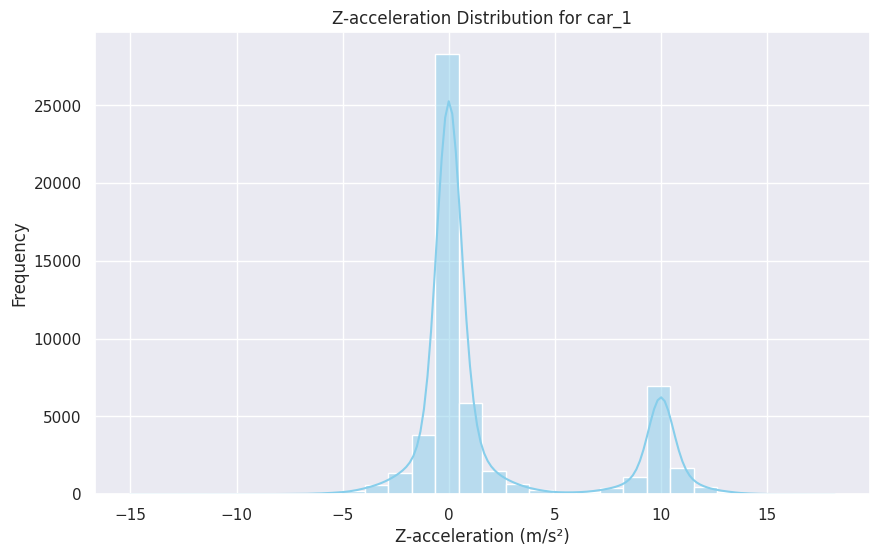

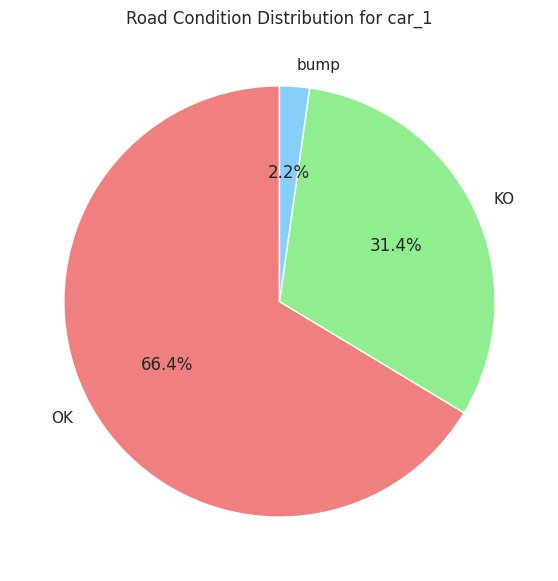

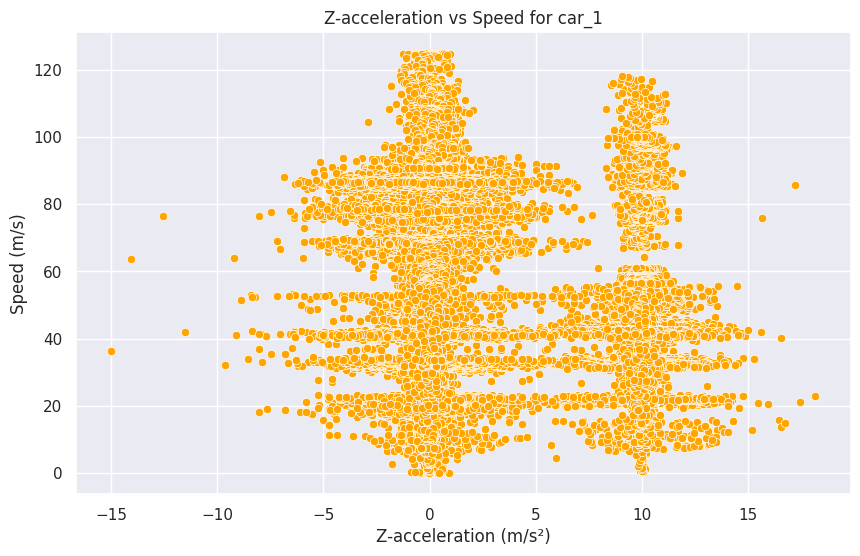

Statistics for Z-acceleration for car car_2:
count    44668.000000
mean         1.968545
std          4.189183
min        -11.681075
25%         -0.259862
50%          0.051051
75%          1.545846
max         19.613934
Name: Z, dtype: float64
Road conditions for car car_2:
class
OK      29274
KO      14458
bump      936
Name: count, dtype: int64
Mean Speed for car car_2: 52.30 m/s


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



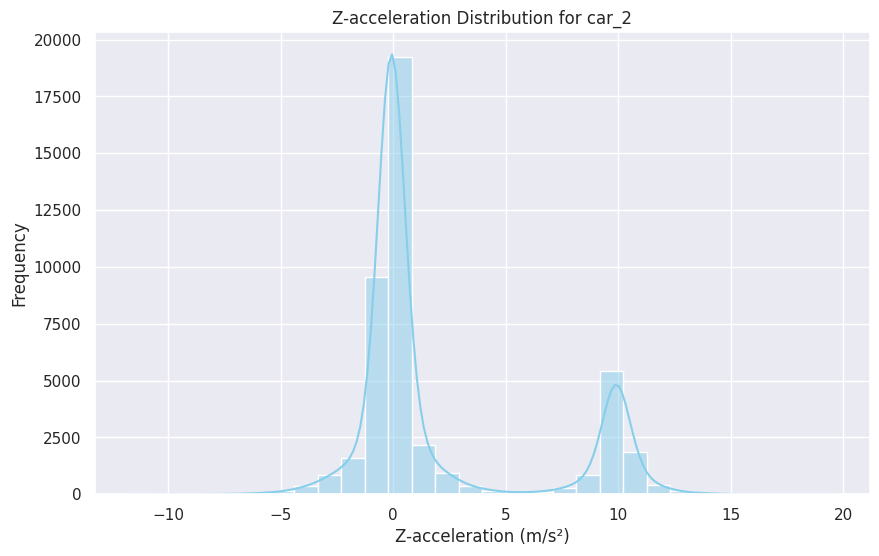

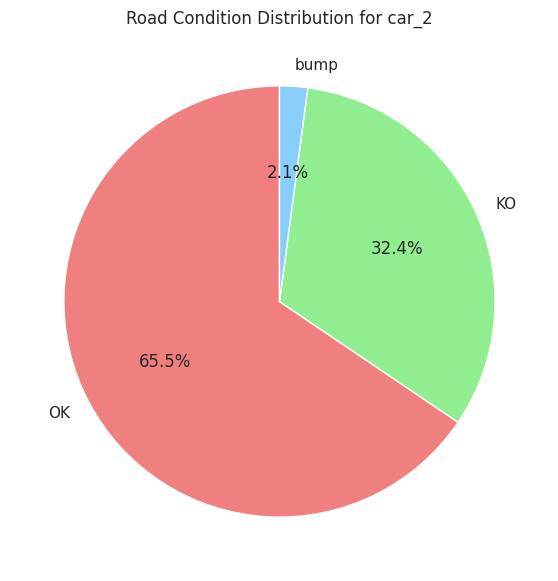

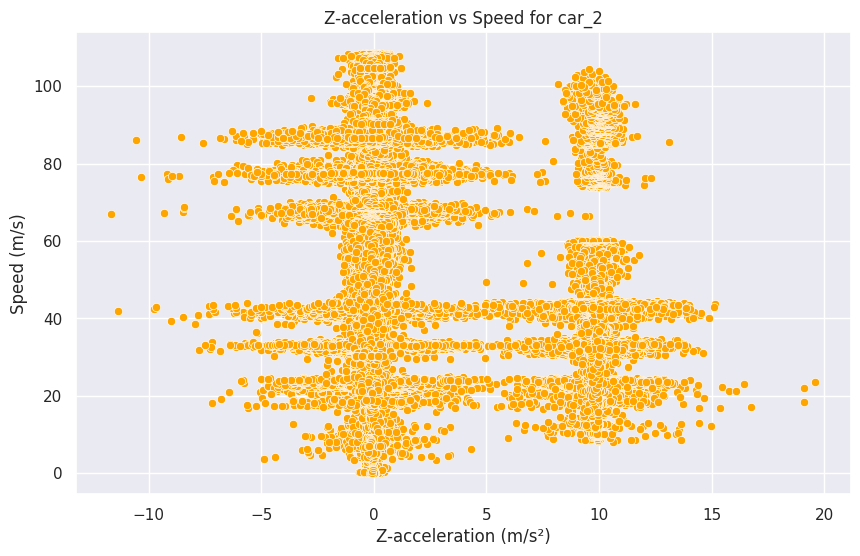

Statistics for Z-acceleration for car car_3:
count    27995.000000
mean         2.151862
std          4.171313
min        -12.345374
25%         -0.099213
50%          0.138300
75%          1.418982
max         16.566902
Name: Z, dtype: float64
Road conditions for car car_3:
class
OK      17978
KO       9378
bump      639
Name: count, dtype: int64
Mean Speed for car car_3: 51.36 m/s


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



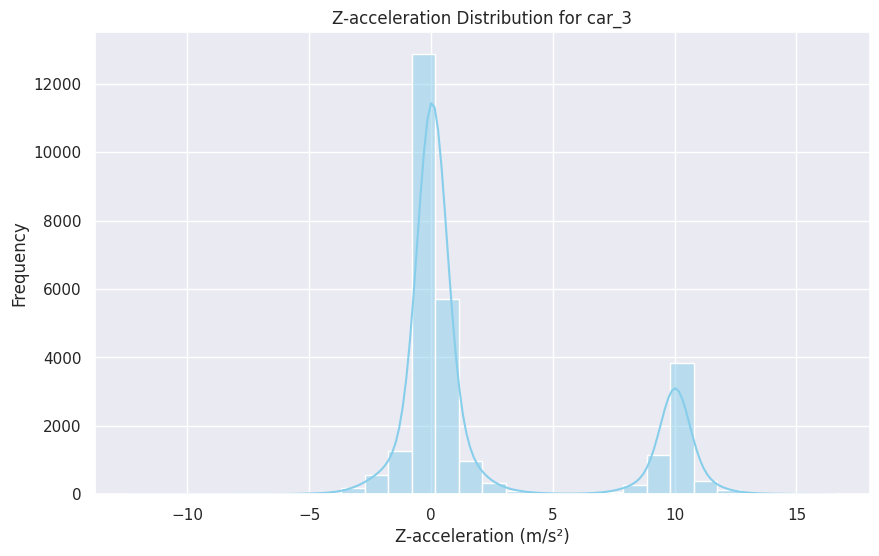

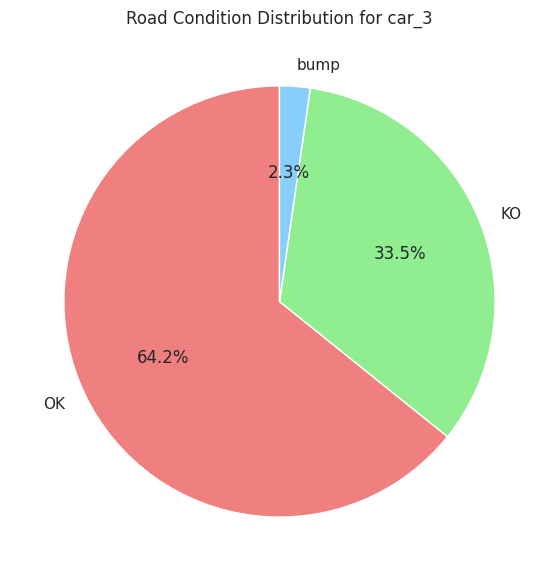

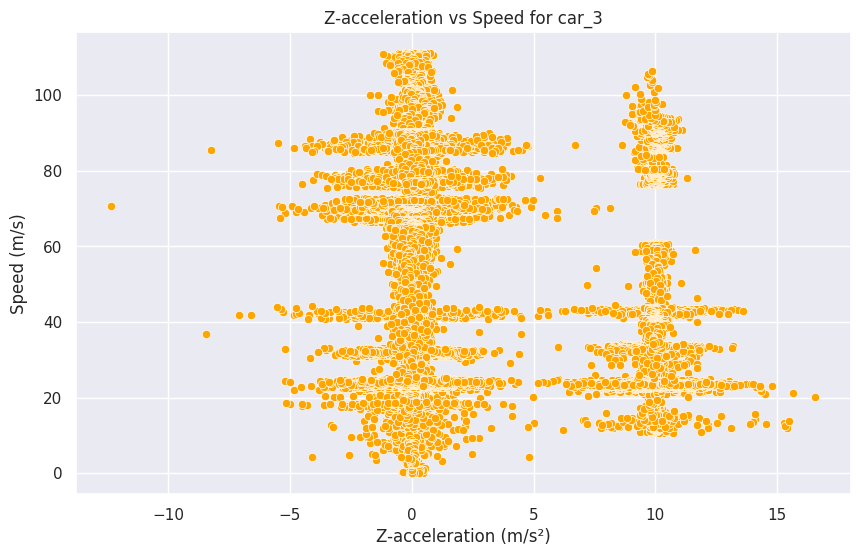

In [27]:
print_statistics_by_car(
    df,
    vin_col='vin',
    z_col='Z',
    condition_col='class',
    speed_col='SpeedBody'
)


Statistics for Z-acceleration for car car_1:
count    58868.000000
mean        -0.012297
std          0.644424
min         -7.176233
25%         -0.283430
50%         -0.013940
75%          0.246601
max          8.272322
Name: Z, dtype: float64
Road conditions for car car_1:
class
OK      42626
KO      14501
bump     1741
Name: count, dtype: int64
Mean Speed for car car_1: 33.79 m/s


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



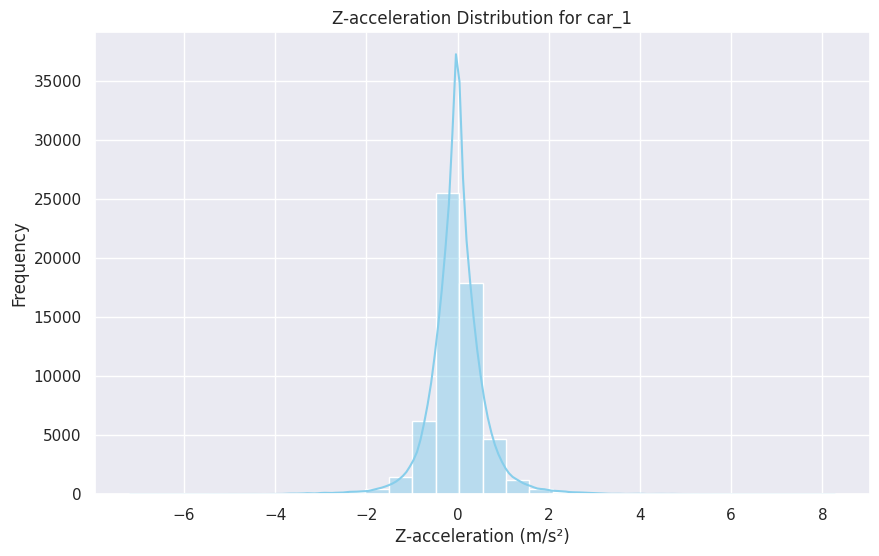

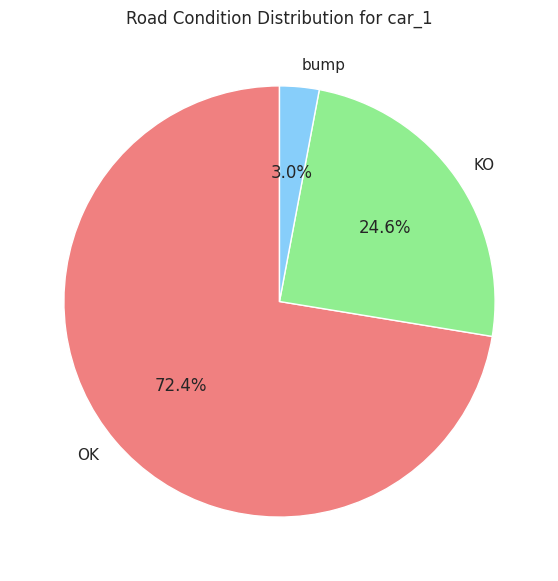

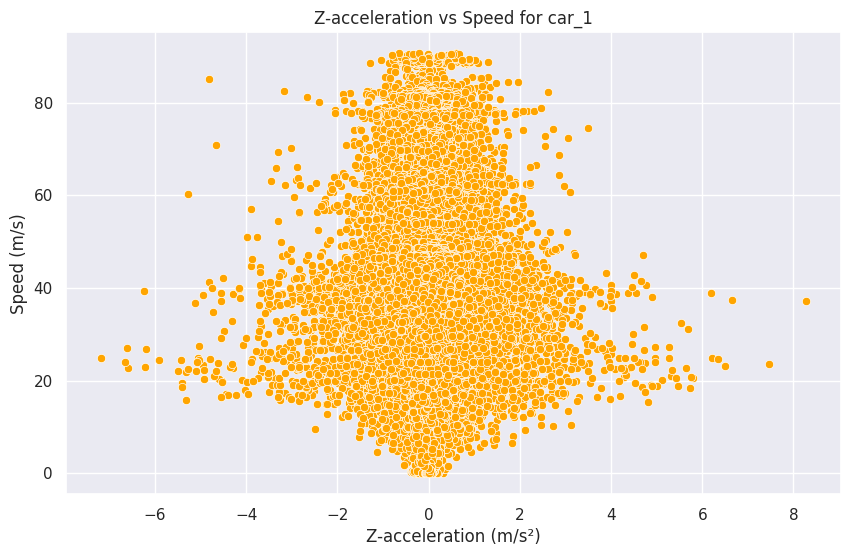

In [28]:
print_statistics_by_car(
    test,
    vin_col='vin',
    z_col='Z',
    condition_col='class',
    speed_col='SpeedBody'
)

### Interactive High-Frequency Vehicle Dashboard

In [29]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
from datetime import timedelta

class HighFreqVehicleAnalysis:
    def __init__(self, data, time_col, value_col, group_col='vin'):
        self.data = data
        self.time_col = time_col
        self.value_col = value_col
        self.group_col = group_col
        self.data[time_col] = pd.to_datetime(self.data[time_col])

    def identify_activity_periods(self, vehicle_data, gap_threshold_seconds=1800, period_duration=timedelta(hours=1)):
        vehicle_data = vehicle_data.sort_values(by=self.time_col)
        period_starts = vehicle_data[self.time_col].dt.floor('h')
        time_diffs = vehicle_data[self.time_col].diff().dt.total_seconds()
        new_period = time_diffs > gap_threshold_seconds
        vehicle_data['period_number'] = new_period.cumsum()
        return vehicle_data.groupby([period_starts, vehicle_data['period_number']])

    def analyze_sampling_frequency(self, vehicle_data):
        time_diffs = vehicle_data[self.time_col].diff().dt.total_seconds()
        return {
            'mean_interval': time_diffs.mean(),
            'median_interval': time_diffs.median(),
            'min_interval': time_diffs.min(),
            'max_interval': time_diffs.max(),
            'std_interval': time_diffs.std()
        }



    def create_period_dashboard(self, period_data, period_num):
        period_start_time = period_data[self.time_col].min()
        period_end_time = period_data[self.time_col].max()
        duration = (period_end_time - period_start_time).total_seconds()

        # Check if latitude and longitude data exist and are not all NaN
        if 'Latitude' not in period_data.columns or 'Longitude' not in period_data.columns:
            print("Warning: Latitude or Longitude columns are missing in the dataset.")
            has_map_data = False
        else:
            has_map_data = not period_data['Latitude'].isnull().all() and not period_data['Longitude'].isnull().all()

        # Create subplot figure with multiple plots including a map
        fig = make_subplots(
            rows=3, cols=2,
            subplot_titles=(
                f'Time Series - Period {period_num + 1}',
                'Value Distribution',
                'Cumulative Value',
                'Rolling Mean (window=10)',
                'Vehicle Path on Test Track' if has_map_data else 'No Map Data',
                'Activity Duration (s)'
            ),
            vertical_spacing=0.12,
            horizontal_spacing=0.1,
            specs=[
                [{'type': 'xy'}, {'type': 'xy'}],
                [{'type': 'xy'}, {'type': 'xy'}],
                [{'type': 'scattermapbox' if has_map_data else 'xy'}, {'type': 'indicator'}]
            ]
        )

        # 1. Time Series plot
        fig.add_trace(
            go.Scatter(
                x=period_data[self.time_col],
                y=period_data[self.value_col],
                mode='lines+markers',
                name='Value',
                hovertemplate=(
                    '<b>Time</b>: %{x}<br>' +
                    '<b>Value</b>: %{y:.2f}<br>' +
                    '<extra></extra>'
                )
            ),
            row=1, col=1
        )

        # 2. Value Distribution
        fig.add_trace(
            go.Histogram(
                x=period_data[self.value_col],
                name='Values',
                nbinsx=30,
                hovertemplate='<b>Value</b>: %{x}<br><b>Count</b>: %{y}'
            ),
            row=1, col=2
        )

        # 3. Cumulative Value plot
        cumulative_value = period_data[self.value_col].cumsum()
        fig.add_trace(
            go.Scatter(
                x=period_data[self.time_col],
                y=cumulative_value,
                mode='lines',
                name='Cumulative Value',
                hovertemplate='<b>Cumulative Value</b>: %{y:.2f}<br><b>Time</b>: %{x}<br><extra></extra>'
            ),
            row=2, col=1
        )

        # 4. Rolling Mean plot
        rolling_mean = period_data[self.value_col].rolling(window=10).mean()
        fig.add_trace(
            go.Scatter(
                x=period_data[self.time_col],
                y=rolling_mean,
                mode='lines',
                name='Rolling Mean (window=10)',
                hovertemplate='<b>Rolling Mean</b>: %{y:.2f}<br><b>Time</b>: %{x}<br><extra></extra>'
            ),
            row=2, col=2
        )

        if has_map_data:
            # 5. Vehicle Path on Test Track
            fig.add_trace(
                go.Scattermapbox(
                    lat=period_data['Latitude'],
                    lon=period_data['Longitude'],
                    mode='lines+markers',
                    marker=dict(size=8, color=period_data[self.value_col], colorscale='Viridis', showscale=True),
                    line=dict(width=2, color='blue'),
                    hovertemplate=(
                        '<b>Latitude</b>: %{lat:.4f}<br>' +
                        '<b>Longitude</b>: %{lon:.4f}<br>' +
                        '<b>Value</b>: %{marker.color:.2f}<extra></extra>'
                    )
                ),
                row=3, col=1
            )
        else:
            # Placeholder plot if no map data
            fig.add_trace(
                go.Scatter(
                    x=[0], y=[0],
                    mode='markers',
                    marker=dict(size=0),
                    showlegend=False
                ),
                row=3, col=1
            )

        # 6. Activity Duration plot
        fig.add_trace(
            go.Indicator(
                mode="gauge+number",
                value=duration,
                title={'text': "Activity Duration (seconds)"},
                gauge={'axis': {'range': [0, duration * 1.2]}}
            ),
            row=3, col=2
        )

        # Update layout
        fig.update_layout(
            title=f'Activity Period {period_num + 1} Analysis (Start: {period_start_time}, End: {period_end_time})',
            height=1000,
            width=1200,
            showlegend=False,
            template='plotly_white',
            mapbox=dict(
                accesstoken='your_mapbox_access_token',
                bearing=0,
                center=dict(
                    lat=period_data['Latitude'].mean() if has_map_data else 0,
                    lon=period_data['Longitude'].mean() if has_map_data else 0
                ),
                pitch=0,
                zoom=10 if has_map_data else 1
            )
        )

        # Update axes labels
        fig.update_xaxes(title_text="Time", row=1, col=1)
        fig.update_xaxes(title_text="Value", row=1, col=2)
        fig.update_xaxes(title_text="Time", row=2, col=1)
        fig.update_xaxes(title_text="Time", row=2, col=2)

        fig.update_yaxes(title_text="Value", row=1, col=1)
        fig.update_yaxes(title_text="Frequency", row=1, col=2)
        fig.update_yaxes(title_text="Cumulative Value", row=2, col=1)
        fig.update_yaxes(title_text="Rolling Mean", row=2, col=2)

        # range slider to main plot
        fig.update_xaxes(rangeslider_visible=True, row=1, col=1)

        return fig
    def create_vehicle_dashboards(self, vehicle_id):
        vehicle_data = self.data[self.data[self.group_col] == vehicle_id].copy()
        activity_periods = self.identify_activity_periods(vehicle_data)

        dashboards = []
        for period_tuple, period_data in activity_periods:
            period_number = period_tuple[1]
            fig = self.create_period_dashboard(period_data, period_number)
            dashboards.append(fig)

        return dashboards

    def get_detailed_stats(self, vehicle_id):
        vehicle_data = self.data[self.data[self.group_col] == vehicle_id]
        stats = []

        activity_periods = self.identify_activity_periods(vehicle_data)
        for period_tuple, period_data in activity_periods:
            period_number = period_tuple[1]
            duration = (period_data[self.time_col].max() - period_data[self.time_col].min()).total_seconds()
            period_stats = {
                'period_number': period_number,
                'duration_seconds': duration
            }
            stats.append(period_stats)

        return pd.DataFrame(stats)

vehicle_analysis = HighFreqVehicleAnalysis(df, time_col='date', value_col='Z', group_col='vin')
dashboards = vehicle_analysis.create_vehicle_dashboards('car_1')


/usr/local/lib/python3.10/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning:

invalid value encountered in greater



In [30]:
from datetime import datetime


start_time = datetime(2023, 6, 12, 8, 8, 6, 812000)
end_time = datetime(2023, 6, 12, 8, 47, 25, 716000)

# Convert the 'date' column to datetime
df['date'] = pd.to_datetime(df['date'])

# Filter the data for car_1 within the specified time period
filtered_data = df[(df['vin'] == 'car_1') &
                     (df['date'] >= start_time) &
                     (df['date'] <= end_time)]
filtered_data = filtered_data.drop(['model','vin'],axis=1)


In [31]:
import plotly.graph_objects as go

# Time Series Plot for SpeedBody
fig_speed = go.Figure()
fig_speed.add_trace(
    go.Scatter(
        x=filtered_data['date'],
        y=filtered_data['SpeedBody'],
        mode='lines+markers',
        name='SpeedBody',
        hovertemplate=(
            '<b>Time</b>: %{x}<br>' +
            '<b>SpeedBody</b>: %{y:.2f}<br>' +
            '<extra></extra>'
        )
    )
)
fig_speed.update_layout(
    title='SpeedBody Time Series',
    xaxis_title="Date",
    yaxis_title="SpeedBody",
    template='plotly_white'
)
fig_speed.show()

In [32]:
# Time Series Plot for Z
fig_z = go.Figure()
fig_z.add_trace(
    go.Scatter(
        x=filtered_data['date'],
        y=filtered_data['Z'],
        mode='lines+markers',
        name='Z',
        hovertemplate=(
            '<b>Time</b>: %{x}<br>' +
            '<b>Z</b>: %{y:.2f}<br>' +
            '<extra></extra>'
        )
    )
)
fig_z.update_layout(
    title='Z Time Series',
    xaxis_title="Date",
    yaxis_title="Z",
    template='plotly_white'
)
fig_z.show()

### Interactive Scatter Plot of SpeedBody vs Z

In [33]:
# Scatter Plot of SpeedBody vs Z
fig_scatter = go.Figure()
fig_scatter.add_trace(
    go.Scatter(
        x=filtered_data['SpeedBody'],
        y=filtered_data['Z'],
        mode='markers',
        name='SpeedBody vs Z',
        hovertemplate=(
            '<b>SpeedBody</b>: %{x:.2f}<br>' +
            '<b>Z</b>: %{y:.2f}<extra></extra>'
        )
    )
)
fig_scatter.update_layout(
    title='SpeedBody vs Z',
    xaxis_title="SpeedBody",
    yaxis_title="Z",
    template='plotly_white'
)
fig_scatter.show()

### Interactive Histogram of SpeedBody

In [34]:

fig_hist_speed = go.Figure()
fig_hist_speed.add_trace(
    go.Histogram(
        x=filtered_data['SpeedBody'],
        name='SpeedBody',
        nbinsx=30,
        hovertemplate='<b>SpeedBody</b>: %{x}<br><b>Count</b>: %{y}'
    )
)
fig_hist_speed.update_layout(
    title='Distribution of SpeedBody',
    xaxis_title="SpeedBody",
    yaxis_title="Frequency",
    template='plotly_white'
)
fig_hist_speed.show()

In [35]:
# Group by Longitude and Latitude, calculate average of Z
grouped_data = filtered_data.groupby(['Longitude', 'Latitude']).agg({
    'Z': 'mean',
    'class': 'first'
}).reset_index()

# Rename of aggregated Z column to avg_Z
grouped_data = grouped_data.rename(columns={'Z': 'avg_Z'})


### Mapping Vertical Road Variations with Folium

In [36]:
# base map centered around the average location
import folium
avg_lat, avg_lon = grouped_data['Latitude'].mean(), grouped_data['Longitude'].mean()
m = folium.Map(location=[avg_lat, avg_lon], zoom_start=10)

# Add markers for each location, colored by the average Z value
for idx, row in grouped_data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        popup=f"Lat: {row['Latitude']:.4f}, Lon: {row['Longitude']:.4f}, Avg Z: {row['avg_Z']:.2f}",
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(m)

# Save map as an HTML file or display it in Jupyter
m

Second Folium Map

In [37]:
from folium.plugins import MarkerCluster

# Create base map
m_class = folium.Map(location=[avg_lat, avg_lon], zoom_start=10)

# Initialize MarkerCluster object
marker_cluster = MarkerCluster().add_to(m_class)

# Group by Longitude, Latitude, and class to count occurrences
class_distribution = filtered_data.groupby(['Longitude', 'Latitude', 'class']).size().reset_index(name='count')

# Add markers for each unique combination of location and class
for idx, row in class_distribution.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Lat: {row['Latitude']:.4f}, Lon: {row['Longitude']:.4f}, Class: {row['class']}, Count: {row['count']}",
        icon=folium.Icon(color='blue' if row['class'] == 'A' else 'red')
    ).add_to(marker_cluster)

# Display the map in Jupyter
m_class

In [38]:
import folium
from folium.plugins import Geocoder

# base map centered around the average location
avg_lat, avg_lon = grouped_data['Latitude'].mean(), grouped_data['Longitude'].mean()
m = folium.Map(location=[avg_lat, avg_lon], zoom_start=10)

# Add markers for each location, colored by the average Z value
for idx, row in grouped_data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        popup=f"Lat: {row['Latitude']:.4f}, Lon: {row['Longitude']:.4f}, Avg Z: {row['avg_Z']:.2f}",
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(m)

# Add a Geocoder plugin for better location search
Geocoder().add_to(m)

# Save the map as an HTML file
m.save("folium_map_with_markers.html")

# Display map in Jupyter Notebook
m

### Feature Scaling and Date-Time Feature Extraction

In [39]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Separate numerical and non-numerical columns
numerical_cols = ['SpeedBody', 'Z', 'Latitude', 'Longitude']
categorical_cols = ['vin', 'model', 'date']

# Extract the numerical columns and apply scaling
X_numerical = filtered_data[numerical_cols]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_numerical)

# extract features (hour, day, month )
filtered_data['date'] = pd.to_datetime(filtered_data.index)  # Ensure 'date' is in datetime format
filtered_data['hour'] = filtered_data['date'].dt.hour
filtered_data['day'] = filtered_data['date'].dt.day
filtered_data['month'] = filtered_data['date'].dt.month

# drop the original 'date' column after extracting features
filtered_data = filtered_data.drop(['date'], axis=1)

# rejoin scaled numerical data with the other columns
X_final =  pd.DataFrame(X_scaled, columns=numerical_cols)




### Spatial Clustering of Road Data with KMeans

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



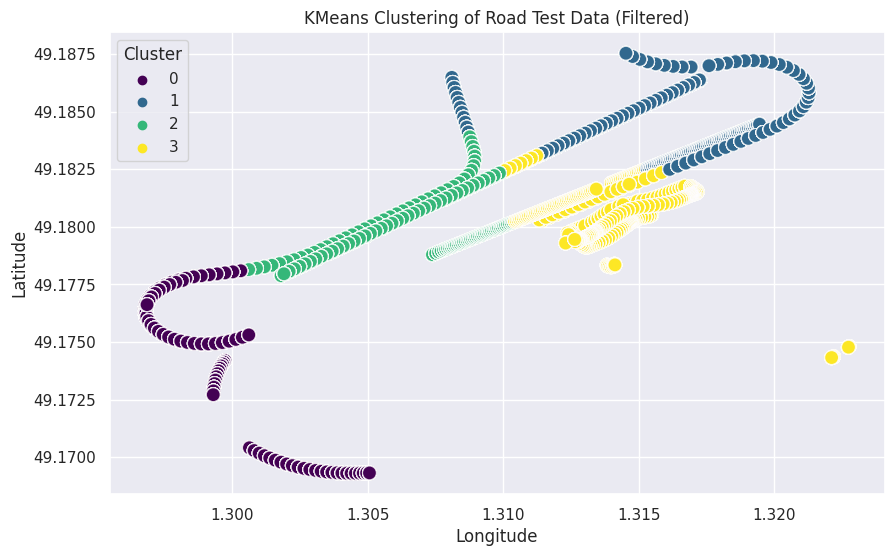

In [40]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Select features for clustering
X_cluster = filtered_data[['Latitude', 'Longitude']]  # Example spatial features (you can add more features as needed)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=4, random_state=42)
filtered_data['cluster'] = kmeans.fit_predict(X_scaled)

# Visualize the clusters on a geographical plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=filtered_data['Longitude'], y=filtered_data['Latitude'], hue=filtered_data['cluster'], palette='viridis', s=100, alpha=0.7)
plt.title('KMeans Clustering of Road Test Data (Filtered)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Cluster')
plt.show()


In [41]:
cluster_summary = filtered_data.groupby('cluster').describe()
print("Cluster Summary:\n", cluster_summary)

Cluster Summary:
         SpeedBody                                                         \
            count       mean        std        min        25%        50%   
cluster                                                                    
0           982.0  64.978910  13.446071  19.570000  60.642498  68.875000   
1          1744.0  57.083956  27.370629  20.240001  21.349999  65.825001   
2          1475.0  57.488793  23.174590  19.860001  22.665000  66.790001   
3          3526.0  29.763605  23.147486   0.000000  13.890000  20.720000   

                              Latitude             ...  day        month       \
               75%        max    count       mean  ...  75%  max   count mean   
cluster                                            ...                          
0        75.687501  77.730001    982.0  49.174247  ...  1.0  1.0   982.0  1.0   
1        84.519997  93.510000   1744.0  49.184554  ...  1.0  1.0  1744.0  1.0   
2        76.755001  83.410002   1475.0  49.1

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



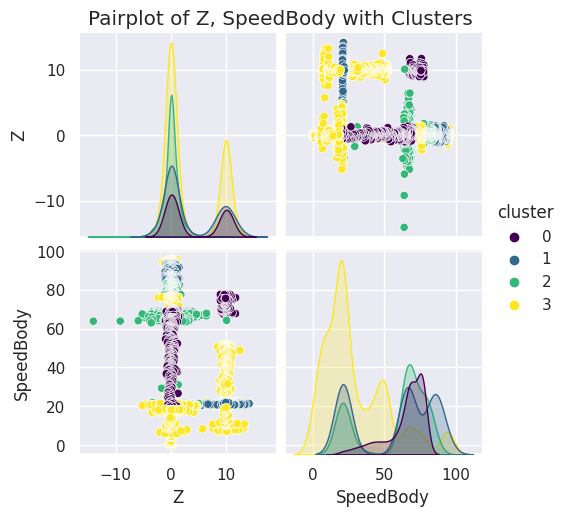

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

# One-hot encode 'class' column
subset = pd.get_dummies(filtered_data[['Z', 'SpeedBody', 'cluster']], drop_first=True)

# Plot the pairplot with 'cluster' as hue
sns.pairplot(subset, hue='cluster', palette='viridis', markers='o')

# Show plot
plt.suptitle('Pairplot of Z, SpeedBody with Clusters', y=1.02)
plt.show()


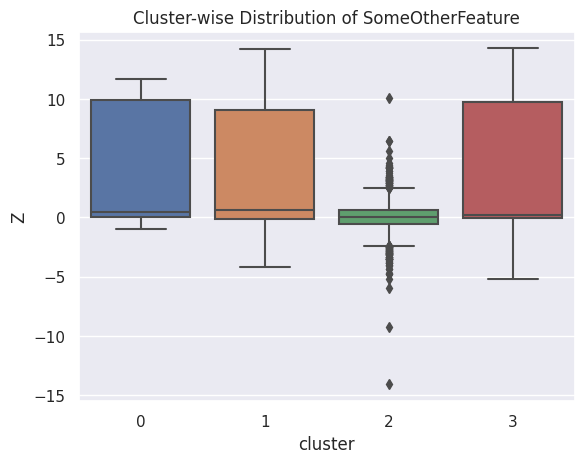

In [43]:
sns.boxplot(x='cluster', y='Z', data=filtered_data)
plt.title('Cluster-wise Distribution of SomeOtherFeature')
plt.show()


        count unique top  freq
cluster                       
0         982      1  OK   982
1        1744      2  KO  1183
2        1475      2  KO  1067
3        3526      3  OK  2390


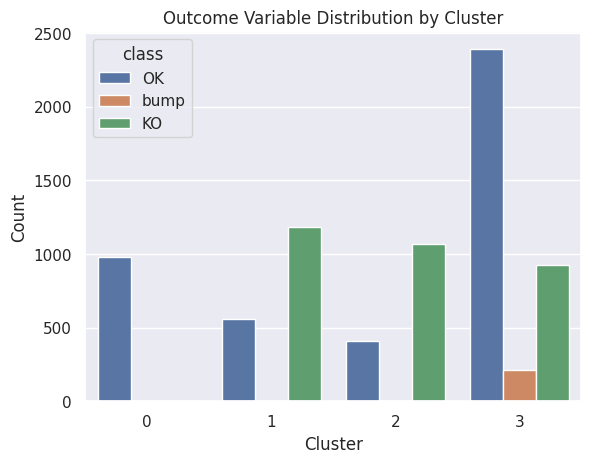

In [44]:
cluster_outcome_summary = filtered_data.groupby('cluster')['class'].describe()
print(cluster_outcome_summary)
sns.countplot(x='cluster', hue='class', data=filtered_data)
plt.title('Outcome Variable Distribution by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



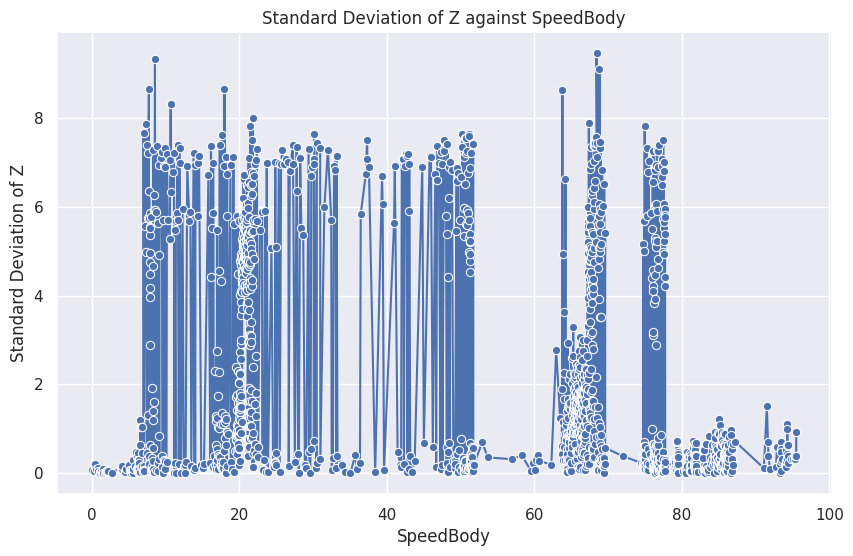

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt

# Group by SpeedBody and calculate the standard deviation of Z
std_dev = filtered_data.groupby('SpeedBody')['Z'].std().reset_index()

# Plot std deviation of Z against SpeedBody
plt.figure(figsize=(10, 6))
sns.lineplot(x='SpeedBody', y='Z', data=std_dev, marker='o')
plt.title('Standard Deviation of Z against SpeedBody')
plt.xlabel('SpeedBody')
plt.ylabel('Standard Deviation of Z')
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



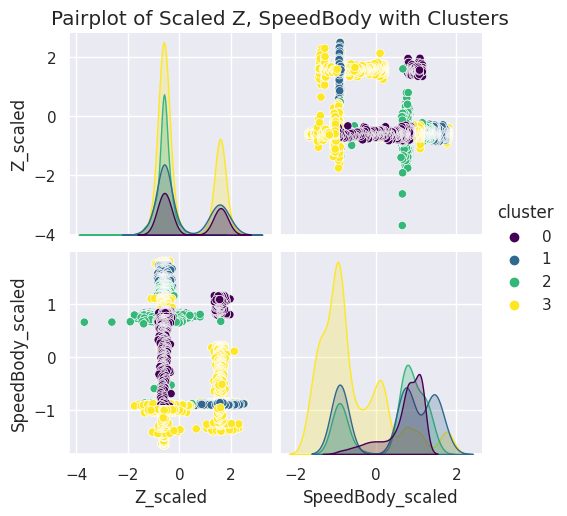

In [46]:
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize scaler
scaler = StandardScaler()

# Scale Z and SpeedBody columns
filtered_data[['Z_scaled', 'SpeedBody_scaled']] = scaler.fit_transform(filtered_data[['Z', 'SpeedBody']])

# Subset of the data for pairplot with scaled Z, SpeedBody, Z_std_dev, and cluster
subset = filtered_data[['Z_scaled', 'SpeedBody_scaled', 'cluster']]

# Plot the pairplot
sns.pairplot(subset, hue='cluster', palette='viridis', markers='o')

# Show the plot
plt.suptitle('Pairplot of Scaled Z, SpeedBody with Clusters', y=1.02)
plt.show()


# **Modelling Approaches**

## **Objective**
To classify road conditions using deep learning models while ensuring generalizability. Based on **EDA insights**, we will exclude the **location feature** to prevent overfitting to specific regions and instead develop a globally applicable model. Additionally, we will simplify the classification problem by merging **bump** and **KO** classes into a **binary classification** task.  

## **Training Strategy**
Since road test data is collected in **continuous time series**, we ensure models are trained on sequential data **without test run breaks**. For RNN-based models, we created **time series sequences** to preserve temporal dependencies.

---

## **1. RNN-Based Approach (LSTM)**
### **Rationale**
Long Short-Term Memory (LSTM) networks are well-suited for **sequential data** and can capture **temporal dependencies** in road quality variations.

### **Implementation**
- **Input:** Time-series sequences of Z-acceleration, SpeedBody, and other sensor readings.
- **Architecture:** Stacked LSTM layers with dropout for regularization.
- **Output:** Binary classification (OK vs KO).
- **Advantage:** Can capture **long-term dependencies** in road conditions.

---

## **2. CNN-Based Approach**
### **Rationale**
Convolutional Neural Networks (CNNs) excel at feature extraction from **structured data** and can learn spatial patterns in time-series signals.

### **Implementation**
- **Input:** Time-series data reshaped into 2D image-like representations.
- **Architecture:** 1D-CNN layers to capture **local patterns** in acceleration signals.
- **Output:** Binary classification (OK vs KO).
- **Advantage:** Computationally efficient compared to RNNs and can detect **short-term anomalies**.

---

## **3. Hybrid CNN-LSTM Model**
### **Rationale**
Combining **CNN’s feature extraction** with **LSTM’s sequential learning** offers the best of both approaches.

### **Implementation**
- **Input:** Sequential time-series data.
- **Architecture:** CNN layers for **feature extraction**, followed by LSTM layers for **temporal dependencies**.
- **Output:** Binary classification (OK vs KO).
- **Advantage:** Captures **both local and long-term dependencies**, making it ideal for complex road condition patterns.

---

## **Final Considerations**
- **Excluding Location Features:** Prevents overfitting to specific regions and improves global applicability.
- **Binary Classification:** Merging **bump into KO** simplifies the problem and improves model stability.
- **Continuous Sequences:** Avoiding breaks in test runs ensures robust learning for RNN-based models.

This framework balances efficiency, accuracy, and generalizability, allowing **real-world deployment** of road condition classification models.


In [47]:
import pandas as pd

#Kaggle
df_old = pd.read_csv("/kaggle/input/datanew/dataset_rqp.csv")
df_tran = pd.read_csv('/kaggle/input/datanew/dataset_rqp_train.csv')
df_test = pd.read_csv("/kaggle/input/datanew/dataset_rqp_test.csv")

#Collab
#df_old = pd.read_csv("/content/drive/MyDrive/Ampere/dataset_rqp.csv")
#df_tran = pd.read_csv('/content/drive/MyDrive/Ampere/dataset_rqp_train.csv')
#df_test = pd.read_csv("/content/drive/MyDrive/Ampere/dataset_rqp_test.csv")


df_old["date"] = pd.to_datetime(df_old["date"], format='ISO8601').dt.tz_localize(None)
df_tran["date"] = pd.to_datetime(df_tran["date"], format='ISO8601').dt.tz_localize(None)
df_test["date"] = pd.to_datetime(df_test["date"], format='ISO8601').dt.tz_localize(None)


In [48]:
import random
import numpy as np
import torch

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    # reproducible results on GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


In [49]:
df_old =df_old.drop('Unnamed: 0',axis=1)
df_tran =df_tran.drop('Unnamed: 0',axis=1)
df_test =df_test.drop('Unnamed: 0',axis=1)
df_tran

train = pd.concat([df_old,df_tran])
test = df_test

Time step statistics per run:
                        median                    min                    max  \
run_id                                                                         
car_1_0 0 days 00:00:00.104000 0 days 00:00:00.094000 0 days 00:05:16.042000   
car_1_1 0 days 00:00:00.106000 0 days 00:00:00.090000 0 days 21:26:40.958000   
car_1_2 0 days 00:00:00.105000 0 days 00:00:00.098000 0 days 01:22:27.037000   
car_1_3 0 days 00:00:00.106000 0 days 00:00:00.083000 0 days 03:03:09.869000   
car_1_4 0 days 00:00:00.105000 0 days 00:00:00.080000 0 days 17:33:24.877000   
car_1_5 0 days 00:00:00.106000 0 days 00:00:00.100000 0 days 01:25:01.757000   
car_1_6 0 days 00:00:00.106000 0 days 00:00:00.090000 0 days 02:52:38.305000   
car_2_0 0 days 00:00:00.107000 0 days 00:00:00.099000 0 days 00:07:32.046000   
car_2_1 0 days 00:00:00.107000 0 days 00:00:00.099000 0 days 00:40:44.787000   
car_2_2 0 days 00:00:00.107000 0 days 00:00:00.101000 0 days 21:13:19.970000   
car_2_3 0 

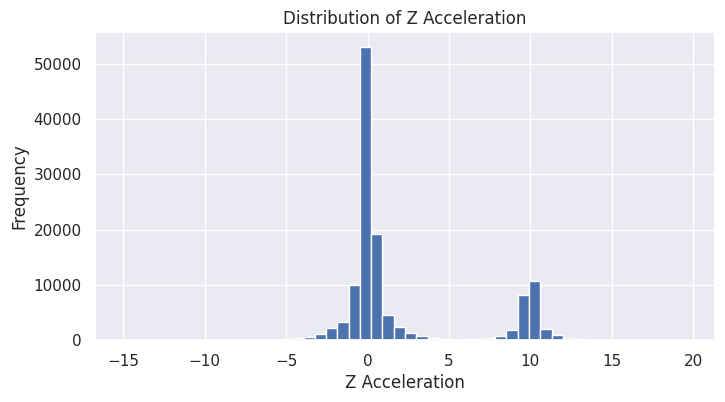

Class distribution:
class
OK      82896
KO      40703
bump     2775
Name: count, dtype: int64


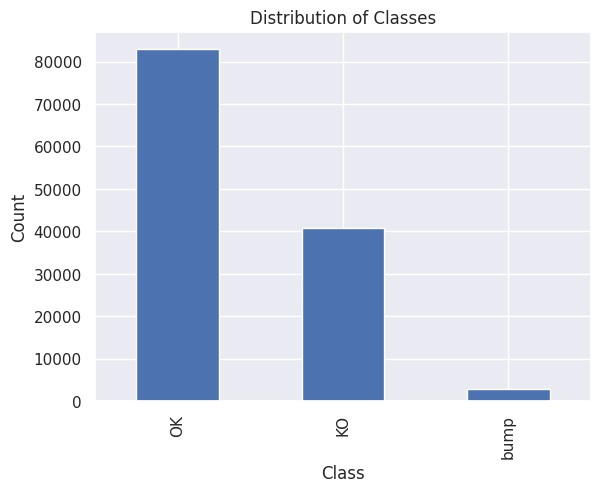

Number of valid runs (with at least 1000 samples): 17


In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = train

# 1. Preprocessing: Convert 'date' to datetime and sort by 'vin' and 'date'
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(['vin', 'date'])

# 2. Compute time differences for each car (grouped by 'vin')
df['time_diff'] = df.groupby('vin')['date'].diff()

# 3. Define a threshold to detect breaks in the time series.
threshold = pd.Timedelta('600 seconds')

# 4. Label runs within each 'vin' group using transform to preserve the index.
df['run_num'] = df.groupby('vin')['time_diff'].transform(lambda x: (x > threshold).cumsum())

# 5. Optionally, create a combined run identifier (e.g., "vin_runNum")
df['run_id'] = df['vin'].astype(str) + '_' + df['run_num'].astype(str)

# 6. Analyze time step statistics per run.
time_step_stats = df.groupby('run_id')['time_diff'].agg(['median', 'min', 'max', 'count'])
print("Time step statistics per run:")
print(time_step_stats)

# 7. Plot the distribution of Z acceleration.
plt.figure(figsize=(8,4))
df['Z'].hist(bins=50)
plt.title("Distribution of Z Acceleration")
plt.xlabel("Z Acceleration")
plt.ylabel("Frequency")
plt.show()

# 8. Analyze the distribution of the 'class' column.
class_distribution = df['class'].value_counts()
print("Class distribution:")
print(class_distribution)
class_distribution.plot(kind='bar', title="Distribution of Classes")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

# 9. Filter runs that have enough data points
min_samples = 1000
valid_runs = df.groupby('run_id').filter(lambda x: len(x) >= min_samples)
print(f"Number of valid runs (with at least {min_samples} samples): {valid_runs['run_id'].nunique()}")


Time step statistics per run:
                        median                    min                    max  \
run_id                                                                         
car_1_0 0 days 00:00:00.105000        0 days 00:00:00 0 days 00:05:01.069000   
car_1_1 0 days 00:00:00.105000 0 days 00:00:00.068000 0 days 00:43:15.980000   
car_1_2 0 days 00:00:00.105000 0 days 00:00:00.067000 0 days 01:07:49.967000   

         count  
run_id          
car_1_0    553  
car_1_1  38600  
car_1_2  19714  


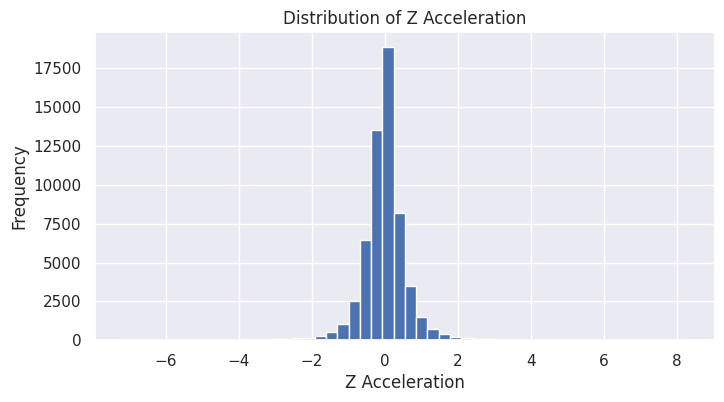

Class distribution:
class
OK      42626
KO      14501
bump     1741
Name: count, dtype: int64


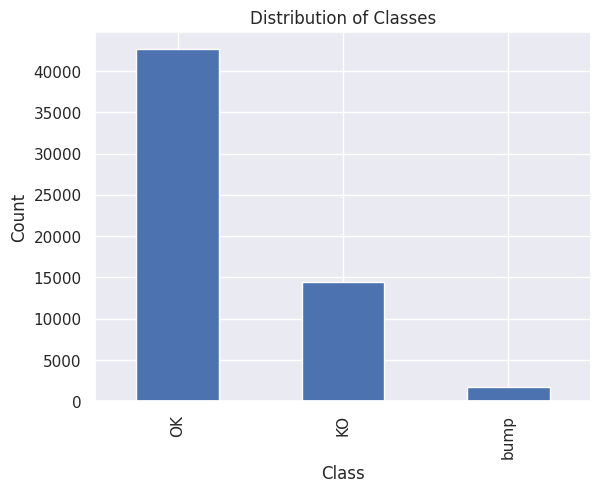

Number of valid runs (with at least 1000 samples): 2


In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df2 = test

# Convert 'date' to datetime and sort by 'vin' and 'date'
df2['date'] = pd.to_datetime(df2['date'])
df2 = df2.sort_values(['vin', 'date'])

# Compute time differences for each car (grouped by 'vin')
df2['time_diff'] = df2.groupby('vin')['date'].diff()

# Define a threshold to detect breaks in the time series.
threshold = pd.Timedelta('600 seconds')

# Label runs within each 'vin' group using transform to preserve the index.
df2['run_num'] = df2.groupby('vin')['time_diff'].transform(lambda x: (x > threshold).cumsum())

# Combined run identifier (e.g., "vin_runNum")
df2['run_id'] = df2['vin'].astype(str) + '_' + df2['run_num'].astype(str)

# Analyze time step statistics per run.
time_step_stats = df2.groupby('run_id')['time_diff'].agg(['median', 'min', 'max', 'count'])
print("Time step statistics per run:")
print(time_step_stats)

# Plot the distribution of Z acceleration.
plt.figure(figsize=(8,4))
df2['Z'].hist(bins=50)
plt.title("Distribution of Z Acceleration")
plt.xlabel("Z Acceleration")
plt.ylabel("Frequency")
plt.show()

# Analyze the distribution of the 'class' column.
class_distribution = df2['class'].value_counts()
print("Class distribution:")
print(class_distribution)
class_distribution.plot(kind='bar', title="Distribution of Classes")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

# Filter runs that have enough data points
min_samples = 1000
valid_runs = df2.groupby('run_id').filter(lambda x: len(x) >= min_samples)
print(f"Number of valid runs (with at least {min_samples} samples): {valid_runs['run_id'].nunique()}")


Class distribution per run:
class      KO    OK
run_id             
car_1_0  3405  4854
car_1_1  2622  5195
car_1_2  2804  4959
car_1_3  1911  5807
car_1_4  3174  4868
car_1_5  2336  4964
car_1_6  1815  4997
car_2_0  3379  5617
car_2_1  2564  4409
car_2_2  2128  4323
car_2_3  3203  5685
car_2_4  2460  4710
car_2_5  1660  4530
car_3_0  2998  4839
car_3_1  2317  4572
car_3_2  1700  3472
car_3_3  3002  5095


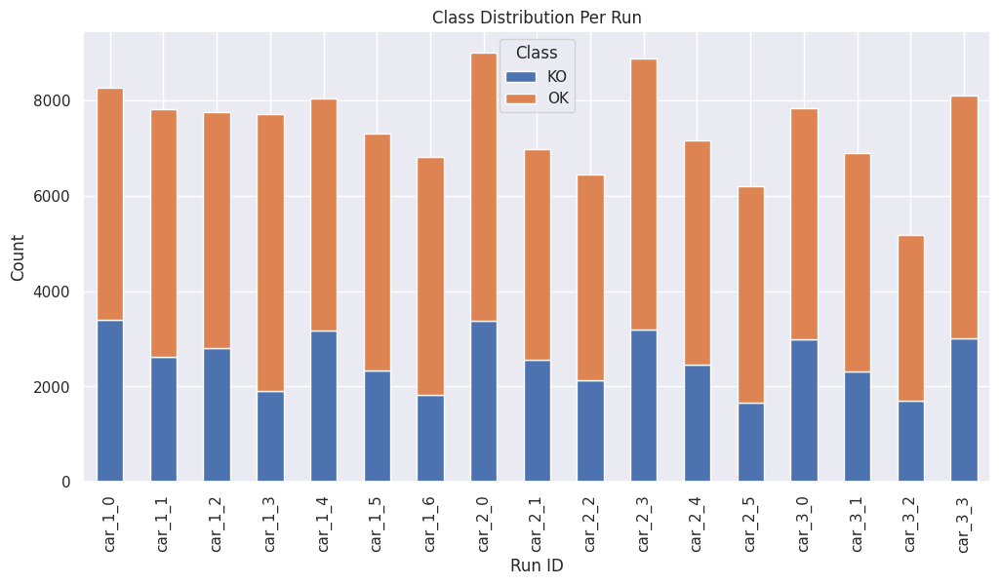

In [52]:
# Compute class distribution per run
df['class'] = df['class'].replace('bump', 'KO')

run_class_distribution = df.groupby('run_id')['class'].value_counts().unstack(fill_value=0)
print("Class distribution per run:")
print(run_class_distribution)

# Plot the distribution for each run as a stacked bar chart.
run_class_distribution.plot(kind='bar', stacked=True, figsize=(12,6))
plt.title("Class Distribution Per Run")
plt.xlabel("Run ID")
plt.ylabel("Count")
plt.legend(title="Class")
plt.show()

Class distribution per run:
class       KO     OK
run_id               
car_1_0      0    554
car_1_1  10853  27747
car_1_2   5389  14325


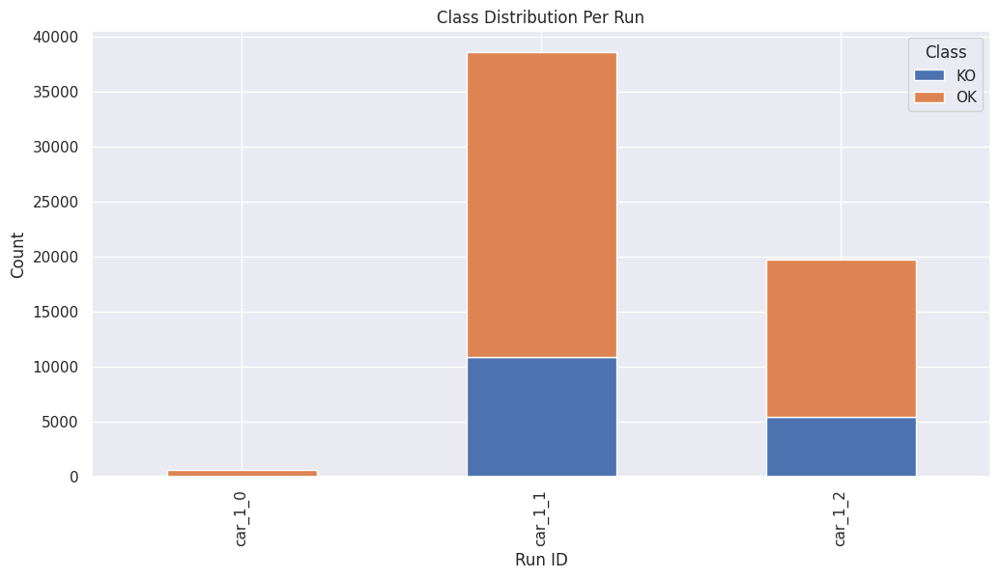

In [53]:
# Compute class distribution per run.
df2['class'] = df2['class'].replace('bump', 'KO')

run_class_distribution = df2.groupby('run_id')['class'].value_counts().unstack(fill_value=0)
print("Class distribution per run:")
print(run_class_distribution)

# Plot the distribution for each run as a stacked bar chart.
run_class_distribution.plot(kind='bar', stacked=True, figsize=(12,6))
plt.title("Class Distribution Per Run")
plt.xlabel("Run ID")
plt.ylabel("Count")
plt.legend(title="Class")
plt.show()

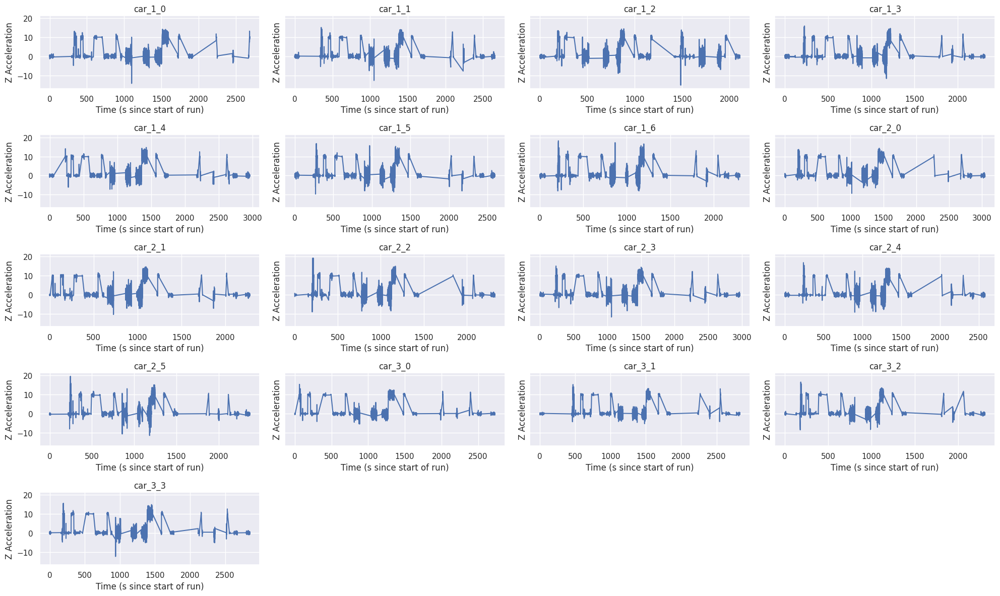

In [54]:
import matplotlib.pyplot as plt
import numpy as np

unique_runs = df['run_id'].unique()
num_runs = len(unique_runs)

# Define subplot layout
n_cols = 4
n_rows = int(np.ceil(num_runs / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 12), sharex=False, sharey=True)
axes = axes.flatten()

for i, run_id in enumerate(unique_runs):
    run_data = df[df['run_id'] == run_id]
    # Convert each timestamp to "seconds since the start of this run"
    time_axis = (run_data['date'] - run_data['date'].iloc[0]).dt.total_seconds()

    axes[i].plot(time_axis, run_data['Z'])
    axes[i].set_title(run_id)
    axes[i].set_xlabel('Time (s since start of run)')
    axes[i].set_ylabel('Z Acceleration')

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### **RNN Approach**

### **Modeling Approach Overview**
This section of the code implements a robust sequence modeling pipeline for binary classification using sensor data (Z, SpeedBody) from vehicle vibration readings. The goal is to classify each data point as either OK or KO based on sequential patterns observed across time.

### **Preprocessing Pipeline**
Class Label Simplification: All labels are normalized to binary values: 'OK' or 'KO'.

**Feature Engineering**: We compute first-order differences, rolling means, and generate lag features (lag_0 to lag_10) for both Z and SpeedBody.

**Group-wise Lagging**: Lags are computed per run_id, preserving sequence integrity.

**Scaling**: All numeric features are standardized using StandardScaler.

### **Sequence Creation**
Time-ordered sequences are built per run_id.

Each group becomes a variable-length sequence with associated binary labels.

Very long sequences (e.g., >5000 steps) are optionally split into fixed-length chunks for efficient training and memory use.

### **Model Architecture**
We use a recurrent neural network (RNN) for sequence classification. Configurable components include:

RNN Type: Either LSTM or GRU, with support for multiple stacked layers

Hidden Size: Default 64 units

Dropout: Applied between RNN layers for regularization

Output: A sigmoid-activated dense layer applied to every timestep to produce probabilities for binary classification

**Input** → **[LSTM/GRU]** → **Dense(1)** → **Sigmoid** → **Sequence of probabilities**

### **Handling Class Imbalance**
Focal Loss (optional): Emphasizes learning from hard, minority-class examples using tunable alpha and gamma.

Class Weights: Computed from the training set and applied dynamically in loss calculations.

Gradient Clipping: Stabilizes training by preventing exploding gradients.

### **Evaluation**
Predictions are thresholded (default 0.5, customizable) and evaluated using:

Accuracy, Precision, Recall, F1

ROC Curve + AUC

Precision-Recall Curve

Threshold sweep to find optimal F1

### **Model Persistence**
Models are serialized using pickle for later reuse (save_model() / load_model()).

Can be evaluated post-training on unseen test data, with interactive thresholding.


========== TRAINING DATA ==========

[Preprocessing] Starting preprocessing...
[Preprocessing] Dropped columns (if present): ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']
[Preprocessing] Fitting label encoders for training data...
[Preprocessing] Unique classes: ['KO' 'OK']
[Preprocessing] Encoded classes: [0 1]
[Preprocessing] Sorted data by 'date'.
[Preprocessing] Creating lag features for ['Z', 'SpeedBody'] with max_lag = 10...
[Preprocessing] Lag features created.
[Preprocessing] Dropped rows with missing values after lag creation.
[Preprocessing] Data shape after handling missing values: (126204, 34)
[Preprocessing] Final feature columns: ['SpeedBody', 'SpeedBody_diff', 'SpeedBody_lag0', 'SpeedBody_lag1', 'SpeedBody_lag10', 'SpeedBody_lag2', 'SpeedBody_lag3', 'SpeedBody_lag4', 'SpeedBody_lag5', 'SpeedBody_lag6', 'SpeedBody_lag7', 'SpeedBody_lag8', 'SpeedBody_lag9', 'SpeedBody_roll_mean', 'Z', 'Z_diff', 'Z_lag0', 'Z_lag1', 'Z_lag10', 'Z_lag2', 'Z_lag3', 'Z_lag4', 'Z_l

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning:

invalid value encountered in greater

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning:

invalid value encountered in less

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning:

invalid value encountered in greater



           vin                           date     SpeedBody             Z  \
count   126204                         126204  1.262040e+05  1.262040e+05   
unique       3                            NaN           NaN           NaN   
top      car_1                            NaN           NaN           NaN   
freq     53641                            NaN           NaN           NaN   
mean       NaN  2023-08-12 08:36:39.944741888 -9.188344e-17 -1.846677e-17   
min        NaN     2023-06-12 08:02:40.860000 -1.781299e+00 -4.077865e+00   
25%        NaN  2023-06-14 06:11:50.069750016 -9.503740e-01 -5.340732e-01   
50%        NaN  2023-09-18 09:16:56.315999744  1.029494e-01 -4.629456e-01   
75%        NaN  2023-09-20 07:06:35.696500224  8.663360e-01 -1.201332e-01   
max        NaN     2023-10-10 08:01:16.344000  2.477703e+00  4.199815e+00   
std        NaN                            NaN  1.000004e+00  1.000004e+00   

         class   run_id  class_encoded    vin_encoded  SpeedBody_diff  \
co

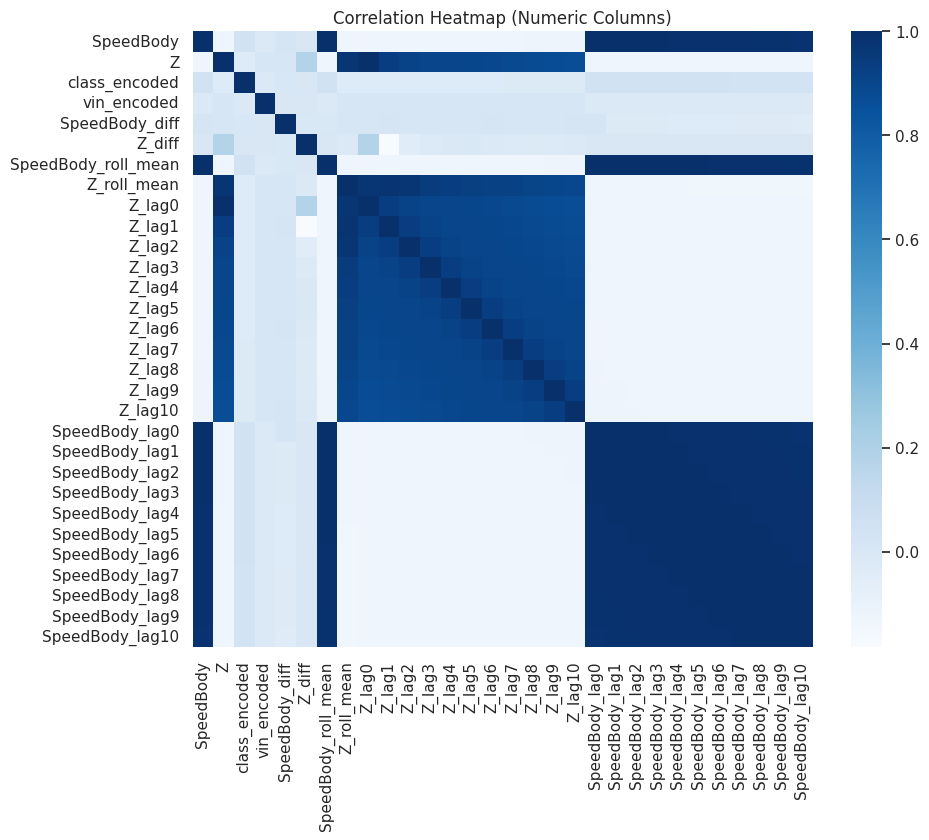


[Sequence Creation] Creating sequences grouped by 'run_id'...
[Sequence Creation] Displaying group sizes (first few):
run_id
car_1_0    8249
car_1_1    7807
car_1_2    7753
car_1_3    7708
car_1_4    8032
dtype: int64
[Sequence Creation] Created sequences for 17 groups.



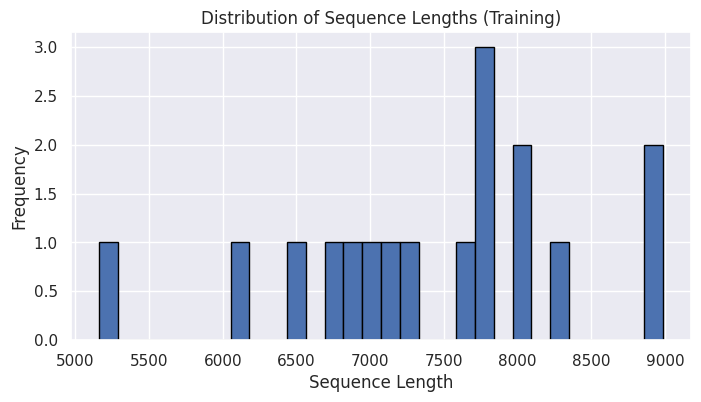

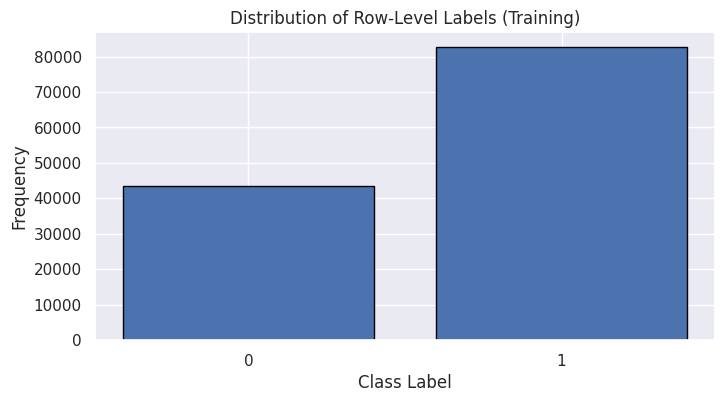

Computed class weights: [1.46185845 0.7599135 ]

[ModelTrainer] Using device: cuda
[ModelTrainer] Using Focal Loss (alpha=1.0, gamma=2.0).


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning:

The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.




[ModelTrainer] Starting training...
[Epoch 01] Train Loss: 0.1671, Train Acc: 0.6573 | Val Loss: 0.1641, Val Acc: 0.6470
[Epoch 02] Train Loss: 0.1612, Train Acc: 0.6581 | Val Loss: 0.1607, Val Acc: 0.6470
[Epoch 03] Train Loss: 0.1583, Train Acc: 0.6580 | Val Loss: 0.1588, Val Acc: 0.6470
[Epoch 04] Train Loss: 0.1564, Train Acc: 0.6603 | Val Loss: 0.1548, Val Acc: 0.6611
[Epoch 05] Train Loss: 0.1483, Train Acc: 0.6763 | Val Loss: 0.1493, Val Acc: 0.6776
[Epoch 06] Train Loss: 0.1447, Train Acc: 0.6803 | Val Loss: 0.1460, Val Acc: 0.6710
[Epoch 07] Train Loss: 0.1483, Train Acc: 0.6756 | Val Loss: 0.1439, Val Acc: 0.6789
[Epoch 08] Train Loss: 0.1401, Train Acc: 0.6822 | Val Loss: 0.1392, Val Acc: 0.6898
[Epoch 09] Train Loss: 0.1367, Train Acc: 0.6949 | Val Loss: 0.1373, Val Acc: 0.7249
[Epoch 10] Train Loss: 0.1405, Train Acc: 0.7095 | Val Loss: 0.1378, Val Acc: 0.6918
[Epoch 11] Train Loss: 0.1311, Train Acc: 0.7063 | Val Loss: 0.1369, Val Acc: 0.6792
[Epoch 12] Train Loss: 0.130

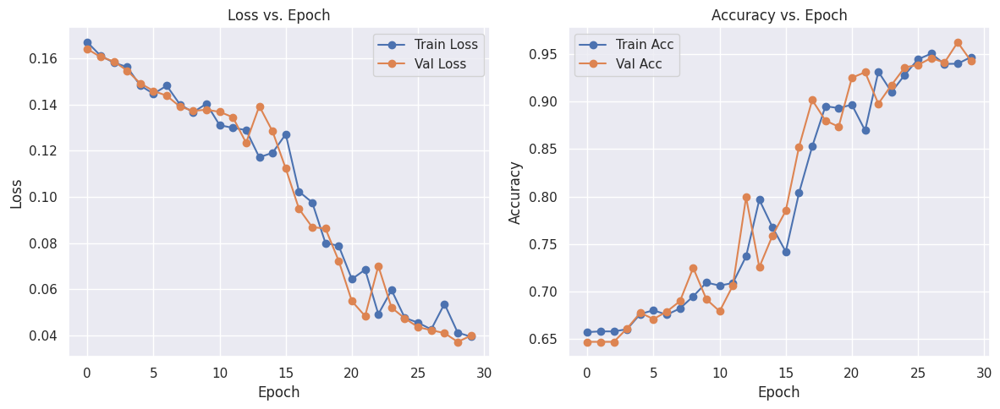

[ModelTrainer] Model saved to rnn_model.pkl

========== TEST DATA ==========

[Preprocessing] Starting preprocessing...
[Preprocessing] Dropped columns (if present): ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']
[Preprocessing] Unique classes: ['KO' 'OK']
[Preprocessing] Encoded classes: [0 1]
[Preprocessing] Sorted data by 'date'.
[Preprocessing] Creating lag features for ['Z', 'SpeedBody'] with max_lag = 10...
[Preprocessing] Lag features created.
[Preprocessing] Dropped rows with missing values after lag creation.
[Preprocessing] Data shape after handling missing values: (58858, 34)
[Preprocessing] Final feature columns: ['SpeedBody', 'SpeedBody_diff', 'SpeedBody_lag0', 'SpeedBody_lag1', 'SpeedBody_lag10', 'SpeedBody_lag2', 'SpeedBody_lag3', 'SpeedBody_lag4', 'SpeedBody_lag5', 'SpeedBody_lag6', 'SpeedBody_lag7', 'SpeedBody_lag8', 'SpeedBody_lag9', 'SpeedBody_roll_mean', 'Z', 'Z_diff', 'Z_lag0', 'Z_lag1', 'Z_lag10', 'Z_lag2', 'Z_lag3', 'Z_lag4', 'Z_lag5', 'Z_lag6', 'Z_la

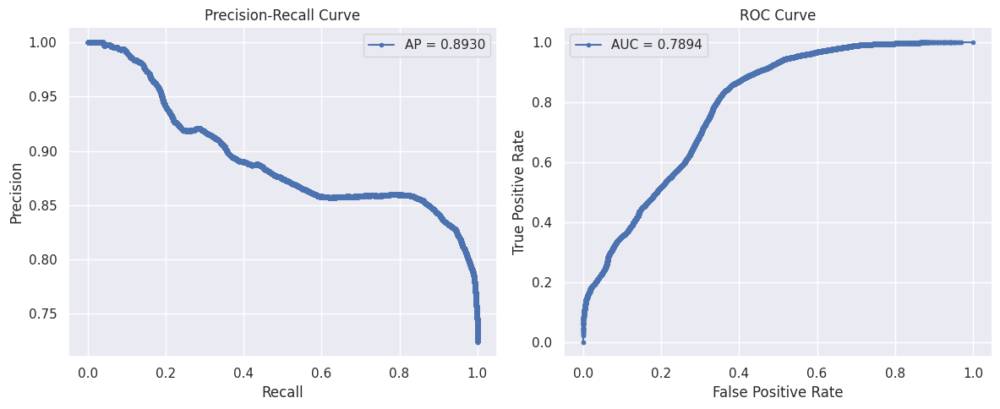

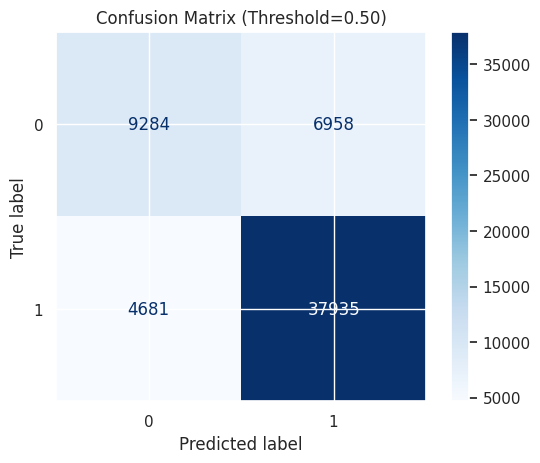

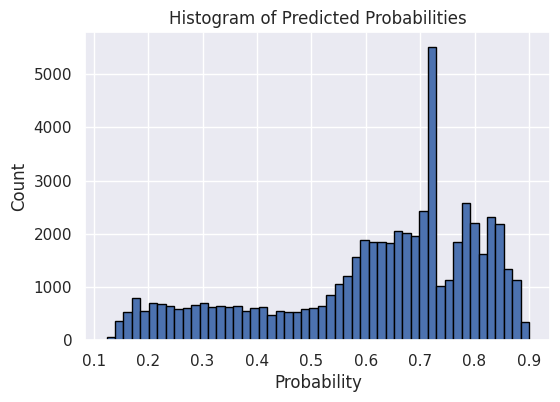

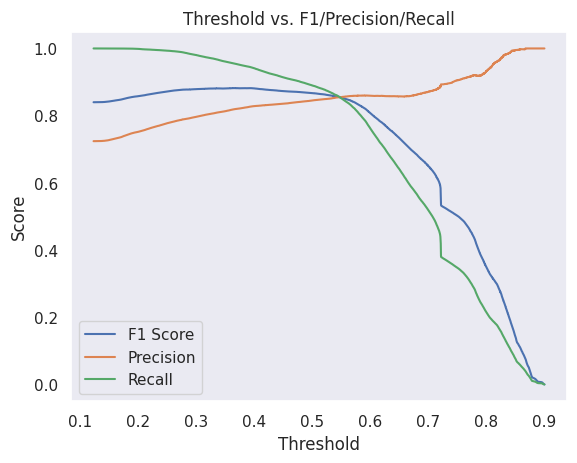


[Threshold Sweep] Searching for best threshold based on F1 Score...
Best threshold: 0.37, F1: 0.8818


In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence, pad_packed_sequence
from torch.nn.utils import clip_grad_norm_
import torch.nn.functional as F
import pickle

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay, precision_recall_curve,
                             roc_curve, auc, f1_score, average_precision_score, classification_report)
from sklearn.utils.class_weight import compute_class_weight
import random


# Fix Torch Seed for reproducibility

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False



# Focal Loss

class FocalLoss(nn.Module):
    """
    Focal Loss for binary classification.
    gamma > 1 emphasizes hard examples.
    alpha can balance the importance of positive vs negative classes.
    """
    def __init__(self, alpha=1.0, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        # inputs => shape [N], probabilities in [0,1]
        # targets => shape [N], binary {0,1}
        bce = F.binary_cross_entropy(inputs, targets, reduction='none')
        p_t = targets * inputs + (1 - targets) * (1 - inputs)  # Probability of the true label
        loss = self.alpha * (1 - p_t)**self.gamma * bce

        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        else:
            return loss

# 1. Data Preprocessing & Feature Engineering

class DataPreprocessor:
    """
    This class handles data preprocessing including feature engineering,
    lag feature creation, label encoding, and scaling.
    """
    def __init__(self, scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'], drop_na_after_lag=True):
        self.scale = scale
        self.max_lag = max_lag
        self.lag_columns = lag_columns
        self.drop_na_after_lag = drop_na_after_lag

        self.scaler = None
        self.label_encoder_class = LabelEncoder()
        self.label_encoder_vin = LabelEncoder()

    def preprocess(self, df, is_train=True):
        print("\n[Preprocessing] Starting preprocessing...")

        # Remove unwanted columns if they exist.
        cols_to_drop = ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']

        df = df.drop(columns=[col for col in cols_to_drop if col in df.columns], errors='ignore')
        print(f"[Preprocessing] Dropped columns (if present): {cols_to_drop}")

        # Force class labels to be either 'OK' or 'KO'
        df['class'] = df['class'].apply(lambda x: 'OK' if x == 'OK' else 'KO')

        # Label encoding for both class and VIN.
        if is_train:
            print("[Preprocessing] Fitting label encoders for training data...")
            self.label_encoder_class.fit(df['class'])
            self.label_encoder_vin.fit(df['vin'])
        df['class_encoded'] = self.label_encoder_class.transform(df['class'])
        df['vin_encoded'] = self.label_encoder_vin.transform(df['vin'])
        print(f"[Preprocessing] Unique classes: {np.unique(df['class'])}")
        print(f"[Preprocessing] Encoded classes: {np.unique(df['class_encoded'])}")

        # Ensure 'run_id' column is available.
        if is_train:
            if 'run_id' not in df.columns:
                print("[Preprocessing] 'run_id' not found in training data. Creating it from 'vin'.")
                df['run_id'] = df['vin']
        else:
            if 'run_id' not in df.columns:
                df['run_id'] = df['vin']

        # Convert the date column to datetime and sort the DataFrame.
        df['date'] = pd.to_datetime(df['date'])
        df = df.sort_values('date').reset_index(drop=True)
        print("[Preprocessing] Sorted data by 'date'.")

        # Create additional features to capture dynamic behavior.
        df['SpeedBody_diff'] = df['SpeedBody'].diff()
        df['Z_diff'] = df['Z'].diff()
        df['SpeedBody_roll_mean'] = df['SpeedBody'].rolling(window=3, min_periods=1).mean()
        df['Z_roll_mean'] = df['Z'].rolling(window=3, min_periods=1).mean()

        # Create lag features for specified columns.
        print(f"[Preprocessing] Creating lag features for {self.lag_columns} with max_lag = {self.max_lag}...")
        group_col = 'run_id' if (is_train and 'run_id' in df.columns) else 'vin'
        for col in self.lag_columns:
            df[f'{col}_lag0'] = df[col]
            for lag in range(1, self.max_lag + 1):
                df[f'{col}_lag{lag}'] = df.groupby(group_col)[col].shift(lag)
        print("[Preprocessing] Lag features created.")

        # Handle missing values from lag feature creation.
        if self.drop_na_after_lag:
            df = df.dropna().reset_index(drop=True)
            print("[Preprocessing] Dropped rows with missing values after lag creation.")
        else:
            df = df.fillna(0)
            print("[Preprocessing] Filled missing values with 0 after lag creation.")
        print(f"[Preprocessing] Data shape after handling missing values: {df.shape}")

        # Define the final list of feature columns.
        base_features = ['SpeedBody', 'Z', 'SpeedBody_diff', 'Z_diff',
                         'SpeedBody_roll_mean', 'Z_roll_mean']
        lag_features = [f'{col}_lag{i}' for col in self.lag_columns for i in range(self.max_lag + 1)]
        feature_cols = list(set(base_features + lag_features))
        feature_cols.sort()
        print(f"[Preprocessing] Final feature columns: {feature_cols}")

        # Scale numerical features
        if self.scale:
            numeric_cols = [c for c in feature_cols if c not in ['class_encoded', 'vin_encoded']]
            if is_train:
                self.scaler = StandardScaler()
                df[numeric_cols] = self.scaler.fit_transform(df[numeric_cols])
                print("[Preprocessing] Fitted and applied scaler on training data.")
            else:
                df[numeric_cols] = self.scaler.transform(df[numeric_cols])
                print("[Preprocessing] Applied scaler on test data.")
        else:
            print("[Preprocessing] Scaling skipped as per configuration.")

        print("[Preprocessing] Preprocessing completed.\n")
        return df, feature_cols

# Data Exploration Function

def data_exploration(df):
    print("\n[Data Exploration] Basic Statistics:")
    print(df.describe(include='all'))

    print("\n[Data Exploration] Null Values in each column:")
    print(df.isnull().sum())

    numeric_cols = df.select_dtypes(include=[np.number]).columns
    plt.figure(figsize=(10, 8))
    corr_matrix = df[numeric_cols].corr()
    sns.heatmap(corr_matrix, annot=False, cmap='Blues')
    plt.title("Correlation Heatmap (Numeric Columns)")
    plt.show()

# Sequence Creation (Row-Level)

class SequenceCreator:
    """
    This class converts the preprocessed DataFrame into sequences.
    Each sequence represents a group (e.g., run or VIN) and its associated features.
    """
    def create_sequences(self, df, feature_cols, group_col='run_id', return_group_ids=False):
        print(f"\n[Sequence Creation] Creating sequences grouped by '{group_col}'...")
        sequences, lengths, labels = [], [], []
        group_ids = []

        df = df.sort_values([group_col, 'date']).reset_index(drop=True)
        group_counts = df.groupby(group_col).size()
        print("[Sequence Creation] Displaying group sizes (first few):")
        print(group_counts.head())

        for g_id, group in df.groupby(group_col):
            seq = torch.tensor(group[feature_cols].values, dtype=torch.float32)
            label_seq = torch.tensor(group['class_encoded'].values, dtype=torch.long)
            sequences.append(seq)
            lengths.append(len(seq))
            labels.append(label_seq)
            if return_group_ids:
                group_ids.append(g_id)
        print(f"[Sequence Creation] Created sequences for {len(sequences)} groups.\n")

        if return_group_ids:
            return sequences, lengths, labels, group_ids
        else:
            return sequences, lengths, labels

# PyTorch Dataset & Collate Function

class RunSequenceDataset(Dataset):
    """
    Custom PyTorch Dataset for holding sequences and corresponding labels.
    """
    def __init__(self, sequences, lengths, labels):
        self.sequences = sequences
        self.lengths = lengths
        self.labels = labels

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], self.lengths[idx], self.labels[idx]

def collate_fn(batch):
    batch.sort(key=lambda x: x[1], reverse=True)
    sequences, lengths, label_seqs = zip(*batch)
    padded_seqs = pad_sequence(sequences, batch_first=True)
    padded_labels = pad_sequence(label_seqs, batch_first=True)
    return padded_seqs, torch.tensor(lengths, dtype=torch.long), padded_labels

# RNN Model

class RNNClassifier(nn.Module):
    """
    A simple RNN-based classifier for sequence data.
    Supports LSTM or GRU with an output layer that predicts a binary label.
    """
    def __init__(self, input_size, hidden_size=16, num_layers=1, rnn_type='LSTM', dropout=0.5):
        super(RNNClassifier, self).__init__()
        self.rnn_type = rnn_type
        if rnn_type == 'LSTM':
            self.rnn = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, dropout=dropout)
        elif rnn_type == 'GRU':
            self.rnn = nn.GRU(input_size, hidden_size, num_layers, batch_first=True, dropout=dropout)
        else:
            raise ValueError("rnn_type must be 'LSTM' or 'GRU'")
        self.output_layer = nn.Linear(hidden_size, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, lengths):
        packed_x = pack_padded_sequence(x, lengths.cpu(), batch_first=True, enforce_sorted=True)
        if self.rnn_type == 'LSTM':
            packed_out, (hn, cn) = self.rnn(packed_x)
        else:
            packed_out, hn = self.rnn(packed_x)
        out, _ = pad_packed_sequence(packed_out, batch_first=True)
        logits = self.output_layer(out).squeeze(-1)
        preds = self.sigmoid(logits)
        return preds

#  Optional: Breaking a Long Sequence into Chunks

def chunk_sequence(seq, label_seq, chunk_size=5000):
    sub_sequences = []
    sub_labels = []
    sub_lengths = []
    n = len(seq)
    start = 0
    while start < n:
        end = min(start + chunk_size, n)
        sub_sequences.append(seq[start:end])
        sub_labels.append(label_seq[start:end])
        sub_lengths.append(end - start)
        start = end
    return sub_sequences, sub_labels, sub_lengths

# Model Trainer (Focal Loss, Gradient Clipping, Custom Threshold)

class ModelTrainer:
    """
    This class handles training and evaluation of the RNN model.
    - Optional Focal Loss
    - Gradient Clipping
    - Class Weighting
    - Custom Threshold for Evaluation
    - Early Stopping & LR Scheduling
    """
    def __init__(self,
                 input_size,
                 hidden_size=16,
                 rnn_type='LSTM',
                 dropout=0.5,
                 lr=1e-3,
                 batch_size=4,
                 device=None,
                 class_weight=None,
                 num_layers=1,
                 use_lr_scheduler=True,
                 use_focal_loss=False,
                 focal_alpha=1.0,
                 focal_gamma=2.0,
                 max_grad_norm=5.0):
        """
        Parameters:
            input_size (int): Number of input features.
            hidden_size (int): Hidden state size.
            rnn_type (str): 'LSTM' or 'GRU'.
            dropout (float): Dropout rate.
            lr (float): Learning rate.
            batch_size (int): Batch size for training.
            device (str): 'cuda' or 'cpu'.
            class_weight (list or tuple): For handling imbalanced classes (if not using focal).
            num_layers (int): Number of RNN layers.
            use_lr_scheduler (bool): Use ReduceLROnPlateau.
            use_focal_loss (bool): If True, use FocalLoss instead of BCE.
            focal_alpha, focal_gamma (float): Focal Loss parameters.
            max_grad_norm (float): Gradient clipping norm.
        """
        self.device = device if device else ('cuda' if torch.cuda.is_available() else 'cpu')
        print(f"\n[ModelTrainer] Using device: {self.device}")

        self.model = RNNClassifier(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            rnn_type=rnn_type,
            dropout=dropout
        ).to(self.device)

        self.lr = lr
        self.batch_size = batch_size
        self.class_weight = class_weight
        self.use_lr_scheduler = use_lr_scheduler
        self.use_focal_loss = use_focal_loss
        self.max_grad_norm = max_grad_norm

        # Loss function
        if self.use_focal_loss:
            print(f"[ModelTrainer] Using Focal Loss (alpha={focal_alpha}, gamma={focal_gamma}).")
            self.criterion = FocalLoss(alpha=focal_alpha, gamma=focal_gamma, reduction='mean')
            self.use_manual_class_weight = False
        else:
            if class_weight is not None:
                print(f"[ModelTrainer] Using class weights: {class_weight}")
                self.use_manual_class_weight = True
                self.criterion = nn.BCELoss(reduction='none')
            else:
                self.use_manual_class_weight = False
                self.criterion = nn.BCELoss()

        self.optimizer = optim.Adam(self.model.parameters(), lr=self.lr, weight_decay=1e-4)
        if self.use_lr_scheduler:
            self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(
                self.optimizer, mode='min', factor=0.5, patience=2, verbose=True
            )
        else:
            self.scheduler = None

    def train_model(self, train_dataset, val_dataset, epochs=20, patience=5):
        print("\n[ModelTrainer] Starting training...")
        train_loader = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True, collate_fn=collate_fn)
        val_loader = DataLoader(val_dataset, batch_size=self.batch_size, shuffle=False, collate_fn=collate_fn)

        best_val_loss = float('inf')
        patience_counter = 0
        best_model_state = None

        train_losses, val_losses = [], []
        train_accuracies, val_accuracies = [], []

        for epoch in range(epochs):
            # TRAIN
            self.model.train()
            epoch_train_losses = []
            correct_train = 0
            total_train = 0

            for batch_X, batch_lengths, batch_y in train_loader:
                batch_X = batch_X.to(self.device)
                batch_lengths = batch_lengths.to(self.device)
                batch_y = batch_y.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(batch_X, batch_lengths)

                max_seq_len = outputs.size(1)
                mask = (torch.arange(max_seq_len, device=self.device).unsqueeze(0)
                        < batch_lengths.unsqueeze(1))
                valid_outputs = outputs[mask]
                valid_labels = batch_y[mask].float()

                if self.use_focal_loss:
                    loss = self.criterion(valid_outputs, valid_labels)
                else:
                    if self.use_manual_class_weight:
                        weights_tensor = valid_labels.clone()
                        weights_tensor[weights_tensor == 0] = self.class_weight[0]
                        weights_tensor[weights_tensor == 1] = self.class_weight[1]
                        loss_values = self.criterion(valid_outputs, valid_labels) * weights_tensor
                        loss = loss_values.mean()
                    else:
                        loss = self.criterion(valid_outputs, valid_labels)

                loss.backward()
                # Gradient clipping
                clip_grad_norm_(self.model.parameters(), self.max_grad_norm)
                self.optimizer.step()

                epoch_train_losses.append(loss.item())
                preds = (valid_outputs >= 0.5).float()
                correct_train += (preds == valid_labels).sum().item()
                total_train += valid_labels.numel()

            avg_train_loss = np.mean(epoch_train_losses)
            train_acc = correct_train / total_train if total_train > 0 else 0
            train_losses.append(avg_train_loss)
            train_accuracies.append(train_acc)

            # VALIDATION
            self.model.eval()
            epoch_val_losses = []
            correct_val = 0
            total_val = 0

            with torch.no_grad():
                for batch_X, batch_lengths, batch_y in val_loader:
                    batch_X = batch_X.to(self.device)
                    batch_lengths = batch_lengths.to(self.device)
                    batch_y = batch_y.to(self.device)

                    outputs = self.model(batch_X, batch_lengths)
                    max_seq_len = outputs.size(1)
                    mask = (torch.arange(max_seq_len, device=self.device).unsqueeze(0)
                            < batch_lengths.unsqueeze(1))
                    valid_outputs = outputs[mask]
                    valid_labels = batch_y[mask].float()

                    if self.use_focal_loss:
                        loss_val = self.criterion(valid_outputs, valid_labels)
                    else:
                        if self.use_manual_class_weight:
                            weights_tensor = valid_labels.clone()
                            weights_tensor[weights_tensor == 0] = self.class_weight[0]
                            weights_tensor[weights_tensor == 1] = self.class_weight[1]
                            loss_values = self.criterion(valid_outputs, valid_labels) * weights_tensor
                            loss_val = loss_values.mean()
                        else:
                            loss_val = self.criterion(valid_outputs, valid_labels)

                    epoch_val_losses.append(loss_val.item())
                    preds = (valid_outputs >= 0.5).float()
                    correct_val += (preds == valid_labels).sum().item()
                    total_val += valid_labels.numel()

            avg_val_loss = np.mean(epoch_val_losses)
            val_acc = correct_val / total_val if total_val > 0 else 0
            val_losses.append(avg_val_loss)
            val_accuracies.append(val_acc)

            if self.use_lr_scheduler and self.scheduler is not None:
                self.scheduler.step(avg_val_loss)

            print(f"[Epoch {epoch+1:02d}] Train Loss: {avg_train_loss:.4f}, Train Acc: {train_acc:.4f} | "
                  f"Val Loss: {avg_val_loss:.4f}, Val Acc: {val_acc:.4f}")

            # Early Stopping
            if avg_val_loss < best_val_loss:
                best_val_loss = avg_val_loss
                best_model_state = self.model.state_dict()
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print("[ModelTrainer] Early stopping triggered.")
                    break

        # Restoring best model
        if best_model_state is not None:
            self.model.load_state_dict(best_model_state)
        print("[ModelTrainer] Training completed.")

        # Plot training/validation curves
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(train_losses, marker='o', label='Train Loss')
        plt.plot(val_losses, marker='o', label='Val Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Loss vs. Epoch')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(train_accuracies, marker='o', label='Train Acc')
        plt.plot(val_accuracies, marker='o', label='Val Acc')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.title('Accuracy vs. Epoch')
        plt.legend()

        plt.tight_layout()
        plt.show()

    def evaluate_model(self, dataset, custom_threshold=None):
        """
        Evaluate the model on the test dataset and display various metrics and plots.
        Allows specifying a custom threshold instead of the default 0.5.
        """
        print("\n[ModelTrainer] Evaluating model on test dataset...")
        loader = DataLoader(dataset, batch_size=self.batch_size, shuffle=False, collate_fn=collate_fn)
        self.model.eval()

        # Use BCELoss for final eval
        eval_criterion = nn.BCELoss()
        losses = []
        all_outputs = []
        all_targets = []

        with torch.no_grad():
            for batch_X, batch_lengths, batch_y in loader:
                batch_X = batch_X.to(self.device)
                batch_lengths = batch_lengths.to(self.device)
                batch_y = batch_y.to(self.device)

                outputs = self.model(batch_X, batch_lengths)
                max_seq_len = outputs.size(1)
                mask = (torch.arange(max_seq_len, device=self.device).unsqueeze(0)
                        < batch_lengths.unsqueeze(1))
                valid_outputs = outputs[mask]
                valid_labels = batch_y[mask].float()

                loss = eval_criterion(valid_outputs, valid_labels)
                losses.append(loss.item())

                all_outputs.append(valid_outputs.cpu())
                all_targets.append(valid_labels.cpu())

        avg_loss = np.mean(losses)
        print(f"[Evaluation] Loss: {avg_loss:.4f}")

        all_outputs = torch.cat(all_outputs, dim=0).numpy()
        all_targets = torch.cat(all_targets, dim=0).numpy()

        # Use either custom_threshold or default=0.5
        if custom_threshold is None:
            threshold = 0.5
        else:
            threshold = custom_threshold

        preds = (all_outputs >= threshold).astype(float)
        accuracy = (preds == all_targets).mean()
        print(f"[Evaluation] Threshold={threshold:.2f}, Accuracy: {accuracy:.4f}")

        print("\n[Evaluation] Classification Report:")
        print(classification_report(all_targets, preds, digits=4))

        precision, recall, pr_thresholds = precision_recall_curve(all_targets, all_outputs)
        ap_score = average_precision_score(all_targets, all_outputs)
        f1 = f1_score(all_targets, preds)
        print(f"[Evaluation] Precision-Recall AP Score: {ap_score:.4f}")
        print(f"[Evaluation] F1 Score: {f1:.4f}")

        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(recall, precision, marker='.', label=f'AP = {ap_score:.4f}')
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("Precision-Recall Curve")
        plt.legend()

        fpr, tpr, roc_thresholds = roc_curve(all_targets, all_outputs)
        roc_auc = auc(fpr, tpr)
        plt.subplot(1, 2, 2)
        plt.plot(fpr, tpr, marker='.', label=f'AUC = {roc_auc:.4f}')
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("ROC Curve")
        plt.legend()
        plt.tight_layout()
        plt.show()

        cm = confusion_matrix(all_targets, preds)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f"Confusion Matrix (Threshold={threshold:.2f})")
        plt.show()

        plt.figure(figsize=(6, 4))
        plt.hist(all_outputs, bins=50, edgecolor='black')
        plt.title("Histogram of Predicted Probabilities")
        plt.xlabel("Probability")
        plt.ylabel("Count")
        plt.show()


        precision, recall, thresholds = precision_recall_curve(all_targets, all_outputs)
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-8)
        plt.plot(thresholds, f1_scores[:-1], label='F1 Score')
        plt.plot(thresholds, precision[:-1], label='Precision')
        plt.plot(thresholds, recall[:-1], label='Recall')
        plt.xlabel("Threshold")
        plt.ylabel("Score")
        plt.legend()
        plt.title("Threshold vs. F1/Precision/Recall")
        plt.grid()
        plt.show()

        # Threshold sweep
        self.threshold_sweep(all_outputs, all_targets)

        return avg_loss, accuracy

    def threshold_sweep(self, all_outputs, all_targets):
        """
        Sweeps through possible thresholds to find the best F1 score.
        """
        print("\n[Threshold Sweep] Searching for best threshold based on F1 Score...")
        best_thresh = 0.0
        best_f1 = 0.0
        for thresh in np.arange(0.0, 1.01, 0.01):
            preds_thresh = (all_outputs >= thresh).astype(int)
            f1_temp = f1_score(all_targets, preds_thresh)
            if f1_temp > best_f1:
                best_f1 = f1_temp
                best_thresh = thresh
        print(f"Best threshold: {best_thresh:.2f}, F1: {best_f1:.4f}")

    def save_model(self, filename):
        """
        Save the RNN model to disk using pickle.
        Moves the model to CPU before saving.
        """
        # Move the model to CPU for serialization
        self.model.to("cpu")
        with open(filename, 'wb') as f:
            pickle.dump(self.model, f)
        print(f"[ModelTrainer] Model saved to {filename}")
        # move the model back to its original device
        self.model.to(self.device)

    def load_model(self, filename):
        """
        Load the RNN model from disk using pickle.
        """
        with open(filename, 'rb') as f:
            self.model = pickle.load(f)
        self.model.to(self.device)
        print(f"[ModelTrainer] Model loaded from {filename}")

# Usage

if __name__ == "__main__":
    # TRAINING DATA PROCESSING
    print("\n========== TRAINING DATA ==========")
    preprocessor = DataPreprocessor(scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'], drop_na_after_lag=True)
    df_train_processed, feature_cols = preprocessor.preprocess(df, is_train=True)

    data_exploration(df_train_processed)

    sequence_creator = SequenceCreator()
    train_sequences, train_lengths, train_labels, train_group_ids = sequence_creator.create_sequences(
        df_train_processed, feature_cols, group_col='run_id', return_group_ids=True
    )

    plt.figure(figsize=(8, 4))
    plt.hist(train_lengths, bins=30, edgecolor='black')
    plt.xlabel("Sequence Length")
    plt.ylabel("Frequency")
    plt.title("Distribution of Sequence Lengths (Training)")
    plt.show()

    all_train_labels = np.concatenate([lab.numpy() for lab in train_labels])
    plt.figure(figsize=(8, 4))
    plt.hist(all_train_labels, bins=np.arange(-0.5, 2, 1), edgecolor='black', rwidth=0.8)
    plt.xlabel("Class Label")
    plt.ylabel("Frequency")
    plt.title("Distribution of Row-Level Labels (Training)")
    plt.xticks([0, 1])
    plt.show()

    from sklearn.model_selection import train_test_split
    train_seq_split, val_seq_split, train_len_split, val_len_split, train_lab_split, val_lab_split = train_test_split(
        train_sequences, train_lengths, train_labels, test_size=0.2, random_state=42
    )

    train_dataset = RunSequenceDataset(train_seq_split, train_len_split, train_lab_split)
    val_dataset = RunSequenceDataset(val_seq_split, val_len_split, val_lab_split)

    # COMPUTING CLASS WEIGHTS
    all_train_labels_array = np.concatenate([lab.numpy() for lab in train_lab_split])
    classes = np.unique(all_train_labels_array)
    computed_weights = compute_class_weight(class_weight='balanced', classes=classes, y=all_train_labels_array)
    print("Computed class weights:", computed_weights)

    # MODEL INITIALIZATION & TRAINING
    trainer_params = {
        'lr': 1e-3,
        'batch_size': 4,
        'device': None,
        'class_weight': computed_weights,
        'num_layers': 2,
        'use_lr_scheduler': True,
        'use_focal_loss': True,  # enable Focal Loss
        'focal_alpha': 1.0,
        'focal_gamma': 2.0,
        'max_grad_norm': 5.0
    }
    model_params = {
        'input_size': len(feature_cols),
        'hidden_size': 64,
        'rnn_type': 'LSTM',
        'dropout': 0.5
    }

    trainer = ModelTrainer(**model_params, **trainer_params)
    trainer.train_model(train_dataset, val_dataset, epochs=30, patience=5)

    # Save the trained model using pickle
    trainer.save_model("rnn_model.pkl")

    # TEST DATA PROCESSING & EVALUATION
    print("\n========== TEST DATA ==========")
    df_test_processed, _ = preprocessor.preprocess(test, is_train=False)
    test_sequences, test_lengths, test_labels, test_group_ids = sequence_creator.create_sequences(
        df_test_processed, feature_cols, group_col='run_id', return_group_ids=True
    )

    chunked_test_sequences = []
    chunked_test_labels = []
    chunked_test_lengths = []
    for seq, lab, length in zip(test_sequences, test_labels, test_lengths):
        if length > 5000:
            sub_seqs, sub_labs, sub_lens = chunk_sequence(seq, lab, chunk_size=5000)
            chunked_test_sequences.extend(sub_seqs)
            chunked_test_labels.extend(sub_labs)
            chunked_test_lengths.extend(sub_lens)
        else:
            chunked_test_sequences.append(seq)
            chunked_test_labels.append(lab)
            chunked_test_lengths.append(length)

    test_dataset = RunSequenceDataset(chunked_test_sequences, chunked_test_lengths, chunked_test_labels)
    print(f"[Test Data] Number of sequences (chunks): {len(chunked_test_sequences)}")

    # default threshold=0.5
    trainer.evaluate_model(test_dataset)




### **CNN Approach**

### **Modeling Approach: 1D CNN-Based Binary Classification**
This section implements a robust 1D convolutional neural network (CNN) architecture to classify sequential vibration data (Z, SpeedBody) into OK or KO labels. The pipeline focuses on handling temporal data, addressing class imbalance, and exploring model evaluation through multiple thresholds.

### **Preprocessing & Feature Engineering**
Label normalization: All labels are converted to binary (OK, KO) and encoded using LabelEncoder.

### **Dynamic feature extraction**:
Computes deltas (e.g., Z_diff), rolling means, and lag features (lag_0 to lag_10) for key signals.

### **Group-wise sequencing:**
Ensures lag features are computed independently within each run_id.

### **Standard scaling:**
All numerical features are standardized for stable training.

### **Sequence Generation**
Sequences are grouped by run_id, preserving time order.

Each group becomes a variable-length time series with features and corresponding binary labels.

Extremely long sequences (>5000 points) are chunked into smaller sub-sequences for efficiency.

### **CNN-Based Model Architectures**
Two convolutional models are supported:

CNN1DClassifier:

Stack of two 1D convolution layers with batch normalization and dropout.

Outputs a probability for each time step through a sigmoid layer.

CNN1D_DNNClassifier:

Same initial CNN layers

Followed by a dense feedforward (DNN) block for deeper representation learning.

Both architectures use the pattern:


**Conv1D** → **BN** → **ReLU**→ **Dropout** → **Conv1D** → **BN** → **ReLU** ] → **[Dense or DNN]** → **Sigmoid**

### **Class Imbalance Handling**
Focal Loss (optional): Focuses on difficult-to-classify examples using alpha and gamma tuning.

Manual class weighting: Applied to standard BCE loss when Focal Loss is disabled.

Gradient clipping: Prevents exploding gradients during backpropagation.

### **Evaluation & Threshold Tuning**
Evaluation includes:

Threshold sweep (0.3 to 0.7)

Metrics: F1, Precision, Recall, AP, AUC, and Confusion Matrix

ROC and Precision-Recall curves with interactive threshold analysis

### **Model Persistence**
Trained models are saved using pickle for reproducibility.

Models can be reloaded using trainer.load_model() for further use or deployment.


========== TRAINING DATA ==========

[Preprocessing] Starting preprocessing...
[Preprocessing] Dropped columns (if present): ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']
[Preprocessing] Fitting label encoders for training data...
[Preprocessing] Unique classes: ['KO' 'OK']
[Preprocessing] Encoded classes: [0 1]
[Preprocessing] Sorted data by 'date'.
[Preprocessing] Creating lag features for ['Z', 'SpeedBody'] with max_lag = 10...
[Preprocessing] Lag features created.
[Preprocessing] Dropped rows with missing values after lag creation.
[Preprocessing] Data shape after handling missing values: (126204, 34)
[Preprocessing] Final feature columns: ['SpeedBody', 'SpeedBody_diff', 'SpeedBody_lag0', 'SpeedBody_lag1', 'SpeedBody_lag10', 'SpeedBody_lag2', 'SpeedBody_lag3', 'SpeedBody_lag4', 'SpeedBody_lag5', 'SpeedBody_lag6', 'SpeedBody_lag7', 'SpeedBody_lag8', 'SpeedBody_lag9', 'SpeedBody_roll_mean', 'Z', 'Z_diff', 'Z_lag0', 'Z_lag1', 'Z_lag10', 'Z_lag2', 'Z_lag3', 'Z_lag4', 'Z_l

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning:

invalid value encountered in greater

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning:

invalid value encountered in less

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning:

invalid value encountered in greater



           vin                           date     SpeedBody             Z  \
count   126204                         126204  1.262040e+05  1.262040e+05   
unique       3                            NaN           NaN           NaN   
top      car_1                            NaN           NaN           NaN   
freq     53641                            NaN           NaN           NaN   
mean       NaN  2023-08-12 08:36:39.944741888 -9.188344e-17 -1.846677e-17   
min        NaN     2023-06-12 08:02:40.860000 -1.781299e+00 -4.077865e+00   
25%        NaN  2023-06-14 06:11:50.069750016 -9.503740e-01 -5.340732e-01   
50%        NaN  2023-09-18 09:16:56.315999744  1.029494e-01 -4.629456e-01   
75%        NaN  2023-09-20 07:06:35.696500224  8.663360e-01 -1.201332e-01   
max        NaN     2023-10-10 08:01:16.344000  2.477703e+00  4.199815e+00   
std        NaN                            NaN  1.000004e+00  1.000004e+00   

         class   run_id  class_encoded    vin_encoded  SpeedBody_diff  \
co

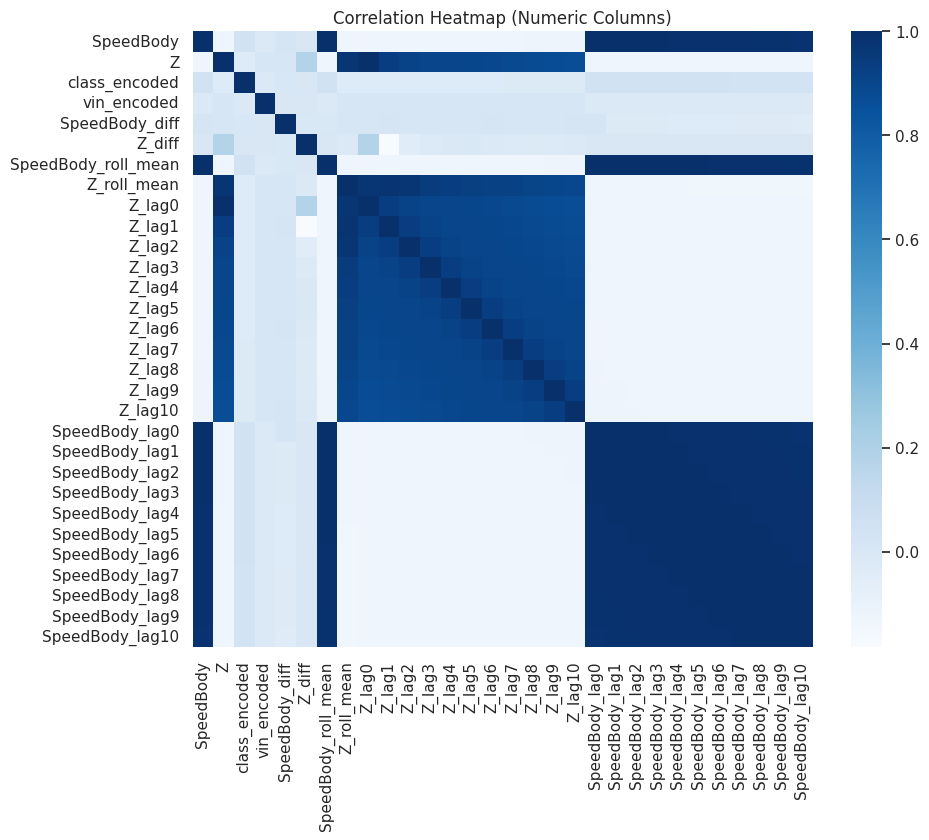


[Sequence Creation] Creating sequences grouped by 'run_id'...
[Sequence Creation] Displaying group sizes (first few):
run_id
car_1_0    8249
car_1_1    7807
car_1_2    7753
car_1_3    7708
car_1_4    8032
dtype: int64
[Sequence Creation] Created sequences for 17 groups.



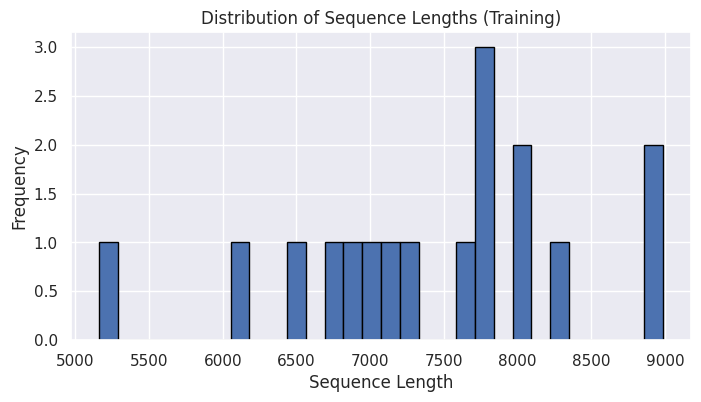

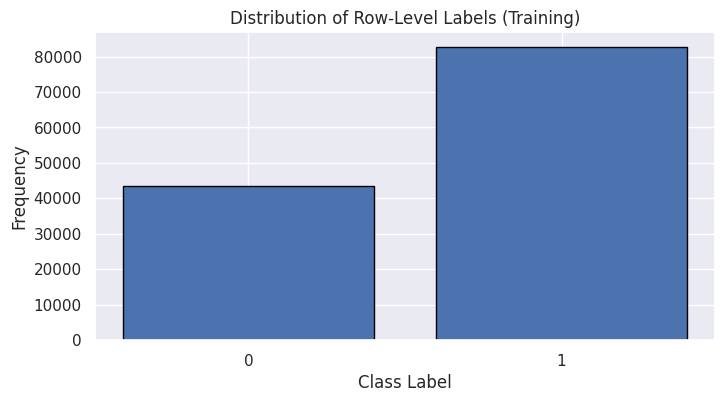

Computed class weights: [1.46185845 0.7599135 ]
[ModelTrainer] Using device: cuda
[Epoch 1] Train Loss: 0.1827, Train Acc: 0.6050 | Val Loss: 0.1560, Val Acc: 0.6493
[Epoch 2] Train Loss: 0.1473, Train Acc: 0.7205 | Val Loss: 0.1482, Val Acc: 0.6516
[Epoch 3] Train Loss: 0.1258, Train Acc: 0.7842 | Val Loss: 0.1399, Val Acc: 0.6722
[Epoch 4] Train Loss: 0.1164, Train Acc: 0.8192 | Val Loss: 0.1290, Val Acc: 0.6951
[Epoch 5] Train Loss: 0.1025, Train Acc: 0.8438 | Val Loss: 0.1148, Val Acc: 0.7500
[Epoch 6] Train Loss: 0.0914, Train Acc: 0.8638 | Val Loss: 0.0989, Val Acc: 0.8163
[Epoch 7] Train Loss: 0.0847, Train Acc: 0.8829 | Val Loss: 0.0859, Val Acc: 0.8624
[Epoch 8] Train Loss: 0.0802, Train Acc: 0.8920 | Val Loss: 0.0752, Val Acc: 0.8918
[Epoch 9] Train Loss: 0.0738, Train Acc: 0.9004 | Val Loss: 0.0681, Val Acc: 0.9119
[Epoch 10] Train Loss: 0.0709, Train Acc: 0.9041 | Val Loss: 0.0623, Val Acc: 0.9234
[Epoch 11] Train Loss: 0.0648, Train Acc: 0.9159 | Val Loss: 0.0605, Val Acc:

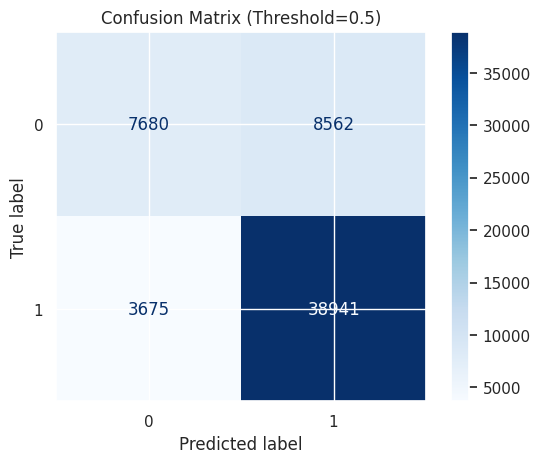

F1 Score: 0.8642 | AP Score: 0.8971


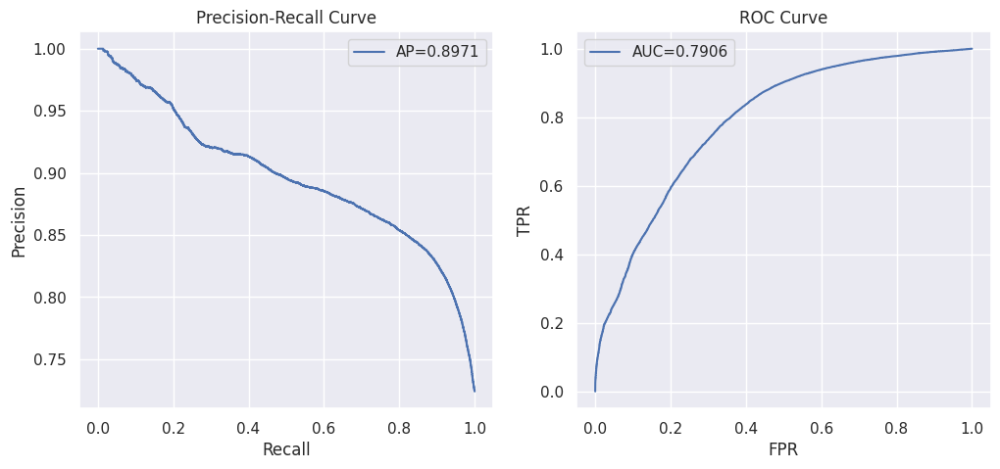

[Threshold Sweep] Best Threshold: 0.46 | F1: 0.8665


In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns  # Used for creating the correlation heatmap
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence, pad_packed_sequence
from torch.nn.utils import clip_grad_norm_
import torch.nn.functional as F
import pickle  # <-- Added for saving the model using pickle

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay, precision_recall_curve,
                             roc_curve, auc, f1_score, average_precision_score, classification_report)
from sklearn.utils.class_weight import compute_class_weight
import random


# Fix Torch Seed for reproducibility

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


# Focal Loss

class FocalLoss(nn.Module):

    def __init__(self, alpha=1.0, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        # inputs => shape [N], probabilities in [0,1]
        # targets => shape [N], binary {0,1}
        bce = F.binary_cross_entropy(inputs, targets, reduction='none')
        p_t = targets * inputs + (1 - targets) * (1 - inputs)  # Probability of the true label
        loss = self.alpha * (1 - p_t)**self.gamma * bce

        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        else:
            return loss

# Data Preprocessing & Feature Engineering

class DataPreprocessor:
    """
    This class handles data preprocessing including feature engineering,
    lag feature creation, label encoding, and scaling.
    """
    def __init__(self, scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'], drop_na_after_lag=True):
        self.scale = scale
        self.max_lag = max_lag
        self.lag_columns = lag_columns
        self.drop_na_after_lag = drop_na_after_lag

        self.scaler = None
        self.label_encoder_class = LabelEncoder()
        self.label_encoder_vin = LabelEncoder()

    def preprocess(self, df, is_train=True):
        print("\n[Preprocessing] Starting preprocessing...")

        # Remove unwanted columns if they exist.
        cols_to_drop = ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']

        df = df.drop(columns=[col for col in cols_to_drop if col in df.columns], errors='ignore')
        print(f"[Preprocessing] Dropped columns (if present): {cols_to_drop}")

        # Force class labels to be either 'OK' or 'KO'
        df['class'] = df['class'].apply(lambda x: 'OK' if x == 'OK' else 'KO')

        # Label encoding for both class and VIN.
        if is_train:
            print("[Preprocessing] Fitting label encoders for training data...")
            self.label_encoder_class.fit(df['class'])
            self.label_encoder_vin.fit(df['vin'])
        df['class_encoded'] = self.label_encoder_class.transform(df['class'])
        df['vin_encoded'] = self.label_encoder_vin.transform(df['vin'])
        print(f"[Preprocessing] Unique classes: {np.unique(df['class'])}")
        print(f"[Preprocessing] Encoded classes: {np.unique(df['class_encoded'])}")

        # Ensure 'run_id' column is available.
        if is_train:
            if 'run_id' not in df.columns:
                print("[Preprocessing] 'run_id' not found in training data. Creating it from 'vin'.")
                df['run_id'] = df['vin']
        else:
            if 'run_id' not in df.columns:
                df['run_id'] = df['vin']

        # Convert the date column to datetime and sort the DataFrame.
        df['date'] = pd.to_datetime(df['date'])
        df = df.sort_values('date').reset_index(drop=True)
        print("[Preprocessing] Sorted data by 'date'.")

        # Create additional features to capture dynamic behavior.
        df['SpeedBody_diff'] = df['SpeedBody'].diff()
        df['Z_diff'] = df['Z'].diff()
        df['SpeedBody_roll_mean'] = df['SpeedBody'].rolling(window=3, min_periods=1).mean()
        df['Z_roll_mean'] = df['Z'].rolling(window=3, min_periods=1).mean()

        # Create lag features for specified columns.
        print(f"[Preprocessing] Creating lag features for {self.lag_columns} with max_lag = {self.max_lag}...")
        group_col = 'run_id' if (is_train and 'run_id' in df.columns) else 'vin'
        for col in self.lag_columns:
            df[f'{col}_lag0'] = df[col]
            for lag in range(1, self.max_lag + 1):
                df[f'{col}_lag{lag}'] = df.groupby(group_col)[col].shift(lag)
        print("[Preprocessing] Lag features created.")

        # Handle missing values from lag feature creation.
        if self.drop_na_after_lag:
            df = df.dropna().reset_index(drop=True)
            print("[Preprocessing] Dropped rows with missing values after lag creation.")
        else:
            df = df.fillna(0)
            print("[Preprocessing] Filled missing values with 0 after lag creation.")
        print(f"[Preprocessing] Data shape after handling missing values: {df.shape}")

        # Define the final list of feature columns.
        base_features = ['SpeedBody', 'Z', 'SpeedBody_diff', 'Z_diff',
                         'SpeedBody_roll_mean', 'Z_roll_mean']
        lag_features = [f'{col}_lag{i}' for col in self.lag_columns for i in range(self.max_lag + 1)]
        feature_cols = list(set(base_features + lag_features))
        feature_cols.sort()
        print(f"[Preprocessing] Final feature columns: {feature_cols}")

        # Scale numerical features
        if self.scale:
            numeric_cols = [c for c in feature_cols if c not in ['class_encoded', 'vin_encoded']]
            if is_train:
                self.scaler = StandardScaler()
                df[numeric_cols] = self.scaler.fit_transform(df[numeric_cols])
                print("[Preprocessing] Fitted and applied scaler on training data.")
            else:
                df[numeric_cols] = self.scaler.transform(df[numeric_cols])
                print("[Preprocessing] Applied scaler on test data.")
        else:
            print("[Preprocessing] Scaling skipped as per configuration.")

        print("[Preprocessing] Preprocessing completed.\n")
        return df, feature_cols

# Data Exploration Function

def data_exploration(df):
    print("\n[Data Exploration] Basic Statistics:")
    print(df.describe(include='all'))

    print("\n[Data Exploration] Null Values in each column:")
    print(df.isnull().sum())

    numeric_cols = df.select_dtypes(include=[np.number]).columns
    plt.figure(figsize=(10, 8))
    corr_matrix = df[numeric_cols].corr()
    sns.heatmap(corr_matrix, annot=False, cmap='Blues')
    plt.title("Correlation Heatmap (Numeric Columns)")
    plt.show()

# Sequence Creation (Row-Level)

class SequenceCreator:
    """
    This class converts the preprocessed DataFrame into sequences.
    Each sequence represents a group and its associated features.
    """
    def create_sequences(self, df, feature_cols, group_col='run_id', return_group_ids=False):
        print(f"\n[Sequence Creation] Creating sequences grouped by '{group_col}'...")
        sequences, lengths, labels = [], [], []
        group_ids = []

        df = df.sort_values([group_col, 'date']).reset_index(drop=True)
        group_counts = df.groupby(group_col).size()
        print("[Sequence Creation] Displaying group sizes (first few):")
        print(group_counts.head())

        for g_id, group in df.groupby(group_col):
            seq = torch.tensor(group[feature_cols].values, dtype=torch.float32)
            label_seq = torch.tensor(group['class_encoded'].values, dtype=torch.long)
            sequences.append(seq)
            lengths.append(len(seq))
            labels.append(label_seq)
            if return_group_ids:
                group_ids.append(g_id)
        print(f"[Sequence Creation] Created sequences for {len(sequences)} groups.\n")

        if return_group_ids:
            return sequences, lengths, labels, group_ids
        else:
            return sequences, lengths, labels

# PyTorch Dataset & Collate Function

class RunSequenceDataset(Dataset):
    """
    Custom PyTorch Dataset for holding sequences and corresponding labels.
    """
    def __init__(self, sequences, lengths, labels):
        self.sequences = sequences
        self.lengths = lengths
        self.labels = labels

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], self.lengths[idx], self.labels[idx]

def collate_fn(batch):
    batch.sort(key=lambda x: x[1], reverse=True)
    sequences, lengths, label_seqs = zip(*batch)
    padded_seqs = pad_sequence(sequences, batch_first=True)
    padded_labels = pad_sequence(label_seqs, batch_first=True)
    return padded_seqs, torch.tensor(lengths, dtype=torch.long), padded_labels

# CNN Model

class CNN1DClassifier(nn.Module):
    def __init__(self, input_size, num_filters=64, kernel_size=5, stride=1, dropout=0.3):
        super(CNN1DClassifier, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=num_filters,
                               kernel_size=kernel_size, stride=stride, padding=kernel_size//2)
        self.bn1 = nn.BatchNorm1d(num_filters)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout)

        self.conv2 = nn.Conv1d(in_channels=num_filters, out_channels=num_filters,
                               kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm1d(num_filters)

        self.fc = nn.Linear(num_filters, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = x.permute(0, 2, 1)
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.dropout(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        x = self.dropout(x)

        x = x.permute(0, 2, 1)
        out = self.fc(x)
        out = self.sigmoid(out).squeeze(-1)
        return out

class CNN1D_DNNClassifier(nn.Module):
    def __init__(self, input_size, num_filters=64, kernel_size=5, hidden_dim=128, dropout=0.3):
        super(CNN1D_DNNClassifier, self).__init__()
        self.conv1 = nn.Conv1d(input_size, num_filters, kernel_size=kernel_size, padding=kernel_size // 2)
        self.bn1 = nn.BatchNorm1d(num_filters)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout)

        self.conv2 = nn.Conv1d(num_filters, num_filters, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm1d(num_filters)

        self.dnn = nn.Sequential(
            nn.Linear(num_filters, hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, 1)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = x.permute(0, 2, 1)
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.conv2(x)))
        x = self.dropout(x)

        x = x.permute(0, 2, 1)
        x = self.dnn(x)
        return self.sigmoid(x).squeeze(-1)

# Breaking a Long Sequence into Chunks

def chunk_sequence(seq, label_seq, chunk_size=5000):
    sub_sequences = []
    sub_labels = []
    sub_lengths = []
    n = len(seq)
    start = 0
    while start < n:
        end = min(start + chunk_size, n)
        sub_sequences.append(seq[start:end])
        sub_labels.append(label_seq[start:end])
        sub_lengths.append(end - start)
        start = end
    return sub_sequences, sub_labels, sub_lengths

# Model Trainer

class ModelTrainer:
    def __init__(self,
                 input_size,
                 model_type='cnn',
                 lr=1e-3,
                 batch_size=4,
                 device=None,
                 class_weight=None,
                 use_lr_scheduler=True,
                 use_focal_loss=False,
                 focal_alpha=1.0,
                 focal_gamma=2.0,
                 max_grad_norm=5.0):

        self.device = device if device else ('cuda' if torch.cuda.is_available() else 'cpu')
        print(f"[ModelTrainer] Using device: {self.device}")

        # Choosing model
        if model_type == 'cnn':
            self.model = CNN1DClassifier(input_size=input_size).to(self.device)
            self.model_name = "cnn_model.pkl"
        elif model_type == 'cnn_dnn':
            self.model = CNN1D_DNNClassifier(input_size=input_size).to(self.device)
            self.model_name = "cnn_dnn_model.pkl"
        else:
            raise ValueError("Invalid model_type: use 'cnn' or 'cnn_dnn'")

        self.lr = lr
        self.batch_size = batch_size
        self.class_weight = class_weight
        self.use_lr_scheduler = use_lr_scheduler
        self.use_focal_loss = use_focal_loss
        self.max_grad_norm = max_grad_norm

        if use_focal_loss:
            self.criterion = FocalLoss(alpha=focal_alpha, gamma=focal_gamma)
            self.use_manual_class_weight = False
        else:
            if class_weight is not None:
                self.use_manual_class_weight = True
                self.criterion = nn.BCELoss(reduction='none')
            else:
                self.use_manual_class_weight = False
                self.criterion = nn.BCELoss()

        self.optimizer = optim.Adam(self.model.parameters(), lr=self.lr, weight_decay=1e-4)
        self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(self.optimizer, mode='min', factor=0.5, patience=2)


    def train_model(self, train_dataset, val_dataset, epochs=20, patience=5):
        train_loader = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True, collate_fn=collate_fn)
        val_loader = DataLoader(val_dataset, batch_size=self.batch_size, shuffle=False, collate_fn=collate_fn)

        best_val_loss = float('inf')
        best_model_state = None
        patience_counter = 0

        for epoch in range(epochs):
            self.model.train()
            train_loss, correct, total = 0.0, 0, 0
            for X, lengths, y in train_loader:
                lengths = lengths.to(self.device)
                X, y = X.to(self.device), y.to(self.device)

                self.optimizer.zero_grad()
                preds = self.model(X)

                mask = torch.arange(preds.size(1), device=self.device)[None, :] < lengths[:, None]
                preds_masked = preds[mask]
                y_masked = y[mask].float()

                if self.use_focal_loss:
                    loss = self.criterion(preds_masked, y_masked)
                elif self.use_manual_class_weight:
                    weights_tensor = y_masked.clone()
                    weights_tensor[weights_tensor == 0] = self.class_weight[0]
                    weights_tensor[weights_tensor == 1] = self.class_weight[1]
                    loss = (self.criterion(preds_masked, y_masked) * weights_tensor).mean()
                else:
                    loss = self.criterion(preds_masked, y_masked)

                loss.backward()
                clip_grad_norm_(self.model.parameters(), self.max_grad_norm)
                self.optimizer.step()

                train_loss += loss.item()
                correct += (preds_masked >= 0.5).eq(y_masked).sum().item()
                total += y_masked.numel()

            train_acc = correct / total
            avg_train_loss = train_loss / len(train_loader)

            # Validation
            self.model.eval()
            val_loss, val_correct, val_total = 0.0, 0, 0
            with torch.no_grad():
                for X, lengths, y in val_loader:
                    lengths = lengths.to(self.device)
                    X, y = X.to(self.device), y.to(self.device)
                    preds = self.model(X)

                    mask = torch.arange(preds.size(1), device=self.device)[None, :] < lengths[:, None]
                    preds_masked = preds[mask]
                    y_masked = y[mask].float()

                    if self.use_focal_loss:
                        loss = self.criterion(preds_masked, y_masked)
                    elif self.use_manual_class_weight:
                        weights_tensor = y_masked.clone()
                        weights_tensor[y_masked == 0] = self.class_weight[0]
                        weights_tensor[y_masked == 1] = self.class_weight[1]
                        loss = (self.criterion(preds_masked, y_masked) * weights_tensor).mean()
                    else:
                        loss = self.criterion(preds_masked, y_masked)

                    val_loss += loss.item()
                    val_correct += (preds_masked >= 0.5).eq(y_masked).sum().item()
                    val_total += y_masked.numel()

            val_acc = val_correct / val_total
            avg_val_loss = val_loss / len(val_loader)

            if self.scheduler:
                self.scheduler.step(avg_val_loss)

            print(f"[Epoch {epoch+1}] Train Loss: {avg_train_loss:.4f}, Train Acc: {train_acc:.4f} | Val Loss: {avg_val_loss:.4f}, Val Acc: {val_acc:.4f}")

            if avg_val_loss < best_val_loss:
                best_val_loss = avg_val_loss
                best_model_state = self.model.state_dict()
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print("[Early Stopping]")
                    break

        if best_model_state:
            self.model.load_state_dict(best_model_state)

    def evaluate_model(self, dataset, custom_threshold=0.5):
        loader = DataLoader(dataset, batch_size=self.batch_size, shuffle=False, collate_fn=collate_fn)
        self.model.eval()
        all_outputs, all_targets = [], []

        with torch.no_grad():
            for X, lengths, y in loader:
                lengths = lengths.to(self.device)
                X, y = X.to(self.device), y.to(self.device)
                preds = self.model(X)
                mask = torch.arange(preds.size(1), device=self.device)[None, :] < lengths[:, None]
                preds_masked = preds[mask]
                y_masked = y[mask].float()

                all_outputs.append(preds_masked.cpu())
                all_targets.append(y_masked.cpu())

        y_true = torch.cat(all_targets).numpy()
        y_scores = torch.cat(all_outputs).numpy()
        y_pred = (y_scores >= custom_threshold).astype(int)

        print(f"[Evaluation] Threshold = {custom_threshold:.2f}")
        print(classification_report(y_true, y_pred, digits=4))

        cm = confusion_matrix(y_true, y_pred)
        ConfusionMatrixDisplay(cm).plot(cmap=plt.cm.Blues)
        plt.title(f"Confusion Matrix (Threshold={custom_threshold})")
        plt.show()

        precision, recall, _ = precision_recall_curve(y_true, y_scores)
        f1 = f1_score(y_true, y_pred)
        ap = average_precision_score(y_true, y_scores)
        print(f"F1 Score: {f1:.4f} | AP Score: {ap:.4f}")

        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(recall, precision, label=f"AP={ap:.4f}")
        plt.xlabel("Recall"); plt.ylabel("Precision")
        plt.title("Precision-Recall Curve"); plt.legend()

        fpr, tpr, _ = roc_curve(y_true, y_scores)
        plt.subplot(1, 2, 2)
        plt.plot(fpr, tpr, label=f"AUC={auc(fpr, tpr):.4f}")
        plt.xlabel("FPR"); plt.ylabel("TPR")
        plt.title("ROC Curve"); plt.legend()
        plt.show()

        self.threshold_sweep(y_scores, y_true)

    def threshold_sweep(self, scores, targets):
        best_thresh, best_f1 = 0.0, 0.0
        for th in np.linspace(0.01, 0.99, 99):
            pred = (scores >= th).astype(int)
            score = f1_score(targets, pred)
            if score > best_f1:
                best_f1 = score
                best_thresh = th
        print(f"[Threshold Sweep] Best Threshold: {best_thresh:.2f} | F1: {best_f1:.4f}")

    def save_model(self):
        self.model.to("cpu")
        with open(self.model_name, "wb") as f:
            pickle.dump(self.model, f)
        print(f"[ModelTrainer] Saved model to {self.model_name}")
        self.model.to(self.device)

    def load_model(self, filename):
        """
        Load the RNN model from disk using pickle.
        """
        with open(filename, 'rb') as f:
            self.model = pickle.load(f)
        self.model.to(self.device)
        print(f"[ModelTrainer] Model loaded from {filename}")


if __name__ == "__main__":
    # TRAINING DATA PROCESSING
    print("\n========== TRAINING DATA ==========")
    preprocessor = DataPreprocessor(scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'], drop_na_after_lag=True)
    df_train_processed, feature_cols = preprocessor.preprocess(df, is_train=True)

    data_exploration(df_train_processed)

    sequence_creator = SequenceCreator()
    train_sequences, train_lengths, train_labels, train_group_ids = sequence_creator.create_sequences(
        df_train_processed, feature_cols, group_col='run_id', return_group_ids=True
    )

    plt.figure(figsize=(8, 4))
    plt.hist(train_lengths, bins=30, edgecolor='black')
    plt.xlabel("Sequence Length")
    plt.ylabel("Frequency")
    plt.title("Distribution of Sequence Lengths (Training)")
    plt.show()

    all_train_labels = np.concatenate([lab.numpy() for lab in train_labels])
    plt.figure(figsize=(8, 4))
    plt.hist(all_train_labels, bins=np.arange(-0.5, 2, 1), edgecolor='black', rwidth=0.8)
    plt.xlabel("Class Label")
    plt.ylabel("Frequency")
    plt.title("Distribution of Row-Level Labels (Training)")
    plt.xticks([0, 1])
    plt.show()

    from sklearn.model_selection import train_test_split
    train_seq_split, val_seq_split, train_len_split, val_len_split, train_lab_split, val_lab_split = train_test_split(
        train_sequences, train_lengths, train_labels, test_size=0.2, random_state=42
    )

    train_dataset = RunSequenceDataset(train_seq_split, train_len_split, train_lab_split)
    val_dataset = RunSequenceDataset(val_seq_split, val_len_split, val_lab_split)

    # COMPUTING CLASS WEIGHTS
    all_train_labels_array = np.concatenate([lab.numpy() for lab in train_lab_split])
    classes = np.unique(all_train_labels_array)
    computed_weights = compute_class_weight(class_weight='balanced', classes=classes, y=all_train_labels_array)
    print("Computed class weights:", computed_weights)

   # MODEL INITIALIZATION & TRAINING (CNN)
    trainer = ModelTrainer(
        input_size=len(feature_cols),
        model_type='cnn',
        lr=1e-3,
        batch_size=4,
        device=None,
        class_weight=computed_weights,
        use_lr_scheduler=True,
        use_focal_loss=True,
        focal_alpha=1.0,
        focal_gamma=2.0,
        max_grad_norm=5.0
    )

    trainer.train_model(train_dataset, val_dataset, epochs=30, patience=5)

    # Save the trained CNN model as cnn_model.pkl
    trainer.save_model()

    # TEST DATA PROCESSING & EVALUATION
    print("\n========== TEST DATA ==========")
    df_test_processed, _ = preprocessor.preprocess(test, is_train=False)
    test_sequences, test_lengths, test_labels, test_group_ids = sequence_creator.create_sequences(
        df_test_processed, feature_cols, group_col='run_id', return_group_ids=True
    )

    chunked_test_sequences = []
    chunked_test_labels = []
    chunked_test_lengths = []
    for seq, lab, length in zip(test_sequences, test_labels, test_lengths):
        if length > 5000:
            sub_seqs, sub_labs, sub_lens = chunk_sequence(seq, lab, chunk_size=5000)
            chunked_test_sequences.extend(sub_seqs)
            chunked_test_labels.extend(sub_labs)
            chunked_test_lengths.extend(sub_lens)
        else:
            chunked_test_sequences.append(seq)
            chunked_test_labels.append(lab)
            chunked_test_lengths.append(length)

    test_dataset = RunSequenceDataset(chunked_test_sequences, chunked_test_lengths, chunked_test_labels)
    print(f"[Test Data] Number of sequences (chunks): {len(chunked_test_sequences)}")

    # Evaluate with default threshold=0.5
    trainer.evaluate_model(test_dataset)





========== TRAINING DATA ==========

[Preprocessing] Starting preprocessing...
[Preprocessing] Dropped columns (if present): ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']
[Preprocessing] Fitting label encoders for training data...
[Preprocessing] Unique classes: ['KO' 'OK']
[Preprocessing] Encoded classes: [0 1]
[Preprocessing] Sorted data by 'date'.
[Preprocessing] Creating lag features for ['Z', 'SpeedBody'] with max_lag = 10...
[Preprocessing] Lag features created.
[Preprocessing] Dropped rows with missing values after lag creation.
[Preprocessing] Data shape after handling missing values: (126204, 34)
[Preprocessing] Final feature columns: ['SpeedBody', 'SpeedBody_diff', 'SpeedBody_lag0', 'SpeedBody_lag1', 'SpeedBody_lag10', 'SpeedBody_lag2', 'SpeedBody_lag3', 'SpeedBody_lag4', 'SpeedBody_lag5', 'SpeedBody_lag6', 'SpeedBody_lag7', 'SpeedBody_lag8', 'SpeedBody_lag9', 'SpeedBody_roll_mean', 'Z', 'Z_diff', 'Z_lag0', 'Z_lag1', 'Z_lag10', 'Z_lag2', 'Z_lag3', 'Z_lag4', 'Z_l

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning:

invalid value encountered in greater

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning:

invalid value encountered in less

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning:

invalid value encountered in greater



           vin                           date     SpeedBody             Z  \
count   126204                         126204  1.262040e+05  1.262040e+05   
unique       3                            NaN           NaN           NaN   
top      car_1                            NaN           NaN           NaN   
freq     53641                            NaN           NaN           NaN   
mean       NaN  2023-08-12 08:36:39.944741888 -9.188344e-17 -1.846677e-17   
min        NaN     2023-06-12 08:02:40.860000 -1.781299e+00 -4.077865e+00   
25%        NaN  2023-06-14 06:11:50.069750016 -9.503740e-01 -5.340732e-01   
50%        NaN  2023-09-18 09:16:56.315999744  1.029494e-01 -4.629456e-01   
75%        NaN  2023-09-20 07:06:35.696500224  8.663360e-01 -1.201332e-01   
max        NaN     2023-10-10 08:01:16.344000  2.477703e+00  4.199815e+00   
std        NaN                            NaN  1.000004e+00  1.000004e+00   

         class   run_id  class_encoded    vin_encoded  SpeedBody_diff  \
co

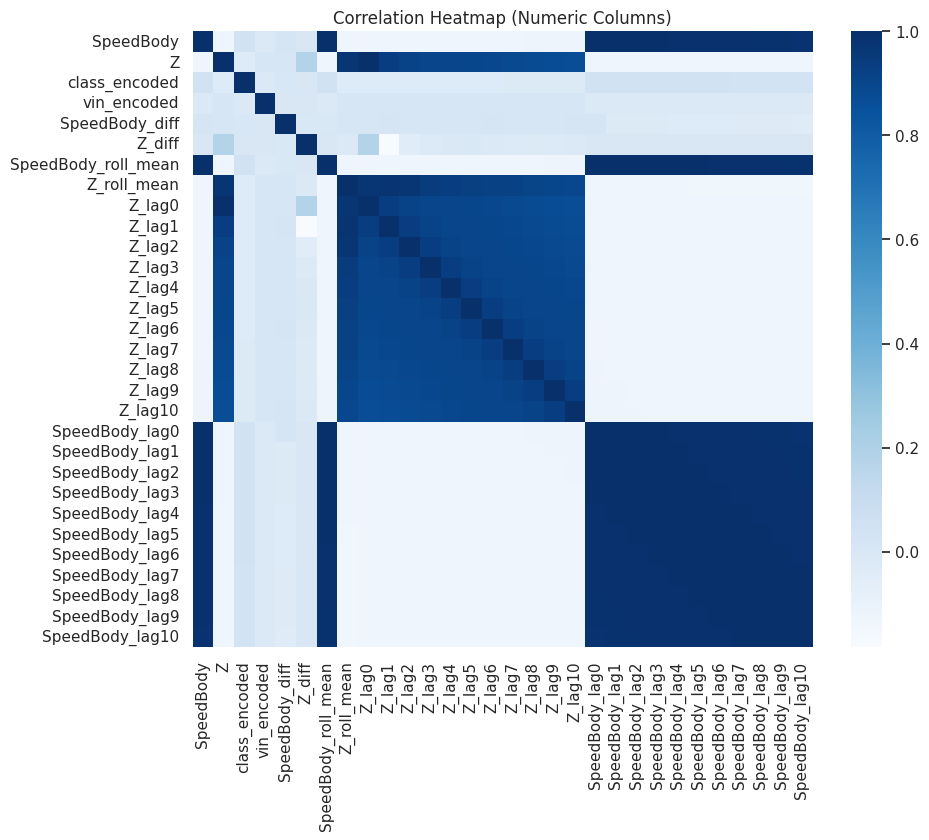


[Sequence Creation] Creating sequences grouped by 'run_id'...
[Sequence Creation] Displaying group sizes (first few):
run_id
car_1_0    8249
car_1_1    7807
car_1_2    7753
car_1_3    7708
car_1_4    8032
dtype: int64
[Sequence Creation] Created sequences for 17 groups.



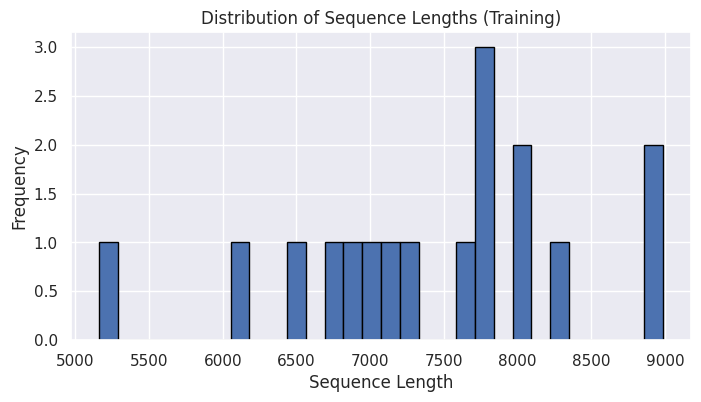

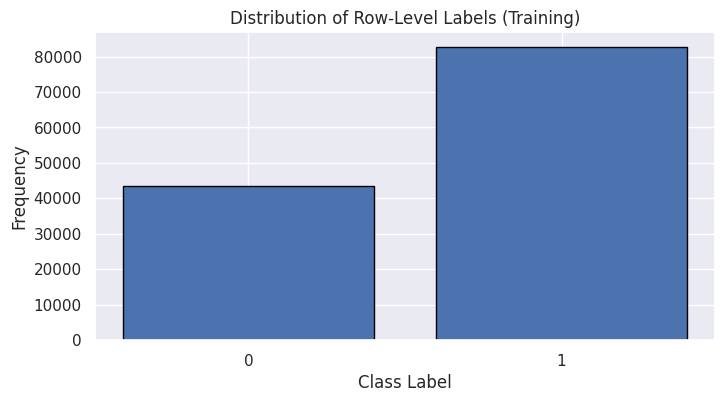

Computed class weights: [1.46185845 0.7599135 ]
[ModelTrainer] Using device: cuda
[Epoch 1] Train Loss: 0.1594, Train Acc: 0.6572 | Val Loss: 0.1575, Val Acc: 0.6473
[Epoch 2] Train Loss: 0.1382, Train Acc: 0.7351 | Val Loss: 0.1488, Val Acc: 0.6507
[Epoch 3] Train Loss: 0.1226, Train Acc: 0.7991 | Val Loss: 0.1355, Val Acc: 0.6849
[Epoch 4] Train Loss: 0.1075, Train Acc: 0.8421 | Val Loss: 0.1173, Val Acc: 0.7503
[Epoch 5] Train Loss: 0.0913, Train Acc: 0.8659 | Val Loss: 0.0962, Val Acc: 0.8382
[Epoch 6] Train Loss: 0.0848, Train Acc: 0.8761 | Val Loss: 0.0806, Val Acc: 0.8621
[Epoch 7] Train Loss: 0.0731, Train Acc: 0.8842 | Val Loss: 0.0672, Val Acc: 0.9118
[Epoch 8] Train Loss: 0.0675, Train Acc: 0.8993 | Val Loss: 0.0581, Val Acc: 0.9261
[Epoch 9] Train Loss: 0.0629, Train Acc: 0.9093 | Val Loss: 0.0542, Val Acc: 0.9297
[Epoch 10] Train Loss: 0.0605, Train Acc: 0.9156 | Val Loss: 0.0491, Val Acc: 0.9376
[Epoch 11] Train Loss: 0.0580, Train Acc: 0.9236 | Val Loss: 0.0469, Val Acc:

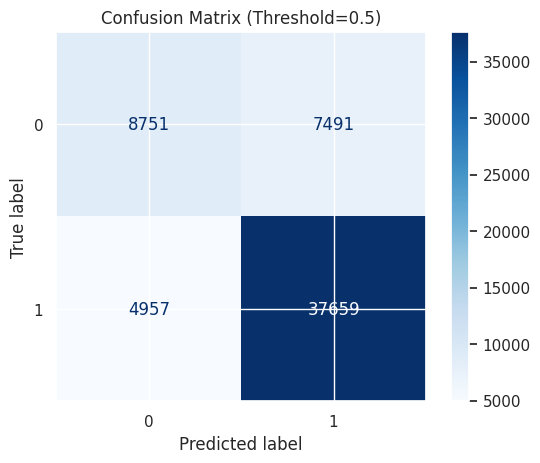

F1 Score: 0.8582 | AP Score: 0.8972


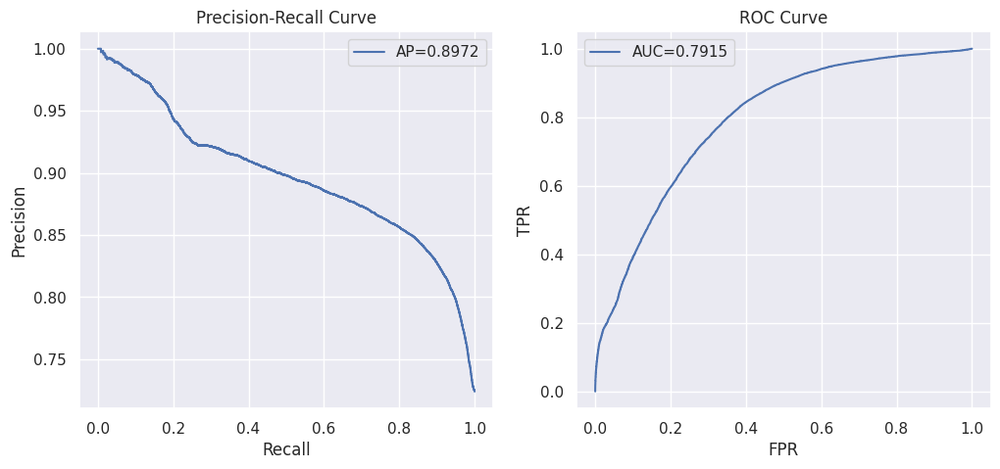

[Threshold Sweep] Best Threshold: 0.40 | F1: 0.8674


In [57]:
if __name__ == "__main__":
    # TRAINING DATA PROCESSING
    print("\n========== TRAINING DATA ==========")
    preprocessor = DataPreprocessor(scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'], drop_na_after_lag=True)
    df_train_processed, feature_cols = preprocessor.preprocess(df, is_train=True)

    data_exploration(df_train_processed)

    sequence_creator = SequenceCreator()
    train_sequences, train_lengths, train_labels, train_group_ids = sequence_creator.create_sequences(
        df_train_processed, feature_cols, group_col='run_id', return_group_ids=True
    )

    plt.figure(figsize=(8, 4))
    plt.hist(train_lengths, bins=30, edgecolor='black')
    plt.xlabel("Sequence Length")
    plt.ylabel("Frequency")
    plt.title("Distribution of Sequence Lengths (Training)")
    plt.show()

    all_train_labels = np.concatenate([lab.numpy() for lab in train_labels])
    plt.figure(figsize=(8, 4))
    plt.hist(all_train_labels, bins=np.arange(-0.5, 2, 1), edgecolor='black', rwidth=0.8)
    plt.xlabel("Class Label")
    plt.ylabel("Frequency")
    plt.title("Distribution of Row-Level Labels (Training)")
    plt.xticks([0, 1])
    plt.show()

    from sklearn.model_selection import train_test_split
    train_seq_split, val_seq_split, train_len_split, val_len_split, train_lab_split, val_lab_split = train_test_split(
        train_sequences, train_lengths, train_labels, test_size=0.2, random_state=42
    )

    train_dataset = RunSequenceDataset(train_seq_split, train_len_split, train_lab_split)
    val_dataset = RunSequenceDataset(val_seq_split, val_len_split, val_lab_split)

    #  COMPUTING CLASS WEIGHTS
    all_train_labels_array = np.concatenate([lab.numpy() for lab in train_lab_split])
    classes = np.unique(all_train_labels_array)
    computed_weights = compute_class_weight(class_weight='balanced', classes=classes, y=all_train_labels_array)
    print("Computed class weights:", computed_weights)

    #  MODEL INITIALIZATION & TRAINING (CNN+DNN)
    trainer = ModelTrainer(
        input_size=len(feature_cols),
        model_type='cnn_dnn',
        lr=1e-3,
        batch_size=4,
        device=None,
        class_weight=computed_weights,
        use_lr_scheduler=True,
        use_focal_loss=True,
        focal_alpha=1.0,
        focal_gamma=2.0,
        max_grad_norm=5.0
    )

    trainer.train_model(train_dataset, val_dataset, epochs=30, patience=5)

    # Save the trained CNN+DNN model as cnn_dnn_model.pkl
    trainer.save_model()
    # TEST DATA PROCESSING & EVALUATION
    print("\n========== TEST DATA ==========")
    df_test_processed, _ = preprocessor.preprocess(test, is_train=False)
    test_sequences, test_lengths, test_labels, test_group_ids = sequence_creator.create_sequences(
        df_test_processed, feature_cols, group_col='run_id', return_group_ids=True
    )

    chunked_test_sequences = []
    chunked_test_labels = []
    chunked_test_lengths = []
    for seq, lab, length in zip(test_sequences, test_labels, test_lengths):
        if length > 5000:
            sub_seqs, sub_labs, sub_lens = chunk_sequence(seq, lab, chunk_size=5000)
            chunked_test_sequences.extend(sub_seqs)
            chunked_test_labels.extend(sub_labs)
            chunked_test_lengths.extend(sub_lens)
        else:
            chunked_test_sequences.append(seq)
            chunked_test_labels.append(lab)
            chunked_test_lengths.append(length)

    test_dataset = RunSequenceDataset(chunked_test_sequences, chunked_test_lengths, chunked_test_labels)
    print(f"[Test Data] Number of sequences (chunks): {len(chunked_test_sequences)}")

    # Evaluate with default threshold=0.5
    trainer.evaluate_model(test_dataset)


### **CNN & Bi-Directional LSTM Approach**

### **Hybrid CNN-LSTM Approach**

### **CNN-RNN Hybrid Sequence Classification Pipeline**
This pipeline implements a hybrid deep learning architecture that combines 1D convolutional layers with a recurrent neural network (LSTM or GRU) to perform binary sequence classification on time-series sensor data (Z, SpeedBody). The model is trained to detect anomalies (KO) vs normal behavior (OK) at the row level across sequences.

### **Architecture Flow**

Input Sequence ↓

[ Conv1D → BatchNorm → ReLU ] ↓

[ Conv1D → BatchNorm → ReLU ] ↓

Dropout ↓

[ LSTM / GRU ] ↓

[ Linear → ReLU → Dropout → Linear ] ↓


Sigmoid ↓

Per-Timestep Probabilities




**RNN (LSTM or GRU) captures long-term dependencies.**

MLP Head performs final binary classification for each timestep.

Sigmoid converts logits to probabilities.

### **Data Preprocessing**
Label encoding for class and vin

Sorted by date, grouped by run_id

Created time-based features: diff, rolling mean, and lag features (0–10)

Optional: scale features using StandardScaler

Drop or fill missing values post-lagging

### **Sequence Construction**
Grouped by run_id, converted into sequences

Each sequence has variable length (based on actual runs)

Labels are aligned to the sequence for per-timestep supervision

Very long sequences are split into fixed-length chunks

### **Class Imbalance Handling**
Class Weights: Computed using compute_class_weight for use in BCE loss

Optional Focal Loss: Enhances learning from difficult (minority class) examples with tunable alpha and gamma

Gradient Clipping: Stabilizes training during backpropagation

### **Evaluation Metrics**
Per-timestep binary classification evaluated with:

Accuracy, F1 Score, Average Precision

ROC Curve + AUC

Precision-Recall Curve

Confusion Matrix

Threshold Sweep:

Multiple thresholds are tested (e.g., 0.3 → 0.8)

Best threshold selected using macro F1 score

### **Training Strategy**
Optimizer: Adam

Scheduler: ReduceLROnPlateau (monitors macro F1)

Early stopping: based on macro F1 (not just loss)

Model checkpointing: best model saved using pickle (hybrid_model.pkl)

### **Model Persistence**
Model is saved as a .pkl file

Can be reloaded for inference using pickle.load()


========== TRAINING DATA ==========

[Preprocessing] Starting preprocessing...
[Preprocessing] Dropped columns (if present): ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']
[Preprocessing] Fitting label encoders for training data...
[Preprocessing] Unique classes: ['KO' 'OK']
[Preprocessing] Encoded classes: [0 1]
[Preprocessing] Sorted data by 'date'.
[Preprocessing] Creating lag features for ['Z', 'SpeedBody'] with max_lag = 10...
[Preprocessing] Lag features created.
[Preprocessing] Dropped rows with missing values after lag creation.
[Preprocessing] Data shape after handling missing values: (126204, 34)
[Preprocessing] Final feature columns: ['SpeedBody', 'SpeedBody_diff', 'SpeedBody_lag0', 'SpeedBody_lag1', 'SpeedBody_lag10', 'SpeedBody_lag2', 'SpeedBody_lag3', 'SpeedBody_lag4', 'SpeedBody_lag5', 'SpeedBody_lag6', 'SpeedBody_lag7', 'SpeedBody_lag8', 'SpeedBody_lag9', 'SpeedBody_roll_mean', 'Z', 'Z_diff', 'Z_lag0', 'Z_lag1', 'Z_lag10', 'Z_lag2', 'Z_lag3', 'Z_lag4', 'Z_l

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning:

invalid value encountered in greater

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning:

invalid value encountered in less

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning:

invalid value encountered in greater



           vin                           date     SpeedBody             Z  \
count   126204                         126204  1.262040e+05  1.262040e+05   
unique       3                            NaN           NaN           NaN   
top      car_1                            NaN           NaN           NaN   
freq     53641                            NaN           NaN           NaN   
mean       NaN  2023-08-12 08:36:39.944741888 -9.188344e-17 -1.846677e-17   
min        NaN     2023-06-12 08:02:40.860000 -1.781299e+00 -4.077865e+00   
25%        NaN  2023-06-14 06:11:50.069750016 -9.503740e-01 -5.340732e-01   
50%        NaN  2023-09-18 09:16:56.315999744  1.029494e-01 -4.629456e-01   
75%        NaN  2023-09-20 07:06:35.696500224  8.663360e-01 -1.201332e-01   
max        NaN     2023-10-10 08:01:16.344000  2.477703e+00  4.199815e+00   
std        NaN                            NaN  1.000004e+00  1.000004e+00   

         class   run_id  class_encoded    vin_encoded  SpeedBody_diff  \
co

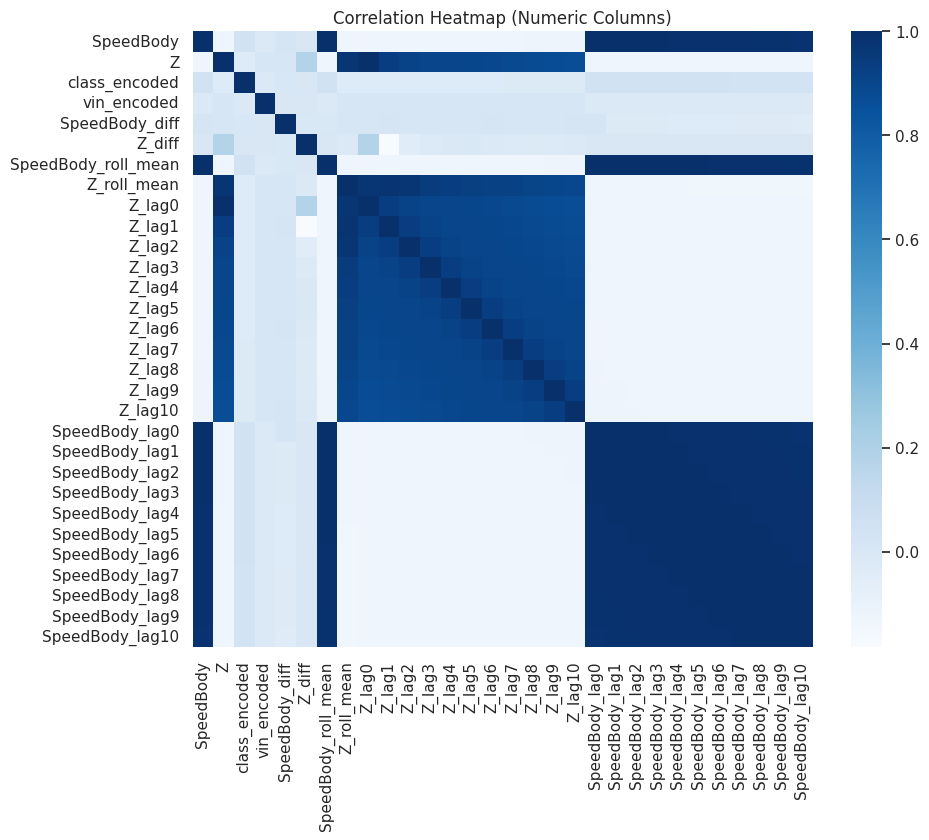


[Sequence Creation] Creating sequences grouped by 'run_id'...
[Sequence Creation] Displaying group sizes (first few):
run_id
car_1_0    8249
car_1_1    7807
car_1_2    7753
car_1_3    7708
car_1_4    8032
dtype: int64
[Sequence Creation] Created sequences for 17 groups.



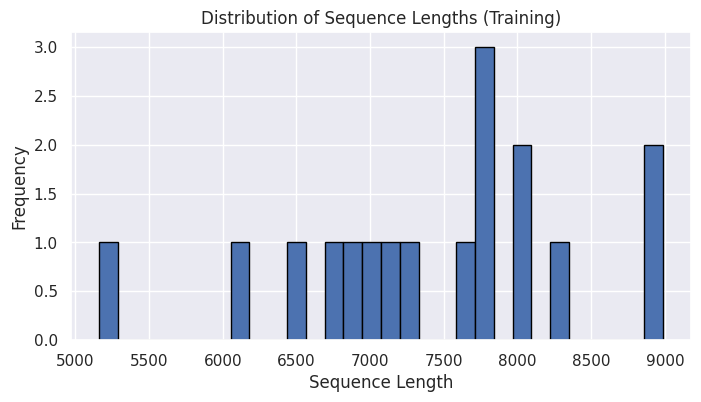

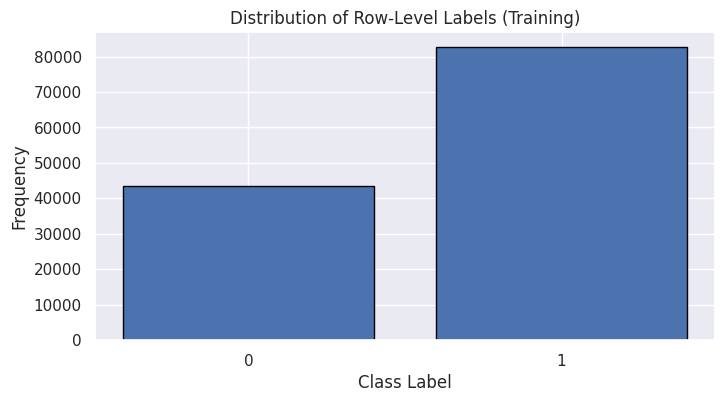

Computed class weights: [1.46185845 0.7599135 ]

[ModelTrainer] Using device: cuda
[ModelTrainer] Using class weights: [1.46185845 0.7599135 ]

[ModelTrainer] Starting training...


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning:

The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.



[Epoch 01] Train Loss: 0.6949, Train Acc: 0.3577 | Val MacroF1: 0.2609, Val Acc: 0.3530
[Epoch 02] Train Loss: 0.6834, Train Acc: 0.4998 | Val MacroF1: 0.6597, Val Acc: 0.6598
[Epoch 03] Train Loss: 0.6499, Train Acc: 0.7298 | Val MacroF1: 0.7781, Val Acc: 0.8130
[Epoch 04] Train Loss: 0.5905, Train Acc: 0.8800 | Val MacroF1: 0.7747, Val Acc: 0.8169
[Epoch 05] Train Loss: 0.4792, Train Acc: 0.9311 | Val MacroF1: 0.8402, Val Acc: 0.8598
[Epoch 06] Train Loss: 0.3470, Train Acc: 0.9367 | Val MacroF1: 0.9260, Val Acc: 0.9321
[Epoch 07] Train Loss: 0.2480, Train Acc: 0.9339 | Val MacroF1: 0.9295, Val Acc: 0.9348
[Epoch 08] Train Loss: 0.2017, Train Acc: 0.9450 | Val MacroF1: 0.9252, Val Acc: 0.9300
[Epoch 09] Train Loss: 0.3952, Train Acc: 0.8292 | Val MacroF1: 0.8827, Val Acc: 0.8874
[Epoch 10] Train Loss: 0.2478, Train Acc: 0.9235 | Val MacroF1: 0.9085, Val Acc: 0.9147
[Epoch 11] Train Loss: 0.2125, Train Acc: 0.9413 | Val MacroF1: 0.9534, Val Acc: 0.9572
[Epoch 12] Train Loss: 0.1847, T

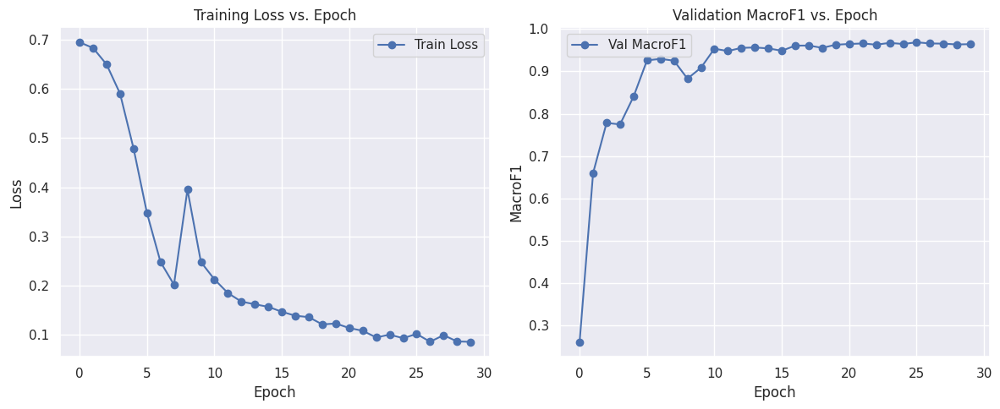

Hybrid model saved as 'hybrid_model.pkl'

========== TEST DATA ==========

[Preprocessing] Starting preprocessing...
[Preprocessing] Dropped columns (if present): ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']
[Preprocessing] Unique classes: ['KO' 'OK']
[Preprocessing] Encoded classes: [0 1]
[Preprocessing] Sorted data by 'date'.
[Preprocessing] Creating lag features for ['Z', 'SpeedBody'] with max_lag = 10...
[Preprocessing] Lag features created.
[Preprocessing] Dropped rows with missing values after lag creation.
[Preprocessing] Data shape after handling missing values: (58858, 34)
[Preprocessing] Final feature columns: ['SpeedBody', 'SpeedBody_diff', 'SpeedBody_lag0', 'SpeedBody_lag1', 'SpeedBody_lag10', 'SpeedBody_lag2', 'SpeedBody_lag3', 'SpeedBody_lag4', 'SpeedBody_lag5', 'SpeedBody_lag6', 'SpeedBody_lag7', 'SpeedBody_lag8', 'SpeedBody_lag9', 'SpeedBody_roll_mean', 'Z', 'Z_diff', 'Z_lag0', 'Z_lag1', 'Z_lag10', 'Z_lag2', 'Z_lag3', 'Z_lag4', 'Z_lag5', 'Z_lag6', 'Z_lag7'

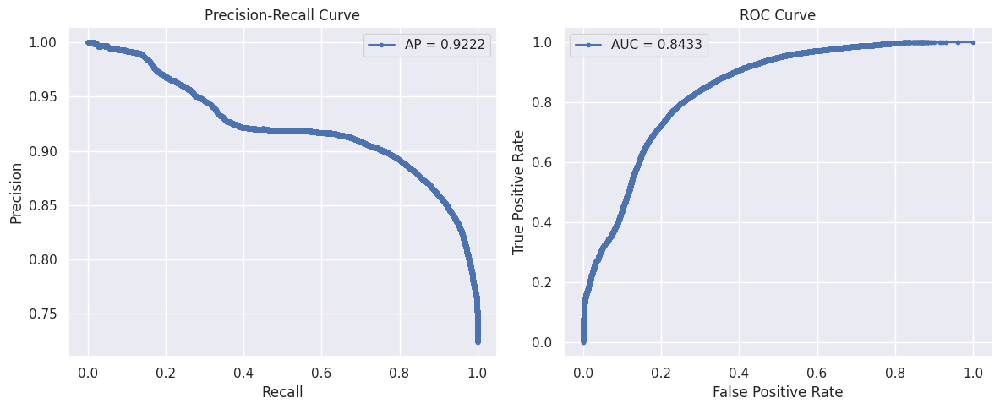

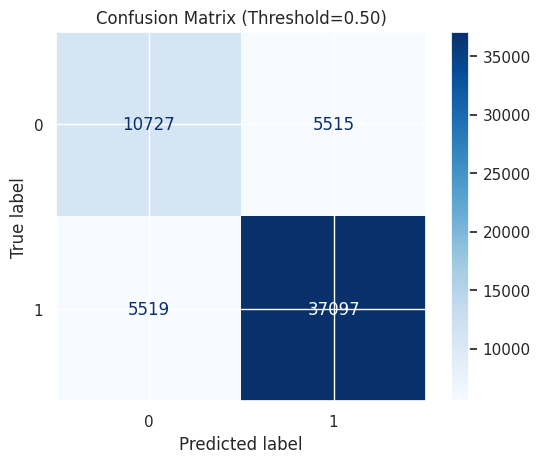

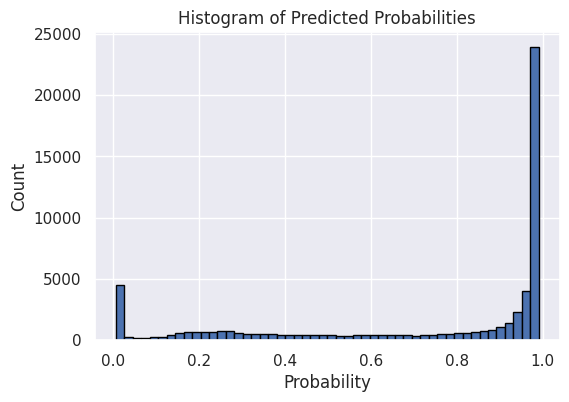

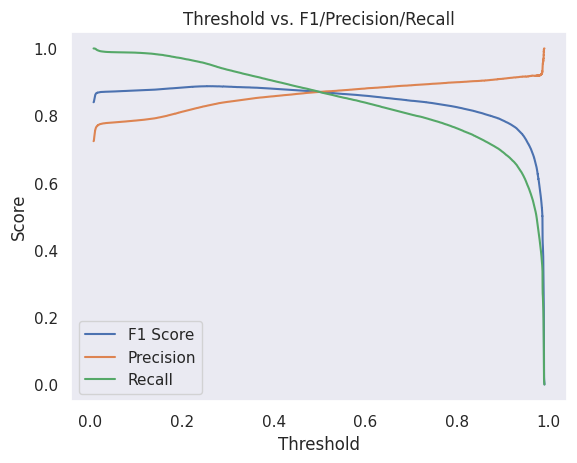


[Threshold Sweep] Searching for best threshold based on F1 Score...
Best threshold: 0.26, F1: 0.8877


In [58]:
import random
import numpy as np
import torch
import pickle

# Fix Torch Seed for reproducibility

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


# Imports

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence, pad_packed_sequence
from torch.nn.utils import clip_grad_norm_
import torch.nn.functional as F
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay, precision_recall_curve,
                             roc_curve, auc, f1_score, average_precision_score, classification_report)
from sklearn.utils.class_weight import compute_class_weight


# Focal Loss

class FocalLoss(nn.Module):
    """
    Focal Loss for binary classification.
    gamma > 1 emphasizes hard examples.
    alpha can balance the importance of positive vs negative classes.
    """
    def __init__(self, alpha=1.0, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        bce = F.binary_cross_entropy(inputs, targets, reduction='none')
        p_t = targets * inputs + (1 - targets) * (1 - inputs)
        loss = self.alpha * (1 - p_t) ** self.gamma * bce
        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        else:
            return loss

# Data Preprocessing & Feature Engineering

class DataPreprocessor:
    def __init__(self, scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'], drop_na_after_lag=True):
        self.scale = scale
        self.max_lag = max_lag
        self.lag_columns = lag_columns
        self.drop_na_after_lag = drop_na_after_lag

        self.scaler = None
        self.label_encoder_class = LabelEncoder()
        self.label_encoder_vin = LabelEncoder()

    def preprocess(self, df, is_train=True):
        print("\n[Preprocessing] Starting preprocessing...")
        cols_to_drop = ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']

        df = df.drop(columns=[col for col in cols_to_drop if col in df.columns], errors='ignore')
        print(f"[Preprocessing] Dropped columns (if present): {cols_to_drop}")

        df['class'] = df['class'].apply(lambda x: 'OK' if x == 'OK' else 'KO')

        if is_train:
            print("[Preprocessing] Fitting label encoders for training data...")
            self.label_encoder_class.fit(df['class'])
            self.label_encoder_vin.fit(df['vin'])
        df['class_encoded'] = self.label_encoder_class.transform(df['class'])
        df['vin_encoded'] = self.label_encoder_vin.transform(df['vin'])
        print(f"[Preprocessing] Unique classes: {np.unique(df['class'])}")
        print(f"[Preprocessing] Encoded classes: {np.unique(df['class_encoded'])}")

        if is_train:
            if 'run_id' not in df.columns:
                print("[Preprocessing] 'run_id' not found in training data. Creating it from 'vin'.")
                df['run_id'] = df['vin']
        else:
            if 'run_id' not in df.columns:
                df['run_id'] = df['vin']

        df['date'] = pd.to_datetime(df['date'])
        df = df.sort_values('date').reset_index(drop=True)
        print("[Preprocessing] Sorted data by 'date'.")

        df['SpeedBody_diff'] = df['SpeedBody'].diff()
        df['Z_diff'] = df['Z'].diff()
        df['SpeedBody_roll_mean'] = df['SpeedBody'].rolling(window=3, min_periods=1).mean()
        df['Z_roll_mean'] = df['Z'].rolling(window=3, min_periods=1).mean()

        print(f"[Preprocessing] Creating lag features for {self.lag_columns} with max_lag = {self.max_lag}...")
        group_col = 'run_id' if (is_train and 'run_id' in df.columns) else 'vin'
        for col in self.lag_columns:
            df[f'{col}_lag0'] = df[col]
            for lag in range(1, self.max_lag + 1):
                df[f'{col}_lag{lag}'] = df.groupby(group_col)[col].shift(lag)
        print("[Preprocessing] Lag features created.")

        if self.drop_na_after_lag:
            df = df.dropna().reset_index(drop=True)
            print("[Preprocessing] Dropped rows with missing values after lag creation.")
        else:
            df = df.fillna(0)
            print("[Preprocessing] Filled missing values with 0 after lag creation.")
        print(f"[Preprocessing] Data shape after handling missing values: {df.shape}")

        base_features = ['SpeedBody', 'Z', 'SpeedBody_diff', 'Z_diff', 'SpeedBody_roll_mean', 'Z_roll_mean']
        lag_features = [f'{col}_lag{i}' for col in self.lag_columns for i in range(self.max_lag + 1)]
        feature_cols = list(set(base_features + lag_features))
        feature_cols.sort()
        print(f"[Preprocessing] Final feature columns: {feature_cols}")

        if self.scale:
            numeric_cols = [c for c in feature_cols if c not in ['class_encoded', 'vin_encoded']]
            if is_train:
                self.scaler = StandardScaler()
                df[numeric_cols] = self.scaler.fit_transform(df[numeric_cols])
                print("[Preprocessing] Fitted and applied scaler on training data.")
            else:
                df[numeric_cols] = self.scaler.transform(df[numeric_cols])
                print("[Preprocessing] Applied scaler on test data.")
        else:
            print("[Preprocessing] Scaling skipped as per configuration.")

        print("[Preprocessing] Preprocessing completed.\n")
        return df, feature_cols

# Data Exploration Function
def data_exploration(df):
    print("\n[Data Exploration] Basic Statistics:")
    print(df.describe(include='all'))
    print("\n[Data Exploration] Null Values in each column:")
    print(df.isnull().sum())
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    plt.figure(figsize=(10, 8))
    corr_matrix = df[numeric_cols].corr()
    sns.heatmap(corr_matrix, annot=False, cmap='Blues')
    plt.title("Correlation Heatmap (Numeric Columns)")
    plt.show()

# Sequence Creation (Row-Level)

class SequenceCreator:
    def create_sequences(self, df, feature_cols, group_col='run_id', return_group_ids=False):
        print(f"\n[Sequence Creation] Creating sequences grouped by '{group_col}'...")
        sequences, lengths, labels = [], [], []
        group_ids = []
        df = df.sort_values([group_col, 'date']).reset_index(drop=True)
        group_counts = df.groupby(group_col).size()
        print("[Sequence Creation] Displaying group sizes (first few):")
        print(group_counts.head())
        for g_id, group in df.groupby(group_col):
            seq = torch.tensor(group[feature_cols].values, dtype=torch.float32)
            label_seq = torch.tensor(group['class_encoded'].values, dtype=torch.long)
            sequences.append(seq)
            lengths.append(len(seq))
            labels.append(label_seq)
            if return_group_ids:
                group_ids.append(g_id)
        print(f"[Sequence Creation] Created sequences for {len(sequences)} groups.\n")
        if return_group_ids:
            return sequences, lengths, labels, group_ids
        else:
            return sequences, lengths, labels

# PyTorch Dataset & Collate Function

class RunSequenceDataset(Dataset):
    def __init__(self, sequences, lengths, labels):
        self.sequences = sequences
        self.lengths = lengths
        self.labels = labels

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], self.lengths[idx], self.labels[idx]

def collate_fn(batch):
    batch.sort(key=lambda x: x[1], reverse=True)
    sequences, lengths, label_seqs = zip(*batch)
    padded_seqs = pad_sequence(sequences, batch_first=True)
    padded_labels = pad_sequence(label_seqs, batch_first=True)
    return padded_seqs, torch.tensor(lengths, dtype=torch.long), padded_labels

# Baseline RNN Model

class RNNClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=16, num_layers=1, rnn_type='LSTM', dropout=0.5):
        super(RNNClassifier, self).__init__()
        self.rnn_type = rnn_type
        if rnn_type == 'LSTM':
            self.rnn = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, dropout=dropout)
        elif rnn_type == 'GRU':
            self.rnn = nn.GRU(input_size, hidden_size, num_layers, batch_first=True, dropout=dropout)
        else:
            raise ValueError("rnn_type must be 'LSTM' or 'GRU'")
        self.output_layer = nn.Linear(hidden_size, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, lengths):
        packed_x = pack_padded_sequence(x, lengths.cpu(), batch_first=True, enforce_sorted=True)
        if self.rnn_type == 'LSTM':
            packed_out, (hn, cn) = self.rnn(packed_x)
        else:
            packed_out, hn = self.rnn(packed_x)
        out, _ = pad_packed_sequence(packed_out, batch_first=True)
        logits = self.output_layer(out).squeeze(-1)
        preds = self.sigmoid(logits)
        return preds

# Breaking a Long Sequence into Chunks

def chunk_sequence(seq, label_seq, chunk_size=5000):
    sub_sequences = []
    sub_labels = []
    sub_lengths = []
    n = len(seq)
    start = 0
    while start < n:
        end = min(start + chunk_size, n)
        sub_sequences.append(seq[start:end])
        sub_labels.append(label_seq[start:end])
        sub_lengths.append(end - start)
        start = end
    return sub_sequences, sub_labels, sub_lengths

# CNN-RNN Hybrid Model

class ImprovedCNNRNNClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=16, num_layers=1, rnn_type='LSTM',
                 dropout=0.5, cnn_out_channels=32, cnn_kernel_size=3):
        super(ImprovedCNNRNNClassifier, self).__init__()
        self.rnn_type = rnn_type
        self.hidden_size = hidden_size
        self.num_layers = num_layers

        # First Convolutional Layer
        self.conv1 = nn.Conv1d(
            in_channels=input_size,
            out_channels=cnn_out_channels,
            kernel_size=cnn_kernel_size,
            padding=cnn_kernel_size // 2
        )
        self.bn1 = nn.BatchNorm1d(cnn_out_channels)
        self.relu = nn.ReLU()

        # Second Convolutional Layer
        self.conv2 = nn.Conv1d(
            in_channels=cnn_out_channels,
            out_channels=cnn_out_channels,
            kernel_size=cnn_kernel_size,
            padding=cnn_kernel_size // 2
        )
        self.bn2 = nn.BatchNorm1d(cnn_out_channels)

        self.dropout_cnn = nn.Dropout(dropout)

        # RNN part
        if rnn_type == 'LSTM':
            self.rnn = nn.LSTM(
                input_size=cnn_out_channels,
                hidden_size=hidden_size,
                num_layers=num_layers,
                batch_first=True,
                dropout=dropout
            )
        elif rnn_type == 'GRU':
            self.rnn = nn.GRU(
                input_size=cnn_out_channels,
                hidden_size=hidden_size,
                num_layers=num_layers,
                batch_first=True,
                dropout=dropout
            )
        else:
            raise ValueError("rnn_type must be 'LSTM' or 'GRU'")

        # MLP Head (2-layer)
        self.mlp = nn.Sequential(
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_size, 1)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, lengths):
        x = x.permute(0, 2, 1)
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        x = self.dropout_cnn(x)
        x = x.permute(0, 2, 1)
        packed_x = pack_padded_sequence(x, lengths.cpu(), batch_first=True, enforce_sorted=True)
        if self.rnn_type == 'LSTM':
            packed_out, (hn, cn) = self.rnn(packed_x)
        else:
            packed_out, hn = self.rnn(packed_x)
        out, _ = pad_packed_sequence(packed_out, batch_first=True)
        logits = self.mlp(out).squeeze(-1)
        preds = self.sigmoid(logits)
        return preds

# Model Trainer (Using CNNRNN Hybrid + pickle checkpoint, Tuning on Macro F1)

class ModelTrainer:
    def __init__(self, input_size, hidden_size=16, rnn_type='LSTM', dropout=0.5,
                 lr=1e-3, batch_size=4, device=None,
                 class_weight=None,
                 num_layers=1,
                 use_lr_scheduler=True,
                 cnn_out_channels=32,
                 cnn_kernel_size=3,
                 max_grad_norm=5.0,
                 use_focal_loss=False,
                 focal_alpha=1.0,
                 focal_gamma=2.0,
                 checkpoint_path="best_model_state.pkl"):
        self.device = device if device else ('cuda' if torch.cuda.is_available() else 'cpu')
        print(f"\n[ModelTrainer] Using device: {self.device}")
        self.model = ImprovedCNNRNNClassifier(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            rnn_type=rnn_type,
            dropout=dropout,
            cnn_out_channels=cnn_out_channels,
            cnn_kernel_size=cnn_kernel_size
        ).to(self.device)

        self.lr = lr
        self.batch_size = batch_size
        self.class_weight = class_weight
        self.use_lr_scheduler = use_lr_scheduler
        self.max_grad_norm = max_grad_norm
        self.use_focal_loss = use_focal_loss
        self.checkpoint_path = checkpoint_path

        if self.use_focal_loss:
            print(f"[ModelTrainer] Using Focal Loss (alpha={focal_alpha}, gamma={focal_gamma}).")
            self.criterion = FocalLoss(alpha=focal_alpha, gamma=focal_gamma, reduction='mean')
            self.use_manual_class_weight = False
        else:
            if class_weight is not None:
                print(f"[ModelTrainer] Using class weights: {self.class_weight}")
                self.use_manual_class_weight = True
                self.criterion = nn.BCELoss(reduction='none')
            else:
                self.use_manual_class_weight = False
                self.criterion = nn.BCELoss()

        self.optimizer = optim.Adam(self.model.parameters(), lr=self.lr, weight_decay=1e-4)
        if self.use_lr_scheduler:
            # We'll step on macro F1 (maximizing), so set mode='max'
            self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(
                self.optimizer, mode='max', factor=0.5, patience=2, verbose=True
            )
        else:
            self.scheduler = None

    def train_model(self, train_dataset, val_dataset, epochs=20, patience=5):
        """
        Train and early-stop on macro F1 score (instead of val loss).
        """
        print("\n[ModelTrainer] Starting training...")
        train_loader = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True, collate_fn=collate_fn)
        val_loader = DataLoader(val_dataset, batch_size=self.batch_size, shuffle=False, collate_fn=collate_fn)

        best_val_macro_f1 = 0.0
        patience_counter = 0

        train_losses, val_macro_f1s = [], []
        train_accuracies, val_accuracies = [], []

        for epoch in range(epochs):
            # TRAIN
            self.model.train()
            epoch_train_losses = []
            correct_train = 0
            total_train = 0

            for batch_X, batch_lengths, batch_y in train_loader:
                batch_X = batch_X.to(self.device)
                batch_lengths = batch_lengths.to(self.device)
                batch_y = batch_y.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(batch_X, batch_lengths)

                max_seq_len = outputs.size(1)
                mask = (torch.arange(max_seq_len, device=self.device).unsqueeze(0)
                        < batch_lengths.unsqueeze(1))
                valid_outputs = outputs[mask]
                valid_labels = batch_y[mask].float()

                if self.use_focal_loss:
                    loss = self.criterion(valid_outputs, valid_labels)
                else:
                    if self.use_manual_class_weight:
                        weights_tensor = valid_labels.clone()
                        weights_tensor[weights_tensor == 0] = self.class_weight[0]
                        weights_tensor[weights_tensor == 1] = self.class_weight[1]
                        loss_values = self.criterion(valid_outputs, valid_labels) * weights_tensor
                        loss = loss_values.mean()
                    else:
                        loss = self.criterion(valid_outputs, valid_labels)

                loss.backward()
                clip_grad_norm_(self.model.parameters(), self.max_grad_norm)
                self.optimizer.step()

                epoch_train_losses.append(loss.item())
                preds = (valid_outputs >= 0.5).float()
                correct_train += (preds == valid_labels).sum().item()
                total_train += valid_labels.numel()

            avg_train_loss = np.mean(epoch_train_losses)
            train_acc = correct_train / total_train if total_train > 0 else 0
            train_losses.append(avg_train_loss)
            train_accuracies.append(train_acc)

            # VALIDATION
            self.model.eval()
            all_val_preds = []
            all_val_labels = []
            correct_val = 0
            total_val = 0

            with torch.no_grad():
                for batch_X, batch_lengths, batch_y in val_loader:
                    batch_X = batch_X.to(self.device)
                    batch_lengths = batch_lengths.to(self.device)
                    batch_y = batch_y.to(self.device)

                    outputs = self.model(batch_X, batch_lengths)
                    max_seq_len = outputs.size(1)
                    mask = (torch.arange(max_seq_len, device=self.device).unsqueeze(0)
                            < batch_lengths.unsqueeze(1))
                    valid_outputs = outputs[mask]
                    valid_labels = batch_y[mask].float()

                    preds = (valid_outputs >= 0.5).float()
                    correct_val += (preds == valid_labels).sum().item()
                    total_val += valid_labels.numel()

                    # Collect for macro F1
                    all_val_preds.append(preds.cpu().numpy())
                    all_val_labels.append(valid_labels.cpu().numpy())

            val_acc = correct_val / total_val if total_val > 0 else 0
            val_accuracies.append(val_acc)

            # Flatten predictions and labels to compute macro F1
            all_val_preds = np.concatenate(all_val_preds, axis=0)
            all_val_labels = np.concatenate(all_val_labels, axis=0)
            val_macro_f1 = f1_score(all_val_labels, all_val_preds, average='macro')
            val_macro_f1s.append(val_macro_f1)

            # Step the scheduler on macro F1 if desired
            if self.use_lr_scheduler and self.scheduler is not None:
                self.scheduler.step(val_macro_f1)

            print(f"[Epoch {epoch+1:02d}] Train Loss: {avg_train_loss:.4f}, Train Acc: {train_acc:.4f} | "
                  f"Val MacroF1: {val_macro_f1:.4f}, Val Acc: {val_acc:.4f}")

            # EARLY STOPPING ON MACRO F1
            if val_macro_f1 > best_val_macro_f1:
                best_val_macro_f1 = val_macro_f1
                best_model_state = self.model.state_dict()
                with open(self.checkpoint_path, "wb") as f:
                    pickle.dump(best_model_state, f)
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print("[ModelTrainer] Early stopping triggered (macro F1).")
                    break

        print("[ModelTrainer] Training completed.")
        # Load best model from checkpoint
        print(f"Loading best model state from checkpoint: {self.checkpoint_path}")
        with open(self.checkpoint_path, "rb") as f:
            best_model_state = pickle.load(f)
        self.model.load_state_dict(best_model_state)

        # Plot training vs. validation macro F1
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(train_losses, marker='o', label='Train Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training Loss vs. Epoch')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(val_macro_f1s, marker='o', label='Val MacroF1')
        plt.xlabel('Epoch')
        plt.ylabel('MacroF1')
        plt.title('Validation MacroF1 vs. Epoch')
        plt.legend()

        plt.tight_layout()
        plt.show()

    def evaluate_model(self, dataset, custom_threshold=None):
        print("\n[ModelTrainer] Evaluating model on test dataset...")
        loader = DataLoader(dataset, batch_size=self.batch_size, shuffle=False, collate_fn=collate_fn)
        self.model.eval()

        eval_criterion = nn.BCELoss()
        losses = []
        all_outputs = []
        all_targets = []

        with torch.no_grad():
            for batch_X, batch_lengths, batch_y in loader:
                batch_X = batch_X.to(self.device)
                batch_lengths = batch_lengths.to(self.device)
                batch_y = batch_y.to(self.device)

                outputs = self.model(batch_X, batch_lengths)
                max_seq_len = outputs.size(1)
                mask = (torch.arange(max_seq_len, device=self.device).unsqueeze(0)
                        < batch_lengths.unsqueeze(1))
                valid_outputs = outputs[mask]
                valid_labels = batch_y[mask].float()

                loss = eval_criterion(valid_outputs, valid_labels)
                losses.append(loss.item())

                all_outputs.append(valid_outputs.cpu())
                all_targets.append(valid_labels.cpu())

        avg_loss = np.mean(losses)
        print(f"[Evaluation] Loss: {avg_loss:.4f}")

        all_outputs = torch.cat(all_outputs, dim=0).numpy()
        all_targets = torch.cat(all_targets, dim=0).numpy()

        threshold = custom_threshold if custom_threshold is not None else 0.5
        preds = (all_outputs >= threshold).astype(float)
        accuracy = (preds == all_targets).mean()
        print(f"[Evaluation] Threshold={threshold:.2f}, Accuracy: {accuracy:.4f}")

        print("\n[Evaluation] Classification Report:")
        print(classification_report(all_targets, preds, digits=4))

        precision, recall, pr_thresholds = precision_recall_curve(all_targets, all_outputs)
        ap_score = average_precision_score(all_targets, all_outputs)
        f1 = f1_score(all_targets, preds)
        print(f"[Evaluation] Precision-Recall AP Score: {ap_score:.4f}")
        print(f"[Evaluation] F1 Score: {f1:.4f}")

        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(recall, precision, marker='.', label=f'AP = {ap_score:.4f}')
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("Precision-Recall Curve")
        plt.legend()

        fpr, tpr, roc_thresholds = roc_curve(all_targets, all_outputs)
        roc_auc = auc(fpr, tpr)
        plt.subplot(1, 2, 2)
        plt.plot(fpr, tpr, marker='.', label=f'AUC = {roc_auc:.4f}')
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("ROC Curve")
        plt.legend()
        plt.tight_layout()
        plt.show()

        cm = confusion_matrix(all_targets, preds)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f"Confusion Matrix (Threshold={threshold:.2f})")
        plt.show()

        plt.figure(figsize=(6, 4))
        plt.hist(all_outputs, bins=50, edgecolor='black')
        plt.title("Histogram of Predicted Probabilities")
        plt.xlabel("Probability")
        plt.ylabel("Count")
        plt.show()

        # From evaluate_model()
        precision, recall, thresholds = precision_recall_curve(all_targets, all_outputs)
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-8)
        plt.plot(thresholds, f1_scores[:-1], label='F1 Score')
        plt.plot(thresholds, precision[:-1], label='Precision')
        plt.plot(thresholds, recall[:-1], label='Recall')
        plt.xlabel("Threshold")
        plt.ylabel("Score")
        plt.legend()
        plt.title("Threshold vs. F1/Precision/Recall")
        plt.grid()
        plt.show()

        self.threshold_sweep(all_outputs, all_targets)
        return avg_loss, accuracy

    def threshold_sweep(self, all_outputs, all_targets):
        print("\n[Threshold Sweep] Searching for best threshold based on F1 Score...")
        best_thresh = 0.0
        best_f1 = 0.0
        for thresh in np.arange(0.0, 1.01, 0.01):
            preds_thresh = (all_outputs >= thresh).astype(int)
            f1_temp = f1_score(all_targets, preds_thresh)
            if f1_temp > best_f1:
                best_f1 = f1_temp
                best_thresh = thresh
        print(f"Best threshold: {best_thresh:.2f}, F1: {best_f1:.4f}")

# Usage Example

if __name__ == "__main__":

    print("\n========== TRAINING DATA ==========")
    preprocessor = DataPreprocessor(scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'], drop_na_after_lag=True)
    df_train_processed, feature_cols = preprocessor.preprocess(df, is_train=True)
    data_exploration(df_train_processed)

    sequence_creator = SequenceCreator()
    train_sequences, train_lengths, train_labels, train_group_ids = sequence_creator.create_sequences(
        df_train_processed, feature_cols, group_col='run_id', return_group_ids=True
    )

    plt.figure(figsize=(8, 4))
    plt.hist(train_lengths, bins=30, edgecolor='black')
    plt.xlabel("Sequence Length")
    plt.ylabel("Frequency")
    plt.title("Distribution of Sequence Lengths (Training)")
    plt.show()

    all_train_labels = np.concatenate([lab.numpy() for lab in train_labels])
    plt.figure(figsize=(8, 4))
    plt.hist(all_train_labels, bins=np.arange(-0.5, 2, 1), edgecolor='black', rwidth=0.8)
    plt.xlabel("Class Label")
    plt.ylabel("Frequency")
    plt.title("Distribution of Row-Level Labels (Training)")
    plt.xticks([0, 1])
    plt.show()

    from sklearn.model_selection import train_test_split
    train_seq_split, val_seq_split, train_len_split, val_len_split, train_lab_split, val_lab_split = train_test_split(
        train_sequences, train_lengths, train_labels, test_size=0.2, random_state=42
    )

    train_dataset = RunSequenceDataset(train_seq_split, train_len_split, train_lab_split)
    val_dataset = RunSequenceDataset(val_seq_split, val_len_split, val_lab_split)

    # Compute class weights
    all_train_labels_array = np.concatenate([lab.numpy() for lab in train_lab_split])
    classes = np.unique(all_train_labels_array)
    computed_weights = compute_class_weight(class_weight='balanced', classes=classes, y=all_train_labels_array)
    print("Computed class weights:", computed_weights)

    # Initialize & Train with Macro F1 Early Stopping
    trainer_params = {
        'lr': 1e-3,
        'batch_size': 4,
        'device': None,
        'class_weight': computed_weights,
        'num_layers': 2,
        'use_lr_scheduler': True,
        'max_grad_norm': 5.0,
        'cnn_out_channels': 32,
        'cnn_kernel_size': 3,
        'use_focal_loss': False,
        'focal_alpha': 1.0,
        'focal_gamma': 2.0,
        'checkpoint_path': "best_model_state.pkl"
    }
    model_params = {
        'input_size': len(feature_cols),
        'hidden_size': 64,
        'rnn_type': 'LSTM',
        'dropout': 0.5
    }

    trainer = ModelTrainer(**model_params, **trainer_params)
    # train with early stopping on macro F1
    trainer.train_model(train_dataset, val_dataset, epochs=30, patience=5)

    # Save the trained hybrid model using pickle as "hybrid_model.pkl"
    with open("hybrid_model.pkl", "wb") as f:
        pickle.dump(trainer.model, f)
    print("Hybrid model saved as 'hybrid_model.pkl'")

    print("\n========== TEST DATA ==========")
    df_test_processed, _ = preprocessor.preprocess(test, is_train=False)
    test_sequences, test_lengths, test_labels, test_group_ids = sequence_creator.create_sequences(
        df_test_processed, feature_cols, group_col='run_id', return_group_ids=True
    )

    chunked_test_sequences = []
    chunked_test_labels = []
    chunked_test_lengths = []
    for seq, lab, length in zip(test_sequences, test_labels, test_lengths):
        if length > 5000:
            sub_seqs, sub_labs, sub_lens = chunk_sequence(seq, lab, chunk_size=5000)
            chunked_test_sequences.extend(sub_seqs)
            chunked_test_labels.extend(sub_labs)
            chunked_test_lengths.extend(sub_lens)
        else:
            chunked_test_sequences.append(seq)
            chunked_test_labels.append(lab)
            chunked_test_lengths.append(length)

    test_dataset = RunSequenceDataset(chunked_test_sequences, chunked_test_lengths, chunked_test_labels)
    print(f"[Test Data] Number of sequences (chunks): {len(chunked_test_sequences)}")

    # Evaluate with default threshold=0.5
    trainer.evaluate_model(test_dataset)



### Hybrid CNN-GRU Deep Learning Pipeline for Road Condition Classification



========== TRAINING DATA ==========

[Preprocessing] Starting preprocessing...
[Preprocessing] Creating lag features for ['Z', 'SpeedBody'] with max_lag = 10...
[Preprocessing] Adding FWT/Signal features (window=10)...
[Preprocessing] Preprocessing completed.


[Data Exploration] Basic Statistics:


/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning:

invalid value encountered in greater

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning:

invalid value encountered in less

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning:

invalid value encountered in greater



           vin                           date     SpeedBody             Z  \
count   126204                         126204  1.262040e+05  1.262040e+05   
unique       3                            NaN           NaN           NaN   
top      car_1                            NaN           NaN           NaN   
freq     53641                            NaN           NaN           NaN   
mean       NaN  2023-08-12 08:36:39.944741888 -9.188344e-17 -1.846677e-17   
min        NaN     2023-06-12 08:02:40.860000 -1.781299e+00 -4.077865e+00   
25%        NaN  2023-06-14 06:11:50.069750016 -9.503740e-01 -5.340732e-01   
50%        NaN  2023-09-18 09:16:56.315999744  1.029494e-01 -4.629456e-01   
75%        NaN  2023-09-20 07:06:35.696500224  8.663360e-01 -1.201332e-01   
max        NaN     2023-10-10 08:01:16.344000  2.477703e+00  4.199815e+00   
std        NaN                            NaN  1.000004e+00  1.000004e+00   

         class   run_id  class_encoded    vin_encoded  SpeedBody_diff  \
co

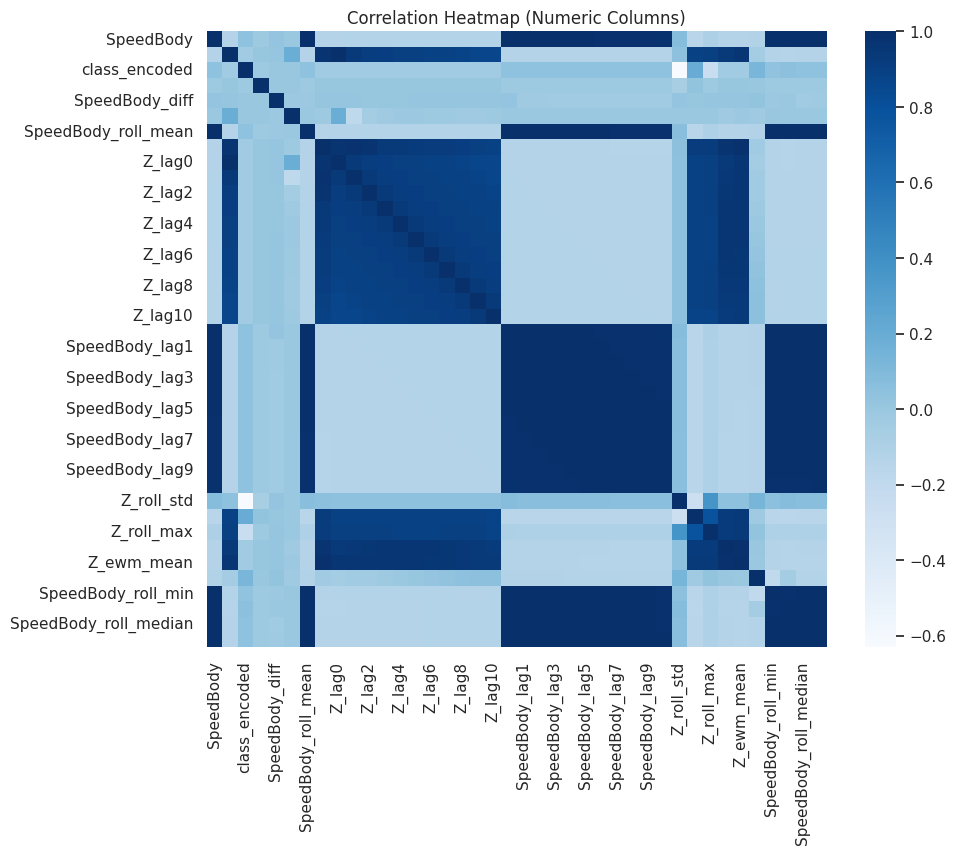


[Sequence Creation] Creating sequences grouped by 'run_id'...
[Sequence Creation] Displaying group sizes (first few):
run_id
car_1_0    8249
car_1_1    7807
car_1_2    7753
car_1_3    7708
car_1_4    8032
dtype: int64
[Sequence Creation] Created sequences for 17 groups.



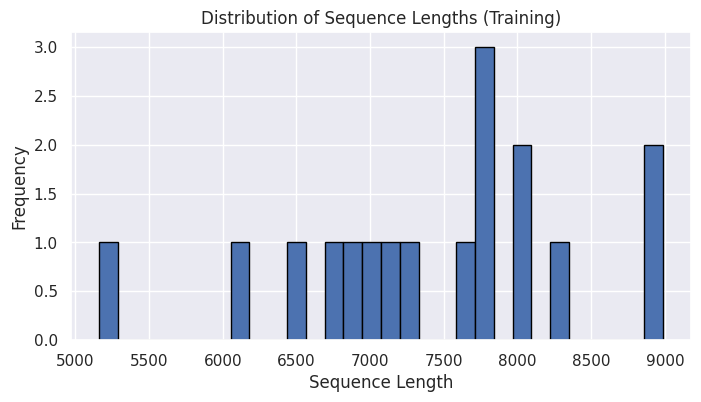

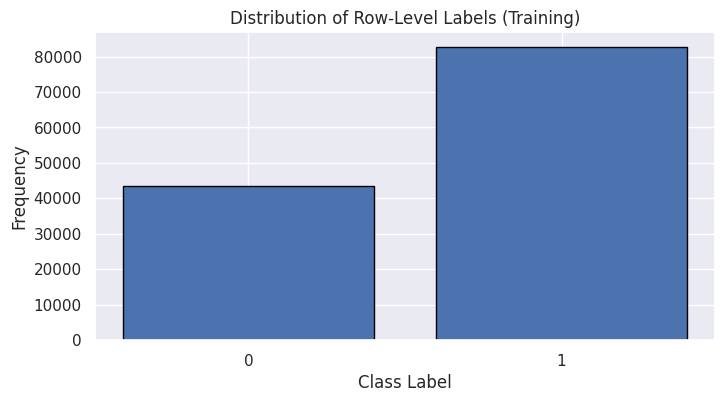

Computed class weights: [1.46185845 0.7599135 ]

[ModelTrainer] Using device: cuda
[ModelTrainer] Using class weights: [1.46185845 0.7599135 ]

[ModelTrainer] Starting training...


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning:

The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.



[Epoch 01] Train Loss: 0.6932, Train Acc: 0.5895 | Val MacroF1: 0.4616, Val Acc: 0.6650
[Epoch 02] Train Loss: 0.6797, Train Acc: 0.7633 | Val MacroF1: 0.8798, Val Acc: 0.8930
[Epoch 03] Train Loss: 0.6488, Train Acc: 0.8851 | Val MacroF1: 0.9225, Val Acc: 0.9289
[Epoch 04] Train Loss: 0.5774, Train Acc: 0.9433 | Val MacroF1: 0.9449, Val Acc: 0.9492
[Epoch 05] Train Loss: 0.4608, Train Acc: 0.9520 | Val MacroF1: 0.9402, Val Acc: 0.9443
[Epoch 06] Train Loss: 0.3218, Train Acc: 0.9570 | Val MacroF1: 0.9362, Val Acc: 0.9406
[Epoch 07] Train Loss: 0.2299, Train Acc: 0.9572 | Val MacroF1: 0.9427, Val Acc: 0.9466
[Epoch 08] Train Loss: 0.1825, Train Acc: 0.9632 | Val MacroF1: 0.9444, Val Acc: 0.9483
[Epoch 09] Train Loss: 0.1605, Train Acc: 0.9656 | Val MacroF1: 0.9618, Val Acc: 0.9651
[Epoch 10] Train Loss: 0.1541, Train Acc: 0.9698 | Val MacroF1: 0.9570, Val Acc: 0.9606
[Epoch 11] Train Loss: 0.1530, Train Acc: 0.9689 | Val MacroF1: 0.9596, Val Acc: 0.9629
[Epoch 12] Train Loss: 0.1316, T

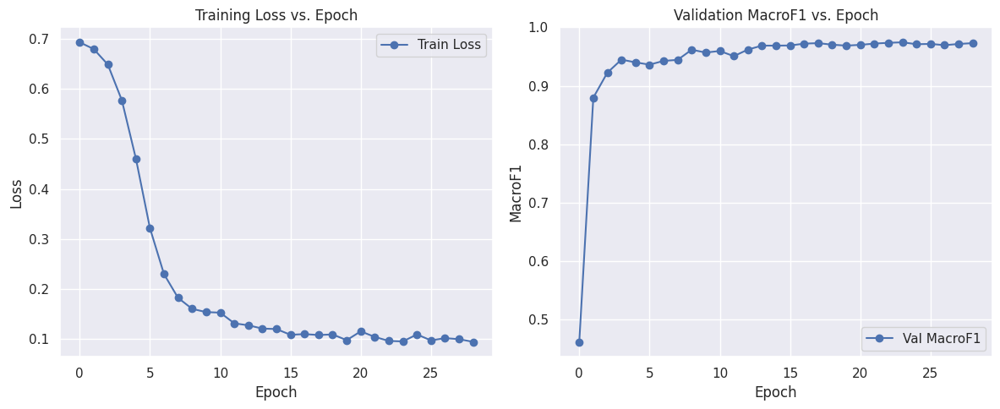

Hybrid model saved as 'hybrid_model.pkl'

========== TEST DATA ==========

[Preprocessing] Starting preprocessing...
[Preprocessing] Creating lag features for ['Z', 'SpeedBody'] with max_lag = 10...
[Preprocessing] Adding FWT/Signal features (window=10)...
[Preprocessing] Preprocessing completed.


[Sequence Creation] Creating sequences grouped by 'run_id'...
[Sequence Creation] Displaying group sizes (first few):
run_id
car_1    58858
dtype: int64
[Sequence Creation] Created sequences for 1 groups.

[Test Data] Number of sequences (chunks): 12

[ModelTrainer] Evaluating model on test dataset...
[Evaluation] Loss: 0.7160
[Evaluation] Threshold=0.50, Accuracy: 0.7873

[Evaluation] Classification Report:
              precision    recall  f1-score   support

         0.0     0.5940    0.7240    0.6526     16242
         1.0     0.8852    0.8114    0.8467     42616

    accuracy                         0.7873     58858
   macro avg     0.7396    0.7677    0.7496     58858
weighted avg    

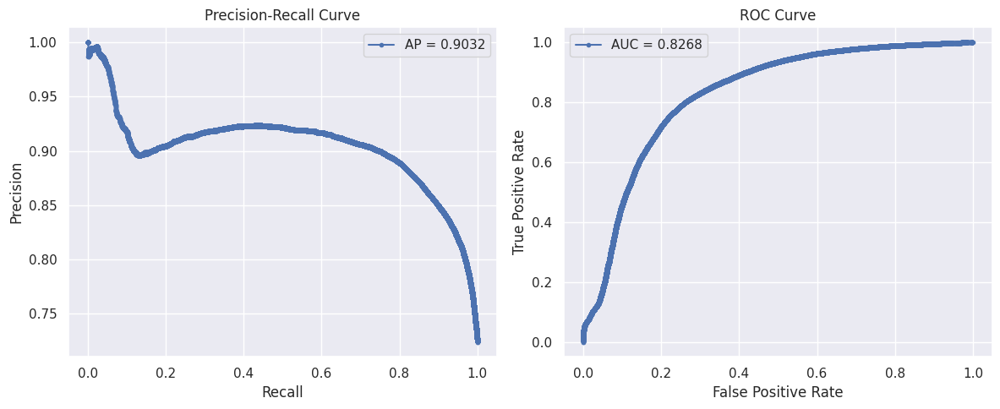

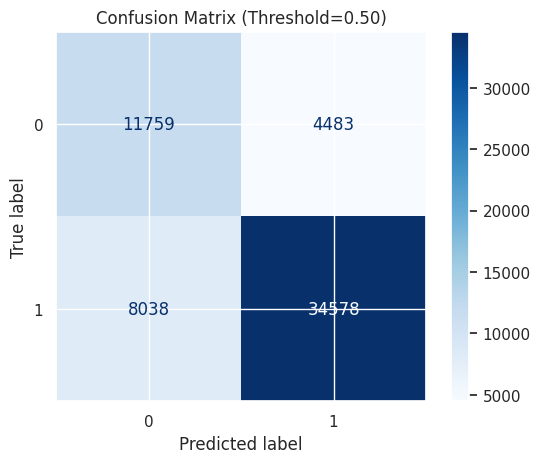

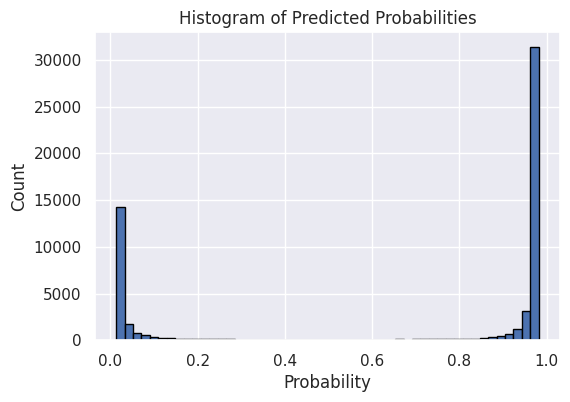

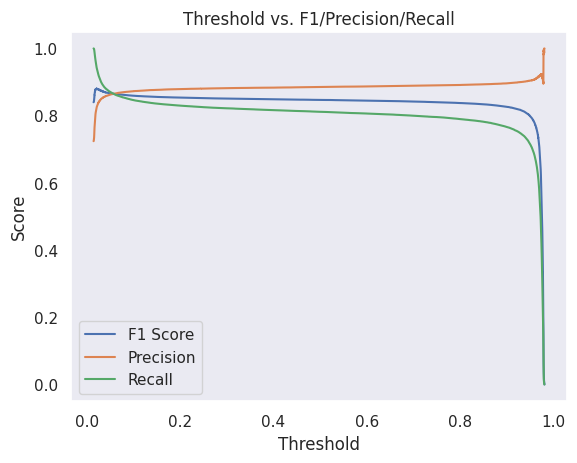


[Threshold Sweep] Searching for best threshold based on F1 Score...
Best threshold: 0.02, F1: 0.8800


In [59]:
import random
import numpy as np
import torch
import pickle


# Fix Torch Seed for reproducibility

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


# Imports

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence, pad_packed_sequence
from torch.nn.utils import clip_grad_norm_
import torch.nn.functional as F
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay, precision_recall_curve,
                             roc_curve, auc, f1_score, average_precision_score, classification_report)
from sklearn.utils.class_weight import compute_class_weight


# Focal Loss

class FocalLoss(nn.Module):
    """
    Focal Loss for binary classification.
    gamma > 1 emphasizes hard examples.
    alpha can balance the importance of positive vs negative classes.
    """
    def __init__(self, alpha=1.0, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        bce = F.binary_cross_entropy(inputs, targets, reduction='none')
        p_t = targets * inputs + (1 - targets) * (1 - inputs)
        loss = self.alpha * (1 - p_t) ** self.gamma * bce
        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        else:
            return loss

# Data Preprocessing & Feature Engineering

class DataPreprocessorEnhanced:
    def __init__(self, scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'], drop_na_after_lag=True):
        self.scale = scale
        self.max_lag = max_lag
        self.lag_columns = lag_columns
        self.drop_na_after_lag = drop_na_after_lag

        self.scaler = None
        self.label_encoder_class = LabelEncoder()
        self.label_encoder_vin = LabelEncoder()

    def preprocess(self, df, is_train=True):
        print("\n[Preprocessing] Starting preprocessing...")
        cols_to_drop = ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']

        df = df.drop(columns=[col for col in cols_to_drop if col in df.columns], errors='ignore')

        df['class'] = df['class'].apply(lambda x: 'OK' if x == 'OK' else 'KO')

        if is_train:
            self.label_encoder_class.fit(df['class'])
            self.label_encoder_vin.fit(df['vin'])
        df['class_encoded'] = self.label_encoder_class.transform(df['class'])
        df['vin_encoded'] = self.label_encoder_vin.transform(df['vin'])

        if 'run_id' not in df.columns:
            df['run_id'] = df['vin']

        df['date'] = pd.to_datetime(df['date'])
        df = df.sort_values('date').reset_index(drop=True)

        df['SpeedBody_diff'] = df['SpeedBody'].diff()
        df['Z_diff'] = df['Z'].diff()
        df['SpeedBody_roll_mean'] = df['SpeedBody'].rolling(window=3, min_periods=1).mean()
        df['Z_roll_mean'] = df['Z'].rolling(window=3, min_periods=1).mean()

        print(f"[Preprocessing] Creating lag features for {self.lag_columns} with max_lag = {self.max_lag}...")
        group_col = 'run_id'
        for col in self.lag_columns:
            df[f'{col}_lag0'] = df[col]
            for lag in range(1, self.max_lag + 1):
                df[f'{col}_lag{lag}'] = df.groupby(group_col)[col].shift(lag)

        print("[Preprocessing] Adding FWT/Signal features (window=10)...")
        for col in self.lag_columns:
            df[f'{col}_roll_std'] = df[col].rolling(window=10, min_periods=1).std()
            df[f'{col}_roll_min'] = df[col].rolling(window=10, min_periods=1).min()
            df[f'{col}_roll_max'] = df[col].rolling(window=10, min_periods=1).max()
            df[f'{col}_roll_median'] = df[col].rolling(window=10, min_periods=1).median()
            df[f'{col}_ewm_mean'] = df[col].ewm(span=10, adjust=False).mean()

        if self.drop_na_after_lag:
            df = df.dropna().reset_index(drop=True)
        else:
            df = df.fillna(0)

        base_features = ['SpeedBody', 'Z', 'SpeedBody_diff', 'Z_diff', 'SpeedBody_roll_mean', 'Z_roll_mean']
        lag_features = [f'{col}_lag{i}' for col in self.lag_columns for i in range(self.max_lag + 1)]
        signal_features = [
            f'{col}_roll_std' for col in self.lag_columns
        ] + [
            f'{col}_roll_min' for col in self.lag_columns
        ] + [
            f'{col}_roll_max' for col in self.lag_columns
        ] + [
            f'{col}_roll_median' for col in self.lag_columns
        ] + [
            f'{col}_ewm_mean' for col in self.lag_columns
        ]

        feature_cols = list(set(base_features + lag_features + signal_features))
        feature_cols.sort()

        if self.scale:
            numeric_cols = [c for c in feature_cols if c not in ['class_encoded', 'vin_encoded']]
            if is_train:
                self.scaler = StandardScaler()
                df[numeric_cols] = self.scaler.fit_transform(df[numeric_cols])
            else:
                df[numeric_cols] = self.scaler.transform(df[numeric_cols])

        print("[Preprocessing] Preprocessing completed.\n")
        return df, feature_cols

# Data Exploration Function

def data_exploration(df):
    print("\n[Data Exploration] Basic Statistics:")
    print(df.describe(include='all'))
    print("\n[Data Exploration] Null Values in each column:")
    print(df.isnull().sum())
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    plt.figure(figsize=(10, 8))
    corr_matrix = df[numeric_cols].corr()
    sns.heatmap(corr_matrix, annot=False, cmap='Blues')
    plt.title("Correlation Heatmap (Numeric Columns)")
    plt.show()

# Sequence Creation

class SequenceCreator:
    def create_sequences(self, df, feature_cols, group_col='run_id', return_group_ids=False):
        print(f"\n[Sequence Creation] Creating sequences grouped by '{group_col}'...")
        sequences, lengths, labels = [], [], []
        group_ids = []
        df = df.sort_values([group_col, 'date']).reset_index(drop=True)
        group_counts = df.groupby(group_col).size()
        print("[Sequence Creation] Displaying group sizes (first few):")
        print(group_counts.head())
        for g_id, group in df.groupby(group_col):
            seq = torch.tensor(group[feature_cols].values, dtype=torch.float32)
            label_seq = torch.tensor(group['class_encoded'].values, dtype=torch.long)
            sequences.append(seq)
            lengths.append(len(seq))
            labels.append(label_seq)
            if return_group_ids:
                group_ids.append(g_id)
        print(f"[Sequence Creation] Created sequences for {len(sequences)} groups.\n")
        if return_group_ids:
            return sequences, lengths, labels, group_ids
        else:
            return sequences, lengths, labels

# PyTorch Dataset & Collate Function

class RunSequenceDataset(Dataset):
    def __init__(self, sequences, lengths, labels):
        self.sequences = sequences
        self.lengths = lengths
        self.labels = labels

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], self.lengths[idx], self.labels[idx]

def collate_fn(batch):
    batch.sort(key=lambda x: x[1], reverse=True)
    sequences, lengths, label_seqs = zip(*batch)
    padded_seqs = pad_sequence(sequences, batch_first=True)
    padded_labels = pad_sequence(label_seqs, batch_first=True)
    return padded_seqs, torch.tensor(lengths, dtype=torch.long), padded_labels

# Baseline RNN Model

class RNNClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=16, num_layers=1, rnn_type='LSTM', dropout=0.5):
        super(RNNClassifier, self).__init__()
        self.rnn_type = rnn_type
        if rnn_type == 'LSTM':
            self.rnn = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, dropout=dropout)
        elif rnn_type == 'GRU':
            self.rnn = nn.GRU(input_size, hidden_size, num_layers, batch_first=True, dropout=dropout)
        else:
            raise ValueError("rnn_type must be 'LSTM' or 'GRU'")
        self.output_layer = nn.Linear(hidden_size, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, lengths):
        packed_x = pack_padded_sequence(x, lengths.cpu(), batch_first=True, enforce_sorted=True)
        if self.rnn_type == 'LSTM':
            packed_out, (hn, cn) = self.rnn(packed_x)
        else:
            packed_out, hn = self.rnn(packed_x)
        out, _ = pad_packed_sequence(packed_out, batch_first=True)
        logits = self.output_layer(out).squeeze(-1)
        preds = self.sigmoid(logits)
        return preds

# Breaking a Long Sequence into Chunks

def chunk_sequence(seq, label_seq, chunk_size=5000):
    sub_sequences = []
    sub_labels = []
    sub_lengths = []
    n = len(seq)
    start = 0
    while start < n:
        end = min(start + chunk_size, n)
        sub_sequences.append(seq[start:end])
        sub_labels.append(label_seq[start:end])
        sub_lengths.append(end - start)
        start = end
    return sub_sequences, sub_labels, sub_lengths

# CNN-RNN Hybrid Model

class ImprovedCNNRNNClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=16, num_layers=1, rnn_type='LSTM',
                 dropout=0.5, cnn_out_channels=32, cnn_kernel_size=3):
        super(ImprovedCNNRNNClassifier, self).__init__()
        self.rnn_type = rnn_type
        self.hidden_size = hidden_size
        self.num_layers = num_layers

        # First Convolutional Layer
        self.conv1 = nn.Conv1d(
            in_channels=input_size,
            out_channels=cnn_out_channels,
            kernel_size=cnn_kernel_size,
            padding=cnn_kernel_size // 2
        )
        self.bn1 = nn.BatchNorm1d(cnn_out_channels)
        self.relu = nn.ReLU()

        # Second Convolutional Layer
        self.conv2 = nn.Conv1d(
            in_channels=cnn_out_channels,
            out_channels=cnn_out_channels,
            kernel_size=cnn_kernel_size,
            padding=cnn_kernel_size // 2
        )
        self.bn2 = nn.BatchNorm1d(cnn_out_channels)

        self.dropout_cnn = nn.Dropout(dropout)

        # RNN part
        if rnn_type == 'LSTM':
            self.rnn = nn.LSTM(
                input_size=cnn_out_channels,
                hidden_size=hidden_size,
                num_layers=num_layers,
                batch_first=True,
                dropout=dropout
            )
        elif rnn_type == 'GRU':
            self.rnn = nn.GRU(
                input_size=cnn_out_channels,
                hidden_size=hidden_size,
                num_layers=num_layers,
                batch_first=True,
                dropout=dropout
            )
        else:
            raise ValueError("rnn_type must be 'LSTM' or 'GRU'")

        # MLP Head (2-layer)
        self.mlp = nn.Sequential(
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_size, 1)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, lengths):
        x = x.permute(0, 2, 1)
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        x = self.dropout_cnn(x)
        x = x.permute(0, 2, 1)
        packed_x = pack_padded_sequence(x, lengths.cpu(), batch_first=True, enforce_sorted=True)
        if self.rnn_type == 'LSTM':
            packed_out, (hn, cn) = self.rnn(packed_x)
        else:
            packed_out, hn = self.rnn(packed_x)
        out, _ = pad_packed_sequence(packed_out, batch_first=True)
        logits = self.mlp(out).squeeze(-1)
        preds = self.sigmoid(logits)
        return preds

# Model Trainer (Using CNNRNN Hybrid + pickle checkpoint, Tuning on Macro F1)

class ModelTrainer:
    def __init__(self, input_size, hidden_size=16, rnn_type='LSTM', dropout=0.5,
                 lr=1e-3, batch_size=4, device=None,
                 class_weight=None,
                 num_layers=1,
                 use_lr_scheduler=True,
                 cnn_out_channels=32,
                 cnn_kernel_size=3,
                 max_grad_norm=5.0,
                 use_focal_loss=False,
                 focal_alpha=1.0,
                 focal_gamma=2.0,
                 checkpoint_path="best_model_state.pkl"):
        self.device = device if device else ('cuda' if torch.cuda.is_available() else 'cpu')
        print(f"\n[ModelTrainer] Using device: {self.device}")
        self.model = ImprovedCNNRNNClassifier(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            rnn_type=rnn_type,
            dropout=dropout,
            cnn_out_channels=cnn_out_channels,
            cnn_kernel_size=cnn_kernel_size
        ).to(self.device)

        self.lr = lr
        self.batch_size = batch_size
        self.class_weight = class_weight
        self.use_lr_scheduler = use_lr_scheduler
        self.max_grad_norm = max_grad_norm
        self.use_focal_loss = use_focal_loss
        self.checkpoint_path = checkpoint_path

        if self.use_focal_loss:
            print(f"[ModelTrainer] Using Focal Loss (alpha={focal_alpha}, gamma={focal_gamma}).")
            self.criterion = FocalLoss(alpha=focal_alpha, gamma=focal_gamma, reduction='mean')
            self.use_manual_class_weight = False
        else:
            if class_weight is not None:
                print(f"[ModelTrainer] Using class weights: {self.class_weight}")
                self.use_manual_class_weight = True
                self.criterion = nn.BCELoss(reduction='none')
            else:
                self.use_manual_class_weight = False
                self.criterion = nn.BCELoss()

        self.optimizer = optim.Adam(self.model.parameters(), lr=self.lr, weight_decay=1e-4)
        if self.use_lr_scheduler:
            # We'll step on macro F1 (maximizing), so set mode='max'
            self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(
                self.optimizer, mode='max', factor=0.5, patience=2, verbose=True
            )
        else:
            self.scheduler = None

    def train_model(self, train_dataset, val_dataset, epochs=20, patience=5):
        """
        Train and early-stop on macro F1 score (instead of val loss).
        """
        print("\n[ModelTrainer] Starting training...")
        train_loader = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True, collate_fn=collate_fn)
        val_loader = DataLoader(val_dataset, batch_size=self.batch_size, shuffle=False, collate_fn=collate_fn)

        best_val_macro_f1 = 0.0
        patience_counter = 0

        train_losses, val_macro_f1s = [], []
        train_accuracies, val_accuracies = [], []

        for epoch in range(epochs):
            # TRAIN
            self.model.train()
            epoch_train_losses = []
            correct_train = 0
            total_train = 0

            for batch_X, batch_lengths, batch_y in train_loader:
                batch_X = batch_X.to(self.device)
                batch_lengths = batch_lengths.to(self.device)
                batch_y = batch_y.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(batch_X, batch_lengths)

                max_seq_len = outputs.size(1)
                mask = (torch.arange(max_seq_len, device=self.device).unsqueeze(0)
                        < batch_lengths.unsqueeze(1))
                valid_outputs = outputs[mask]
                valid_labels = batch_y[mask].float()

                if self.use_focal_loss:
                    loss = self.criterion(valid_outputs, valid_labels)
                else:
                    if self.use_manual_class_weight:
                        weights_tensor = valid_labels.clone()
                        weights_tensor[weights_tensor == 0] = self.class_weight[0]
                        weights_tensor[weights_tensor == 1] = self.class_weight[1]
                        loss_values = self.criterion(valid_outputs, valid_labels) * weights_tensor
                        loss = loss_values.mean()
                    else:
                        loss = self.criterion(valid_outputs, valid_labels)

                loss.backward()
                clip_grad_norm_(self.model.parameters(), self.max_grad_norm)
                self.optimizer.step()

                epoch_train_losses.append(loss.item())
                preds = (valid_outputs >= 0.5).float()
                correct_train += (preds == valid_labels).sum().item()
                total_train += valid_labels.numel()

            avg_train_loss = np.mean(epoch_train_losses)
            train_acc = correct_train / total_train if total_train > 0 else 0
            train_losses.append(avg_train_loss)
            train_accuracies.append(train_acc)

            # VALIDATION
            self.model.eval()
            all_val_preds = []
            all_val_labels = []
            correct_val = 0
            total_val = 0

            with torch.no_grad():
                for batch_X, batch_lengths, batch_y in val_loader:
                    batch_X = batch_X.to(self.device)
                    batch_lengths = batch_lengths.to(self.device)
                    batch_y = batch_y.to(self.device)

                    outputs = self.model(batch_X, batch_lengths)
                    max_seq_len = outputs.size(1)
                    mask = (torch.arange(max_seq_len, device=self.device).unsqueeze(0)
                            < batch_lengths.unsqueeze(1))
                    valid_outputs = outputs[mask]
                    valid_labels = batch_y[mask].float()

                    preds = (valid_outputs >= 0.5).float()
                    correct_val += (preds == valid_labels).sum().item()
                    total_val += valid_labels.numel()

                    # Collect for macro F1
                    all_val_preds.append(preds.cpu().numpy())
                    all_val_labels.append(valid_labels.cpu().numpy())

            val_acc = correct_val / total_val if total_val > 0 else 0
            val_accuracies.append(val_acc)

            # Flatten predictions and labels to compute macro F1
            all_val_preds = np.concatenate(all_val_preds, axis=0)
            all_val_labels = np.concatenate(all_val_labels, axis=0)
            val_macro_f1 = f1_score(all_val_labels, all_val_preds, average='macro')
            val_macro_f1s.append(val_macro_f1)

            # Step the scheduler on macro F1 if desired
            if self.use_lr_scheduler and self.scheduler is not None:
                self.scheduler.step(val_macro_f1)

            print(f"[Epoch {epoch+1:02d}] Train Loss: {avg_train_loss:.4f}, Train Acc: {train_acc:.4f} | "
                  f"Val MacroF1: {val_macro_f1:.4f}, Val Acc: {val_acc:.4f}")

            # EARLY STOPPING ON MACRO F1
            if val_macro_f1 > best_val_macro_f1:
                best_val_macro_f1 = val_macro_f1
                best_model_state = self.model.state_dict()
                with open(self.checkpoint_path, "wb") as f:
                    pickle.dump(best_model_state, f)
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print("[ModelTrainer] Early stopping triggered (macro F1).")
                    break

        print("[ModelTrainer] Training completed.")
        # Load best model from checkpoint
        print(f"Loading best model state from checkpoint: {self.checkpoint_path}")
        with open(self.checkpoint_path, "rb") as f:
            best_model_state = pickle.load(f)
        self.model.load_state_dict(best_model_state)

        # Plot training vs. validation macro F1
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(train_losses, marker='o', label='Train Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training Loss vs. Epoch')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(val_macro_f1s, marker='o', label='Val MacroF1')
        plt.xlabel('Epoch')
        plt.ylabel('MacroF1')
        plt.title('Validation MacroF1 vs. Epoch')
        plt.legend()

        plt.tight_layout()
        plt.show()

    def evaluate_model(self, dataset, custom_threshold=None):
        print("\n[ModelTrainer] Evaluating model on test dataset...")
        loader = DataLoader(dataset, batch_size=self.batch_size, shuffle=False, collate_fn=collate_fn)
        self.model.eval()

        eval_criterion = nn.BCELoss()
        losses = []
        all_outputs = []
        all_targets = []

        with torch.no_grad():
            for batch_X, batch_lengths, batch_y in loader:
                batch_X = batch_X.to(self.device)
                batch_lengths = batch_lengths.to(self.device)
                batch_y = batch_y.to(self.device)

                outputs = self.model(batch_X, batch_lengths)
                max_seq_len = outputs.size(1)
                mask = (torch.arange(max_seq_len, device=self.device).unsqueeze(0)
                        < batch_lengths.unsqueeze(1))
                valid_outputs = outputs[mask]
                valid_labels = batch_y[mask].float()

                loss = eval_criterion(valid_outputs, valid_labels)
                losses.append(loss.item())

                all_outputs.append(valid_outputs.cpu())
                all_targets.append(valid_labels.cpu())

        avg_loss = np.mean(losses)
        print(f"[Evaluation] Loss: {avg_loss:.4f}")

        all_outputs = torch.cat(all_outputs, dim=0).numpy()
        all_targets = torch.cat(all_targets, dim=0).numpy()

        threshold = custom_threshold if custom_threshold is not None else 0.5
        preds = (all_outputs >= threshold).astype(float)
        accuracy = (preds == all_targets).mean()
        print(f"[Evaluation] Threshold={threshold:.2f}, Accuracy: {accuracy:.4f}")

        print("\n[Evaluation] Classification Report:")
        print(classification_report(all_targets, preds, digits=4))

        precision, recall, pr_thresholds = precision_recall_curve(all_targets, all_outputs)
        ap_score = average_precision_score(all_targets, all_outputs)
        f1 = f1_score(all_targets, preds)
        print(f"[Evaluation] Precision-Recall AP Score: {ap_score:.4f}")
        print(f"[Evaluation] F1 Score: {f1:.4f}")

        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(recall, precision, marker='.', label=f'AP = {ap_score:.4f}')
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("Precision-Recall Curve")
        plt.legend()

        fpr, tpr, roc_thresholds = roc_curve(all_targets, all_outputs)
        roc_auc = auc(fpr, tpr)
        plt.subplot(1, 2, 2)
        plt.plot(fpr, tpr, marker='.', label=f'AUC = {roc_auc:.4f}')
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("ROC Curve")
        plt.legend()
        plt.tight_layout()
        plt.show()

        cm = confusion_matrix(all_targets, preds)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f"Confusion Matrix (Threshold={threshold:.2f})")
        plt.show()

        plt.figure(figsize=(6, 4))
        plt.hist(all_outputs, bins=50, edgecolor='black')
        plt.title("Histogram of Predicted Probabilities")
        plt.xlabel("Probability")
        plt.ylabel("Count")
        plt.show()

        # From evaluate_model()
        precision, recall, thresholds = precision_recall_curve(all_targets, all_outputs)
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-8)
        plt.plot(thresholds, f1_scores[:-1], label='F1 Score')
        plt.plot(thresholds, precision[:-1], label='Precision')
        plt.plot(thresholds, recall[:-1], label='Recall')
        plt.xlabel("Threshold")
        plt.ylabel("Score")
        plt.legend()
        plt.title("Threshold vs. F1/Precision/Recall")
        plt.grid()
        plt.show()

        self.threshold_sweep(all_outputs, all_targets)
        return avg_loss, accuracy

    def threshold_sweep(self, all_outputs, all_targets):
        print("\n[Threshold Sweep] Searching for best threshold based on F1 Score...")
        best_thresh = 0.0
        best_f1 = 0.0
        for thresh in np.arange(0.0, 1.01, 0.01):
            preds_thresh = (all_outputs >= thresh).astype(int)
            f1_temp = f1_score(all_targets, preds_thresh)
            if f1_temp > best_f1:
                best_f1 = f1_temp
                best_thresh = thresh
        print(f"Best threshold: {best_thresh:.2f}, F1: {best_f1:.4f}")

# Usage Example

if __name__ == "__main__":

    print("\n========== TRAINING DATA ==========")
    preprocessor = DataPreprocessorEnhanced(scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'], drop_na_after_lag=True)
    df_train_processed, feature_cols = preprocessor.preprocess(df, is_train=True)
    data_exploration(df_train_processed)

    sequence_creator = SequenceCreator()
    train_sequences, train_lengths, train_labels, train_group_ids = sequence_creator.create_sequences(
        df_train_processed, feature_cols, group_col='run_id', return_group_ids=True
    )

    plt.figure(figsize=(8, 4))
    plt.hist(train_lengths, bins=30, edgecolor='black')
    plt.xlabel("Sequence Length")
    plt.ylabel("Frequency")
    plt.title("Distribution of Sequence Lengths (Training)")
    plt.show()

    all_train_labels = np.concatenate([lab.numpy() for lab in train_labels])
    plt.figure(figsize=(8, 4))
    plt.hist(all_train_labels, bins=np.arange(-0.5, 2, 1), edgecolor='black', rwidth=0.8)
    plt.xlabel("Class Label")
    plt.ylabel("Frequency")
    plt.title("Distribution of Row-Level Labels (Training)")
    plt.xticks([0, 1])
    plt.show()

    from sklearn.model_selection import train_test_split
    train_seq_split, val_seq_split, train_len_split, val_len_split, train_lab_split, val_lab_split = train_test_split(
        train_sequences, train_lengths, train_labels, test_size=0.2, random_state=42
    )

    train_dataset = RunSequenceDataset(train_seq_split, train_len_split, train_lab_split)
    val_dataset = RunSequenceDataset(val_seq_split, val_len_split, val_lab_split)

    # Compute class weights
    all_train_labels_array = np.concatenate([lab.numpy() for lab in train_lab_split])
    classes = np.unique(all_train_labels_array)
    computed_weights = compute_class_weight(class_weight='balanced', classes=classes, y=all_train_labels_array)
    print("Computed class weights:", computed_weights)

    # Initialize & Train with Macro F1 Early Stopping
    trainer_params = {
        'lr': 1e-3,
        'batch_size': 4,
        'device': None,
        'class_weight': computed_weights,
        'num_layers': 2,
        'use_lr_scheduler': True,
        'max_grad_norm': 5.0,
        'cnn_out_channels': 32,
        'cnn_kernel_size': 3,
        'use_focal_loss': False,
        'focal_alpha': 1.0,
        'focal_gamma': 2.0,
        'checkpoint_path': "best_model_state.pkl"
    }
    model_params = {
        'input_size': len(feature_cols),
        'hidden_size': 64,
        'rnn_type': 'LSTM',
        'dropout': 0.5
    }

    trainer = ModelTrainer(**model_params, **trainer_params)
    # Now we train with early stopping on macro F1
    trainer.train_model(train_dataset, val_dataset, epochs=30, patience=5)

    # Save the trained hybrid model using pickle as "hybrid_model.pkl"
    with open("hybrid_model_more_features.pkl", "wb") as f:
        pickle.dump(trainer.model, f)
    print("Hybrid model saved as 'hybrid_model.pkl'")

    print("\n========== TEST DATA ==========")
    df_test_processed, _ = preprocessor.preprocess(test, is_train=False)
    test_sequences, test_lengths, test_labels, test_group_ids = sequence_creator.create_sequences(
        df_test_processed, feature_cols, group_col='run_id', return_group_ids=True
    )

    chunked_test_sequences = []
    chunked_test_labels = []
    chunked_test_lengths = []
    for seq, lab, length in zip(test_sequences, test_labels, test_lengths):
        if length > 5000:
            sub_seqs, sub_labs, sub_lens = chunk_sequence(seq, lab, chunk_size=5000)
            chunked_test_sequences.extend(sub_seqs)
            chunked_test_labels.extend(sub_labs)
            chunked_test_lengths.extend(sub_lens)
        else:
            chunked_test_sequences.append(seq)
            chunked_test_labels.append(lab)
            chunked_test_lengths.append(length)

    test_dataset = RunSequenceDataset(chunked_test_sequences, chunked_test_lengths, chunked_test_labels)
    print(f"[Test Data] Number of sequences (chunks): {len(chunked_test_sequences)}")

    # Evaluate with default threshold=0.5
    trainer.evaluate_model(test_dataset)



###**Literature-Inspired Segment-Based Classification Approach**

Our advanced classification methodology draws inspiration from **Kazeminasab et al.'s 2021** work published in *Transportation Research Part C*, adapting their **segment-based approach** to our specific temporal resolution.

###**Time-Series Segmentation Strategy**
While the referenced research utilized **50-sample windows at a 50Hz sampling rate (1-second segments)**, we've calibrated our implementation to use **10-sample windows that correspond to our 0.1-second time steps**, maintaining an equivalent 1-second temporal context. This window size captures meaningful road surface events while providing sufficient data for robust feature extraction.

###**Methodological Refinements**

Our approach incorporates several key components:

**Homogeneous Segment Labeling**

We assign segment-level classifications only when all time points within a window share the same class, ensuring label stability and reducing noise from transitional periods.

**Rich Feature Representation**

Each segment is characterized by a comprehensive feature set including:

- **Fast Fourier Transform (FFT)** components of vertical acceleration and speed.
- **Wavelet decomposition** features capturing multi-scale signal properties
- **Vehicle identification encoding** to account for vehicle-specific response patterns


###**Hybrid Deep Learning Architecture**

We implement a **CNN-GRU** model that leverages convolutional layers for spatial feature extraction and gated recurrent units for temporal pattern recognition.

###**Multi-Level Evaluation**

Our validation strategy assesses performance at both the **segment level** (using non-overlapping windows) and the **point level** (using overlapping sliding windows), providing a thorough understanding of model capabilities.

This segment-based formulation aligns with the natural progression of road condition events, which typically unfold over **short continuous periods** rather than at isolated points.

By analyzing road conditions within coherent temporal segments, we achieve more stable classifications and **reduce the impact of transient sensor fluctuations** that might otherwise lead to erroneous judgments.

CNNGRU(
  (conv): Sequential(
    (0): Conv1d(1, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv1d(32, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    (5): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
    (9): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (rnn): GRU(128, 128, batch_first=True)
  (fc): Sequential(
    (0): Linear(in_features=128, out_features=64, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Lin

<ipython-input-95-d80633e06b19>:115: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.



Epoch 1:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 1 | TrainLoss 1.0444 | Val F1 0.7906


Epoch 2:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 2 | TrainLoss 0.8491 | Val F1 0.7906


Epoch 3:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 3 | TrainLoss 0.6405 | Val F1 0.9465


Epoch 4:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 4 | TrainLoss 0.2310 | Val F1 0.9640


Epoch 5:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 5 | TrainLoss 0.1660 | Val F1 0.9482


Epoch 6:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 6 | TrainLoss 0.1169 | Val F1 0.9864


Epoch 7:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 7 | TrainLoss 0.0699 | Val F1 0.9905


Epoch 8:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 8 | TrainLoss 0.0623 | Val F1 0.9908


Epoch 9:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 9 | TrainLoss 0.0520 | Val F1 0.9905


Epoch 10:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 10 | TrainLoss 0.0504 | Val F1 0.9930


Epoch 11:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 11 | TrainLoss 0.0400 | Val F1 0.9951


Epoch 12:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 12 | TrainLoss 0.0550 | Val F1 0.9947


Epoch 13:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 13 | TrainLoss 0.0412 | Val F1 0.9941


Epoch 14:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 14 | TrainLoss 0.0687 | Val F1 0.9952


Epoch 15:   0%|          | 0/54 [00:00<?, ?it/s]

<ipython-input-95-d80633e06b19>:125: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Epoch 15 | TrainLoss 0.0356 | Val F1 0.9951

 Test Evaluation
              precision    recall  f1-score   support

         0.0     0.7838    0.6217    0.6934       653
         1.0     0.8907    0.9473    0.9181      2124

    accuracy                         0.8707      2777
   macro avg     0.8372    0.7845    0.8058      2777
weighted avg     0.8655    0.8707    0.8653      2777



<ipython-input-95-d80633e06b19>:155: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



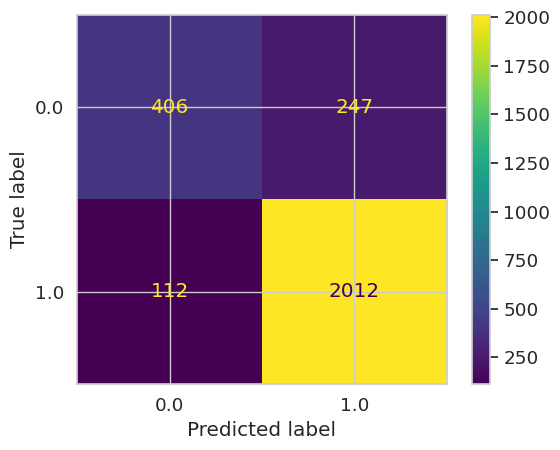

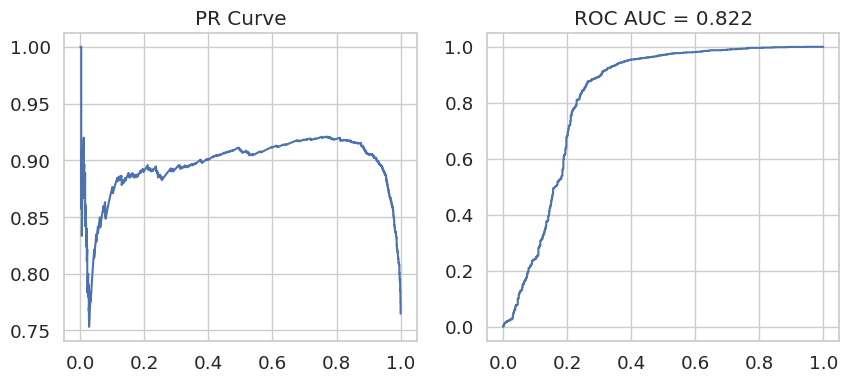

FFT-DWT model saved as fft_model.pkl


In [95]:
import random
import numpy as np
import pandas as pd
import pickle
from scipy.fft import fft
from pywt import wavedec
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import f1_score, classification_report, ConfusionMatrixDisplay, precision_recall_curve, roc_curve, auc
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm

# Fix seed
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

#  Data Preprocessor
class DataPreprocessorfft:
    def __init__(self, scale=True):
        self.scale = scale
        self.scaler = StandardScaler()
        self.le_class = LabelEncoder()
        self.le_vin = LabelEncoder()

    def preprocess(self, df, is_train=True):
        df = df.copy()
        df['class'] = df['class'].apply(lambda x: 'OK' if x == 'OK' else 'KO')
        if is_train:
            self.le_class.fit(df['class'])
            self.le_vin.fit(df['vin'])
        df['class_encoded'] = self.le_class.transform(df['class'])
        df['run_id'] = df.get('run_id', df['vin'])
        df['vin_encoded'] = self.le_vin.transform(df['vin'])
        df['date'] = pd.to_datetime(df['date'])
        df = df.sort_values('date').reset_index(drop=True)
        if self.scale:
            df[['Z', 'SpeedBody']] = (
                self.scaler.fit_transform(df[['Z', 'SpeedBody']])
                if is_train else self.scaler.transform(df[['Z', 'SpeedBody']])
            )
        return df

# Window Dataset
class WindowDataset(Dataset):
    def __init__(self, df, window=50, overlap=0.66):
        step = int(window * (1 - overlap))
        X, y = [], []

        for _, run in df.groupby('run_id'):
            run['class_encoded'] = run['class_encoded'].ffill()
            run['vin_encoded'] = run['vin_encoded'].ffill()
            run = run.dropna().reset_index()
            for i in range(0, len(run) - window + 1, step):
                w = run.iloc[i:i + window]
                if w['class_encoded'].nunique() > 1:
                    continue
                feats = []
                for col in ['Z', 'SpeedBody']:
                    arr = w[col].values.astype(float)
                    feats.append(arr)
                    feats.append(np.abs(fft(arr))[:window])
                    feats.append(wavedec(arr, 'haar', level=1)[0])
                    feats.append([arr.mean(), arr.std(), arr.max(), arr.min()])
                feats.append(np.full(1, w['vin_encoded'].iloc[window // 2]))
                X.append(np.concatenate(feats))
                y.append(int(w['class_encoded'].iloc[window // 2]))

        self.X = torch.tensor(np.stack(X), dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.float32)

    def __len__(self): return len(self.X)
    def __getitem__(self, idx): return self.X[idx], self.y[idx]

#  Model
class CNNGRU(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(1, 32, 3, padding=1), nn.BatchNorm1d(32), nn.ReLU(), nn.MaxPool1d(2),
            nn.Conv1d(32, 64, 3, padding=1), nn.BatchNorm1d(64), nn.ReLU(), nn.MaxPool1d(2),
            nn.Conv1d(64, 128, 3, padding=1), nn.BatchNorm1d(128), nn.ReLU(), nn.MaxPool1d(2)
        )
        self.rnn = nn.GRU(128, 128, batch_first=True)
        self.fc = nn.Sequential(
            nn.Linear(128, 64), nn.ReLU(), nn.Dropout(0.3), nn.Linear(64, 1)
        )

    def forward(self, x):
        x = x.unsqueeze(1)
        x = self.conv(x).permute(0, 2, 1)
        out, _ = self.rnn(x)
        last = out[:, -1, :]
        return self.fc(last).squeeze(-1)

# Loss
def weighted_loss(logits, targ, weights):
    pos_weight = torch.tensor([weights[0] / weights[1]], device=device)
    return F.binary_cross_entropy_with_logits(logits, targ, pos_weight=pos_weight)

# Training
def train(model, train_loader, val_loader):
    optimizer = optim.AdamW(model.parameters(), lr=5e-4, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.OneCycleLR(optimizer, max_lr=5e-4, steps_per_epoch=len(train_loader), epochs=15)
    scaler = torch.cuda.amp.GradScaler()
    best_f1 = 0
    patience = 4

    for epoch in range(1, 16):
        model.train()
        losses = []
        for xb, yb in tqdm(train_loader, desc=f"Epoch {epoch}"):
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            with torch.cuda.amp.autocast():
                loss = weighted_loss(model(xb), yb, weights)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()
            losses.append(loss.item())

        preds, truth = [], []
        model.eval()
        with torch.no_grad():
            for xb, yb in val_loader:
                xb = xb.to(device)
                out = torch.sigmoid(model(xb)).cpu().numpy()
                truth.extend(yb.numpy())
                preds.extend(out)

        bin_preds = (np.array(preds) >= 0.5).astype(int)
        f1 = f1_score(truth, bin_preds)
        print(f"Epoch {epoch} | TrainLoss {np.mean(losses):.4f} | Val F1 {f1:.4f}")
        if f1 > best_f1:
            best_f1 = f1
            torch.save(model.state_dict(), "best.pt")
            patience = 4
        else:
            patience -= 1
        if patience == 0:
            print("Early stopping")
            break

    model.load_state_dict(torch.load("best.pt"))

# Evaluation
def evaluate(model, loader):
    preds, truth = [], []
    model.eval()
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            out = torch.sigmoid(model(xb)).cpu().numpy()
            truth.extend(yb.numpy())
            preds.extend(out)

    bin_preds = (np.array(preds) >= 0.5).astype(int)
    print(classification_report(truth, bin_preds, digits=4))
    ConfusionMatrixDisplay.from_predictions(truth, bin_preds, values_format='d')
    plt.show()

    prec, rec, _ = precision_recall_curve(truth, preds)
    fpr, tpr, _ = roc_curve(truth, preds)
    plt.figure(figsize=(10, 4))
    plt.subplot(121)
    plt.plot(rec, prec)
    plt.title("PR Curve")
    plt.subplot(122)
    plt.plot(fpr, tpr)
    plt.title(f"ROC AUC = {auc(fpr, tpr):.3f}")
    plt.show()

# Row-Level Prediction
def predict_on_rows(model, df, preprocessor, window=50):
    model.eval()
    df = preprocessor.preprocess(df, is_train=False)
    dataset = WindowDataset(df, window=window, overlap=0.0)
    loader = DataLoader(dataset, batch_size=64)
    preds = []
    with torch.no_grad():
        for xb, _ in loader:
            xb = xb.to(device)
            out = torch.sigmoid(model(xb)).cpu().numpy()
            preds.extend(out)
    return preds

# Pipeline
pre = DataPreprocessorfft()
df_train = pre.preprocess(df, True)
df_test = pre.preprocess(test, False)

train_ds = WindowDataset(df_train)
val_ds = WindowDataset(df_train)
test_ds = WindowDataset(df_test)

train_loader = DataLoader(train_ds, batch_size=128, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=128)
test_loader = DataLoader(test_ds, batch_size=128)

weights = compute_class_weight('balanced', classes=np.unique(train_ds.y.numpy()), y=train_ds.y.numpy())
weights = torch.tensor(weights).to(device)

model = CNNGRU(train_ds.X.shape[1]).to(device)
print(model)

train(model, train_loader, val_loader)

print("\n Test Evaluation")
evaluate(model, test_loader)

# Save full model object for FFT-DWT
with open("fft_model.pkl", "wb") as f:
    pickle.dump(model, f)

print("FFT-DWT model saved as fft_model.pkl")



## Evaluation of models


 Evaluating rnn_model...

[Preprocessing] Starting preprocessing...
[Preprocessing] Dropped columns (if present): ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']
[Preprocessing] Fitting label encoders for training data...
[Preprocessing] Unique classes: ['KO' 'OK']
[Preprocessing] Encoded classes: [0 1]
[Preprocessing] Sorted data by 'date'.
[Preprocessing] Creating lag features for ['Z', 'SpeedBody'] with max_lag = 10...
[Preprocessing] Lag features created.
[Preprocessing] Dropped rows with missing values after lag creation.
[Preprocessing] Data shape after handling missing values: (126204, 34)
[Preprocessing] Final feature columns: ['SpeedBody', 'SpeedBody_diff', 'SpeedBody_lag0', 'SpeedBody_lag1', 'SpeedBody_lag10', 'SpeedBody_lag2', 'SpeedBody_lag3', 'SpeedBody_lag4', 'SpeedBody_lag5', 'SpeedBody_lag6', 'SpeedBody_lag7', 'SpeedBody_lag8', 'SpeedBody_lag9', 'SpeedBody_roll_mean', 'Z', 'Z_diff', 'Z_lag0', 'Z_lag1', 'Z_lag10', 'Z_lag2', 'Z_lag3', 'Z_lag4', 'Z_lag5', 'Z_la

,Model,Accuracy,F1 Score,Precision,Recall,Precision_OK (1),Precision_KO (0),Recall_OK (1),Recall_KO (0),ROC AUC,PR AUC
5,fft_model,0.870724,0.918093,0.890660,0.947269,0.890660,0.783784,0.947269,0.621746,0.822317,0.895571
3,hybrid_model,0.812532,0.870536,0.870576,0.870495,0.870576,0.660286,0.870495,0.660448,0.843264,0.922226
0,rnn_model,0.802253,0.866997,0.845009,0.890159,0.845009,0.664805,0.890159,0.571604,0.789400,0.893022
1,cnn_model,0.792093,0.864213,0.819759,0.913765,0.819759,0.676354,0.913765,0.472848,0.790649,0.897062
2,cnn_dnn_model,0.788508,0.858168,0.834086,0.883682,0.834086,0.638386,0.883682,0.538788,0.791512,0.897186
4,hybrid_model_more_features,0.787268,0.846701,0.885231,0.811385,0.885231,0.593979,0.811385,0.723987,0.826780,0.903194


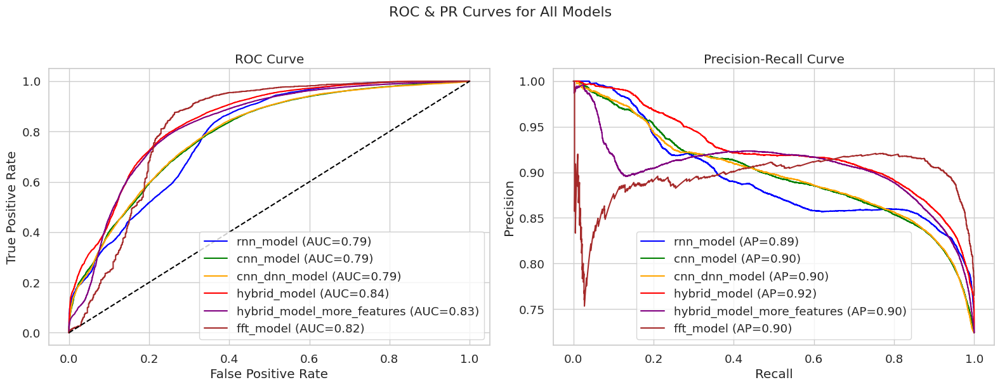

<Figure size 1200x600 with 0 Axes>

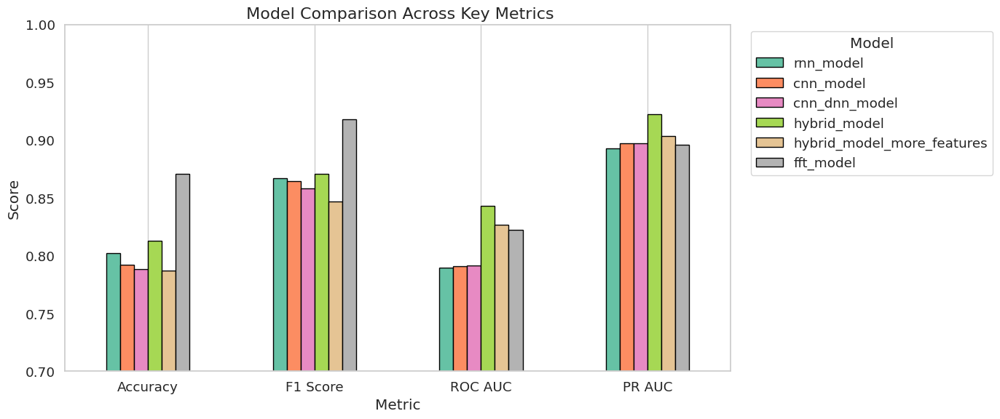

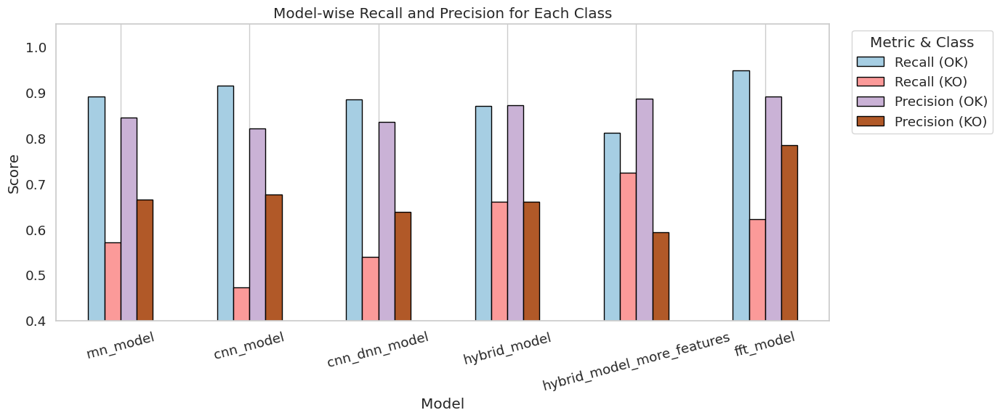

In [67]:
# Core
import os
import pickle
import numpy as np
import pandas as pd

# PyTorch
import torch
import torch.nn as nn
from torch.utils.data import DataLoader

# Sklearn metrics
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, average_precision_score, roc_curve, precision_recall_curve
)

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns

# PyTorch device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# List of model names using lowercase filenames
model_names = ["rnn_model", "cnn_model", "cnn_dnn_model", "hybrid_model", "hybrid_model_more_features", "fft_model"]

# Create model_paths assuming lowercase filenames
model_paths = {
    name: os.path.join(os.getcwd(), f"{name.lower()}.pkl") for name in model_names
}

# Define model input groups
standard_models = ["rnn_model", "cnn_model", "cnn_dnn_model", "hybrid_model"]
enhanced_models = ["hybrid_model_more_features"]
fft_model = "fft_model"

# Colors for plots
colors = {
    "rnn_model": "blue",
    "cnn_model": "green",
    "cnn_dnn_model": "orange",
    "hybrid_model": "red",
    "hybrid_model_more_features": "purple",
    "fft_model": "brown"
}

# Function to chunk long sequences
def chunk_sequence(seq, label_seq, chunk_size=5000):
    sub_sequences, sub_labels, sub_lengths = [], [], []
    n = len(seq)
    for start in range(0, n, chunk_size):
        end = min(start + chunk_size, n)
        sub_sequences.append(seq[start:end])
        sub_labels.append(label_seq[start:end])
        sub_lengths.append(end - start)
    return sub_sequences, sub_labels, sub_lengths

# FFT-specific prep
def prepare_fft_dataset(df_test):
    fft_pre = DataPreprocessorfft(scale=True)
    df_test_processed = fft_pre.preprocess(df_test, is_train=False)
    return WindowDataset(df_test_processed)

# Evaluation logic
from sklearn.metrics import precision_score, recall_score

from sklearn.metrics import precision_score, recall_score

def evaluate_model(name, model, dataset, is_segment=False):
    loader = DataLoader(
        dataset,
        batch_size=128 if is_segment else 4,
        shuffle=False if is_segment else True,
        collate_fn=None if is_segment else collate_fn
    )

    model.eval()
    all_probs, all_labels = [], []
    needs_lengths = ["rnn_model", "hybrid_model", "hybrid_model_more_features"]
    with torch.no_grad():
        for batch in loader:
            if is_segment:
                xb, yb = batch
                xb, yb = xb.to(device), yb.to(device)
                out = torch.sigmoid(model(xb)).cpu().numpy()
                all_probs.extend(out)
                all_labels.extend(yb.cpu().numpy())
            else:
                xb, lengths, yb = [b.to(device) for b in batch]
                
                if name in needs_lengths:
                    out = model(xb, lengths)
                else:
                    out = model(xb)
        
                mask = torch.arange(out.size(1), device=device)[None, :] < lengths[:, None]
                all_probs.append(out[mask].cpu())
                all_labels.append(yb[mask].float().cpu())

    y_probs = np.concatenate(all_probs) if not is_segment else np.array(all_probs)
    y_true = np.concatenate(all_labels) if not is_segment else np.array(all_labels)
    y_pred = (y_probs >= 0.5).astype(int)  #  threshold fixed at 0.5

    # Safe metric calc
    def safe_metric(y_true, y_pred, metric, pos_label):
        try:
            return metric(y_true, y_pred, pos_label=pos_label)
        except:
            return np.nan

    return {
        "Model": name,
        "Accuracy": accuracy_score(y_true, y_pred),
        "F1 Score": f1_score(y_true, y_pred),
        "Precision": precision_score(y_true, y_pred),
        "Recall": recall_score(y_true, y_pred),
        "Precision_OK (1)": safe_metric(y_true, y_pred, precision_score, 1),
        "Precision_KO (0)": safe_metric(y_true, y_pred, precision_score, 0),
        "Recall_OK (1)": safe_metric(y_true, y_pred, recall_score, 1),
        "Recall_KO (0)": safe_metric(y_true, y_pred, recall_score, 0),
        "ROC AUC": roc_auc_score(y_true, y_probs),
        "PR AUC": average_precision_score(y_true, y_probs),
        "y_true": y_true,
        "y_probs": y_probs
    }



results = []
sequence_creator = SequenceCreator()


for name, path in model_paths.items():
    print(f"\n Evaluating {name}...")

    with open(path, 'rb') as f:
        model = pickle.load(f)
    model.to(device)

    # Pick preprocessor type
    if name == "fft_model":
        preprocessor = DataPreprocessorfft(scale=True)
    elif name == "hybrid_model_more_features":
        preprocessor = DataPreprocessorEnhanced(scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'])
    else:
        preprocessor = DataPreprocessor(scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'])

    # Safely preprocess based on preprocessor type
    if name == "fft_model":
        df_train_processed = preprocessor.preprocess(df, is_train=True)
        feature_cols = None  # Not used for FFT
    else:
        df_train_processed, feature_cols = preprocessor.preprocess(df, is_train=True)


    # preprocess test data
    if name == "fft_model":
        df_test_processed = preprocessor.preprocess(test, is_train=False)
        test_ds = WindowDataset(df_test_processed)
        metrics = evaluate_model(name, model, test_ds, is_segment=True)
    else:
        df_test_processed, _ = preprocessor.preprocess(test, is_train=False)

        test_seqs, test_lens, test_labels, _ = sequence_creator.create_sequences(df_test_processed, feature_cols, group_col='run_id', return_group_ids=True)
        chunked_seqs, chunked_labels, chunked_lens = [], [], []
        for s, l, lab in zip(test_seqs, test_lens, test_labels):
            if l > 5000:
                sub_s, sub_l, sub_len = chunk_sequence(s, lab, 5000)
                chunked_seqs += sub_s
                chunked_labels += sub_l
                chunked_lens += sub_len
            else:
                chunked_seqs.append(s)
                chunked_labels.append(lab)
                chunked_lens.append(l)

        test_ds = RunSequenceDataset(chunked_seqs, chunked_lens, chunked_labels)
        metrics = evaluate_model(name, model, test_ds, is_segment=False)

    results.append(metrics)


# Display leaderboard
df_results = pd.DataFrame([{k: v for k, v in m.items() if k not in ["y_true", "y_probs"]} for m in results])
display(df_results.sort_values("F1 Score", ascending=False))

# Apply a theme
sns.set(style="whitegrid", font_scale=1.2)


#Improved ROC and PR Plots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# ROC
for r in results:
    fpr, tpr, _ = roc_curve(r["y_true"], r["y_probs"])
    axes[0].plot(fpr, tpr, label=f"{r['Model']} (AUC={r['ROC AUC']:.2f})", color=colors[r["Model"]])
axes[0].plot([0, 1], [0, 1], linestyle="--", color="black")
axes[0].set_title("ROC Curve")
axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].legend()
axes[0].grid(True)

# PR
for r in results:
    prec, rec, _ = precision_recall_curve(r["y_true"], r["y_probs"])
    axes[1].plot(rec, prec, label=f"{r['Model']} (AP={r['PR AUC']:.2f})", color=colors[r["Model"]])
axes[1].set_title("Precision-Recall Curve")
axes[1].set_xlabel("Recall")
axes[1].set_ylabel("Precision")
axes[1].legend()
axes[1].grid(True)

plt.suptitle("ROC & PR Curves for All Models", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

# Enhanced Vertical Bar Plot
plt.figure(figsize=(12, 6))

# Limit to top metrics only
plot_metrics = ["Accuracy", "F1 Score", "ROC AUC", "PR AUC"]
df_plot = df_results[["Model"] + plot_metrics].set_index("Model")

# Transpose and plot
df_plot.T.plot(kind="bar", figsize=(14, 6), colormap="Set2", edgecolor="black")
plt.ylim(0.7, 1.0)
plt.ylabel("Score")
plt.xlabel("Metric")
plt.title(" Model Comparison Across Key Metrics", fontsize=16)
plt.xticks(rotation=0)
plt.legend(title="Model", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.grid(axis="y")


plt.tight_layout()
plt.show()

# Recall & Precision Comparison per Class
df_metrics = df_results.set_index("Model")[[
    "Recall_OK (1)", "Recall_KO (0)",
    "Precision_OK (1)", "Precision_KO (0)"
]]

# Drop models with NaN to avoid plot errors
df_metrics = df_metrics.dropna()

# Rename for clarity
df_metrics.columns = ["Recall (OK)", "Recall (KO)", "Precision (OK)", "Precision (KO)"]

# Plot grouped bars
df_metrics.plot(kind="bar", figsize=(14, 6), colormap="Paired", edgecolor="black")
plt.title("Model-wise Recall and Precision for Each Class")
plt.ylabel("Score")
plt.ylim(0.4, 1.05)
plt.grid(axis="y")
plt.xticks(rotation=15)
plt.legend(title="Metric & Class", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()


### Model Explainability Toolkit for Sequential Deep Learning Models

In [128]:
import plotly.express as px
import pandas as pd

# Step 1: Get predictions and true labels
hybrid_metrics = next(r for r in results if r["Model"] == "hybrid_model")
y_true = hybrid_metrics["y_true"]
y_pred = (hybrid_metrics["y_probs"] >= 0.5).astype(int)

# Step 2: Match coordinates (ensure alignment)
lat_lon = df_test[["Latitude", "Longitude"]].reset_index(drop=True)
lat_lon = lat_lon.iloc[:len(y_true)]

# Step 3: Combine into DataFrame
df_plot = lat_lon.copy()
df_plot["True"] = y_true
df_plot["Predicted"] = y_pred

# Step 4: Assign classification outcome as text label
def classify_label(row):
    if row["True"] == 1 and row["Predicted"] == 1:
        return "True Positive"
    elif row["True"] == 0 and row["Predicted"] == 0:
        return "True Negative"
    elif row["True"] == 1 and row["Predicted"] == 0:
        return "False Negative"
    else:
        return "False Positive"

df_plot["Outcome"] = df_plot.apply(classify_label, axis=1)

# Step 5: Define consistent color mapping
color_map = {
    "True Positive": "green",
    "True Negative": "blue",
    "False Negative": "red",
    "False Positive": "orange"
}

# Step 6: Plot with meaningful legend
fig = px.scatter_mapbox(
    df_plot,
    lat="Latitude",
    lon="Longitude",
    color="Outcome",  # Use Outcome for legend
    color_discrete_map=color_map,
    hover_data=["True", "Predicted"],
    zoom=10,
    mapbox_style="carto-positron",
    title="Prediction Outcome Map - Hybrid Model"
)

fig.update_layout(height=600)
fig.show()


In [125]:

class ModelExplainability:
    def __init__(self, model, device):
        self.model = model.to(device)
        self.device = device

    def global_feature_importance(self, dataloader, feature_names, use_lengths=False, fft_model=False):
        self.model.train()
        gradients = []
    
        for batch in dataloader:
            self.model.zero_grad()

    
            if fft_model:
                xb = batch[0].to(self.device)              # [1, seq_len, features] → [1, 58858, 28]
                xb = xb.permute(0, 2, 1).contiguous()      # [1, 28, 58858]
                
                # Convert to shape [batch_size * features, 1, seq_len] so Conv1D can work
                xb = xb.view(-1, 1, xb.shape[2])           # [28, 1, 58858]
                xb.requires_grad_()
                xb.squeeze(1)
                output = self.model(xb).mean()             # Forward pass
                output.backward(retain_graph=True)
            
                # Reshape gradients back to [features, seq_len] and average over time
                grad = xb.grad.view(-1, xb.shape[2]).abs().mean(dim=1)  # [28]
                gradients.append(grad.cpu().numpy())

            elif use_lengths:
                xb, lengths, _ = [b.to(self.device) for b in batch]
                xb.requires_grad_()
                output = self.model(xb, lengths).mean()
            else:
                xb, _, _ = [b.to(self.device) for b in batch]
                xb.requires_grad_()
                output = self.model(xb).mean()
    
            output.backward()
            grad = xb.grad.abs().mean(dim=1).mean(dim=0)  # [features]
            gradients.append(grad.cpu().numpy())
    
        self.model.eval()
        avg_grad = np.mean(gradients, axis=0)
    
        return pd.DataFrame({
            "Feature": feature_names,
            "Importance": avg_grad
        }).sort_values("Importance", ascending=True)



def compute_feature_importance(model_path, model_name, df_train, df_test, device):
    import pickle
    import matplotlib.pyplot as plt

    with open(model_path, "rb") as f:
        model = pickle.load(f)
    model.to(device)

    # Preprocessing
    pre_cls = DataPreprocessorEnhanced if "More" in model_name else DataPreprocessor
    pre = pre_cls(scale=True, max_lag=10, lag_columns=['Z', 'SpeedBody'])
    df_train_processed, feature_cols = pre.preprocess(df_train, is_train=True)
    df_test_processed, _ = pre.preprocess(df_test, is_train=False)

    feature_names = feature_cols
    seq_creator = SequenceCreator()
    test_seqs, test_lens, test_labels, _ = seq_creator.create_sequences(df_test_processed, feature_cols, group_col='run_id', return_group_ids=True)

    test_ds = RunSequenceDataset(test_seqs, test_lens, test_labels)
    test_loader = DataLoader(test_ds, batch_size=4, shuffle=False, collate_fn=collate_fn)

    explainer = ModelExplainability(model, device)
    use_lengths = "rnn" in model_name.lower() or "hybrid" in model_name.lower()
    importance_df = explainer.global_feature_importance(
    test_loader,
    feature_names,
    use_lengths=use_lengths,
    fft_model=("fft" in model_name.lower())
)

    plt.figure(figsize=(10, 8))
    plt.barh(importance_df["Feature"], importance_df["Importance"], color="teal")
    plt.xlabel("Mean Absolute Gradient")
    plt.title(f"Global Feature Importance - {model_name}")
    plt.tight_layout()
    plt.show()

    return importance_df




[Preprocessing] Starting preprocessing...
[Preprocessing] Dropped columns (if present): ['run_num', 'time_diff', 'model', 'Latitude', 'Longitude']
[Preprocessing] Fitting label encoders for training data...
[Preprocessing] Unique classes: ['KO' 'OK']
[Preprocessing] Encoded classes: [0 1]
[Preprocessing] Sorted data by 'date'.
[Preprocessing] Creating lag features for ['Z', 'SpeedBody'] with max_lag = 10...
[Preprocessing] Lag features created.
[Preprocessing] Dropped rows with missing values after lag creation.
[Preprocessing] Data shape after handling missing values: (126204, 34)
[Preprocessing] Final feature columns: ['SpeedBody', 'SpeedBody_diff', 'SpeedBody_lag0', 'SpeedBody_lag1', 'SpeedBody_lag10', 'SpeedBody_lag2', 'SpeedBody_lag3', 'SpeedBody_lag4', 'SpeedBody_lag5', 'SpeedBody_lag6', 'SpeedBody_lag7', 'SpeedBody_lag8', 'SpeedBody_lag9', 'SpeedBody_roll_mean', 'Z', 'Z_diff', 'Z_lag0', 'Z_lag1', 'Z_lag10', 'Z_lag2', 'Z_lag3', 'Z_lag4', 'Z_lag5', 'Z_lag6', 'Z_lag7', 'Z_lag8', '

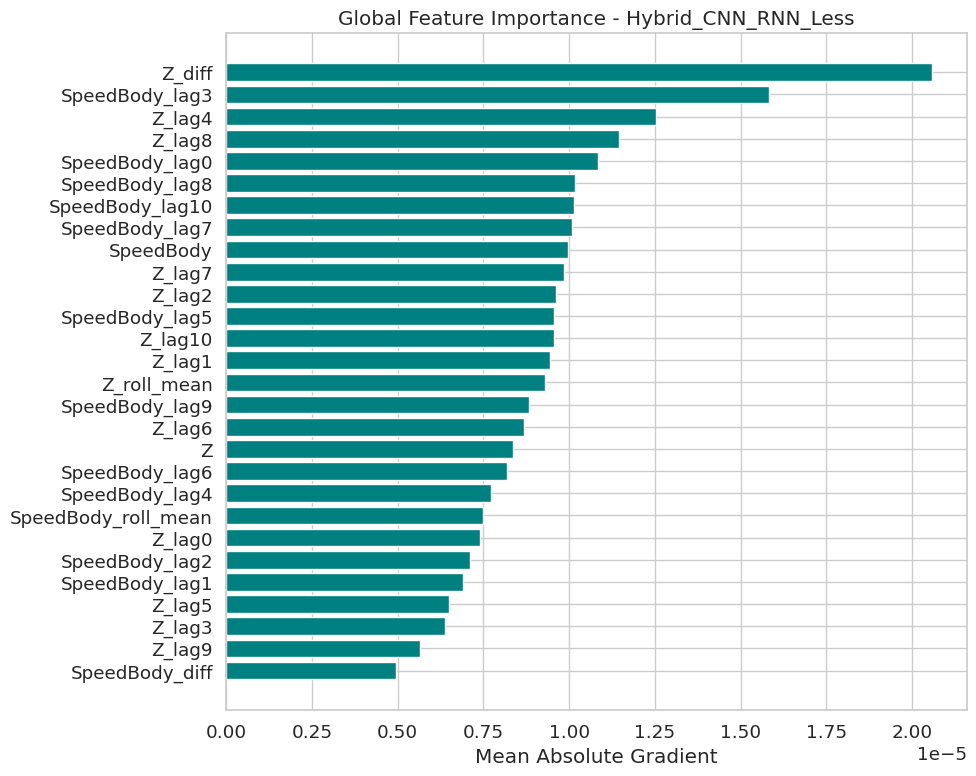

In [111]:
importance_df = compute_feature_importance(
    model_path="hybrid_model.pkl",
    model_name="Hybrid_CNN_RNN_Less",
    df_train=df,
    df_test=test,
    device="cuda"
)


 Failed to load RNN: [Errno 2] No such file or directory: '/kaggle/working/rnn_model].pkl'

 Model Summary:

                 Model                     Class  Total Params  \
0                  CNN           CNN1DClassifier         21697   
1              CNN_DNN       CNN1D_DNNClassifier         30081   
2  Hybrid_CNN_RNN_Less  ImprovedCNNRNNClassifier         68545   
3  Hybrid_CNN_RNN_More  ImprovedCNNRNNClassifier         69505   
4              FFT_DWT                    CNNGRU        138881   

   Trainable Params  Frozen Params  Size (MB)  
0             21697              0       0.08  
1             30081              0       0.11  
2             68545              0       0.26  
3             69505              0       0.27  
4            138881              0       0.53  


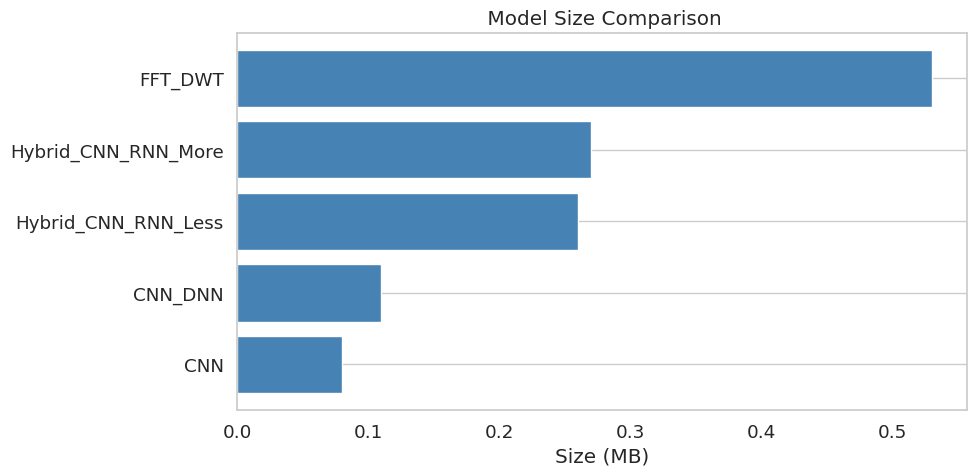

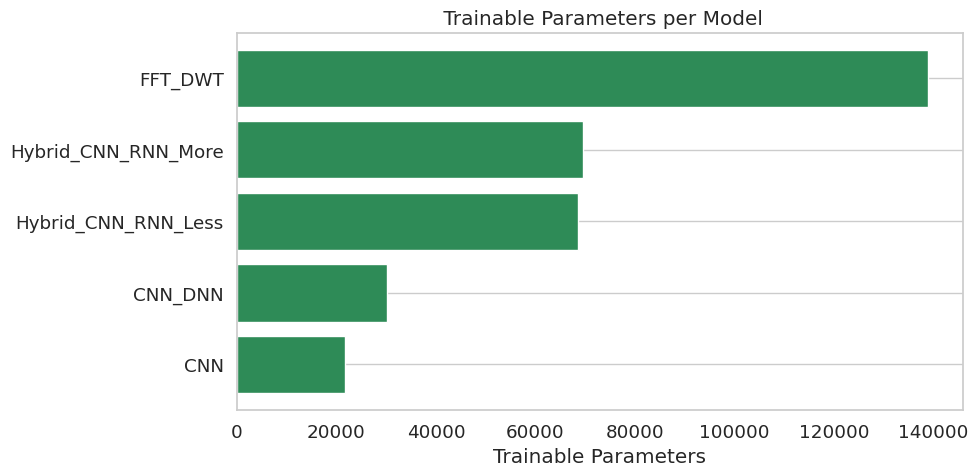

In [102]:
import os
import torch
import pickle
import pandas as pd
import matplotlib.pyplot as plt

# Define model paths
model_paths = {
    "RNN": "/kaggle/working/rnn_model].pkl",
    "CNN": "/kaggle/working/cnn_model.pkl",
    "CNN_DNN": "/kaggle/working/cnn_dnn_model.pkl",
    "Hybrid_CNN_RNN_Less": "/kaggle/working/hybrid_model.pkl",
    "Hybrid_CNN_RNN_More": "/kaggle/working/hybrid_model_more_features.pkl",
    "FFT_DWT": "/kaggle/working/fft_model.pkl"
}

# Summarize a single model
def summarize_model(model, name):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    size_mb = total_params * 4 / (1024 ** 2)  # float32
    return {
        "Model": name,
        "Class": model.__class__.__name__,
        "Total Params": total_params,
        "Trainable Params": trainable_params,
        "Frozen Params": total_params - trainable_params,
        "Size (MB)": round(size_mb, 2)
    }

# Load and summarize all models
model_summaries = []

for name, path in model_paths.items():
    try:
        with open(path, "rb") as f:
            model = pickle.load(f)
        summary = summarize_model(model, name)
        model_summaries.append(summary)
    except Exception as e:
        print(f" Failed to load {name}: {e}")

# Create DF
df_summary = pd.DataFrame(model_summaries)
print("\n Model Summary:\n")
print(df_summary)

# Plot: Model Size
plt.figure(figsize=(10, 5))
df_sorted = df_summary.sort_values("Size (MB)", ascending=True)
plt.barh(df_sorted["Model"], df_sorted["Size (MB)"], color="steelblue")
plt.xlabel("Size (MB)")
plt.title(" Model Size Comparison")
plt.grid(axis="x")
plt.tight_layout()
plt.show()

# Plot: Trainable Parameters
plt.figure(figsize=(10, 5))
df_sorted = df_summary.sort_values("Trainable Params", ascending=True)
plt.barh(df_sorted["Model"], df_sorted["Trainable Params"], color="seagreen")
plt.xlabel("Trainable Parameters")
plt.title(" Trainable Parameters per Model")
plt.grid(axis="x")
plt.tight_layout()
plt.show()
